## RandAugmentation_simple
- baseline code가 존재하는 디렉토리에 해당 노트북을 다운받아 실행해주시기바랍니다.

In [1]:
import torch
import os
import sys
import yaml
from torchvision import transforms
from torchvision.datasets import CIFAR10
from torch.utils.data import DataLoader, random_split
from typing import Tuple
from tqdm import tqdm
import matplotlib.pyplot as plt
import numpy as np

if "./" not in sys.path:
    sys.path.append("./")

In [2]:
from src.model import Model
from src.trainer import TorchTrainer
from src.loss import CustomCriterion

In [3]:
MEAN_V = (0.4914, 0.4822, 0.4465)
STD_V = (0.2470, 0.2435, 0.2616)

DATASET_DIR = "./input/cifar10"

In [4]:
def generate_transform(resize: int = 32, aug_fcns: Tuple = ()) -> transforms.transforms.Compose:
    """Generate train augmentation policy."""
    transform_fcns = []
    transform_fcns.append(transforms.Resize((resize, resize)))
    transform_fcns += list(aug_fcns)
    
    transform_fcns.append(transforms.ToTensor())
    transform_fcns.append(transforms.Normalize(MEAN_V, STD_V))
    
    return transforms.Compose(transform_fcns)
    

In [5]:
def load_cifar10(img_size: int = 32, 
                 aug_fcns: Tuple = (), 
                 validation_ratio: float = 0.8,
                ) -> Tuple[CIFAR10, CIFAR10, CIFAR10]:
    tf_train = generate_transform(resize=img_size, aug_fcns=aug_fcns)
    tf_test = generate_transform(resize=img_size)
    
    train_dataset = CIFAR10(root=DATASET_DIR, train=True, download=True, transform=tf_train)
    train_length = int(len(train_dataset) * validation_ratio)
    val_length = len(train_dataset) - train_length

    train_dataset, val_dataset = random_split(train_dataset, [train_length, val_length])
    test_dataset = CIFAR10(root=DATASET_DIR, train=False, download=True, transform=tf_test)
    
    return train_dataset, val_dataset, test_dataset
    

In [6]:
def tensor_to_img(tensor_img: torch.Tensor) -> np.ndarray:
    return ((tensor_img.permute(1, 2, 0).numpy() * STD_V + MEAN_V) * 255).astype(np.uint8)

def visualize_datasets(_train_dataset: CIFAR10, _val_dataset: CIFAR10, _test_dataset: CIFAR10, title_prefix: str = "") -> None:
    fig, ax = plt.subplots(3, 7, figsize=(20, 10))

    for i in range(7):
        idx = np.random.randint(0, len(_val_dataset))

        ax[0][i].imshow(tensor_to_img(_train_dataset[idx][0]))
        ax[1][i].imshow(tensor_to_img(_val_dataset[idx][0]))
        ax[2][i].imshow(tensor_to_img(_test_dataset[idx][0]))

        ax[0][i].axis('off')
        ax[1][i].axis('off')
        ax[2][i].axis('off')

    fig.suptitle(f"{title_prefix} Visualization of Augmentation.\n(Each row represents train, validation, test dataset accordingly)")
    fig.show()

In [10]:
import optuna
import yaml

In [11]:
EPOCHS = 10
BATCH_SIZE = 256
    
def objective(trial: optuna.Trial) -> float:
    img_size = 32

    augmentation_functions = []
    use_color_jitter = trial.suggest_categorical("aug_color_jitter", [True, False])
    use_random_perspective = trial.suggest_categorical("aug_random_perspective", [True, False])
    use_random_flip = trial.suggest_categorical("aug_random_flip", [True, False])
    
    if use_color_jitter:
        augmentation_functions.append(transforms.ColorJitter(brightness=(0.5, 1.5), 
                                                             contrast=(0.5, 1.5), 
                                                             saturation=(0.5, 1.5)))
    if use_random_perspective:
        augmentation_functions.append(transforms.RandomPerspective())
    
    if use_random_flip:
        augmentation_functions.append(transforms.RandomHorizontalFlip())
    
        
    train_dataset, val_dataset, test_dataset = load_cifar10(img_size=img_size, 
                                                            aug_fcns = tuple(augmentation_functions), 
                                                            validation_ratio=0.8)
    
    visualize_datasets(train_dataset, val_dataset, test_dataset, title_prefix=f"Trial {trial.number:03d} //")
    plt.draw()
    plt.show()
    print(augmentation_functions)
    
    with open("./configs/model/mobilenetv3.yaml", "r") as f:
        model_cfg = yaml.load(f, yaml.SafeLoader)

    model_cfg['backbone'][-1][-1] = [10]

    model = Model(model_cfg, verbose=True)

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    model = model.to(device)

    optimizer = torch.optim.SGD(model.model.parameters(), lr=0.1, momentum=0.9)
    scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer=optimizer, max_lr=0.1, steps_per_epoch=len(train_dataset), epochs=EPOCHS, pct_start=0.05)
    criterion = CustomCriterion(samples_per_cls=None, device=device)

    train_loader = DataLoader(dataset=train_dataset, 
                              pin_memory=torch.cuda.is_available(), 
                              shuffle=True, 
                              batch_size=BATCH_SIZE, 
                              num_workers=4, 
                              drop_last=True)
    val_loader = DataLoader(dataset=val_dataset, 
                            pin_memory=torch.cuda.is_available(), 
                            shuffle=False, 
                            batch_size=BATCH_SIZE, 
                            num_workers=4)
    test_loader = DataLoader(dataset=test_dataset, 
                             pin_memory=torch.cuda.is_available(), 
                             shuffle=False, 
                             batch_size=BATCH_SIZE, 
                             num_workers=4)

    exp_dir = "./exp/autoaug"
    os.makedirs(exp_dir, exist_ok=True)
    trainer = TorchTrainer(model=model, 
                           criterion=criterion, 
                           optimizer=optimizer, 
                           scheduler=scheduler, 
                           device=device, 
                           verbose=1, 
                           model_path=os.path.join(exp_dir, "best.pt"))

    best_acc, best_f1 = trainer.train(train_dataloader=train_loader, 
                                      n_epoch=EPOCHS, 
                                      val_dataloader=val_loader)
    print("TEST DATASET")
    test_loss, test_f1, test_accuracy = trainer.test(model, test_loader)
    
    return test_f1

[I 2021-11-22 04:25:23,504] A new study created in memory with name: autoaug


Files already downloaded and verified
Files already downloaded and verified


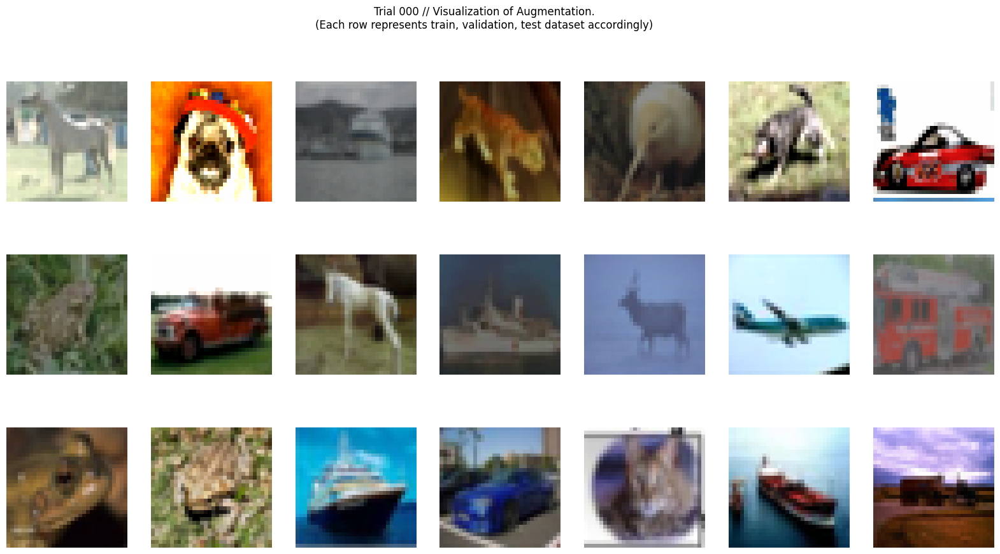

[ColorJitter(brightness=(0.5, 1.5), contrast=(0.5, 1.5), saturation=(0.5, 1.5), hue=None), RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     

Train: [001] Loss: 2.065, Acc: 23.19% F1(macro): 0.23: 100%|██████████| 156/156 [00:10<00:00, 14.81it/s]
 Val:       Loss: 1.830, Acc: 33.89% F1(macro): 0.33: 100%|██████████| 40/40 [00:02<00:00, 18.86it/s]


Model saved. Current best test f1: 0.327


Train: [002] Loss: 1.669, Acc: 39.10% F1(macro): 0.39: 100%|██████████| 156/156 [00:10<00:00, 14.63it/s]
 Val:       Loss: 1.609, Acc: 41.54% F1(macro): 0.41: 100%|██████████| 40/40 [00:02<00:00, 17.04it/s]


Model saved. Current best test f1: 0.414


Train: [003] Loss: 1.505, Acc: 45.13% F1(macro): 0.45: 100%|██████████| 156/156 [00:10<00:00, 14.95it/s]
 Val:       Loss: 1.473, Acc: 46.32% F1(macro): 0.46: 100%|██████████| 40/40 [00:01<00:00, 20.29it/s]


Model saved. Current best test f1: 0.457


Train: [004] Loss: 1.411, Acc: 48.78% F1(macro): 0.48: 100%|██████████| 156/156 [00:10<00:00, 14.80it/s]
 Val:       Loss: 1.418, Acc: 48.73% F1(macro): 0.48: 100%|██████████| 40/40 [00:01<00:00, 21.44it/s]


Model saved. Current best test f1: 0.479


Train: [005] Loss: 1.327, Acc: 52.18% F1(macro): 0.52: 100%|██████████| 156/156 [00:10<00:00, 15.00it/s]
 Val:       Loss: 1.357, Acc: 51.61% F1(macro): 0.51: 100%|██████████| 40/40 [00:02<00:00, 18.01it/s]


Model saved. Current best test f1: 0.512


Train: [006] Loss: 1.255, Acc: 54.70% F1(macro): 0.54: 100%|██████████| 156/156 [00:11<00:00, 13.86it/s]
 Val:       Loss: 1.254, Acc: 55.33% F1(macro): 0.55: 100%|██████████| 40/40 [00:01<00:00, 21.23it/s]


Model saved. Current best test f1: 0.550


Train: [007] Loss: 1.193, Acc: 57.17% F1(macro): 0.57: 100%|██████████| 156/156 [00:11<00:00, 14.16it/s]
 Val:       Loss: 1.213, Acc: 56.90% F1(macro): 0.56: 100%|██████████| 40/40 [00:02<00:00, 18.46it/s]


Model saved. Current best test f1: 0.565


Train: [008] Loss: 1.141, Acc: 59.26% F1(macro): 0.59: 100%|██████████| 156/156 [00:10<00:00, 14.43it/s]
 Val:       Loss: 1.181, Acc: 57.97% F1(macro): 0.58: 100%|██████████| 40/40 [00:01<00:00, 21.26it/s]


Model saved. Current best test f1: 0.576


Train: [009] Loss: 1.090, Acc: 61.28% F1(macro): 0.61: 100%|██████████| 156/156 [00:10<00:00, 15.29it/s]
 Val:       Loss: 1.131, Acc: 59.71% F1(macro): 0.60: 100%|██████████| 40/40 [00:01<00:00, 20.57it/s]


Model saved. Current best test f1: 0.597


Train: [010] Loss: 1.042, Acc: 63.12% F1(macro): 0.63: 100%|██████████| 156/156 [00:10<00:00, 15.28it/s]
 Val:       Loss: 1.089, Acc: 61.66% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 21.30it/s]


Model saved. Current best test f1: 0.613
TEST DATASET


 Val:       Loss: 1.034, Acc: 63.42% F1(macro): 0.63: 100%|██████████| 40/40 [00:01<00:00, 39.47it/s]
[I 2021-11-22 04:27:49,972] Trial 0 finished with value: 0.6301687075642395 and parameters: {'aug_color_jitter': True, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 0 with value: 0.6301687075642395.


Files already downloaded and verified
Files already downloaded and verified


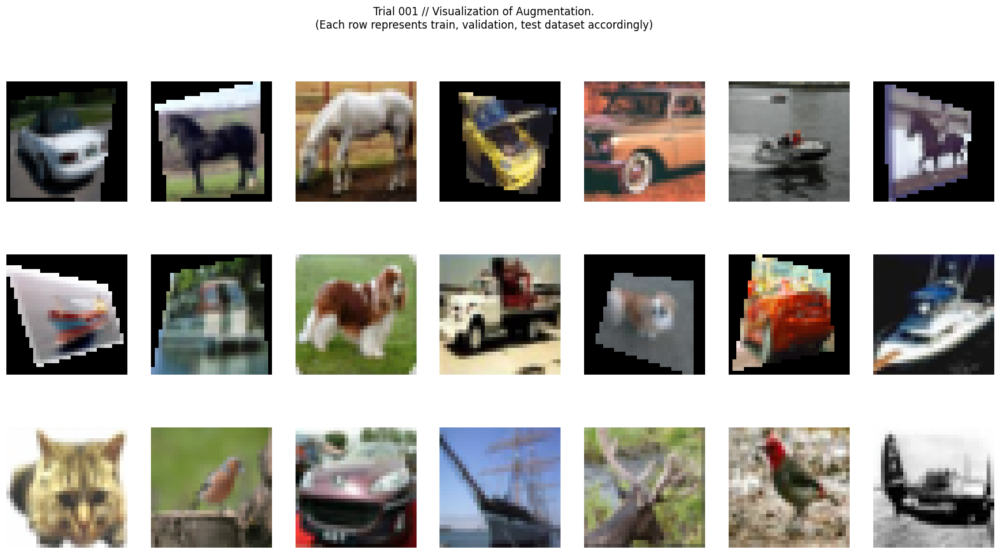

[RandomPerspective(p=0.5), RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           4

Train: [001] Loss: 2.036, Acc: 23.96% F1(macro): 0.23: 100%|██████████| 156/156 [00:10<00:00, 15.38it/s]
 Val:       Loss: 1.879, Acc: 32.61% F1(macro): 0.31: 100%|██████████| 40/40 [00:01<00:00, 24.04it/s]


Model saved. Current best test f1: 0.312


Train: [002] Loss: 1.684, Acc: 37.54% F1(macro): 0.37: 100%|██████████| 156/156 [00:09<00:00, 15.65it/s]
 Val:       Loss: 1.648, Acc: 40.44% F1(macro): 0.40: 100%|██████████| 40/40 [00:01<00:00, 24.53it/s]


Model saved. Current best test f1: 0.402


Train: [003] Loss: 1.559, Acc: 42.97% F1(macro): 0.42: 100%|██████████| 156/156 [00:10<00:00, 15.51it/s]
 Val:       Loss: 1.531, Acc: 43.96% F1(macro): 0.43: 100%|██████████| 40/40 [00:01<00:00, 23.59it/s]


Model saved. Current best test f1: 0.434


Train: [004] Loss: 1.474, Acc: 46.27% F1(macro): 0.46: 100%|██████████| 156/156 [00:10<00:00, 15.49it/s]
 Val:       Loss: 1.489, Acc: 45.75% F1(macro): 0.44: 100%|██████████| 40/40 [00:01<00:00, 25.59it/s]


Model saved. Current best test f1: 0.444


Train: [005] Loss: 1.426, Acc: 47.99% F1(macro): 0.48: 100%|██████████| 156/156 [00:10<00:00, 15.46it/s]
 Val:       Loss: 1.406, Acc: 48.30% F1(macro): 0.48: 100%|██████████| 40/40 [00:01<00:00, 24.81it/s]


Model saved. Current best test f1: 0.478


Train: [006] Loss: 1.382, Acc: 49.83% F1(macro): 0.49: 100%|██████████| 156/156 [00:10<00:00, 15.58it/s]
 Val:       Loss: 1.384, Acc: 49.69% F1(macro): 0.50: 100%|██████████| 40/40 [00:01<00:00, 24.15it/s]


Model saved. Current best test f1: 0.497


Train: [007] Loss: 1.335, Acc: 51.62% F1(macro): 0.51: 100%|██████████| 156/156 [00:10<00:00, 15.31it/s]
 Val:       Loss: 1.338, Acc: 52.04% F1(macro): 0.51: 100%|██████████| 40/40 [00:01<00:00, 25.22it/s]


Model saved. Current best test f1: 0.515


Train: [008] Loss: 1.291, Acc: 53.22% F1(macro): 0.53: 100%|██████████| 156/156 [00:10<00:00, 15.56it/s]
 Val:       Loss: 1.302, Acc: 53.46% F1(macro): 0.53: 100%|██████████| 40/40 [00:01<00:00, 24.36it/s]


Model saved. Current best test f1: 0.533


Train: [009] Loss: 1.256, Acc: 54.78% F1(macro): 0.54: 100%|██████████| 156/156 [00:09<00:00, 15.63it/s]
 Val:       Loss: 1.279, Acc: 54.83% F1(macro): 0.55: 100%|██████████| 40/40 [00:01<00:00, 24.82it/s]


Model saved. Current best test f1: 0.546


Train: [010] Loss: 1.220, Acc: 56.15% F1(macro): 0.56: 100%|██████████| 156/156 [00:10<00:00, 15.48it/s]
 Val:       Loss: 1.238, Acc: 55.75% F1(macro): 0.56: 100%|██████████| 40/40 [00:01<00:00, 25.03it/s]


Model saved. Current best test f1: 0.555
TEST DATASET


 Val:       Loss: 1.118, Acc: 59.72% F1(macro): 0.59: 100%|██████████| 40/40 [00:01<00:00, 37.47it/s]
[I 2021-11-22 04:30:01,929] Trial 1 finished with value: 0.5940324187674131 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': True, 'aug_random_flip': True}. Best is trial 0 with value: 0.6301687075642395.


Files already downloaded and verified
Files already downloaded and verified


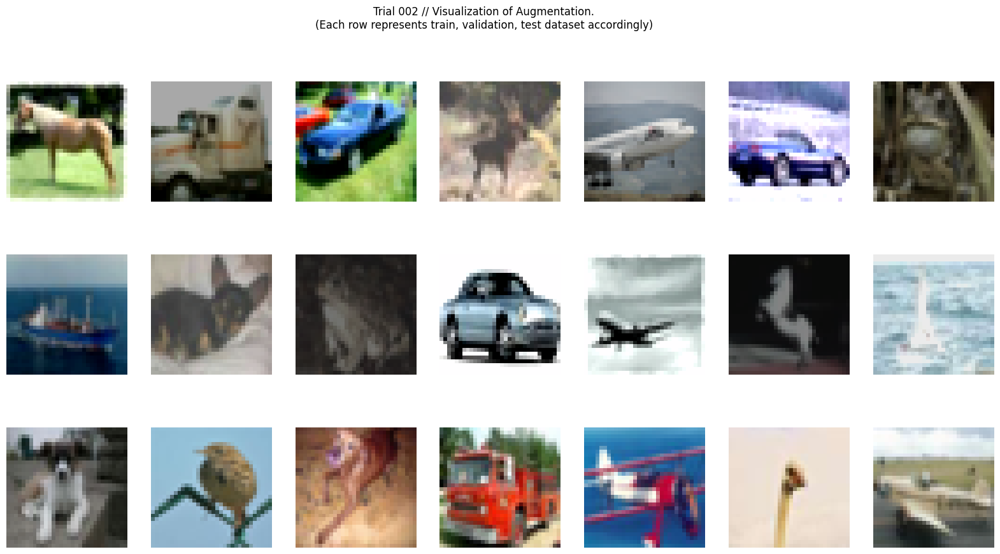

[ColorJitter(brightness=(0.5, 1.5), contrast=(0.5, 1.5), saturation=(0.5, 1.5), hue=None), RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     

Train: [001] Loss: 2.077, Acc: 22.69% F1(macro): 0.22: 100%|██████████| 156/156 [00:10<00:00, 15.26it/s]
 Val:       Loss: 1.815, Acc: 32.35% F1(macro): 0.31: 100%|██████████| 40/40 [00:01<00:00, 20.88it/s]


Model saved. Current best test f1: 0.313


Train: [002] Loss: 1.675, Acc: 38.32% F1(macro): 0.38: 100%|██████████| 156/156 [00:10<00:00, 15.36it/s]
 Val:       Loss: 1.612, Acc: 41.40% F1(macro): 0.40: 100%|██████████| 40/40 [00:01<00:00, 21.05it/s]


Model saved. Current best test f1: 0.398


Train: [003] Loss: 1.517, Acc: 44.91% F1(macro): 0.44: 100%|██████████| 156/156 [00:10<00:00, 14.70it/s]
 Val:       Loss: 1.462, Acc: 46.99% F1(macro): 0.47: 100%|██████████| 40/40 [00:01<00:00, 20.59it/s]


Model saved. Current best test f1: 0.468


Train: [004] Loss: 1.414, Acc: 48.61% F1(macro): 0.48: 100%|██████████| 156/156 [00:10<00:00, 15.39it/s]
 Val:       Loss: 1.397, Acc: 50.21% F1(macro): 0.49: 100%|██████████| 40/40 [00:02<00:00, 19.71it/s]


Model saved. Current best test f1: 0.489


Train: [005] Loss: 1.327, Acc: 52.10% F1(macro): 0.52: 100%|██████████| 156/156 [00:10<00:00, 15.22it/s]
 Val:       Loss: 1.326, Acc: 52.48% F1(macro): 0.52: 100%|██████████| 40/40 [00:01<00:00, 21.44it/s]


Model saved. Current best test f1: 0.522


Train: [006] Loss: 1.262, Acc: 54.84% F1(macro): 0.55: 100%|██████████| 156/156 [00:10<00:00, 14.67it/s]
 Val:       Loss: 1.303, Acc: 53.83% F1(macro): 0.53: 100%|██████████| 40/40 [00:01<00:00, 21.12it/s]


Model saved. Current best test f1: 0.531


Train: [007] Loss: 1.211, Acc: 56.96% F1(macro): 0.57: 100%|██████████| 156/156 [00:09<00:00, 15.78it/s]
 Val:       Loss: 1.269, Acc: 54.74% F1(macro): 0.55: 100%|██████████| 40/40 [00:01<00:00, 20.87it/s]


Model saved. Current best test f1: 0.547


Train: [008] Loss: 1.149, Acc: 58.94% F1(macro): 0.59: 100%|██████████| 156/156 [00:10<00:00, 15.38it/s]
 Val:       Loss: 1.184, Acc: 57.84% F1(macro): 0.58: 100%|██████████| 40/40 [00:01<00:00, 21.73it/s]


Model saved. Current best test f1: 0.578


Train: [009] Loss: 1.097, Acc: 60.75% F1(macro): 0.61: 100%|██████████| 156/156 [00:10<00:00, 15.44it/s]
 Val:       Loss: 1.174, Acc: 58.97% F1(macro): 0.59: 100%|██████████| 40/40 [00:01<00:00, 20.76it/s]


Model saved. Current best test f1: 0.589


Train: [010] Loss: 1.066, Acc: 61.96% F1(macro): 0.62: 100%|██████████| 156/156 [00:10<00:00, 15.30it/s]
 Val:       Loss: 1.134, Acc: 60.17% F1(macro): 0.60: 100%|██████████| 40/40 [00:01<00:00, 20.66it/s]


Model saved. Current best test f1: 0.599
TEST DATASET


 Val:       Loss: 1.069, Acc: 62.33% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 36.57it/s]
[I 2021-11-22 04:32:18,756] Trial 2 finished with value: 0.6194083198482379 and parameters: {'aug_color_jitter': True, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 0 with value: 0.6301687075642395.


Files already downloaded and verified
Files already downloaded and verified


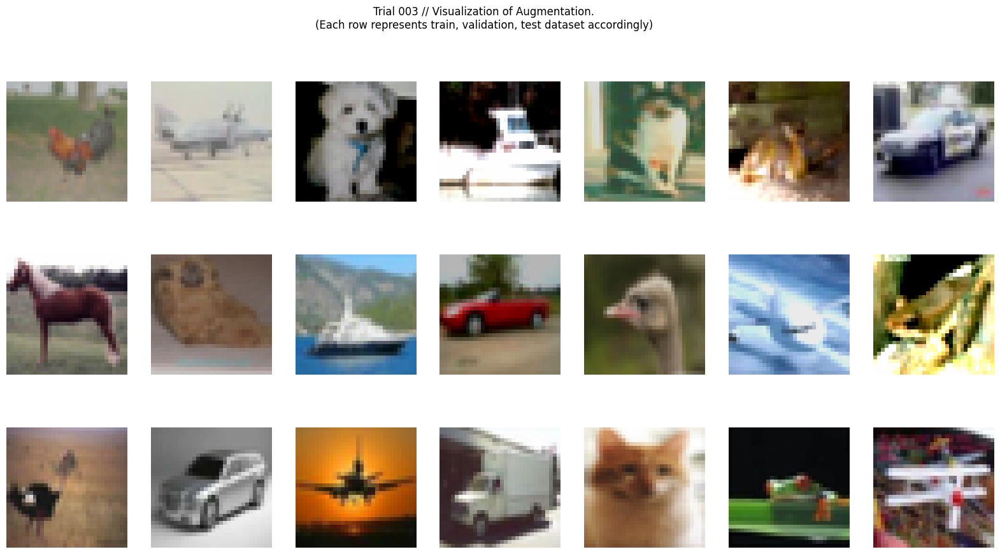

[ColorJitter(brightness=(0.5, 1.5), contrast=(0.5, 1.5), saturation=(0.5, 1.5), hue=None)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |

Train: [001] Loss: 2.058, Acc: 23.62% F1(macro): 0.23: 100%|██████████| 156/156 [00:10<00:00, 15.20it/s]
 Val:       Loss: 1.827, Acc: 32.88% F1(macro): 0.31: 100%|██████████| 40/40 [00:01<00:00, 21.11it/s]


Model saved. Current best test f1: 0.306


Train: [002] Loss: 1.678, Acc: 38.30% F1(macro): 0.38: 100%|██████████| 156/156 [00:10<00:00, 15.47it/s]
 Val:       Loss: 1.563, Acc: 42.76% F1(macro): 0.42: 100%|██████████| 40/40 [00:01<00:00, 21.04it/s]


Model saved. Current best test f1: 0.417


Train: [003] Loss: 1.504, Acc: 44.89% F1(macro): 0.44: 100%|██████████| 156/156 [00:10<00:00, 15.35it/s]
 Val:       Loss: 1.448, Acc: 47.47% F1(macro): 0.47: 100%|██████████| 40/40 [00:01<00:00, 20.83it/s]


Model saved. Current best test f1: 0.469


Train: [004] Loss: 1.399, Acc: 48.83% F1(macro): 0.48: 100%|██████████| 156/156 [00:10<00:00, 15.52it/s]
 Val:       Loss: 1.417, Acc: 48.05% F1(macro): 0.47: 100%|██████████| 40/40 [00:01<00:00, 22.05it/s]


Model saved. Current best test f1: 0.473


Train: [005] Loss: 1.307, Acc: 53.01% F1(macro): 0.53: 100%|██████████| 156/156 [00:10<00:00, 15.39it/s]
 Val:       Loss: 1.313, Acc: 52.76% F1(macro): 0.53: 100%|██████████| 40/40 [00:01<00:00, 21.30it/s]


Model saved. Current best test f1: 0.528


Train: [006] Loss: 1.235, Acc: 55.51% F1(macro): 0.55: 100%|██████████| 156/156 [00:10<00:00, 15.04it/s]
 Val:       Loss: 1.290, Acc: 53.93% F1(macro): 0.53: 100%|██████████| 40/40 [00:01<00:00, 21.55it/s]


Model saved. Current best test f1: 0.535


Train: [007] Loss: 1.174, Acc: 58.05% F1(macro): 0.58: 100%|██████████| 156/156 [00:10<00:00, 14.89it/s]
 Val:       Loss: 1.229, Acc: 55.82% F1(macro): 0.55: 100%|██████████| 40/40 [00:01<00:00, 21.33it/s]


Model saved. Current best test f1: 0.554


Train: [008] Loss: 1.108, Acc: 60.42% F1(macro): 0.60: 100%|██████████| 156/156 [00:10<00:00, 15.33it/s]
 Val:       Loss: 1.155, Acc: 58.60% F1(macro): 0.58: 100%|██████████| 40/40 [00:01<00:00, 21.10it/s]


Model saved. Current best test f1: 0.584


Train: [009] Loss: 1.041, Acc: 62.67% F1(macro): 0.62: 100%|██████████| 156/156 [00:10<00:00, 15.26it/s]
 Val:       Loss: 1.133, Acc: 59.86% F1(macro): 0.60: 100%|██████████| 40/40 [00:02<00:00, 19.38it/s]


Model saved. Current best test f1: 0.597


Train: [010] Loss: 0.995, Acc: 64.53% F1(macro): 0.64: 100%|██████████| 156/156 [00:10<00:00, 15.26it/s]
 Val:       Loss: 1.111, Acc: 60.60% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 20.93it/s]


Model saved. Current best test f1: 0.607
TEST DATASET


 Val:       Loss: 1.064, Acc: 62.24% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 37.85it/s]
[I 2021-11-22 04:34:35,425] Trial 3 finished with value: 0.6232662799652879 and parameters: {'aug_color_jitter': True, 'aug_random_perspective': False, 'aug_random_flip': False}. Best is trial 0 with value: 0.6301687075642395.


Files already downloaded and verified
Files already downloaded and verified


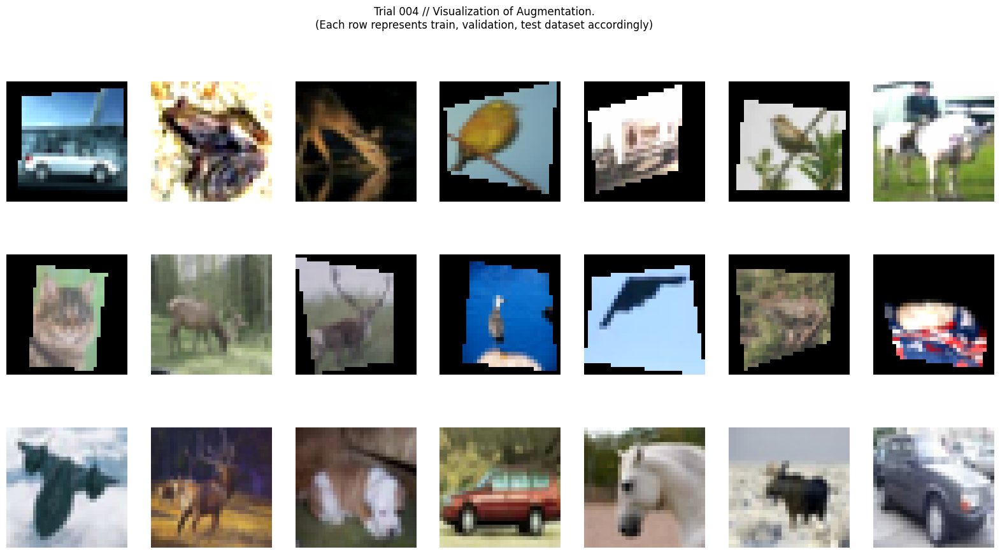

[ColorJitter(brightness=(0.5, 1.5), contrast=(0.5, 1.5), saturation=(0.5, 1.5), hue=None), RandomPerspective(p=0.5), RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40    

Train: [001] Loss: 2.165, Acc: 19.11% F1(macro): 0.19: 100%|██████████| 156/156 [00:11<00:00, 14.03it/s]
 Val:       Loss: 2.095, Acc: 24.83% F1(macro): 0.22: 100%|██████████| 40/40 [00:02<00:00, 16.51it/s]


Model saved. Current best test f1: 0.219


Train: [002] Loss: 1.870, Acc: 30.01% F1(macro): 0.29: 100%|██████████| 156/156 [00:10<00:00, 14.37it/s]
 Val:       Loss: 1.786, Acc: 32.74% F1(macro): 0.32: 100%|██████████| 40/40 [00:02<00:00, 16.87it/s]


Model saved. Current best test f1: 0.319


Train: [003] Loss: 1.736, Acc: 35.28% F1(macro): 0.35: 100%|██████████| 156/156 [00:11<00:00, 13.80it/s]
 Val:       Loss: 1.707, Acc: 36.18% F1(macro): 0.34: 100%|██████████| 40/40 [00:02<00:00, 16.59it/s]


Model saved. Current best test f1: 0.339


Train: [004] Loss: 1.658, Acc: 38.95% F1(macro): 0.38: 100%|██████████| 156/156 [00:10<00:00, 14.63it/s]
 Val:       Loss: 1.646, Acc: 39.36% F1(macro): 0.38: 100%|██████████| 40/40 [00:02<00:00, 16.55it/s]


Model saved. Current best test f1: 0.381


Train: [005] Loss: 1.575, Acc: 42.20% F1(macro): 0.42: 100%|██████████| 156/156 [00:10<00:00, 14.45it/s]
 Val:       Loss: 1.588, Acc: 41.31% F1(macro): 0.40: 100%|██████████| 40/40 [00:02<00:00, 16.36it/s]


Model saved. Current best test f1: 0.402


Train: [006] Loss: 1.524, Acc: 44.05% F1(macro): 0.44: 100%|██████████| 156/156 [00:10<00:00, 14.42it/s]
 Val:       Loss: 1.522, Acc: 43.99% F1(macro): 0.43: 100%|██████████| 40/40 [00:02<00:00, 16.55it/s]


Model saved. Current best test f1: 0.433


Train: [007] Loss: 1.479, Acc: 46.12% F1(macro): 0.46: 100%|██████████| 156/156 [00:10<00:00, 14.30it/s]
 Val:       Loss: 1.468, Acc: 45.58% F1(macro): 0.46: 100%|██████████| 40/40 [00:02<00:00, 16.54it/s]


Model saved. Current best test f1: 0.457


Train: [008] Loss: 1.439, Acc: 47.16% F1(macro): 0.47: 100%|██████████| 156/156 [00:10<00:00, 14.32it/s]
 Val:       Loss: 1.479, Acc: 47.08% F1(macro): 0.47: 100%|██████████| 40/40 [00:02<00:00, 16.55it/s]


Model saved. Current best test f1: 0.468


Train: [009] Loss: 1.432, Acc: 48.29% F1(macro): 0.48: 100%|██████████| 156/156 [00:10<00:00, 14.62it/s]
 Val:       Loss: 1.426, Acc: 48.18% F1(macro): 0.48: 100%|██████████| 40/40 [00:02<00:00, 16.08it/s]


Model saved. Current best test f1: 0.477


Train: [010] Loss: 1.392, Acc: 49.12% F1(macro): 0.49: 100%|██████████| 156/156 [00:10<00:00, 14.36it/s]
 Val:       Loss: 1.426, Acc: 48.20% F1(macro): 0.48: 100%|██████████| 40/40 [00:02<00:00, 16.65it/s]


Model saved. Current best test f1: 0.479
TEST DATASET


 Val:       Loss: 1.242, Acc: 55.17% F1(macro): 0.55: 100%|██████████| 40/40 [00:01<00:00, 36.94it/s]
[I 2021-11-22 04:37:03,794] Trial 4 finished with value: 0.5483284786332139 and parameters: {'aug_color_jitter': True, 'aug_random_perspective': True, 'aug_random_flip': True}. Best is trial 0 with value: 0.6301687075642395.


Files already downloaded and verified
Files already downloaded and verified


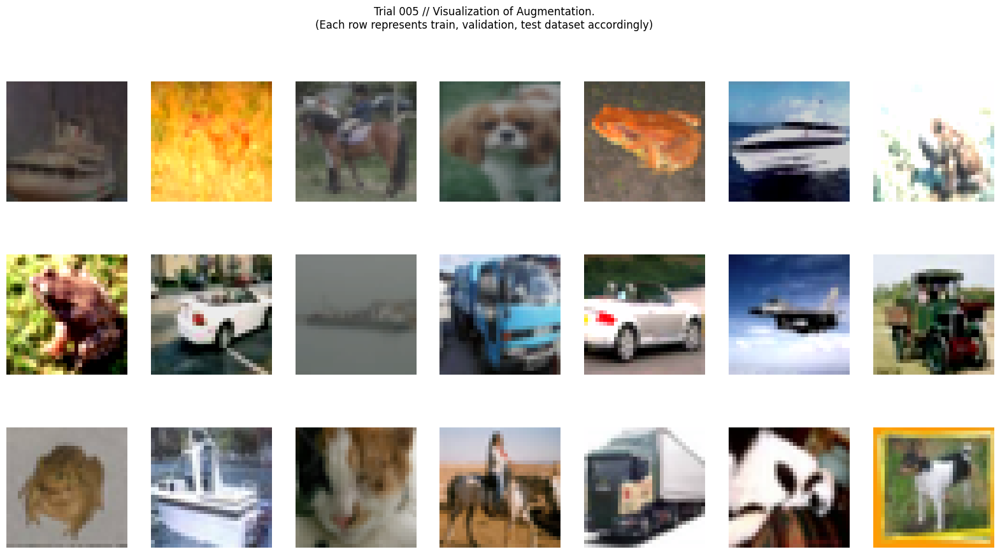

[ColorJitter(brightness=(0.5, 1.5), contrast=(0.5, 1.5), saturation=(0.5, 1.5), hue=None), RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     

Train: [001] Loss: 2.019, Acc: 24.60% F1(macro): 0.24: 100%|██████████| 156/156 [00:10<00:00, 15.42it/s]
 Val:       Loss: 1.816, Acc: 34.08% F1(macro): 0.31: 100%|██████████| 40/40 [00:01<00:00, 20.78it/s]


Model saved. Current best test f1: 0.308


Train: [002] Loss: 1.634, Acc: 39.95% F1(macro): 0.39: 100%|██████████| 156/156 [00:10<00:00, 15.48it/s]
 Val:       Loss: 1.613, Acc: 41.86% F1(macro): 0.40: 100%|██████████| 40/40 [00:01<00:00, 20.71it/s]


Model saved. Current best test f1: 0.404


Train: [003] Loss: 1.492, Acc: 45.55% F1(macro): 0.45: 100%|██████████| 156/156 [00:10<00:00, 15.18it/s]
 Val:       Loss: 1.504, Acc: 45.03% F1(macro): 0.45: 100%|██████████| 40/40 [00:01<00:00, 20.63it/s]


Model saved. Current best test f1: 0.446


Train: [004] Loss: 1.404, Acc: 49.38% F1(macro): 0.49: 100%|██████████| 156/156 [00:10<00:00, 15.23it/s]
 Val:       Loss: 1.411, Acc: 49.79% F1(macro): 0.49: 100%|██████████| 40/40 [00:02<00:00, 19.46it/s]


Model saved. Current best test f1: 0.494


Train: [005] Loss: 1.330, Acc: 52.23% F1(macro): 0.52: 100%|██████████| 156/156 [00:10<00:00, 15.03it/s]
 Val:       Loss: 1.355, Acc: 51.20% F1(macro): 0.51: 100%|██████████| 40/40 [00:01<00:00, 21.50it/s]


Model saved. Current best test f1: 0.507


Train: [006] Loss: 1.261, Acc: 55.02% F1(macro): 0.55: 100%|██████████| 156/156 [00:10<00:00, 14.82it/s]
 Val:       Loss: 1.308, Acc: 53.61% F1(macro): 0.53: 100%|██████████| 40/40 [00:02<00:00, 19.35it/s]


Model saved. Current best test f1: 0.532


Train: [007] Loss: 1.200, Acc: 56.98% F1(macro): 0.57: 100%|██████████| 156/156 [00:10<00:00, 14.96it/s]
 Val:       Loss: 1.254, Acc: 55.48% F1(macro): 0.55: 100%|██████████| 40/40 [00:02<00:00, 19.01it/s]


Model saved. Current best test f1: 0.554


Train: [008] Loss: 1.135, Acc: 59.61% F1(macro): 0.59: 100%|██████████| 156/156 [00:10<00:00, 15.14it/s]
 Val:       Loss: 1.179, Acc: 58.41% F1(macro): 0.59: 100%|██████████| 40/40 [00:01<00:00, 20.20it/s]


Model saved. Current best test f1: 0.585


Train: [009] Loss: 1.096, Acc: 61.02% F1(macro): 0.61: 100%|██████████| 156/156 [00:10<00:00, 15.13it/s]
 Val:       Loss: 1.193, Acc: 58.09% F1(macro): 0.58: 100%|██████████| 40/40 [00:01<00:00, 21.11it/s]
Train: [010] Loss: 1.049, Acc: 62.74% F1(macro): 0.63: 100%|██████████| 156/156 [00:10<00:00, 15.05it/s]
 Val:       Loss: 1.103, Acc: 60.91% F1(macro): 0.61: 100%|██████████| 40/40 [00:02<00:00, 18.89it/s]


Model saved. Current best test f1: 0.609
TEST DATASET


 Val:       Loss: 1.048, Acc: 62.71% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 37.66it/s]
[I 2021-11-22 04:39:21,028] Trial 5 finished with value: 0.6232339752511609 and parameters: {'aug_color_jitter': True, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 0 with value: 0.6301687075642395.


Files already downloaded and verified
Files already downloaded and verified


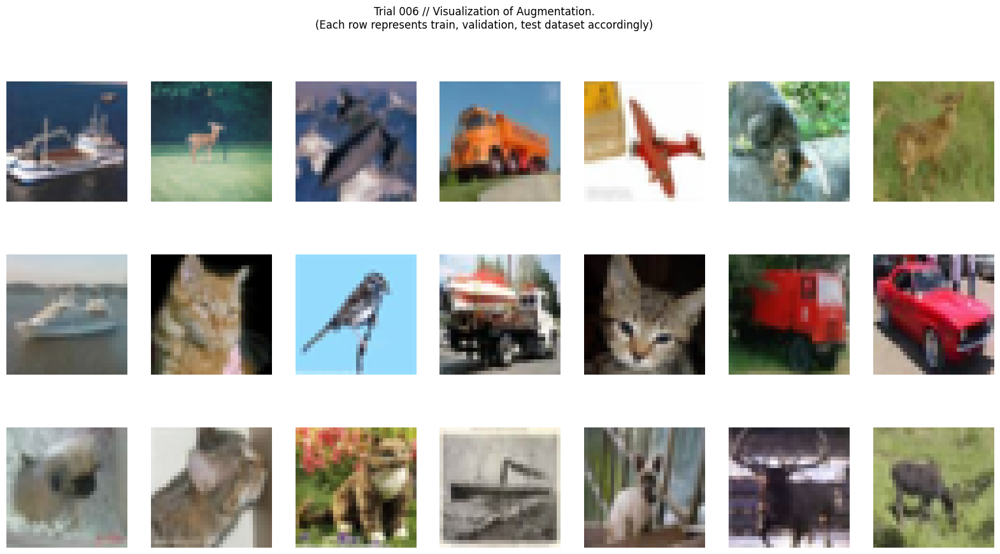

[]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |     34,760 | InvertedResid

Train: [001] Loss: 1.867, Acc: 30.22% F1(macro): 0.30: 100%|██████████| 156/156 [00:09<00:00, 15.71it/s]
 Val:       Loss: 1.625, Acc: 40.86% F1(macro): 0.39: 100%|██████████| 40/40 [00:01<00:00, 39.51it/s]


Model saved. Current best test f1: 0.393


Train: [002] Loss: 1.468, Acc: 46.07% F1(macro): 0.46: 100%|██████████| 156/156 [00:09<00:00, 15.70it/s]
 Val:       Loss: 1.426, Acc: 47.53% F1(macro): 0.47: 100%|██████████| 40/40 [00:01<00:00, 38.69it/s]


Model saved. Current best test f1: 0.473


Train: [003] Loss: 1.324, Acc: 51.92% F1(macro): 0.52: 100%|██████████| 156/156 [00:09<00:00, 16.02it/s]
 Val:       Loss: 1.367, Acc: 50.16% F1(macro): 0.49: 100%|██████████| 40/40 [00:01<00:00, 37.87it/s]


Model saved. Current best test f1: 0.494


Train: [004] Loss: 1.206, Acc: 56.76% F1(macro): 0.57: 100%|██████████| 156/156 [00:10<00:00, 15.39it/s]
 Val:       Loss: 1.298, Acc: 53.31% F1(macro): 0.53: 100%|██████████| 40/40 [00:01<00:00, 39.62it/s]


Model saved. Current best test f1: 0.526


Train: [005] Loss: 1.118, Acc: 59.90% F1(macro): 0.60: 100%|██████████| 156/156 [00:09<00:00, 15.80it/s]
 Val:       Loss: 1.252, Acc: 55.92% F1(macro): 0.55: 100%|██████████| 40/40 [00:01<00:00, 38.19it/s]


Model saved. Current best test f1: 0.552


Train: [006] Loss: 1.040, Acc: 62.99% F1(macro): 0.63: 100%|██████████| 156/156 [00:09<00:00, 15.86it/s]
 Val:       Loss: 1.243, Acc: 56.42% F1(macro): 0.56: 100%|██████████| 40/40 [00:01<00:00, 38.66it/s]


Model saved. Current best test f1: 0.562


Train: [007] Loss: 0.968, Acc: 65.74% F1(macro): 0.66: 100%|██████████| 156/156 [00:09<00:00, 15.75it/s]
 Val:       Loss: 1.200, Acc: 58.42% F1(macro): 0.58: 100%|██████████| 40/40 [00:00<00:00, 40.13it/s]


Model saved. Current best test f1: 0.583


Train: [008] Loss: 0.902, Acc: 68.03% F1(macro): 0.68: 100%|██████████| 156/156 [00:09<00:00, 15.73it/s]
 Val:       Loss: 1.201, Acc: 59.16% F1(macro): 0.59: 100%|██████████| 40/40 [00:01<00:00, 37.45it/s]


Model saved. Current best test f1: 0.593


Train: [009] Loss: 0.854, Acc: 69.73% F1(macro): 0.70: 100%|██████████| 156/156 [00:10<00:00, 15.17it/s]
 Val:       Loss: 1.194, Acc: 59.40% F1(macro): 0.59: 100%|██████████| 40/40 [00:01<00:00, 39.87it/s]
Train: [010] Loss: 0.818, Acc: 71.05% F1(macro): 0.71: 100%|██████████| 156/156 [00:09<00:00, 15.64it/s]
 Val:       Loss: 1.212, Acc: 59.44% F1(macro): 0.59: 100%|██████████| 40/40 [00:00<00:00, 40.82it/s]


TEST DATASET


 Val:       Loss: 1.219, Acc: 58.87% F1(macro): 0.59: 100%|██████████| 40/40 [00:01<00:00, 36.31it/s]
[I 2021-11-22 04:41:24,338] Trial 6 finished with value: 0.5867083315589128 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': False}. Best is trial 0 with value: 0.6301687075642395.


Files already downloaded and verified
Files already downloaded and verified


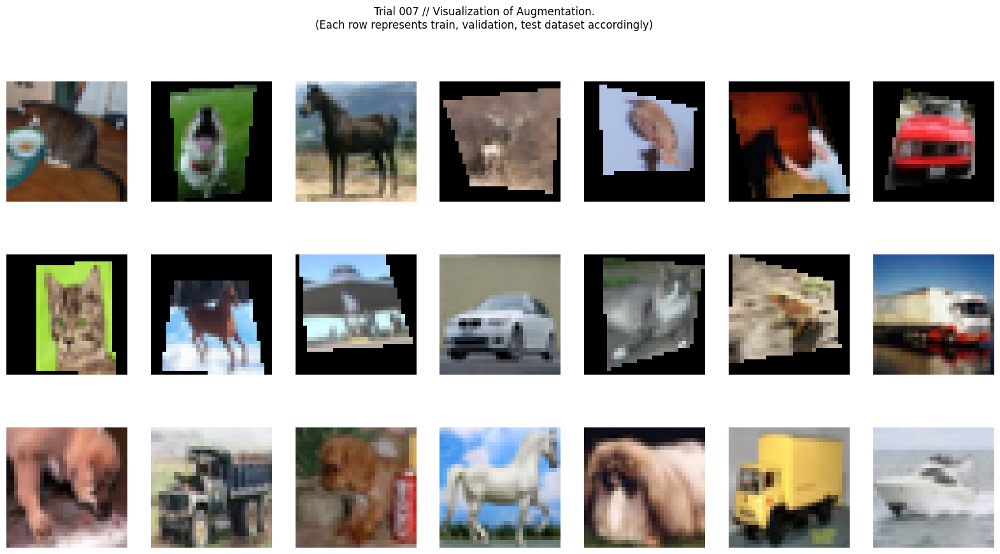

[RandomPerspective(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |   

Train: [001] Loss: 2.032, Acc: 24.22% F1(macro): 0.24: 100%|██████████| 156/156 [00:10<00:00, 15.45it/s]
 Val:       Loss: 1.802, Acc: 33.79% F1(macro): 0.32: 100%|██████████| 40/40 [00:01<00:00, 26.37it/s]


Model saved. Current best test f1: 0.316


Train: [002] Loss: 1.691, Acc: 37.52% F1(macro): 0.37: 100%|██████████| 156/156 [00:10<00:00, 15.53it/s]
 Val:       Loss: 1.601, Acc: 40.60% F1(macro): 0.40: 100%|██████████| 40/40 [00:01<00:00, 25.41it/s]


Model saved. Current best test f1: 0.399


Train: [003] Loss: 1.552, Acc: 43.14% F1(macro): 0.43: 100%|██████████| 156/156 [00:10<00:00, 14.82it/s]
 Val:       Loss: 1.511, Acc: 44.71% F1(macro): 0.44: 100%|██████████| 40/40 [00:01<00:00, 26.16it/s]


Model saved. Current best test f1: 0.443


Train: [004] Loss: 1.473, Acc: 46.12% F1(macro): 0.46: 100%|██████████| 156/156 [00:09<00:00, 15.67it/s]
 Val:       Loss: 1.475, Acc: 46.24% F1(macro): 0.46: 100%|██████████| 40/40 [00:01<00:00, 25.89it/s]


Model saved. Current best test f1: 0.459


Train: [005] Loss: 1.423, Acc: 48.47% F1(macro): 0.48: 100%|██████████| 156/156 [00:09<00:00, 15.64it/s]
 Val:       Loss: 1.433, Acc: 47.86% F1(macro): 0.48: 100%|██████████| 40/40 [00:01<00:00, 26.91it/s]


Model saved. Current best test f1: 0.479


Train: [006] Loss: 1.370, Acc: 50.35% F1(macro): 0.50: 100%|██████████| 156/156 [00:10<00:00, 15.39it/s]
 Val:       Loss: 1.416, Acc: 49.14% F1(macro): 0.47: 100%|██████████| 40/40 [00:01<00:00, 26.65it/s]
Train: [007] Loss: 1.333, Acc: 51.72% F1(macro): 0.52: 100%|██████████| 156/156 [00:10<00:00, 15.58it/s]
 Val:       Loss: 1.374, Acc: 50.61% F1(macro): 0.49: 100%|██████████| 40/40 [00:01<00:00, 25.95it/s]


Model saved. Current best test f1: 0.494


Train: [008] Loss: 1.296, Acc: 53.23% F1(macro): 0.53: 100%|██████████| 156/156 [00:10<00:00, 15.58it/s]
 Val:       Loss: 1.351, Acc: 51.80% F1(macro): 0.51: 100%|██████████| 40/40 [00:01<00:00, 26.79it/s]


Model saved. Current best test f1: 0.514


Train: [009] Loss: 1.253, Acc: 54.96% F1(macro): 0.55: 100%|██████████| 156/156 [00:09<00:00, 15.65it/s]
 Val:       Loss: 1.322, Acc: 52.23% F1(macro): 0.52: 100%|██████████| 40/40 [00:01<00:00, 25.46it/s]


Model saved. Current best test f1: 0.518


Train: [010] Loss: 1.240, Acc: 55.73% F1(macro): 0.56: 100%|██████████| 156/156 [00:10<00:00, 14.85it/s]
 Val:       Loss: 1.294, Acc: 53.05% F1(macro): 0.53: 100%|██████████| 40/40 [00:01<00:00, 25.54it/s]


Model saved. Current best test f1: 0.526
TEST DATASET


 Val:       Loss: 1.193, Acc: 57.62% F1(macro): 0.57: 100%|██████████| 40/40 [00:01<00:00, 33.61it/s]
[I 2021-11-22 04:43:35,344] Trial 7 finished with value: 0.5722633595735298 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': True, 'aug_random_flip': False}. Best is trial 0 with value: 0.6301687075642395.


Files already downloaded and verified
Files already downloaded and verified


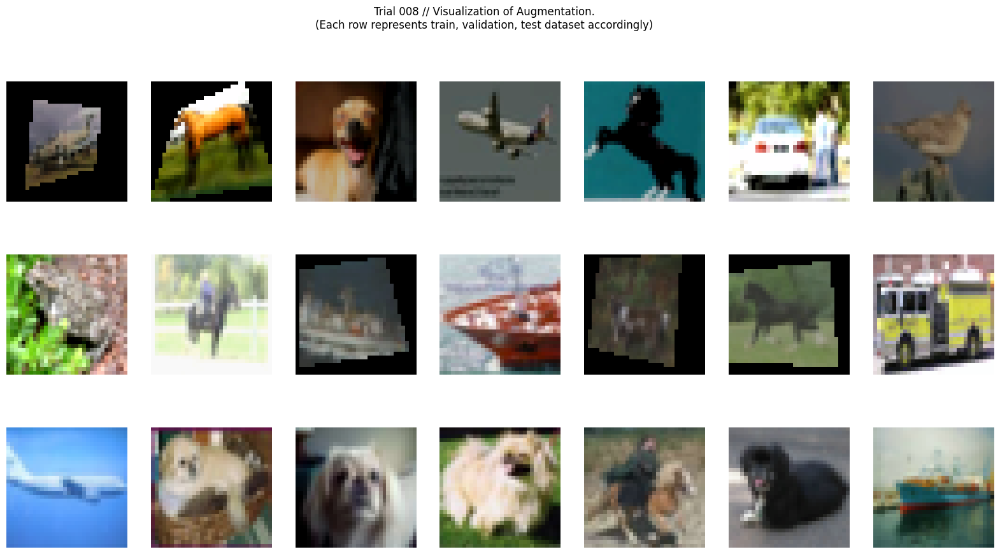

[ColorJitter(brightness=(0.5, 1.5), contrast=(0.5, 1.5), saturation=(0.5, 1.5), hue=None), RandomPerspective(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,

Train: [001] Loss: 2.154, Acc: 19.20% F1(macro): 0.19: 100%|██████████| 156/156 [00:10<00:00, 14.51it/s]
 Val:       Loss: 1.934, Acc: 26.87% F1(macro): 0.24: 100%|██████████| 40/40 [00:02<00:00, 16.99it/s]


Model saved. Current best test f1: 0.239


Train: [002] Loss: 1.830, Acc: 31.50% F1(macro): 0.31: 100%|██████████| 156/156 [00:10<00:00, 14.91it/s]
 Val:       Loss: 1.741, Acc: 35.72% F1(macro): 0.35: 100%|██████████| 40/40 [00:02<00:00, 16.93it/s]


Model saved. Current best test f1: 0.350


Train: [003] Loss: 1.700, Acc: 37.30% F1(macro): 0.37: 100%|██████████| 156/156 [00:10<00:00, 14.68it/s]
 Val:       Loss: 1.650, Acc: 39.37% F1(macro): 0.39: 100%|██████████| 40/40 [00:02<00:00, 17.00it/s]


Model saved. Current best test f1: 0.387


Train: [004] Loss: 1.616, Acc: 40.82% F1(macro): 0.40: 100%|██████████| 156/156 [00:10<00:00, 14.91it/s]
 Val:       Loss: 1.560, Acc: 43.08% F1(macro): 0.43: 100%|██████████| 40/40 [00:02<00:00, 17.02it/s]


Model saved. Current best test f1: 0.428


Train: [005] Loss: 1.547, Acc: 43.24% F1(macro): 0.43: 100%|██████████| 156/156 [00:11<00:00, 13.61it/s]
 Val:       Loss: 1.517, Acc: 44.85% F1(macro): 0.45: 100%|██████████| 40/40 [00:02<00:00, 16.05it/s]


Model saved. Current best test f1: 0.446


Train: [006] Loss: 1.497, Acc: 45.07% F1(macro): 0.45: 100%|██████████| 156/156 [00:10<00:00, 14.48it/s]
 Val:       Loss: 1.476, Acc: 45.65% F1(macro): 0.44: 100%|██████████| 40/40 [00:02<00:00, 17.27it/s]
Train: [007] Loss: 1.460, Acc: 46.63% F1(macro): 0.46: 100%|██████████| 156/156 [00:10<00:00, 14.55it/s]
 Val:       Loss: 1.439, Acc: 48.56% F1(macro): 0.48: 100%|██████████| 40/40 [00:02<00:00, 17.58it/s]


Model saved. Current best test f1: 0.480


Train: [008] Loss: 1.408, Acc: 48.78% F1(macro): 0.48: 100%|██████████| 156/156 [00:10<00:00, 14.52it/s]
 Val:       Loss: 1.421, Acc: 48.84% F1(macro): 0.48: 100%|██████████| 40/40 [00:02<00:00, 17.41it/s]


Model saved. Current best test f1: 0.484


Train: [009] Loss: 1.376, Acc: 50.44% F1(macro): 0.50: 100%|██████████| 156/156 [00:10<00:00, 14.59it/s]
 Val:       Loss: 1.414, Acc: 49.69% F1(macro): 0.50: 100%|██████████| 40/40 [00:02<00:00, 17.29it/s]


Model saved. Current best test f1: 0.495


Train: [010] Loss: 1.328, Acc: 52.25% F1(macro): 0.52: 100%|██████████| 156/156 [00:10<00:00, 14.52it/s]
 Val:       Loss: 1.339, Acc: 52.16% F1(macro): 0.52: 100%|██████████| 40/40 [00:02<00:00, 17.14it/s]


Model saved. Current best test f1: 0.516
TEST DATASET


 Val:       Loss: 1.181, Acc: 58.03% F1(macro): 0.58: 100%|██████████| 40/40 [00:01<00:00, 38.99it/s]
[I 2021-11-22 04:46:00,836] Trial 8 finished with value: 0.578170175781235 and parameters: {'aug_color_jitter': True, 'aug_random_perspective': True, 'aug_random_flip': False}. Best is trial 0 with value: 0.6301687075642395.


Files already downloaded and verified
Files already downloaded and verified


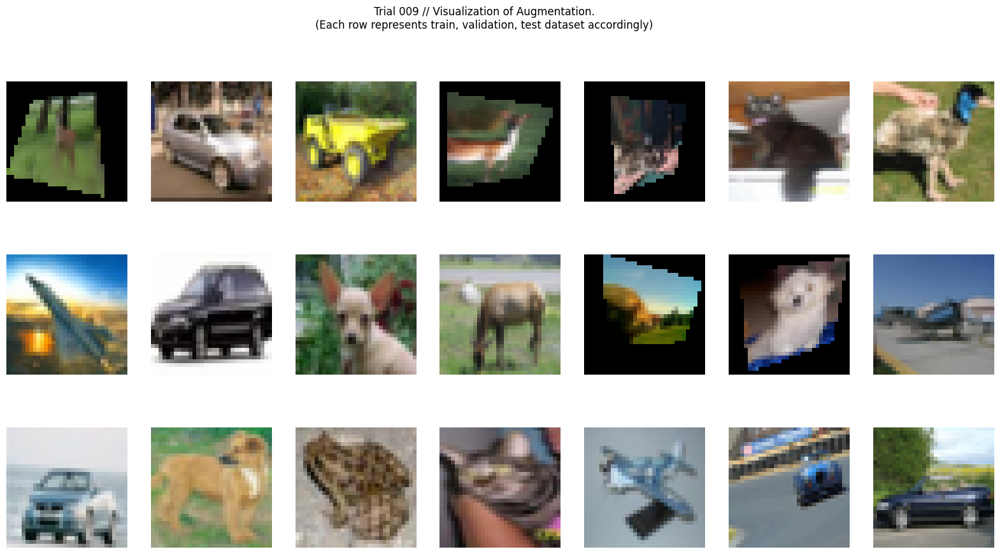

[RandomPerspective(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |   

Train: [001] Loss: 2.079, Acc: 21.93% F1(macro): 0.22: 100%|██████████| 156/156 [00:10<00:00, 15.28it/s]
 Val:       Loss: 1.874, Acc: 30.75% F1(macro): 0.29: 100%|██████████| 40/40 [00:01<00:00, 20.80it/s]


Model saved. Current best test f1: 0.293


Train: [002] Loss: 1.744, Acc: 35.17% F1(macro): 0.35: 100%|██████████| 156/156 [00:10<00:00, 14.75it/s]
 Val:       Loss: 1.651, Acc: 39.58% F1(macro): 0.39: 100%|██████████| 40/40 [00:01<00:00, 26.47it/s]


Model saved. Current best test f1: 0.394


Train: [003] Loss: 1.572, Acc: 42.16% F1(macro): 0.42: 100%|██████████| 156/156 [00:10<00:00, 15.51it/s]
 Val:       Loss: 1.529, Acc: 44.25% F1(macro): 0.44: 100%|██████████| 40/40 [00:01<00:00, 26.34it/s]


Model saved. Current best test f1: 0.436


Train: [004] Loss: 1.473, Acc: 46.50% F1(macro): 0.46: 100%|██████████| 156/156 [00:10<00:00, 14.99it/s]
 Val:       Loss: 1.435, Acc: 47.25% F1(macro): 0.47: 100%|██████████| 40/40 [00:01<00:00, 26.26it/s]


Model saved. Current best test f1: 0.470


Train: [005] Loss: 1.408, Acc: 48.74% F1(macro): 0.48: 100%|██████████| 156/156 [00:10<00:00, 15.23it/s]
 Val:       Loss: 1.433, Acc: 48.82% F1(macro): 0.48: 100%|██████████| 40/40 [00:01<00:00, 25.54it/s]


Model saved. Current best test f1: 0.484


Train: [006] Loss: 1.365, Acc: 50.53% F1(macro): 0.50: 100%|██████████| 156/156 [00:09<00:00, 15.66it/s]
 Val:       Loss: 1.373, Acc: 49.95% F1(macro): 0.50: 100%|██████████| 40/40 [00:01<00:00, 26.23it/s]


Model saved. Current best test f1: 0.503


Train: [007] Loss: 1.313, Acc: 52.90% F1(macro): 0.53: 100%|██████████| 156/156 [00:09<00:00, 15.80it/s]
 Val:       Loss: 1.366, Acc: 51.19% F1(macro): 0.51: 100%|██████████| 40/40 [00:01<00:00, 25.22it/s]


Model saved. Current best test f1: 0.508


Train: [008] Loss: 1.299, Acc: 53.56% F1(macro): 0.53: 100%|██████████| 156/156 [00:09<00:00, 15.66it/s]
 Val:       Loss: 1.312, Acc: 52.03% F1(macro): 0.52: 100%|██████████| 40/40 [00:01<00:00, 26.65it/s]


Model saved. Current best test f1: 0.518


Train: [009] Loss: 1.251, Acc: 54.97% F1(macro): 0.55: 100%|██████████| 156/156 [00:09<00:00, 15.71it/s]
 Val:       Loss: 1.284, Acc: 53.51% F1(macro): 0.53: 100%|██████████| 40/40 [00:01<00:00, 25.12it/s]


Model saved. Current best test f1: 0.530


Train: [010] Loss: 1.206, Acc: 56.70% F1(macro): 0.57: 100%|██████████| 156/156 [00:10<00:00, 15.35it/s]
 Val:       Loss: 1.245, Acc: 55.26% F1(macro): 0.55: 100%|██████████| 40/40 [00:01<00:00, 24.93it/s]


Model saved. Current best test f1: 0.546
TEST DATASET


 Val:       Loss: 1.131, Acc: 59.34% F1(macro): 0.59: 100%|██████████| 40/40 [00:01<00:00, 37.88it/s]
[I 2021-11-22 04:48:13,396] Trial 9 finished with value: 0.5888991146545843 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': True, 'aug_random_flip': False}. Best is trial 0 with value: 0.6301687075642395.


Files already downloaded and verified
Files already downloaded and verified


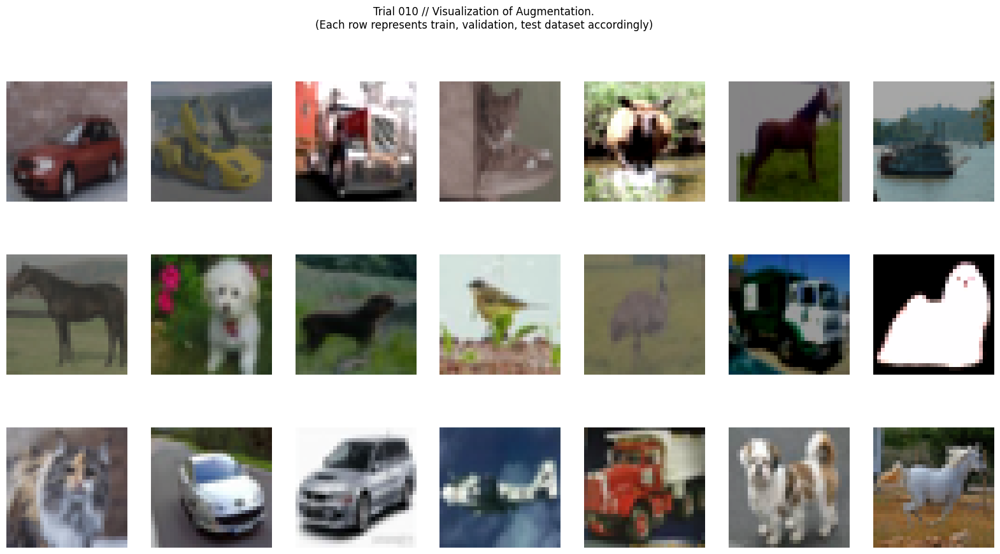

[ColorJitter(brightness=(0.5, 1.5), contrast=(0.5, 1.5), saturation=(0.5, 1.5), hue=None), RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     

Train: [001] Loss: 2.050, Acc: 23.89% F1(macro): 0.24: 100%|██████████| 156/156 [00:10<00:00, 15.11it/s]
 Val:       Loss: 1.781, Acc: 34.49% F1(macro): 0.32: 100%|██████████| 40/40 [00:01<00:00, 21.59it/s]


Model saved. Current best test f1: 0.320


Train: [002] Loss: 1.664, Acc: 38.58% F1(macro): 0.38: 100%|██████████| 156/156 [00:10<00:00, 15.32it/s]
 Val:       Loss: 1.604, Acc: 40.89% F1(macro): 0.40: 100%|██████████| 40/40 [00:01<00:00, 21.24it/s]


Model saved. Current best test f1: 0.397


Train: [003] Loss: 1.530, Acc: 44.32% F1(macro): 0.44: 100%|██████████| 156/156 [00:09<00:00, 15.73it/s]
 Val:       Loss: 1.489, Acc: 46.29% F1(macro): 0.46: 100%|██████████| 40/40 [00:01<00:00, 20.43it/s]


Model saved. Current best test f1: 0.458


Train: [004] Loss: 1.426, Acc: 48.43% F1(macro): 0.48: 100%|██████████| 156/156 [00:10<00:00, 15.25it/s]
 Val:       Loss: 1.410, Acc: 49.07% F1(macro): 0.48: 100%|██████████| 40/40 [00:01<00:00, 21.43it/s]


Model saved. Current best test f1: 0.484


Train: [005] Loss: 1.353, Acc: 51.19% F1(macro): 0.51: 100%|██████████| 156/156 [00:10<00:00, 15.43it/s]
 Val:       Loss: 1.392, Acc: 50.63% F1(macro): 0.50: 100%|██████████| 40/40 [00:01<00:00, 21.43it/s]


Model saved. Current best test f1: 0.497


Train: [006] Loss: 1.297, Acc: 53.23% F1(macro): 0.53: 100%|██████████| 156/156 [00:10<00:00, 15.18it/s]
 Val:       Loss: 1.291, Acc: 52.94% F1(macro): 0.53: 100%|██████████| 40/40 [00:01<00:00, 21.07it/s]


Model saved. Current best test f1: 0.527


Train: [007] Loss: 1.228, Acc: 56.12% F1(macro): 0.56: 100%|██████████| 156/156 [00:10<00:00, 15.47it/s]
 Val:       Loss: 1.230, Acc: 55.90% F1(macro): 0.56: 100%|██████████| 40/40 [00:02<00:00, 19.84it/s]


Model saved. Current best test f1: 0.555


Train: [008] Loss: 1.173, Acc: 58.29% F1(macro): 0.58: 100%|██████████| 156/156 [00:10<00:00, 15.44it/s]
 Val:       Loss: 1.201, Acc: 56.65% F1(macro): 0.57: 100%|██████████| 40/40 [00:01<00:00, 21.36it/s]


Model saved. Current best test f1: 0.568


Train: [009] Loss: 1.123, Acc: 59.98% F1(macro): 0.60: 100%|██████████| 156/156 [00:10<00:00, 15.12it/s]
 Val:       Loss: 1.148, Acc: 59.36% F1(macro): 0.59: 100%|██████████| 40/40 [00:01<00:00, 21.79it/s]


Model saved. Current best test f1: 0.588


Train: [010] Loss: 1.074, Acc: 61.66% F1(macro): 0.62: 100%|██████████| 156/156 [00:10<00:00, 15.36it/s]
 Val:       Loss: 1.112, Acc: 60.29% F1(macro): 0.60: 100%|██████████| 40/40 [00:02<00:00, 18.91it/s]


Model saved. Current best test f1: 0.601
TEST DATASET


 Val:       Loss: 1.081, Acc: 61.31% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 37.17it/s]
[I 2021-11-22 04:50:29,740] Trial 10 finished with value: 0.6114594962824296 and parameters: {'aug_color_jitter': True, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 0 with value: 0.6301687075642395.


Files already downloaded and verified
Files already downloaded and verified


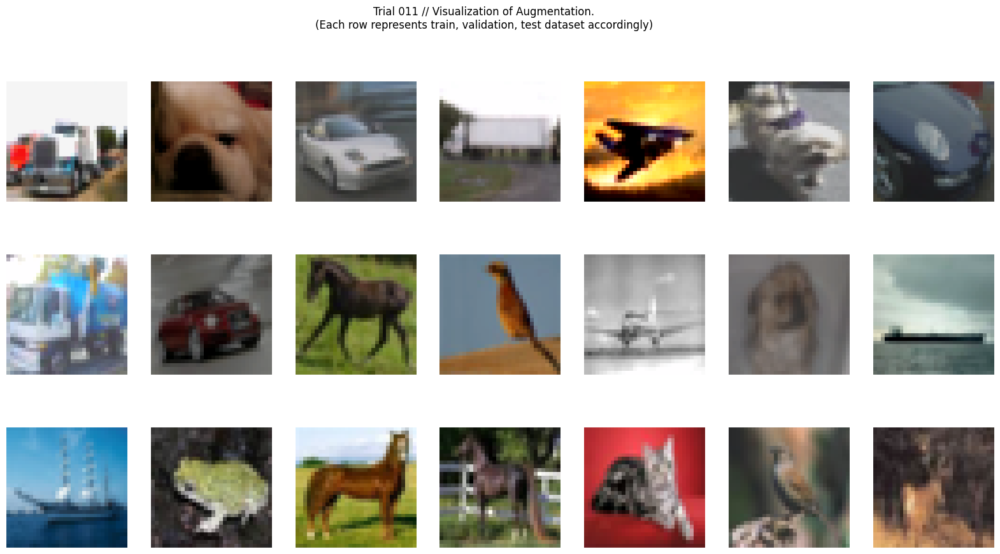

[ColorJitter(brightness=(0.5, 1.5), contrast=(0.5, 1.5), saturation=(0.5, 1.5), hue=None)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |

Train: [001] Loss: 2.052, Acc: 23.43% F1(macro): 0.23: 100%|██████████| 156/156 [00:10<00:00, 14.94it/s]
 Val:       Loss: 1.825, Acc: 33.85% F1(macro): 0.31: 100%|██████████| 40/40 [00:01<00:00, 22.04it/s]


Model saved. Current best test f1: 0.310


Train: [002] Loss: 1.662, Acc: 38.65% F1(macro): 0.38: 100%|██████████| 156/156 [00:10<00:00, 15.18it/s]
 Val:       Loss: 1.568, Acc: 42.26% F1(macro): 0.42: 100%|██████████| 40/40 [00:01<00:00, 21.97it/s]


Model saved. Current best test f1: 0.419


Train: [003] Loss: 1.519, Acc: 44.48% F1(macro): 0.44: 100%|██████████| 156/156 [00:10<00:00, 14.74it/s]
 Val:       Loss: 1.473, Acc: 46.03% F1(macro): 0.45: 100%|██████████| 40/40 [00:01<00:00, 21.89it/s]


Model saved. Current best test f1: 0.455


Train: [004] Loss: 1.425, Acc: 48.32% F1(macro): 0.48: 100%|██████████| 156/156 [00:10<00:00, 15.51it/s]
 Val:       Loss: 1.378, Acc: 49.38% F1(macro): 0.49: 100%|██████████| 40/40 [00:01<00:00, 21.97it/s]


Model saved. Current best test f1: 0.487


Train: [005] Loss: 1.335, Acc: 51.96% F1(macro): 0.52: 100%|██████████| 156/156 [00:10<00:00, 15.55it/s]
 Val:       Loss: 1.328, Acc: 51.51% F1(macro): 0.51: 100%|██████████| 40/40 [00:01<00:00, 21.61it/s]


Model saved. Current best test f1: 0.513


Train: [006] Loss: 1.260, Acc: 54.78% F1(macro): 0.54: 100%|██████████| 156/156 [00:10<00:00, 15.29it/s]
 Val:       Loss: 1.290, Acc: 52.74% F1(macro): 0.52: 100%|██████████| 40/40 [00:01<00:00, 21.75it/s]


Model saved. Current best test f1: 0.523


Train: [007] Loss: 1.194, Acc: 57.07% F1(macro): 0.57: 100%|██████████| 156/156 [00:10<00:00, 15.07it/s]
 Val:       Loss: 1.241, Acc: 55.89% F1(macro): 0.56: 100%|██████████| 40/40 [00:01<00:00, 20.10it/s]


Model saved. Current best test f1: 0.556


Train: [008] Loss: 1.120, Acc: 60.23% F1(macro): 0.60: 100%|██████████| 156/156 [00:10<00:00, 15.47it/s]
 Val:       Loss: 1.190, Acc: 57.97% F1(macro): 0.57: 100%|██████████| 40/40 [00:01<00:00, 21.90it/s]


Model saved. Current best test f1: 0.574


Train: [009] Loss: 1.064, Acc: 62.42% F1(macro): 0.62: 100%|██████████| 156/156 [00:10<00:00, 14.72it/s]
 Val:       Loss: 1.149, Acc: 58.96% F1(macro): 0.59: 100%|██████████| 40/40 [00:01<00:00, 21.92it/s]


Model saved. Current best test f1: 0.586


Train: [010] Loss: 1.011, Acc: 64.04% F1(macro): 0.64: 100%|██████████| 156/156 [00:10<00:00, 14.94it/s]
 Val:       Loss: 1.131, Acc: 60.14% F1(macro): 0.60: 100%|██████████| 40/40 [00:01<00:00, 20.76it/s]


Model saved. Current best test f1: 0.600
TEST DATASET


 Val:       Loss: 1.085, Acc: 61.45% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 39.30it/s]
[I 2021-11-22 04:52:46,691] Trial 11 finished with value: 0.6111355374346494 and parameters: {'aug_color_jitter': True, 'aug_random_perspective': False, 'aug_random_flip': False}. Best is trial 0 with value: 0.6301687075642395.


Files already downloaded and verified
Files already downloaded and verified


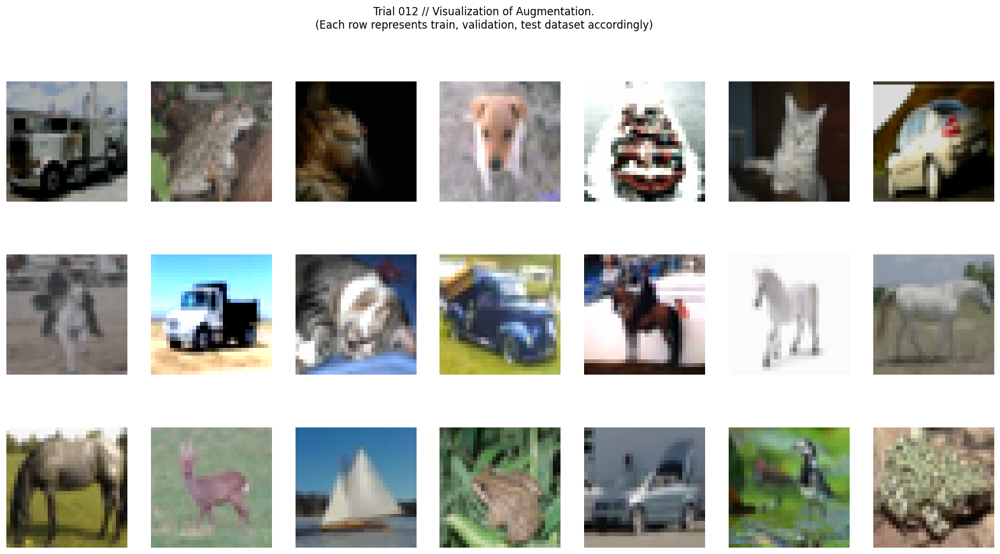

[ColorJitter(brightness=(0.5, 1.5), contrast=(0.5, 1.5), saturation=(0.5, 1.5), hue=None)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |

Train: [001] Loss: 2.053, Acc: 23.39% F1(macro): 0.23: 100%|██████████| 156/156 [00:10<00:00, 15.41it/s]
 Val:       Loss: 1.826, Acc: 33.44% F1(macro): 0.32: 100%|██████████| 40/40 [00:01<00:00, 22.31it/s]


Model saved. Current best test f1: 0.320


Train: [002] Loss: 1.696, Acc: 37.55% F1(macro): 0.37: 100%|██████████| 156/156 [00:10<00:00, 15.52it/s]
 Val:       Loss: 1.593, Acc: 42.08% F1(macro): 0.42: 100%|██████████| 40/40 [00:01<00:00, 20.74it/s]


Model saved. Current best test f1: 0.418


Train: [003] Loss: 1.542, Acc: 43.82% F1(macro): 0.43: 100%|██████████| 156/156 [00:10<00:00, 15.24it/s]
 Val:       Loss: 1.500, Acc: 45.43% F1(macro): 0.44: 100%|██████████| 40/40 [00:02<00:00, 19.68it/s]


Model saved. Current best test f1: 0.437


Train: [004] Loss: 1.427, Acc: 47.93% F1(macro): 0.48: 100%|██████████| 156/156 [00:10<00:00, 15.30it/s]
 Val:       Loss: 1.423, Acc: 48.79% F1(macro): 0.48: 100%|██████████| 40/40 [00:01<00:00, 21.48it/s]


Model saved. Current best test f1: 0.481


Train: [005] Loss: 1.340, Acc: 51.81% F1(macro): 0.52: 100%|██████████| 156/156 [00:10<00:00, 15.11it/s]
 Val:       Loss: 1.362, Acc: 50.35% F1(macro): 0.49: 100%|██████████| 40/40 [00:01<00:00, 21.17it/s]


Model saved. Current best test f1: 0.493


Train: [006] Loss: 1.264, Acc: 54.53% F1(macro): 0.54: 100%|██████████| 156/156 [00:10<00:00, 14.99it/s]
 Val:       Loss: 1.319, Acc: 52.95% F1(macro): 0.52: 100%|██████████| 40/40 [00:01<00:00, 21.28it/s]


Model saved. Current best test f1: 0.525


Train: [007] Loss: 1.190, Acc: 57.72% F1(macro): 0.58: 100%|██████████| 156/156 [00:10<00:00, 15.49it/s]
 Val:       Loss: 1.316, Acc: 53.86% F1(macro): 0.54: 100%|██████████| 40/40 [00:02<00:00, 19.57it/s]


Model saved. Current best test f1: 0.539


Train: [008] Loss: 1.121, Acc: 60.19% F1(macro): 0.60: 100%|██████████| 156/156 [00:10<00:00, 15.15it/s]
 Val:       Loss: 1.213, Acc: 57.38% F1(macro): 0.57: 100%|██████████| 40/40 [00:01<00:00, 21.30it/s]


Model saved. Current best test f1: 0.570


Train: [009] Loss: 1.063, Acc: 62.31% F1(macro): 0.62: 100%|██████████| 156/156 [00:10<00:00, 15.21it/s]
 Val:       Loss: 1.185, Acc: 57.99% F1(macro): 0.58: 100%|██████████| 40/40 [00:01<00:00, 22.02it/s]


Model saved. Current best test f1: 0.577


Train: [010] Loss: 1.006, Acc: 64.44% F1(macro): 0.64: 100%|██████████| 156/156 [00:10<00:00, 15.26it/s]
 Val:       Loss: 1.161, Acc: 59.20% F1(macro): 0.59: 100%|██████████| 40/40 [00:01<00:00, 21.32it/s]


Model saved. Current best test f1: 0.590
TEST DATASET


 Val:       Loss: 1.115, Acc: 60.85% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 39.35it/s]
[I 2021-11-22 04:55:03,157] Trial 12 finished with value: 0.6058731781080778 and parameters: {'aug_color_jitter': True, 'aug_random_perspective': False, 'aug_random_flip': False}. Best is trial 0 with value: 0.6301687075642395.


Files already downloaded and verified
Files already downloaded and verified


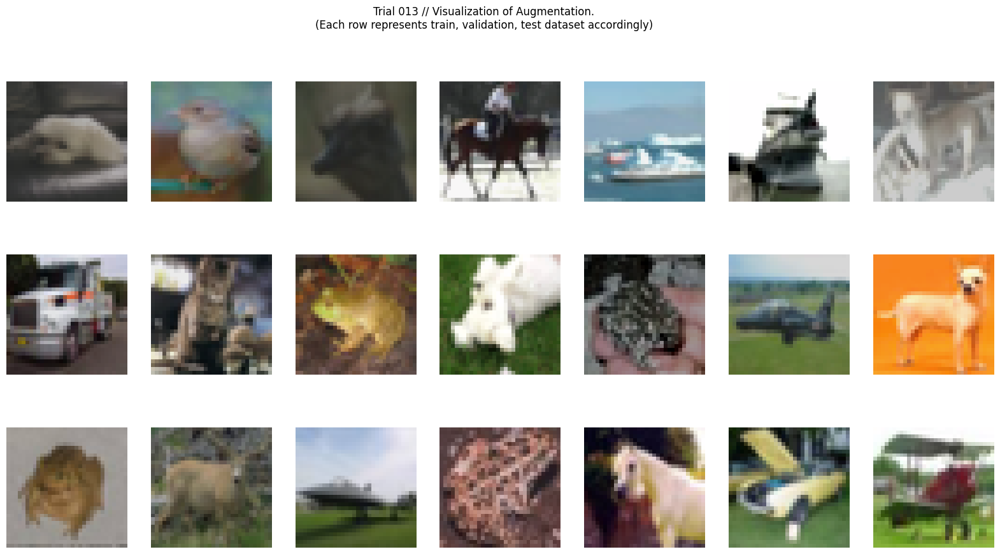

[ColorJitter(brightness=(0.5, 1.5), contrast=(0.5, 1.5), saturation=(0.5, 1.5), hue=None), RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     

Train: [001] Loss: 2.036, Acc: 23.68% F1(macro): 0.23: 100%|██████████| 156/156 [00:10<00:00, 15.50it/s]
 Val:       Loss: 1.880, Acc: 30.27% F1(macro): 0.27: 100%|██████████| 40/40 [00:01<00:00, 21.33it/s]


Model saved. Current best test f1: 0.269


Train: [002] Loss: 1.677, Acc: 37.64% F1(macro): 0.37: 100%|██████████| 156/156 [00:10<00:00, 15.25it/s]
 Val:       Loss: 1.616, Acc: 40.84% F1(macro): 0.39: 100%|██████████| 40/40 [00:01<00:00, 21.64it/s]


Model saved. Current best test f1: 0.394


Train: [003] Loss: 1.526, Acc: 44.25% F1(macro): 0.44: 100%|██████████| 156/156 [00:10<00:00, 15.32it/s]
 Val:       Loss: 1.547, Acc: 43.66% F1(macro): 0.43: 100%|██████████| 40/40 [00:01<00:00, 20.51it/s]


Model saved. Current best test f1: 0.429


Train: [004] Loss: 1.433, Acc: 48.04% F1(macro): 0.48: 100%|██████████| 156/156 [00:10<00:00, 15.41it/s]
 Val:       Loss: 1.407, Acc: 48.28% F1(macro): 0.48: 100%|██████████| 40/40 [00:01<00:00, 20.54it/s]


Model saved. Current best test f1: 0.478


Train: [005] Loss: 1.344, Acc: 51.24% F1(macro): 0.51: 100%|██████████| 156/156 [00:10<00:00, 15.21it/s]
 Val:       Loss: 1.325, Acc: 52.46% F1(macro): 0.52: 100%|██████████| 40/40 [00:01<00:00, 21.57it/s]


Model saved. Current best test f1: 0.525


Train: [006] Loss: 1.268, Acc: 54.34% F1(macro): 0.54: 100%|██████████| 156/156 [00:10<00:00, 14.86it/s]
 Val:       Loss: 1.261, Acc: 54.01% F1(macro): 0.54: 100%|██████████| 40/40 [00:01<00:00, 21.84it/s]


Model saved. Current best test f1: 0.541


Train: [007] Loss: 1.217, Acc: 56.34% F1(macro): 0.56: 100%|██████████| 156/156 [00:10<00:00, 15.40it/s]
 Val:       Loss: 1.236, Acc: 55.65% F1(macro): 0.56: 100%|██████████| 40/40 [00:01<00:00, 21.24it/s]


Model saved. Current best test f1: 0.560


Train: [008] Loss: 1.154, Acc: 58.69% F1(macro): 0.58: 100%|██████████| 156/156 [00:10<00:00, 14.62it/s]
 Val:       Loss: 1.207, Acc: 56.78% F1(macro): 0.57: 100%|██████████| 40/40 [00:01<00:00, 20.85it/s]


Model saved. Current best test f1: 0.571


Train: [009] Loss: 1.102, Acc: 60.58% F1(macro): 0.60: 100%|██████████| 156/156 [00:10<00:00, 15.43it/s]
 Val:       Loss: 1.143, Acc: 59.17% F1(macro): 0.59: 100%|██████████| 40/40 [00:01<00:00, 21.28it/s]


Model saved. Current best test f1: 0.588


Train: [010] Loss: 1.041, Acc: 62.72% F1(macro): 0.62: 100%|██████████| 156/156 [00:10<00:00, 15.40it/s]
 Val:       Loss: 1.099, Acc: 60.75% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 21.55it/s]


Model saved. Current best test f1: 0.607
TEST DATASET


 Val:       Loss: 1.057, Acc: 62.17% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 38.29it/s]
[I 2021-11-22 04:57:19,844] Trial 13 finished with value: 0.6197754965612733 and parameters: {'aug_color_jitter': True, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 0 with value: 0.6301687075642395.


Files already downloaded and verified
Files already downloaded and verified


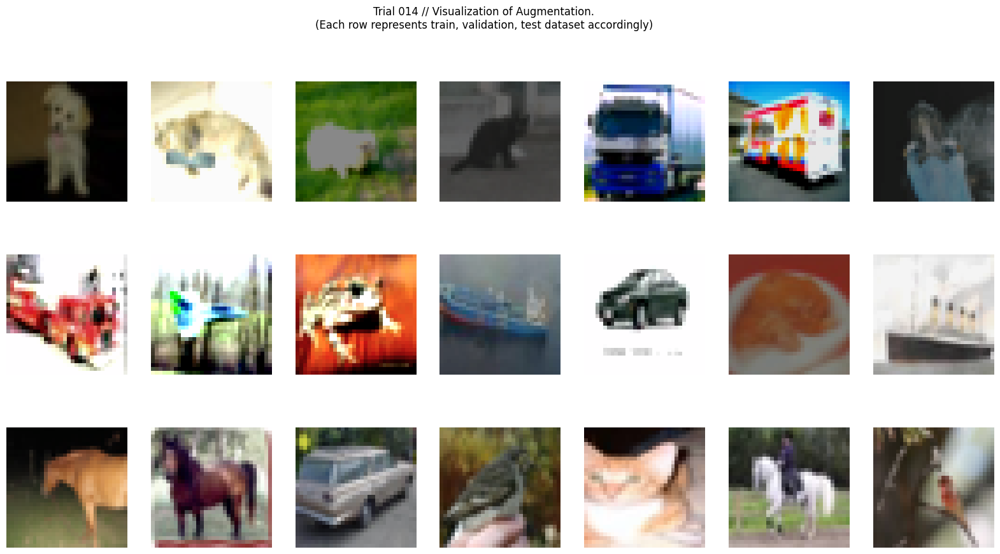

[ColorJitter(brightness=(0.5, 1.5), contrast=(0.5, 1.5), saturation=(0.5, 1.5), hue=None)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |

Train: [001] Loss: 2.138, Acc: 20.93% F1(macro): 0.21: 100%|██████████| 156/156 [00:10<00:00, 15.13it/s]
 Val:       Loss: 1.865, Acc: 31.48% F1(macro): 0.29: 100%|██████████| 40/40 [00:01<00:00, 21.29it/s]


Model saved. Current best test f1: 0.287


Train: [002] Loss: 1.715, Acc: 37.13% F1(macro): 0.37: 100%|██████████| 156/156 [00:10<00:00, 15.49it/s]
 Val:       Loss: 1.621, Acc: 41.31% F1(macro): 0.41: 100%|██████████| 40/40 [00:01<00:00, 21.76it/s]


Model saved. Current best test f1: 0.409


Train: [003] Loss: 1.561, Acc: 43.07% F1(macro): 0.43: 100%|██████████| 156/156 [00:10<00:00, 15.36it/s]
 Val:       Loss: 1.558, Acc: 43.22% F1(macro): 0.43: 100%|██████████| 40/40 [00:01<00:00, 21.94it/s]


Model saved. Current best test f1: 0.427


Train: [004] Loss: 1.478, Acc: 46.46% F1(macro): 0.46: 100%|██████████| 156/156 [00:10<00:00, 15.55it/s]
 Val:       Loss: 1.439, Acc: 48.55% F1(macro): 0.48: 100%|██████████| 40/40 [00:01<00:00, 21.95it/s]


Model saved. Current best test f1: 0.480


Train: [005] Loss: 1.381, Acc: 49.87% F1(macro): 0.49: 100%|██████████| 156/156 [00:10<00:00, 15.50it/s]
 Val:       Loss: 1.376, Acc: 50.57% F1(macro): 0.50: 100%|██████████| 40/40 [00:01<00:00, 21.82it/s]


Model saved. Current best test f1: 0.503


Train: [006] Loss: 1.303, Acc: 52.96% F1(macro): 0.53: 100%|██████████| 156/156 [00:10<00:00, 15.50it/s]
 Val:       Loss: 1.315, Acc: 52.80% F1(macro): 0.53: 100%|██████████| 40/40 [00:01<00:00, 22.20it/s]


Model saved. Current best test f1: 0.526


Train: [007] Loss: 1.240, Acc: 55.54% F1(macro): 0.55: 100%|██████████| 156/156 [00:10<00:00, 15.28it/s]
 Val:       Loss: 1.273, Acc: 54.70% F1(macro): 0.55: 100%|██████████| 40/40 [00:01<00:00, 22.05it/s]


Model saved. Current best test f1: 0.546


Train: [008] Loss: 1.177, Acc: 57.95% F1(macro): 0.58: 100%|██████████| 156/156 [00:10<00:00, 15.31it/s]
 Val:       Loss: 1.257, Acc: 55.35% F1(macro): 0.54: 100%|██████████| 40/40 [00:01<00:00, 21.74it/s]
Train: [009] Loss: 1.121, Acc: 60.11% F1(macro): 0.60: 100%|██████████| 156/156 [00:10<00:00, 15.52it/s]
 Val:       Loss: 1.212, Acc: 57.09% F1(macro): 0.57: 100%|██████████| 40/40 [00:01<00:00, 21.52it/s]


Model saved. Current best test f1: 0.567


Train: [010] Loss: 1.073, Acc: 62.02% F1(macro): 0.62: 100%|██████████| 156/156 [00:10<00:00, 14.81it/s]
 Val:       Loss: 1.236, Acc: 56.62% F1(macro): 0.56: 100%|██████████| 40/40 [00:01<00:00, 21.87it/s]


TEST DATASET


 Val:       Loss: 1.165, Acc: 58.16% F1(macro): 0.57: 100%|██████████| 40/40 [00:01<00:00, 36.47it/s]
[I 2021-11-22 04:59:33,564] Trial 14 finished with value: 0.5737424147579289 and parameters: {'aug_color_jitter': True, 'aug_random_perspective': False, 'aug_random_flip': False}. Best is trial 0 with value: 0.6301687075642395.


Files already downloaded and verified
Files already downloaded and verified


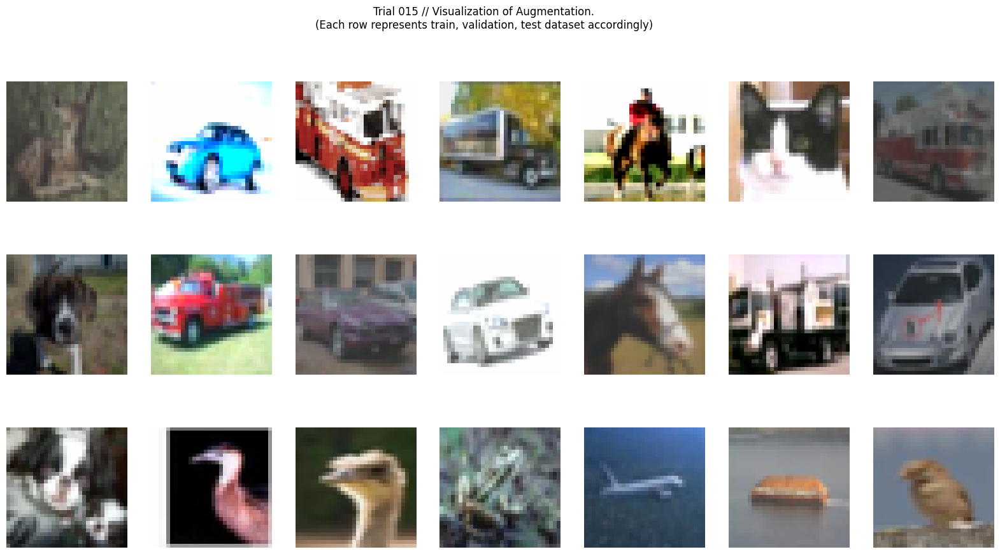

[ColorJitter(brightness=(0.5, 1.5), contrast=(0.5, 1.5), saturation=(0.5, 1.5), hue=None), RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     

Train: [001] Loss: 2.093, Acc: 21.99% F1(macro): 0.22: 100%|██████████| 156/156 [00:10<00:00, 15.34it/s]
 Val:       Loss: 1.870, Acc: 32.77% F1(macro): 0.32: 100%|██████████| 40/40 [00:01<00:00, 20.43it/s]


Model saved. Current best test f1: 0.320


Train: [002] Loss: 1.695, Acc: 37.83% F1(macro): 0.37: 100%|██████████| 156/156 [00:09<00:00, 15.60it/s]
 Val:       Loss: 1.589, Acc: 42.59% F1(macro): 0.42: 100%|██████████| 40/40 [00:01<00:00, 21.05it/s]


Model saved. Current best test f1: 0.417


Train: [003] Loss: 1.520, Acc: 44.99% F1(macro): 0.45: 100%|██████████| 156/156 [00:10<00:00, 15.42it/s]
 Val:       Loss: 1.483, Acc: 47.07% F1(macro): 0.46: 100%|██████████| 40/40 [00:01<00:00, 21.19it/s]


Model saved. Current best test f1: 0.463


Train: [004] Loss: 1.397, Acc: 49.81% F1(macro): 0.49: 100%|██████████| 156/156 [00:10<00:00, 15.57it/s]
 Val:       Loss: 1.362, Acc: 51.32% F1(macro): 0.51: 100%|██████████| 40/40 [00:01<00:00, 21.61it/s]


Model saved. Current best test f1: 0.510


Train: [005] Loss: 1.319, Acc: 53.03% F1(macro): 0.53: 100%|██████████| 156/156 [00:10<00:00, 15.56it/s]
 Val:       Loss: 1.331, Acc: 52.55% F1(macro): 0.53: 100%|██████████| 40/40 [00:01<00:00, 21.06it/s]


Model saved. Current best test f1: 0.526


Train: [006] Loss: 1.239, Acc: 55.71% F1(macro): 0.56: 100%|██████████| 156/156 [00:10<00:00, 15.06it/s]
 Val:       Loss: 1.254, Acc: 55.16% F1(macro): 0.55: 100%|██████████| 40/40 [00:01<00:00, 21.66it/s]


Model saved. Current best test f1: 0.549


Train: [007] Loss: 1.172, Acc: 58.52% F1(macro): 0.58: 100%|██████████| 156/156 [00:10<00:00, 15.08it/s]
 Val:       Loss: 1.227, Acc: 57.37% F1(macro): 0.57: 100%|██████████| 40/40 [00:01<00:00, 21.45it/s]


Model saved. Current best test f1: 0.566


Train: [008] Loss: 1.126, Acc: 59.97% F1(macro): 0.60: 100%|██████████| 156/156 [00:10<00:00, 15.42it/s]
 Val:       Loss: 1.132, Acc: 59.70% F1(macro): 0.60: 100%|██████████| 40/40 [00:01<00:00, 20.35it/s]


Model saved. Current best test f1: 0.596


Train: [009] Loss: 1.067, Acc: 62.05% F1(macro): 0.62: 100%|██████████| 156/156 [00:09<00:00, 15.70it/s]
 Val:       Loss: 1.127, Acc: 60.33% F1(macro): 0.60: 100%|██████████| 40/40 [00:02<00:00, 19.99it/s]


Model saved. Current best test f1: 0.601


Train: [010] Loss: 1.032, Acc: 62.97% F1(macro): 0.63: 100%|██████████| 156/156 [00:10<00:00, 15.27it/s]
 Val:       Loss: 1.126, Acc: 60.81% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 20.43it/s]


Model saved. Current best test f1: 0.607
TEST DATASET


 Val:       Loss: 1.052, Acc: 62.29% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 35.88it/s]
[I 2021-11-22 05:01:49,667] Trial 15 finished with value: 0.6206911219982413 and parameters: {'aug_color_jitter': True, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 0 with value: 0.6301687075642395.


Files already downloaded and verified
Files already downloaded and verified


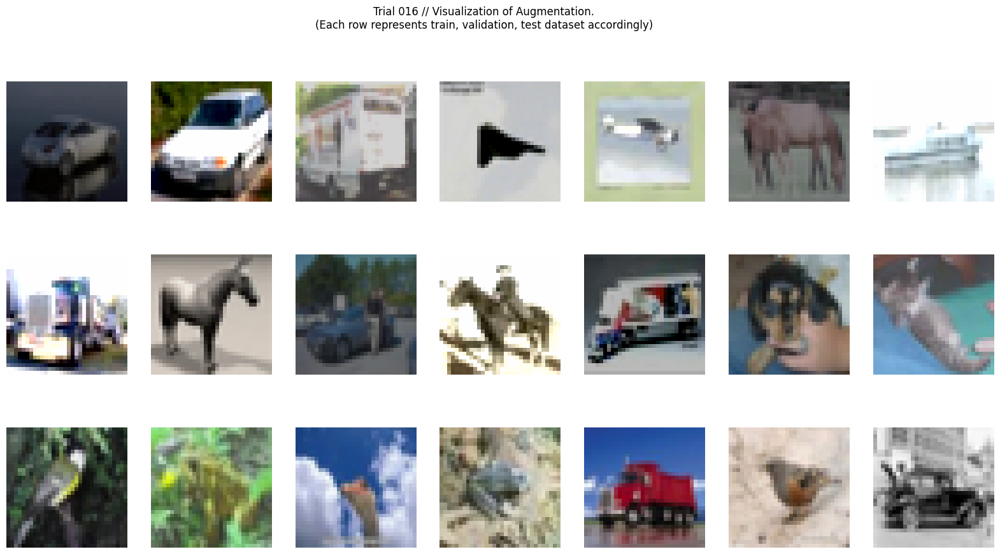

[ColorJitter(brightness=(0.5, 1.5), contrast=(0.5, 1.5), saturation=(0.5, 1.5), hue=None), RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     

Train: [001] Loss: 2.040, Acc: 23.46% F1(macro): 0.23: 100%|██████████| 156/156 [00:10<00:00, 15.43it/s]
 Val:       Loss: 1.877, Acc: 34.38% F1(macro): 0.33: 100%|██████████| 40/40 [00:01<00:00, 21.45it/s]


Model saved. Current best test f1: 0.326


Train: [002] Loss: 1.643, Acc: 39.46% F1(macro): 0.39: 100%|██████████| 156/156 [00:10<00:00, 14.93it/s]
 Val:       Loss: 1.550, Acc: 42.62% F1(macro): 0.41: 100%|██████████| 40/40 [00:01<00:00, 21.18it/s]


Model saved. Current best test f1: 0.405


Train: [003] Loss: 1.490, Acc: 45.81% F1(macro): 0.45: 100%|██████████| 156/156 [00:10<00:00, 15.04it/s]
 Val:       Loss: 1.479, Acc: 46.55% F1(macro): 0.46: 100%|██████████| 40/40 [00:02<00:00, 18.49it/s]


Model saved. Current best test f1: 0.459


Train: [004] Loss: 1.397, Acc: 49.47% F1(macro): 0.49: 100%|██████████| 156/156 [00:10<00:00, 15.41it/s]
 Val:       Loss: 1.351, Acc: 50.84% F1(macro): 0.51: 100%|██████████| 40/40 [00:01<00:00, 20.90it/s]


Model saved. Current best test f1: 0.505


Train: [005] Loss: 1.319, Acc: 52.65% F1(macro): 0.52: 100%|██████████| 156/156 [00:10<00:00, 15.01it/s]
 Val:       Loss: 1.334, Acc: 52.50% F1(macro): 0.52: 100%|██████████| 40/40 [00:01<00:00, 21.66it/s]


Model saved. Current best test f1: 0.520


Train: [006] Loss: 1.246, Acc: 55.25% F1(macro): 0.55: 100%|██████████| 156/156 [00:10<00:00, 15.33it/s]
 Val:       Loss: 1.276, Acc: 53.97% F1(macro): 0.53: 100%|██████████| 40/40 [00:01<00:00, 20.86it/s]


Model saved. Current best test f1: 0.533


Train: [007] Loss: 1.188, Acc: 57.50% F1(macro): 0.57: 100%|██████████| 156/156 [00:10<00:00, 15.48it/s]
 Val:       Loss: 1.186, Acc: 57.82% F1(macro): 0.57: 100%|██████████| 40/40 [00:01<00:00, 20.56it/s]


Model saved. Current best test f1: 0.575


Train: [008] Loss: 1.120, Acc: 60.00% F1(macro): 0.60: 100%|██████████| 156/156 [00:10<00:00, 15.06it/s]
 Val:       Loss: 1.195, Acc: 57.77% F1(macro): 0.58: 100%|██████████| 40/40 [00:01<00:00, 21.55it/s]


Model saved. Current best test f1: 0.576


Train: [009] Loss: 1.073, Acc: 61.86% F1(macro): 0.62: 100%|██████████| 156/156 [00:10<00:00, 15.21it/s]
 Val:       Loss: 1.134, Acc: 59.89% F1(macro): 0.60: 100%|██████████| 40/40 [00:01<00:00, 20.99it/s]


Model saved. Current best test f1: 0.600


Train: [010] Loss: 1.032, Acc: 63.35% F1(macro): 0.63: 100%|██████████| 156/156 [00:10<00:00, 15.10it/s]
 Val:       Loss: 1.105, Acc: 60.73% F1(macro): 0.60: 100%|██████████| 40/40 [00:02<00:00, 18.51it/s]


Model saved. Current best test f1: 0.603
TEST DATASET


 Val:       Loss: 1.041, Acc: 63.04% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 37.30it/s]
[I 2021-11-22 05:04:07,377] Trial 16 finished with value: 0.6246897138991934 and parameters: {'aug_color_jitter': True, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 0 with value: 0.6301687075642395.


Files already downloaded and verified
Files already downloaded and verified


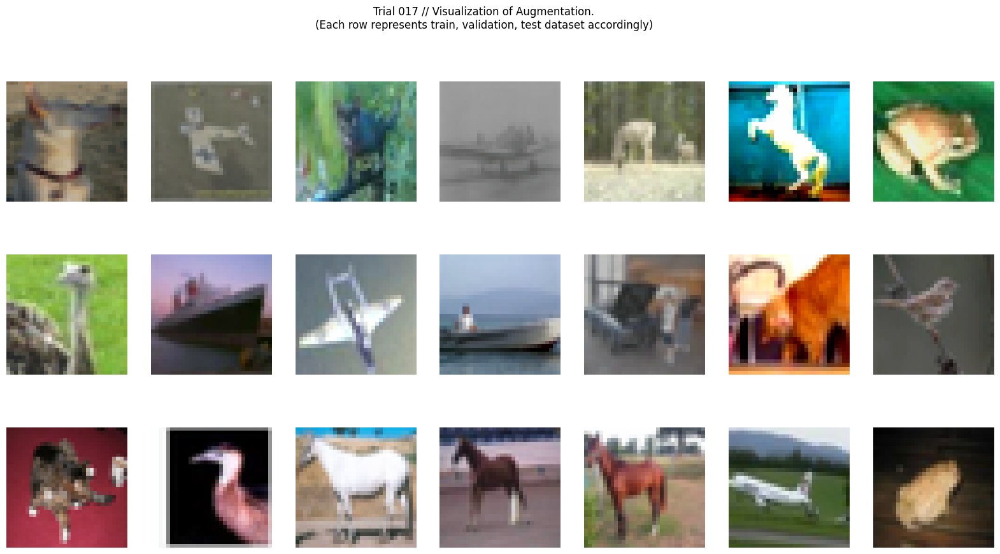

[ColorJitter(brightness=(0.5, 1.5), contrast=(0.5, 1.5), saturation=(0.5, 1.5), hue=None), RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     

Train: [001] Loss: 2.057, Acc: 23.18% F1(macro): 0.23: 100%|██████████| 156/156 [00:10<00:00, 15.32it/s]
 Val:       Loss: 1.860, Acc: 32.79% F1(macro): 0.30: 100%|██████████| 40/40 [00:01<00:00, 21.32it/s]


Model saved. Current best test f1: 0.303


Train: [002] Loss: 1.713, Acc: 36.96% F1(macro): 0.36: 100%|██████████| 156/156 [00:10<00:00, 15.28it/s]
 Val:       Loss: 1.631, Acc: 40.34% F1(macro): 0.39: 100%|██████████| 40/40 [00:01<00:00, 21.48it/s]


Model saved. Current best test f1: 0.388


Train: [003] Loss: 1.550, Acc: 43.64% F1(macro): 0.43: 100%|██████████| 156/156 [00:10<00:00, 15.39it/s]
 Val:       Loss: 1.483, Acc: 46.20% F1(macro): 0.46: 100%|██████████| 40/40 [00:01<00:00, 20.99it/s]


Model saved. Current best test f1: 0.458


Train: [004] Loss: 1.458, Acc: 46.67% F1(macro): 0.46: 100%|██████████| 156/156 [00:10<00:00, 15.34it/s]
 Val:       Loss: 1.434, Acc: 47.62% F1(macro): 0.48: 100%|██████████| 40/40 [00:01<00:00, 20.97it/s]


Model saved. Current best test f1: 0.475


Train: [005] Loss: 1.371, Acc: 50.41% F1(macro): 0.50: 100%|██████████| 156/156 [00:10<00:00, 15.30it/s]
 Val:       Loss: 1.353, Acc: 51.01% F1(macro): 0.50: 100%|██████████| 40/40 [00:01<00:00, 21.23it/s]


Model saved. Current best test f1: 0.499


Train: [006] Loss: 1.304, Acc: 53.18% F1(macro): 0.53: 100%|██████████| 156/156 [00:10<00:00, 15.32it/s]
 Val:       Loss: 1.310, Acc: 53.07% F1(macro): 0.53: 100%|██████████| 40/40 [00:01<00:00, 20.28it/s]


Model saved. Current best test f1: 0.531


Train: [007] Loss: 1.236, Acc: 55.39% F1(macro): 0.55: 100%|██████████| 156/156 [00:10<00:00, 14.68it/s]
 Val:       Loss: 1.232, Acc: 55.38% F1(macro): 0.55: 100%|██████████| 40/40 [00:02<00:00, 19.48it/s]


Model saved. Current best test f1: 0.548


Train: [008] Loss: 1.178, Acc: 57.80% F1(macro): 0.58: 100%|██████████| 156/156 [00:10<00:00, 15.35it/s]
 Val:       Loss: 1.171, Acc: 57.72% F1(macro): 0.58: 100%|██████████| 40/40 [00:02<00:00, 19.80it/s]


Model saved. Current best test f1: 0.577


Train: [009] Loss: 1.140, Acc: 59.39% F1(macro): 0.59: 100%|██████████| 156/156 [00:10<00:00, 15.37it/s]
 Val:       Loss: 1.169, Acc: 58.35% F1(macro): 0.58: 100%|██████████| 40/40 [00:01<00:00, 21.66it/s]


Model saved. Current best test f1: 0.581


Train: [010] Loss: 1.087, Acc: 61.24% F1(macro): 0.61: 100%|██████████| 156/156 [00:10<00:00, 14.97it/s]
 Val:       Loss: 1.132, Acc: 60.36% F1(macro): 0.60: 100%|██████████| 40/40 [00:01<00:00, 21.61it/s]


Model saved. Current best test f1: 0.600
TEST DATASET


 Val:       Loss: 1.063, Acc: 62.26% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 38.16it/s]
[I 2021-11-22 05:06:25,145] Trial 17 finished with value: 0.6178540592478556 and parameters: {'aug_color_jitter': True, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 0 with value: 0.6301687075642395.


Files already downloaded and verified
Files already downloaded and verified


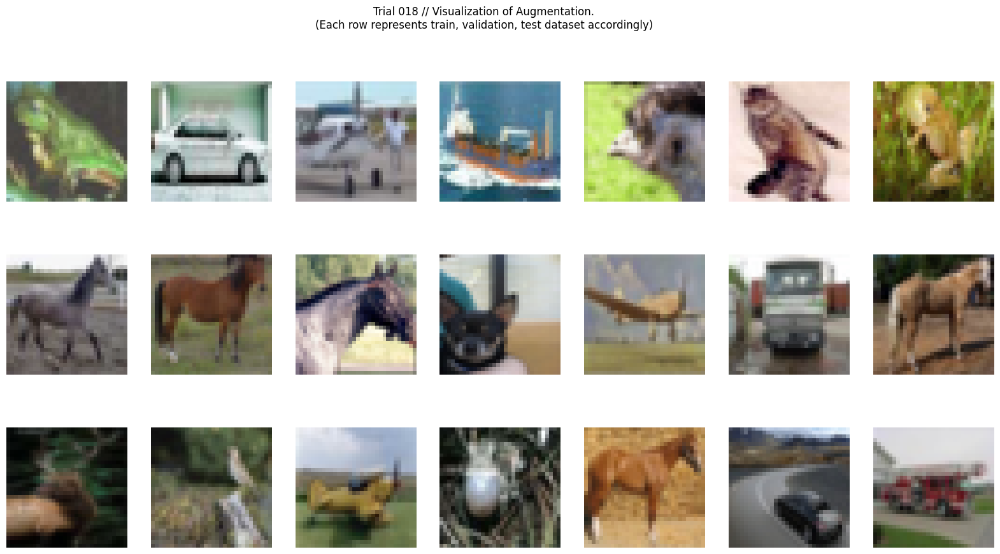

[RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |

Train: [001] Loss: 1.932, Acc: 27.72% F1(macro): 0.27: 100%|██████████| 156/156 [00:09<00:00, 15.72it/s]
 Val:       Loss: 1.634, Acc: 40.02% F1(macro): 0.38: 100%|██████████| 40/40 [00:01<00:00, 35.61it/s]


Model saved. Current best test f1: 0.385


Train: [002] Loss: 1.525, Acc: 44.01% F1(macro): 0.43: 100%|██████████| 156/156 [00:09<00:00, 15.62it/s]
 Val:       Loss: 1.456, Acc: 46.25% F1(macro): 0.45: 100%|██████████| 40/40 [00:01<00:00, 37.57it/s]


Model saved. Current best test f1: 0.454


Train: [003] Loss: 1.371, Acc: 50.45% F1(macro): 0.50: 100%|██████████| 156/156 [00:09<00:00, 15.61it/s]
 Val:       Loss: 1.313, Acc: 52.38% F1(macro): 0.52: 100%|██████████| 40/40 [00:01<00:00, 38.60it/s]


Model saved. Current best test f1: 0.520


Train: [004] Loss: 1.267, Acc: 53.94% F1(macro): 0.54: 100%|██████████| 156/156 [00:10<00:00, 15.49it/s]
 Val:       Loss: 1.313, Acc: 52.26% F1(macro): 0.51: 100%|██████████| 40/40 [00:01<00:00, 37.66it/s]
Train: [005] Loss: 1.184, Acc: 57.35% F1(macro): 0.57: 100%|██████████| 156/156 [00:09<00:00, 15.68it/s]
 Val:       Loss: 1.249, Acc: 55.45% F1(macro): 0.55: 100%|██████████| 40/40 [00:01<00:00, 37.49it/s]


Model saved. Current best test f1: 0.549


Train: [006] Loss: 1.116, Acc: 59.79% F1(macro): 0.60: 100%|██████████| 156/156 [00:10<00:00, 15.37it/s]
 Val:       Loss: 1.176, Acc: 57.39% F1(macro): 0.57: 100%|██████████| 40/40 [00:01<00:00, 35.10it/s]


Model saved. Current best test f1: 0.573


Train: [007] Loss: 1.057, Acc: 62.24% F1(macro): 0.62: 100%|██████████| 156/156 [00:10<00:00, 15.58it/s]
 Val:       Loss: 1.161, Acc: 58.65% F1(macro): 0.58: 100%|██████████| 40/40 [00:01<00:00, 37.89it/s]


Model saved. Current best test f1: 0.582


Train: [008] Loss: 1.008, Acc: 64.09% F1(macro): 0.64: 100%|██████████| 156/156 [00:10<00:00, 15.39it/s]
 Val:       Loss: 1.125, Acc: 59.92% F1(macro): 0.60: 100%|██████████| 40/40 [00:01<00:00, 35.31it/s]


Model saved. Current best test f1: 0.596


Train: [009] Loss: 0.970, Acc: 65.30% F1(macro): 0.65: 100%|██████████| 156/156 [00:09<00:00, 15.70it/s]
 Val:       Loss: 1.094, Acc: 61.44% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 37.57it/s]


Model saved. Current best test f1: 0.609


Train: [010] Loss: 0.928, Acc: 66.99% F1(macro): 0.67: 100%|██████████| 156/156 [00:10<00:00, 15.45it/s]
 Val:       Loss: 1.040, Acc: 62.86% F1(macro): 0.63: 100%|██████████| 40/40 [00:01<00:00, 36.32it/s]


Model saved. Current best test f1: 0.629
TEST DATASET


 Val:       Loss: 1.054, Acc: 63.01% F1(macro): 0.63: 100%|██████████| 40/40 [00:01<00:00, 38.35it/s]
[I 2021-11-22 05:08:30,849] Trial 18 finished with value: 0.6289029728967765 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 0 with value: 0.6301687075642395.


Files already downloaded and verified
Files already downloaded and verified


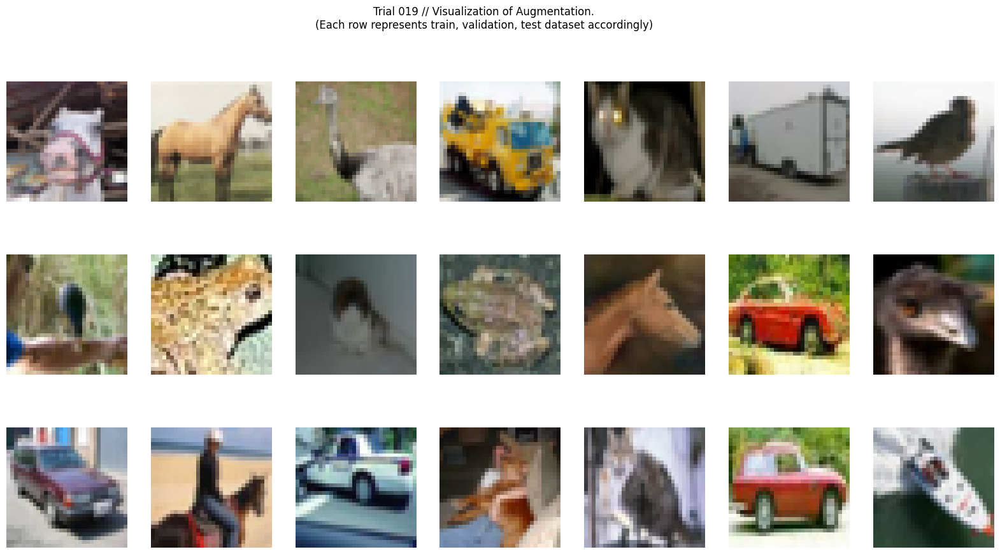

[RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |

Train: [001] Loss: 1.907, Acc: 29.26% F1(macro): 0.29: 100%|██████████| 156/156 [00:10<00:00, 15.34it/s]
 Val:       Loss: 1.615, Acc: 40.70% F1(macro): 0.39: 100%|██████████| 40/40 [00:01<00:00, 36.52it/s]


Model saved. Current best test f1: 0.394


Train: [002] Loss: 1.501, Acc: 44.55% F1(macro): 0.44: 100%|██████████| 156/156 [00:09<00:00, 15.63it/s]
 Val:       Loss: 1.429, Acc: 47.75% F1(macro): 0.47: 100%|██████████| 40/40 [00:01<00:00, 36.77it/s]


Model saved. Current best test f1: 0.471


Train: [003] Loss: 1.362, Acc: 50.12% F1(macro): 0.50: 100%|██████████| 156/156 [00:10<00:00, 15.33it/s]
 Val:       Loss: 1.355, Acc: 50.81% F1(macro): 0.51: 100%|██████████| 40/40 [00:01<00:00, 36.36it/s]


Model saved. Current best test f1: 0.507


Train: [004] Loss: 1.257, Acc: 54.24% F1(macro): 0.54: 100%|██████████| 156/156 [00:09<00:00, 15.60it/s]
 Val:       Loss: 1.273, Acc: 53.62% F1(macro): 0.53: 100%|██████████| 40/40 [00:01<00:00, 35.96it/s]


Model saved. Current best test f1: 0.535


Train: [005] Loss: 1.180, Acc: 57.67% F1(macro): 0.58: 100%|██████████| 156/156 [00:10<00:00, 15.14it/s]
 Val:       Loss: 1.236, Acc: 54.91% F1(macro): 0.55: 100%|██████████| 40/40 [00:01<00:00, 37.36it/s]


Model saved. Current best test f1: 0.551


Train: [006] Loss: 1.118, Acc: 59.80% F1(macro): 0.60: 100%|██████████| 156/156 [00:09<00:00, 15.70it/s]
 Val:       Loss: 1.182, Acc: 57.77% F1(macro): 0.57: 100%|██████████| 40/40 [00:01<00:00, 35.27it/s]


Model saved. Current best test f1: 0.574


Train: [007] Loss: 1.062, Acc: 61.99% F1(macro): 0.62: 100%|██████████| 156/156 [00:10<00:00, 15.59it/s]
 Val:       Loss: 1.138, Acc: 58.72% F1(macro): 0.59: 100%|██████████| 40/40 [00:01<00:00, 34.39it/s]


Model saved. Current best test f1: 0.587


Train: [008] Loss: 1.012, Acc: 63.68% F1(macro): 0.64: 100%|██████████| 156/156 [00:10<00:00, 15.25it/s]
 Val:       Loss: 1.110, Acc: 60.65% F1(macro): 0.60: 100%|██████████| 40/40 [00:01<00:00, 36.46it/s]


Model saved. Current best test f1: 0.602


Train: [009] Loss: 0.971, Acc: 65.22% F1(macro): 0.65: 100%|██████████| 156/156 [00:09<00:00, 15.67it/s]
 Val:       Loss: 1.086, Acc: 60.85% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 39.18it/s]


Model saved. Current best test f1: 0.607


Train: [010] Loss: 0.921, Acc: 67.23% F1(macro): 0.67: 100%|██████████| 156/156 [00:10<00:00, 15.59it/s]
 Val:       Loss: 1.074, Acc: 61.92% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 37.40it/s]


Model saved. Current best test f1: 0.619
TEST DATASET


 Val:       Loss: 1.068, Acc: 61.79% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 37.49it/s]
[I 2021-11-22 05:10:38,011] Trial 19 finished with value: 0.6177686974914887 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 0 with value: 0.6301687075642395.


Files already downloaded and verified
Files already downloaded and verified


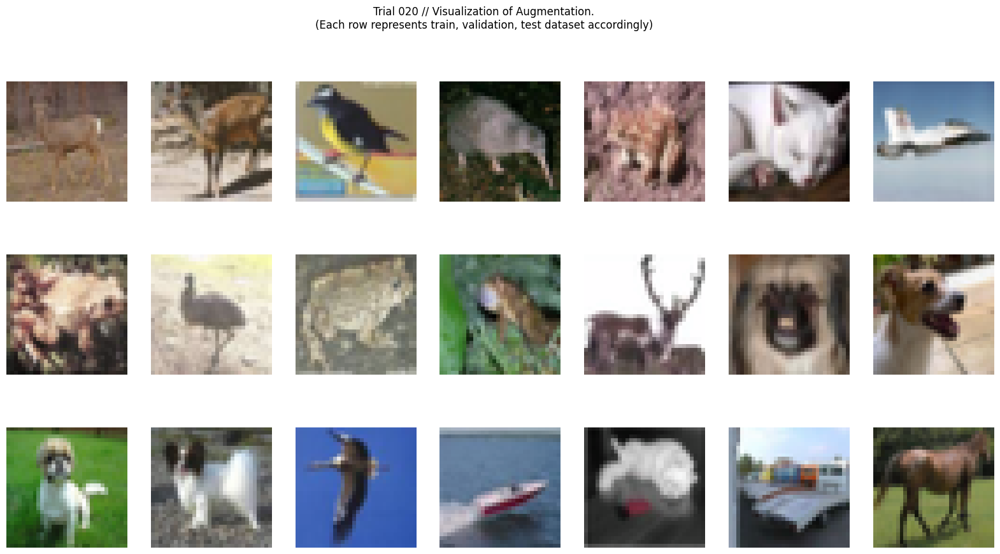

[RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |

Train: [001] Loss: 1.900, Acc: 29.25% F1(macro): 0.29: 100%|██████████| 156/156 [00:10<00:00, 15.25it/s]
 Val:       Loss: 1.665, Acc: 38.87% F1(macro): 0.38: 100%|██████████| 40/40 [00:01<00:00, 36.21it/s]


Model saved. Current best test f1: 0.377


Train: [002] Loss: 1.508, Acc: 44.81% F1(macro): 0.44: 100%|██████████| 156/156 [00:09<00:00, 15.63it/s]
 Val:       Loss: 1.457, Acc: 46.76% F1(macro): 0.47: 100%|██████████| 40/40 [00:01<00:00, 36.53it/s]


Model saved. Current best test f1: 0.468


Train: [003] Loss: 1.371, Acc: 50.23% F1(macro): 0.50: 100%|██████████| 156/156 [00:10<00:00, 15.44it/s]
 Val:       Loss: 1.348, Acc: 50.71% F1(macro): 0.51: 100%|██████████| 40/40 [00:01<00:00, 36.58it/s]


Model saved. Current best test f1: 0.509


Train: [004] Loss: 1.264, Acc: 54.71% F1(macro): 0.54: 100%|██████████| 156/156 [00:09<00:00, 15.67it/s]
 Val:       Loss: 1.306, Acc: 52.12% F1(macro): 0.52: 100%|██████████| 40/40 [00:01<00:00, 37.04it/s]


Model saved. Current best test f1: 0.521


Train: [005] Loss: 1.186, Acc: 57.51% F1(macro): 0.57: 100%|██████████| 156/156 [00:10<00:00, 15.52it/s]
 Val:       Loss: 1.233, Acc: 55.20% F1(macro): 0.55: 100%|██████████| 40/40 [00:01<00:00, 34.88it/s]


Model saved. Current best test f1: 0.550


Train: [006] Loss: 1.117, Acc: 60.25% F1(macro): 0.60: 100%|██████████| 156/156 [00:10<00:00, 15.21it/s]
 Val:       Loss: 1.170, Acc: 57.64% F1(macro): 0.58: 100%|██████████| 40/40 [00:01<00:00, 38.04it/s]


Model saved. Current best test f1: 0.575


Train: [007] Loss: 1.051, Acc: 62.40% F1(macro): 0.62: 100%|██████████| 156/156 [00:10<00:00, 15.31it/s]
 Val:       Loss: 1.116, Acc: 59.89% F1(macro): 0.60: 100%|██████████| 40/40 [00:01<00:00, 36.39it/s]


Model saved. Current best test f1: 0.599


Train: [008] Loss: 1.010, Acc: 64.07% F1(macro): 0.64: 100%|██████████| 156/156 [00:09<00:00, 15.89it/s]
 Val:       Loss: 1.089, Acc: 60.86% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 36.53it/s]


Model saved. Current best test f1: 0.606


Train: [009] Loss: 0.960, Acc: 65.65% F1(macro): 0.66: 100%|██████████| 156/156 [00:09<00:00, 15.63it/s]
 Val:       Loss: 1.059, Acc: 62.15% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 37.41it/s]


Model saved. Current best test f1: 0.622


Train: [010] Loss: 0.922, Acc: 67.29% F1(macro): 0.67: 100%|██████████| 156/156 [00:10<00:00, 15.54it/s]
 Val:       Loss: 1.075, Acc: 61.83% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 34.75it/s]


TEST DATASET


 Val:       Loss: 1.089, Acc: 61.52% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 35.35it/s]
[I 2021-11-22 05:12:44,334] Trial 20 finished with value: 0.6098994599757634 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 0 with value: 0.6301687075642395.


Files already downloaded and verified
Files already downloaded and verified


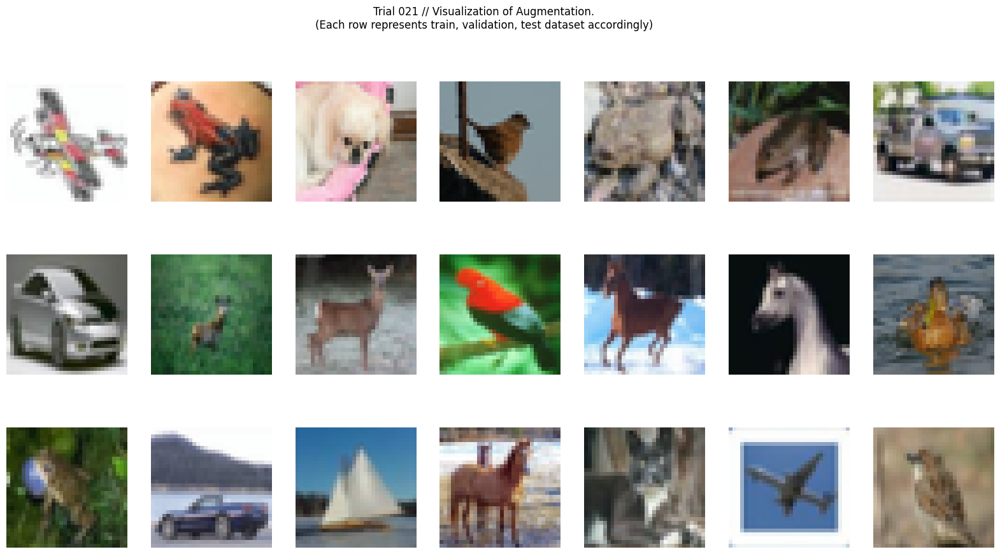

[RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |

Train: [001] Loss: 1.924, Acc: 28.46% F1(macro): 0.28: 100%|██████████| 156/156 [00:10<00:00, 15.00it/s]
 Val:       Loss: 1.608, Acc: 40.55% F1(macro): 0.38: 100%|██████████| 40/40 [00:01<00:00, 37.76it/s]


Model saved. Current best test f1: 0.385


Train: [002] Loss: 1.505, Acc: 44.67% F1(macro): 0.44: 100%|██████████| 156/156 [00:09<00:00, 15.68it/s]
 Val:       Loss: 1.425, Acc: 47.71% F1(macro): 0.47: 100%|██████████| 40/40 [00:01<00:00, 35.77it/s]


Model saved. Current best test f1: 0.465


Train: [003] Loss: 1.346, Acc: 51.33% F1(macro): 0.51: 100%|██████████| 156/156 [00:09<00:00, 15.66it/s]
 Val:       Loss: 1.330, Acc: 51.76% F1(macro): 0.51: 100%|██████████| 40/40 [00:01<00:00, 37.29it/s]


Model saved. Current best test f1: 0.512


Train: [004] Loss: 1.229, Acc: 55.83% F1(macro): 0.56: 100%|██████████| 156/156 [00:10<00:00, 15.36it/s]
 Val:       Loss: 1.258, Acc: 55.25% F1(macro): 0.55: 100%|██████████| 40/40 [00:01<00:00, 36.33it/s]


Model saved. Current best test f1: 0.547


Train: [005] Loss: 1.151, Acc: 58.78% F1(macro): 0.59: 100%|██████████| 156/156 [00:10<00:00, 15.54it/s]
 Val:       Loss: 1.194, Acc: 56.87% F1(macro): 0.56: 100%|██████████| 40/40 [00:01<00:00, 37.26it/s]


Model saved. Current best test f1: 0.563


Train: [006] Loss: 1.075, Acc: 61.90% F1(macro): 0.62: 100%|██████████| 156/156 [00:09<00:00, 15.84it/s]
 Val:       Loss: 1.132, Acc: 60.31% F1(macro): 0.60: 100%|██████████| 40/40 [00:01<00:00, 36.98it/s]


Model saved. Current best test f1: 0.602


Train: [007] Loss: 1.012, Acc: 63.77% F1(macro): 0.64: 100%|██████████| 156/156 [00:10<00:00, 15.50it/s]
 Val:       Loss: 1.120, Acc: 59.61% F1(macro): 0.60: 100%|██████████| 40/40 [00:01<00:00, 35.31it/s]
Train: [008] Loss: 0.969, Acc: 65.39% F1(macro): 0.65: 100%|██████████| 156/156 [00:09<00:00, 15.64it/s]
 Val:       Loss: 1.130, Acc: 59.55% F1(macro): 0.60: 100%|██████████| 40/40 [00:01<00:00, 38.01it/s]
Train: [009] Loss: 0.927, Acc: 67.18% F1(macro): 0.67: 100%|██████████| 156/156 [00:09<00:00, 15.72it/s]
 Val:       Loss: 1.063, Acc: 62.80% F1(macro): 0.63: 100%|██████████| 40/40 [00:01<00:00, 35.57it/s]


Model saved. Current best test f1: 0.629


Train: [010] Loss: 0.892, Acc: 68.29% F1(macro): 0.68: 100%|██████████| 156/156 [00:09<00:00, 15.89it/s]
 Val:       Loss: 1.051, Acc: 63.14% F1(macro): 0.63: 100%|██████████| 40/40 [00:01<00:00, 36.77it/s]


TEST DATASET


 Val:       Loss: 1.063, Acc: 63.33% F1(macro): 0.63: 100%|██████████| 40/40 [00:01<00:00, 36.47it/s]
[I 2021-11-22 05:14:48,195] Trial 21 finished with value: 0.6261168144164425 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 0 with value: 0.6301687075642395.


Files already downloaded and verified
Files already downloaded and verified


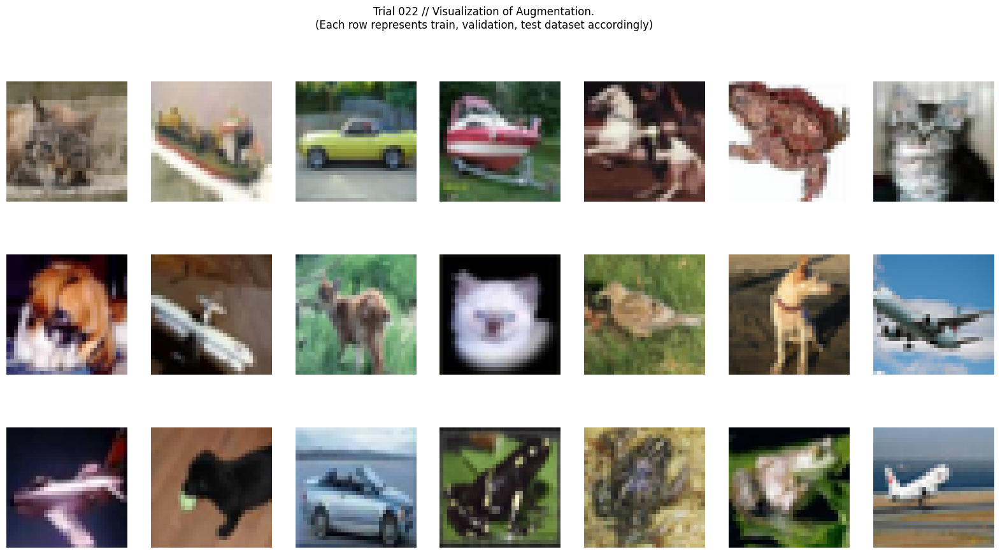

[RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |

Train: [001] Loss: 1.948, Acc: 27.94% F1(macro): 0.27: 100%|██████████| 156/156 [00:10<00:00, 15.30it/s]
 Val:       Loss: 1.650, Acc: 39.82% F1(macro): 0.39: 100%|██████████| 40/40 [00:01<00:00, 36.91it/s]


Model saved. Current best test f1: 0.386


Train: [002] Loss: 1.525, Acc: 44.20% F1(macro): 0.44: 100%|██████████| 156/156 [00:10<00:00, 15.13it/s]
 Val:       Loss: 1.463, Acc: 46.47% F1(macro): 0.46: 100%|██████████| 40/40 [00:01<00:00, 37.35it/s]


Model saved. Current best test f1: 0.461


Train: [003] Loss: 1.388, Acc: 49.71% F1(macro): 0.49: 100%|██████████| 156/156 [00:09<00:00, 15.88it/s]
 Val:       Loss: 1.405, Acc: 49.97% F1(macro): 0.49: 100%|██████████| 40/40 [00:01<00:00, 35.00it/s]


Model saved. Current best test f1: 0.492


Train: [004] Loss: 1.283, Acc: 53.52% F1(macro): 0.53: 100%|██████████| 156/156 [00:10<00:00, 15.56it/s]
 Val:       Loss: 1.278, Acc: 53.80% F1(macro): 0.53: 100%|██████████| 40/40 [00:01<00:00, 38.49it/s]


Model saved. Current best test f1: 0.534


Train: [005] Loss: 1.199, Acc: 57.00% F1(macro): 0.57: 100%|██████████| 156/156 [00:10<00:00, 15.34it/s]
 Val:       Loss: 1.257, Acc: 54.65% F1(macro): 0.54: 100%|██████████| 40/40 [00:01<00:00, 37.51it/s]


Model saved. Current best test f1: 0.541


Train: [006] Loss: 1.134, Acc: 59.43% F1(macro): 0.59: 100%|██████████| 156/156 [00:10<00:00, 15.40it/s]
 Val:       Loss: 1.224, Acc: 55.92% F1(macro): 0.56: 100%|██████████| 40/40 [00:01<00:00, 36.48it/s]


Model saved. Current best test f1: 0.559


Train: [007] Loss: 1.075, Acc: 61.91% F1(macro): 0.62: 100%|██████████| 156/156 [00:10<00:00, 15.07it/s]
 Val:       Loss: 1.160, Acc: 58.94% F1(macro): 0.58: 100%|██████████| 40/40 [00:01<00:00, 36.41it/s]


Model saved. Current best test f1: 0.583


Train: [008] Loss: 1.029, Acc: 63.19% F1(macro): 0.63: 100%|██████████| 156/156 [00:10<00:00, 15.05it/s]
 Val:       Loss: 1.128, Acc: 60.26% F1(macro): 0.60: 100%|██████████| 40/40 [00:01<00:00, 37.71it/s]


Model saved. Current best test f1: 0.598


Train: [009] Loss: 0.984, Acc: 64.94% F1(macro): 0.65: 100%|██████████| 156/156 [00:09<00:00, 15.80it/s]
 Val:       Loss: 1.136, Acc: 59.94% F1(macro): 0.60: 100%|██████████| 40/40 [00:01<00:00, 36.22it/s]
Train: [010] Loss: 0.952, Acc: 65.95% F1(macro): 0.66: 100%|██████████| 156/156 [00:09<00:00, 15.60it/s]
 Val:       Loss: 1.090, Acc: 61.79% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 31.63it/s]


Model saved. Current best test f1: 0.612
TEST DATASET


 Val:       Loss: 1.106, Acc: 61.48% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 38.77it/s]
[I 2021-11-22 05:16:55,283] Trial 22 finished with value: 0.6097079897147336 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 0 with value: 0.6301687075642395.


Files already downloaded and verified
Files already downloaded and verified


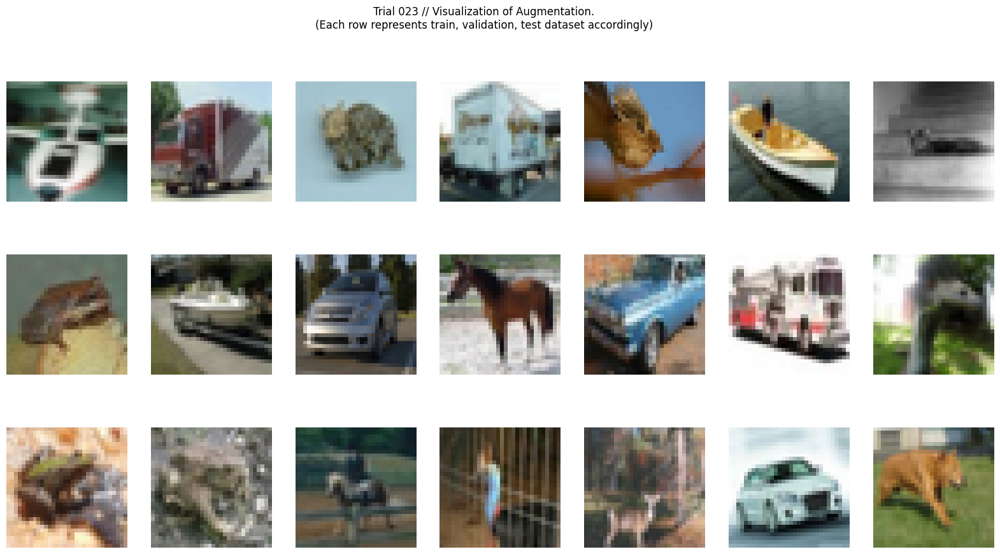

[RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |

Train: [001] Loss: 1.927, Acc: 28.52% F1(macro): 0.28: 100%|██████████| 156/156 [00:09<00:00, 15.79it/s]
 Val:       Loss: 1.655, Acc: 39.39% F1(macro): 0.38: 100%|██████████| 40/40 [00:01<00:00, 35.89it/s]


Model saved. Current best test f1: 0.384


Train: [002] Loss: 1.515, Acc: 44.08% F1(macro): 0.44: 100%|██████████| 156/156 [00:10<00:00, 15.37it/s]
 Val:       Loss: 1.453, Acc: 47.42% F1(macro): 0.47: 100%|██████████| 40/40 [00:01<00:00, 36.75it/s]


Model saved. Current best test f1: 0.471


Train: [003] Loss: 1.370, Acc: 49.83% F1(macro): 0.49: 100%|██████████| 156/156 [00:10<00:00, 15.18it/s]
 Val:       Loss: 1.375, Acc: 50.65% F1(macro): 0.50: 100%|██████████| 40/40 [00:01<00:00, 37.76it/s]


Model saved. Current best test f1: 0.504


Train: [004] Loss: 1.263, Acc: 54.51% F1(macro): 0.54: 100%|██████████| 156/156 [00:10<00:00, 15.23it/s]
 Val:       Loss: 1.271, Acc: 53.71% F1(macro): 0.53: 100%|██████████| 40/40 [00:01<00:00, 35.15it/s]


Model saved. Current best test f1: 0.535


Train: [005] Loss: 1.176, Acc: 57.68% F1(macro): 0.57: 100%|██████████| 156/156 [00:10<00:00, 15.60it/s]
 Val:       Loss: 1.216, Acc: 57.35% F1(macro): 0.57: 100%|██████████| 40/40 [00:01<00:00, 37.13it/s]


Model saved. Current best test f1: 0.566


Train: [006] Loss: 1.100, Acc: 60.47% F1(macro): 0.60: 100%|██████████| 156/156 [00:10<00:00, 15.39it/s]
 Val:       Loss: 1.153, Acc: 59.57% F1(macro): 0.59: 100%|██████████| 40/40 [00:01<00:00, 37.67it/s]


Model saved. Current best test f1: 0.593


Train: [007] Loss: 1.037, Acc: 62.87% F1(macro): 0.63: 100%|██████████| 156/156 [00:10<00:00, 15.49it/s]
 Val:       Loss: 1.091, Acc: 61.46% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 35.86it/s]


Model saved. Current best test f1: 0.610


Train: [008] Loss: 0.994, Acc: 64.69% F1(macro): 0.65: 100%|██████████| 156/156 [00:10<00:00, 15.36it/s]
 Val:       Loss: 1.078, Acc: 62.18% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 35.87it/s]


Model saved. Current best test f1: 0.618


Train: [009] Loss: 0.945, Acc: 66.62% F1(macro): 0.67: 100%|██████████| 156/156 [00:09<00:00, 15.78it/s]
 Val:       Loss: 1.020, Acc: 63.68% F1(macro): 0.64: 100%|██████████| 40/40 [00:01<00:00, 36.48it/s]


Model saved. Current best test f1: 0.635


Train: [010] Loss: 0.890, Acc: 68.23% F1(macro): 0.68: 100%|██████████| 156/156 [00:09<00:00, 15.72it/s]
 Val:       Loss: 1.010, Acc: 63.94% F1(macro): 0.64: 100%|██████████| 40/40 [00:01<00:00, 35.94it/s]


Model saved. Current best test f1: 0.638
TEST DATASET


 Val:       Loss: 1.030, Acc: 63.46% F1(macro): 0.63: 100%|██████████| 40/40 [00:01<00:00, 37.57it/s]
[I 2021-11-22 05:19:02,383] Trial 23 finished with value: 0.633538943102171 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 23 with value: 0.633538943102171.


Files already downloaded and verified
Files already downloaded and verified


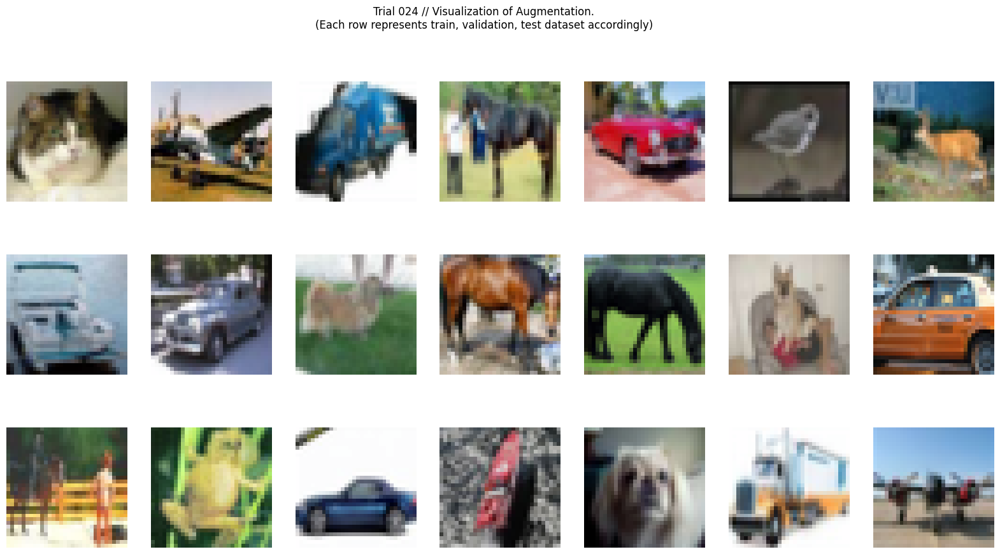

[RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |

Train: [001] Loss: 1.928, Acc: 28.09% F1(macro): 0.28: 100%|██████████| 156/156 [00:10<00:00, 14.98it/s]
 Val:       Loss: 1.687, Acc: 40.32% F1(macro): 0.39: 100%|██████████| 40/40 [00:01<00:00, 34.94it/s]


Model saved. Current best test f1: 0.392


Train: [002] Loss: 1.515, Acc: 43.69% F1(macro): 0.43: 100%|██████████| 156/156 [00:10<00:00, 15.57it/s]
 Val:       Loss: 1.448, Acc: 47.29% F1(macro): 0.46: 100%|██████████| 40/40 [00:01<00:00, 36.76it/s]


Model saved. Current best test f1: 0.457


Train: [003] Loss: 1.368, Acc: 49.90% F1(macro): 0.49: 100%|██████████| 156/156 [00:09<00:00, 15.74it/s]
 Val:       Loss: 1.367, Acc: 50.45% F1(macro): 0.50: 100%|██████████| 40/40 [00:01<00:00, 36.54it/s]


Model saved. Current best test f1: 0.500


Train: [004] Loss: 1.270, Acc: 53.64% F1(macro): 0.53: 100%|██████████| 156/156 [00:10<00:00, 15.39it/s]
 Val:       Loss: 1.309, Acc: 53.33% F1(macro): 0.53: 100%|██████████| 40/40 [00:01<00:00, 37.38it/s]


Model saved. Current best test f1: 0.529


Train: [005] Loss: 1.192, Acc: 57.03% F1(macro): 0.57: 100%|██████████| 156/156 [00:10<00:00, 15.25it/s]
 Val:       Loss: 1.216, Acc: 56.48% F1(macro): 0.56: 100%|██████████| 40/40 [00:00<00:00, 40.02it/s]


Model saved. Current best test f1: 0.561


Train: [006] Loss: 1.120, Acc: 59.69% F1(macro): 0.59: 100%|██████████| 156/156 [00:10<00:00, 15.55it/s]
 Val:       Loss: 1.193, Acc: 57.56% F1(macro): 0.57: 100%|██████████| 40/40 [00:01<00:00, 38.26it/s]


Model saved. Current best test f1: 0.568


Train: [007] Loss: 1.062, Acc: 61.97% F1(macro): 0.62: 100%|██████████| 156/156 [00:10<00:00, 15.58it/s]
 Val:       Loss: 1.175, Acc: 59.02% F1(macro): 0.59: 100%|██████████| 40/40 [00:01<00:00, 36.05it/s]


Model saved. Current best test f1: 0.586


Train: [008] Loss: 1.001, Acc: 64.40% F1(macro): 0.64: 100%|██████████| 156/156 [00:10<00:00, 15.58it/s]
 Val:       Loss: 1.116, Acc: 60.53% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 38.16it/s]


Model saved. Current best test f1: 0.607


Train: [009] Loss: 0.956, Acc: 66.03% F1(macro): 0.66: 100%|██████████| 156/156 [00:10<00:00, 15.30it/s]
 Val:       Loss: 1.078, Acc: 62.12% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 35.10it/s]


Model saved. Current best test f1: 0.618


Train: [010] Loss: 0.912, Acc: 67.73% F1(macro): 0.68: 100%|██████████| 156/156 [00:10<00:00, 15.45it/s]
 Val:       Loss: 1.045, Acc: 63.44% F1(macro): 0.63: 100%|██████████| 40/40 [00:01<00:00, 35.61it/s]


Model saved. Current best test f1: 0.632
TEST DATASET


 Val:       Loss: 1.037, Acc: 62.91% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 37.48it/s]
[I 2021-11-22 05:21:09,910] Trial 24 finished with value: 0.6247796486121378 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 23 with value: 0.633538943102171.


Files already downloaded and verified
Files already downloaded and verified


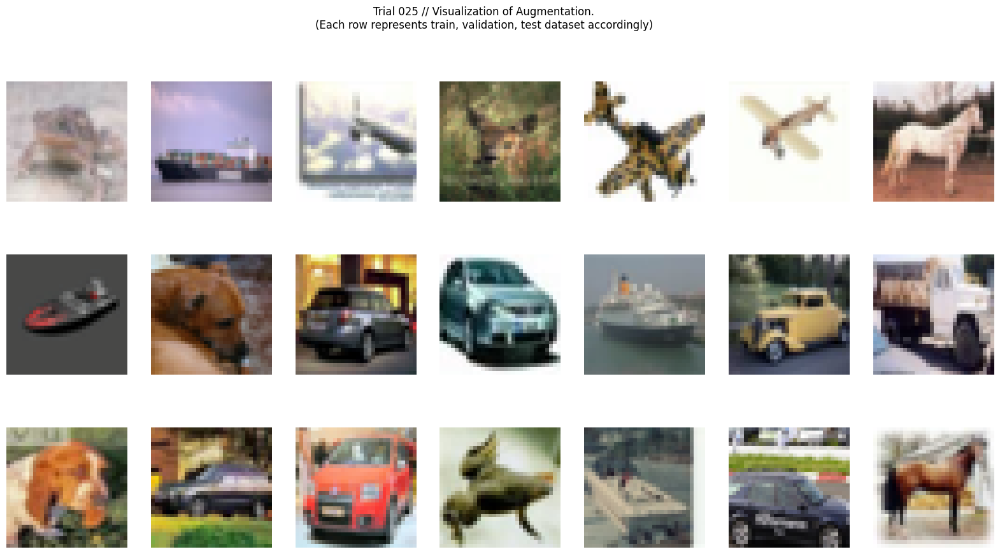

[RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |

Train: [001] Loss: 1.935, Acc: 28.24% F1(macro): 0.28: 100%|██████████| 156/156 [00:10<00:00, 15.11it/s]
 Val:       Loss: 1.690, Acc: 37.40% F1(macro): 0.36: 100%|██████████| 40/40 [00:01<00:00, 34.27it/s]


Model saved. Current best test f1: 0.359


Train: [002] Loss: 1.536, Acc: 43.59% F1(macro): 0.43: 100%|██████████| 156/156 [00:10<00:00, 15.46it/s]
 Val:       Loss: 1.472, Acc: 46.15% F1(macro): 0.46: 100%|██████████| 40/40 [00:01<00:00, 37.04it/s]


Model saved. Current best test f1: 0.460


Train: [003] Loss: 1.378, Acc: 49.58% F1(macro): 0.49: 100%|██████████| 156/156 [00:10<00:00, 14.86it/s]
 Val:       Loss: 1.354, Acc: 50.37% F1(macro): 0.50: 100%|██████████| 40/40 [00:01<00:00, 36.95it/s]


Model saved. Current best test f1: 0.499


Train: [004] Loss: 1.278, Acc: 53.98% F1(macro): 0.54: 100%|██████████| 156/156 [00:09<00:00, 15.63it/s]
 Val:       Loss: 1.294, Acc: 53.03% F1(macro): 0.53: 100%|██████████| 40/40 [00:01<00:00, 35.66it/s]


Model saved. Current best test f1: 0.533


Train: [005] Loss: 1.183, Acc: 57.46% F1(macro): 0.57: 100%|██████████| 156/156 [00:09<00:00, 15.67it/s]
 Val:       Loss: 1.262, Acc: 54.94% F1(macro): 0.54: 100%|██████████| 40/40 [00:01<00:00, 37.29it/s]


Model saved. Current best test f1: 0.541


Train: [006] Loss: 1.116, Acc: 60.15% F1(macro): 0.60: 100%|██████████| 156/156 [00:09<00:00, 15.64it/s]
 Val:       Loss: 1.195, Acc: 57.62% F1(macro): 0.57: 100%|██████████| 40/40 [00:01<00:00, 36.65it/s]


Model saved. Current best test f1: 0.569


Train: [007] Loss: 1.046, Acc: 62.45% F1(macro): 0.62: 100%|██████████| 156/156 [00:10<00:00, 15.58it/s]
 Val:       Loss: 1.161, Acc: 58.16% F1(macro): 0.58: 100%|██████████| 40/40 [00:01<00:00, 35.87it/s]


Model saved. Current best test f1: 0.581


Train: [008] Loss: 0.996, Acc: 64.69% F1(macro): 0.65: 100%|██████████| 156/156 [00:09<00:00, 15.69it/s]
 Val:       Loss: 1.104, Acc: 61.02% F1(macro): 0.60: 100%|██████████| 40/40 [00:01<00:00, 36.05it/s]


Model saved. Current best test f1: 0.605


Train: [009] Loss: 0.952, Acc: 66.23% F1(macro): 0.66: 100%|██████████| 156/156 [00:10<00:00, 15.07it/s]
 Val:       Loss: 1.067, Acc: 61.98% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 35.50it/s]


Model saved. Current best test f1: 0.616


Train: [010] Loss: 0.904, Acc: 67.96% F1(macro): 0.68: 100%|██████████| 156/156 [00:10<00:00, 15.18it/s]
 Val:       Loss: 1.038, Acc: 63.15% F1(macro): 0.63: 100%|██████████| 40/40 [00:01<00:00, 34.22it/s]


Model saved. Current best test f1: 0.633
TEST DATASET


 Val:       Loss: 1.044, Acc: 63.58% F1(macro): 0.64: 100%|██████████| 40/40 [00:01<00:00, 38.51it/s]
[I 2021-11-22 05:23:17,904] Trial 25 finished with value: 0.6374215675170334 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 25 with value: 0.6374215675170334.


Files already downloaded and verified
Files already downloaded and verified


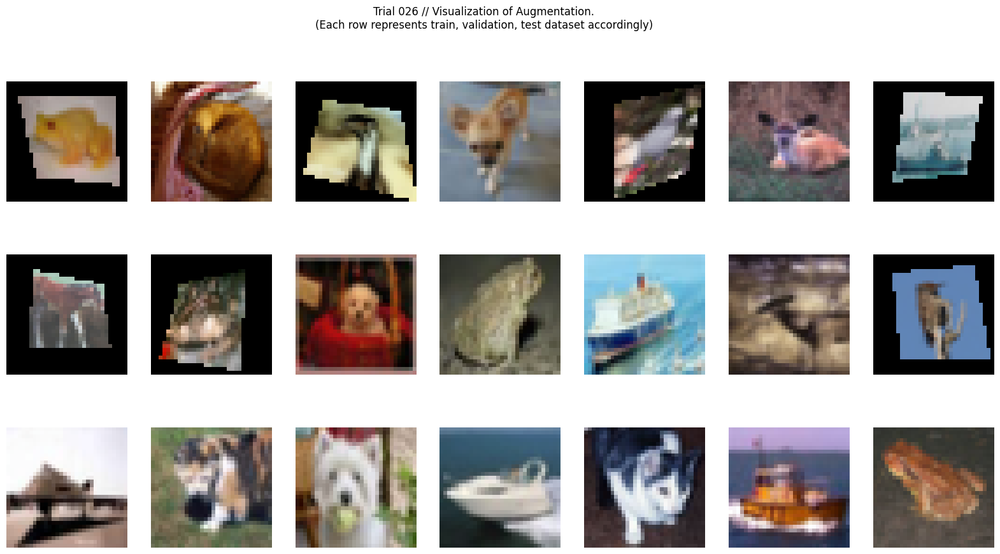

[RandomPerspective(p=0.5), RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           4

Train: [001] Loss: 2.042, Acc: 23.93% F1(macro): 0.24: 100%|██████████| 156/156 [00:10<00:00, 15.43it/s]
 Val:       Loss: 1.791, Acc: 32.67% F1(macro): 0.30: 100%|██████████| 40/40 [00:01<00:00, 25.15it/s]


Model saved. Current best test f1: 0.301


Train: [002] Loss: 1.684, Acc: 37.84% F1(macro): 0.37: 100%|██████████| 156/156 [00:10<00:00, 15.39it/s]
 Val:       Loss: 1.632, Acc: 40.12% F1(macro): 0.38: 100%|██████████| 40/40 [00:01<00:00, 24.09it/s]


Model saved. Current best test f1: 0.380


Train: [003] Loss: 1.540, Acc: 43.28% F1(macro): 0.43: 100%|██████████| 156/156 [00:10<00:00, 15.22it/s]
 Val:       Loss: 1.502, Acc: 44.47% F1(macro): 0.44: 100%|██████████| 40/40 [00:01<00:00, 25.23it/s]


Model saved. Current best test f1: 0.441


Train: [004] Loss: 1.458, Acc: 46.85% F1(macro): 0.46: 100%|██████████| 156/156 [00:10<00:00, 15.34it/s]
 Val:       Loss: 1.449, Acc: 46.45% F1(macro): 0.46: 100%|██████████| 40/40 [00:01<00:00, 24.76it/s]


Model saved. Current best test f1: 0.459


Train: [005] Loss: 1.396, Acc: 49.05% F1(macro): 0.49: 100%|██████████| 156/156 [00:09<00:00, 15.62it/s]
 Val:       Loss: 1.382, Acc: 48.65% F1(macro): 0.48: 100%|██████████| 40/40 [00:01<00:00, 21.64it/s]


Model saved. Current best test f1: 0.482


Train: [006] Loss: 1.340, Acc: 51.04% F1(macro): 0.51: 100%|██████████| 156/156 [00:10<00:00, 15.19it/s]
 Val:       Loss: 1.323, Acc: 52.35% F1(macro): 0.52: 100%|██████████| 40/40 [00:01<00:00, 24.60it/s]


Model saved. Current best test f1: 0.515


Train: [007] Loss: 1.286, Acc: 53.76% F1(macro): 0.53: 100%|██████████| 156/156 [00:10<00:00, 15.18it/s]
 Val:       Loss: 1.292, Acc: 52.86% F1(macro): 0.53: 100%|██████████| 40/40 [00:01<00:00, 22.10it/s]


Model saved. Current best test f1: 0.527


Train: [008] Loss: 1.259, Acc: 54.41% F1(macro): 0.54: 100%|██████████| 156/156 [00:10<00:00, 15.04it/s]
 Val:       Loss: 1.259, Acc: 54.78% F1(macro): 0.55: 100%|██████████| 40/40 [00:01<00:00, 25.11it/s]


Model saved. Current best test f1: 0.549


Train: [009] Loss: 1.218, Acc: 55.95% F1(macro): 0.56: 100%|██████████| 156/156 [00:10<00:00, 15.18it/s]
 Val:       Loss: 1.229, Acc: 55.64% F1(macro): 0.55: 100%|██████████| 40/40 [00:01<00:00, 24.98it/s]


Model saved. Current best test f1: 0.553


Train: [010] Loss: 1.184, Acc: 57.62% F1(macro): 0.57: 100%|██████████| 156/156 [00:10<00:00, 14.91it/s]
 Val:       Loss: 1.208, Acc: 56.62% F1(macro): 0.57: 100%|██████████| 40/40 [00:01<00:00, 24.41it/s]


Model saved. Current best test f1: 0.568
TEST DATASET


 Val:       Loss: 1.099, Acc: 60.40% F1(macro): 0.60: 100%|██████████| 40/40 [00:01<00:00, 37.12it/s]
[I 2021-11-22 05:25:32,274] Trial 26 finished with value: 0.6038357443108879 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': True, 'aug_random_flip': True}. Best is trial 25 with value: 0.6374215675170334.


Files already downloaded and verified
Files already downloaded and verified


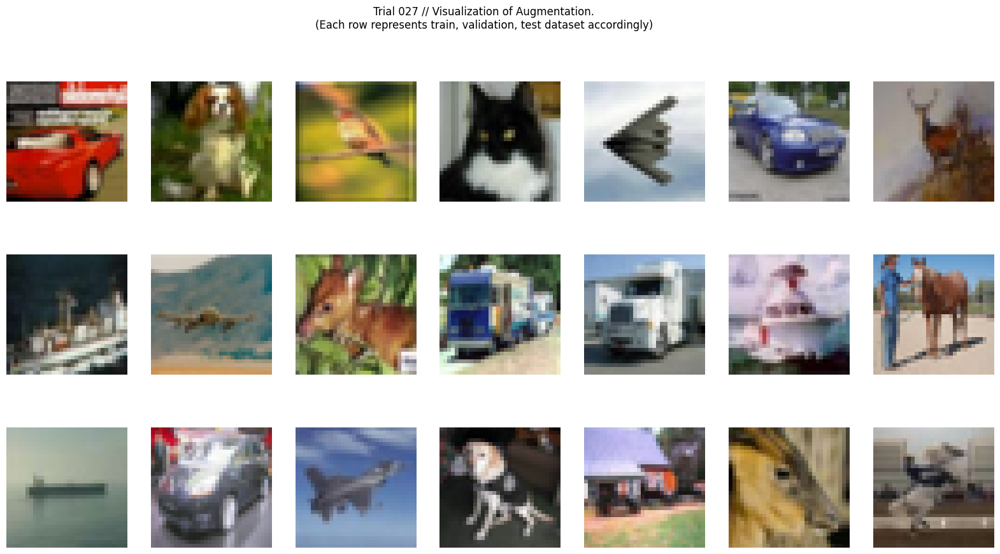

[RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |

Train: [001] Loss: 1.949, Acc: 28.33% F1(macro): 0.28: 100%|██████████| 156/156 [00:10<00:00, 15.20it/s]
 Val:       Loss: 1.690, Acc: 37.98% F1(macro): 0.36: 100%|██████████| 40/40 [00:01<00:00, 36.58it/s]


Model saved. Current best test f1: 0.360


Train: [002] Loss: 1.525, Acc: 44.00% F1(macro): 0.43: 100%|██████████| 156/156 [00:09<00:00, 15.79it/s]
 Val:       Loss: 1.439, Acc: 47.45% F1(macro): 0.47: 100%|██████████| 40/40 [00:01<00:00, 37.68it/s]


Model saved. Current best test f1: 0.467


Train: [003] Loss: 1.369, Acc: 49.91% F1(macro): 0.50: 100%|██████████| 156/156 [00:10<00:00, 15.29it/s]
 Val:       Loss: 1.351, Acc: 50.65% F1(macro): 0.50: 100%|██████████| 40/40 [00:01<00:00, 36.70it/s]


Model saved. Current best test f1: 0.501


Train: [004] Loss: 1.267, Acc: 53.92% F1(macro): 0.54: 100%|██████████| 156/156 [00:09<00:00, 15.61it/s]
 Val:       Loss: 1.279, Acc: 54.61% F1(macro): 0.54: 100%|██████████| 40/40 [00:01<00:00, 37.38it/s]


Model saved. Current best test f1: 0.543


Train: [005] Loss: 1.195, Acc: 56.86% F1(macro): 0.57: 100%|██████████| 156/156 [00:10<00:00, 15.46it/s]
 Val:       Loss: 1.199, Acc: 56.18% F1(macro): 0.56: 100%|██████████| 40/40 [00:01<00:00, 37.05it/s]


Model saved. Current best test f1: 0.562


Train: [006] Loss: 1.119, Acc: 59.93% F1(macro): 0.60: 100%|██████████| 156/156 [00:09<00:00, 15.68it/s]
 Val:       Loss: 1.181, Acc: 57.38% F1(macro): 0.57: 100%|██████████| 40/40 [00:01<00:00, 36.07it/s]


Model saved. Current best test f1: 0.574


Train: [007] Loss: 1.059, Acc: 62.29% F1(macro): 0.62: 100%|██████████| 156/156 [00:10<00:00, 15.40it/s]
 Val:       Loss: 1.119, Acc: 59.86% F1(macro): 0.60: 100%|██████████| 40/40 [00:01<00:00, 33.78it/s]


Model saved. Current best test f1: 0.596


Train: [008] Loss: 1.009, Acc: 63.99% F1(macro): 0.64: 100%|██████████| 156/156 [00:10<00:00, 15.08it/s]
 Val:       Loss: 1.092, Acc: 60.88% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 35.76it/s]


Model saved. Current best test f1: 0.609


Train: [009] Loss: 0.951, Acc: 66.11% F1(macro): 0.66: 100%|██████████| 156/156 [00:10<00:00, 15.10it/s]
 Val:       Loss: 1.121, Acc: 60.84% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 37.34it/s]
Train: [010] Loss: 0.922, Acc: 67.02% F1(macro): 0.67: 100%|██████████| 156/156 [00:09<00:00, 15.94it/s]
 Val:       Loss: 1.047, Acc: 63.01% F1(macro): 0.63: 100%|██████████| 40/40 [00:01<00:00, 35.79it/s]


Model saved. Current best test f1: 0.629
TEST DATASET


 Val:       Loss: 1.060, Acc: 62.30% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 37.38it/s]
[I 2021-11-22 05:27:38,830] Trial 27 finished with value: 0.6211949156014306 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 25 with value: 0.6374215675170334.


Files already downloaded and verified
Files already downloaded and verified


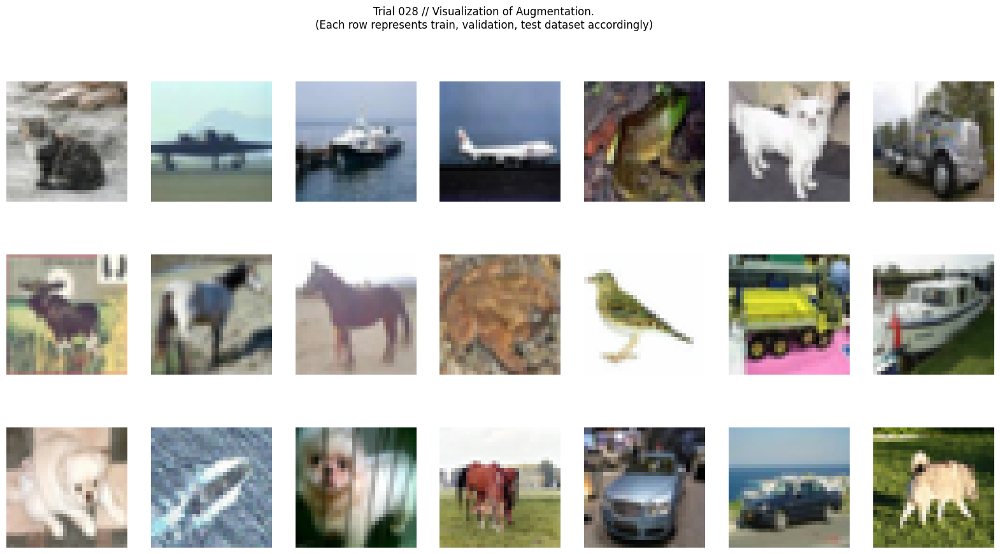

[RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |

Train: [001] Loss: 1.931, Acc: 28.27% F1(macro): 0.28: 100%|██████████| 156/156 [00:10<00:00, 14.94it/s]
 Val:       Loss: 1.639, Acc: 40.31% F1(macro): 0.39: 100%|██████████| 40/40 [00:01<00:00, 37.61it/s]


Model saved. Current best test f1: 0.393


Train: [002] Loss: 1.528, Acc: 43.80% F1(macro): 0.43: 100%|██████████| 156/156 [00:10<00:00, 15.46it/s]
 Val:       Loss: 1.453, Acc: 46.74% F1(macro): 0.45: 100%|██████████| 40/40 [00:01<00:00, 34.91it/s]


Model saved. Current best test f1: 0.454


Train: [003] Loss: 1.377, Acc: 49.95% F1(macro): 0.50: 100%|██████████| 156/156 [00:10<00:00, 15.32it/s]
 Val:       Loss: 1.373, Acc: 50.16% F1(macro): 0.50: 100%|██████████| 40/40 [00:01<00:00, 37.32it/s]


Model saved. Current best test f1: 0.498


Train: [004] Loss: 1.267, Acc: 54.19% F1(macro): 0.54: 100%|██████████| 156/156 [00:10<00:00, 15.30it/s]
 Val:       Loss: 1.284, Acc: 53.95% F1(macro): 0.53: 100%|██████████| 40/40 [00:01<00:00, 36.88it/s]


Model saved. Current best test f1: 0.535


Train: [005] Loss: 1.187, Acc: 57.43% F1(macro): 0.57: 100%|██████████| 156/156 [00:10<00:00, 14.74it/s]
 Val:       Loss: 1.233, Acc: 55.71% F1(macro): 0.55: 100%|██████████| 40/40 [00:01<00:00, 36.92it/s]


Model saved. Current best test f1: 0.551


Train: [006] Loss: 1.113, Acc: 60.13% F1(macro): 0.60: 100%|██████████| 156/156 [00:09<00:00, 15.73it/s]
 Val:       Loss: 1.187, Acc: 57.88% F1(macro): 0.58: 100%|██████████| 40/40 [00:01<00:00, 37.54it/s]


Model saved. Current best test f1: 0.577


Train: [007] Loss: 1.063, Acc: 62.18% F1(macro): 0.62: 100%|██████████| 156/156 [00:10<00:00, 15.57it/s]
 Val:       Loss: 1.151, Acc: 58.48% F1(macro): 0.58: 100%|██████████| 40/40 [00:01<00:00, 36.40it/s]


Model saved. Current best test f1: 0.583


Train: [008] Loss: 1.001, Acc: 64.47% F1(macro): 0.64: 100%|██████████| 156/156 [00:10<00:00, 15.57it/s]
 Val:       Loss: 1.101, Acc: 60.82% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 35.58it/s]


Model saved. Current best test f1: 0.609


Train: [009] Loss: 0.958, Acc: 66.07% F1(macro): 0.66: 100%|██████████| 156/156 [00:10<00:00, 15.00it/s]
 Val:       Loss: 1.076, Acc: 61.66% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 36.86it/s]


Model saved. Current best test f1: 0.615


Train: [010] Loss: 0.924, Acc: 67.29% F1(macro): 0.67: 100%|██████████| 156/156 [00:10<00:00, 15.33it/s]
 Val:       Loss: 1.038, Acc: 62.98% F1(macro): 0.63: 100%|██████████| 40/40 [00:01<00:00, 36.32it/s]


Model saved. Current best test f1: 0.632
TEST DATASET


 Val:       Loss: 1.054, Acc: 61.92% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 35.56it/s]
[I 2021-11-22 05:29:47,362] Trial 28 finished with value: 0.6217254700648372 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 25 with value: 0.6374215675170334.


Files already downloaded and verified
Files already downloaded and verified


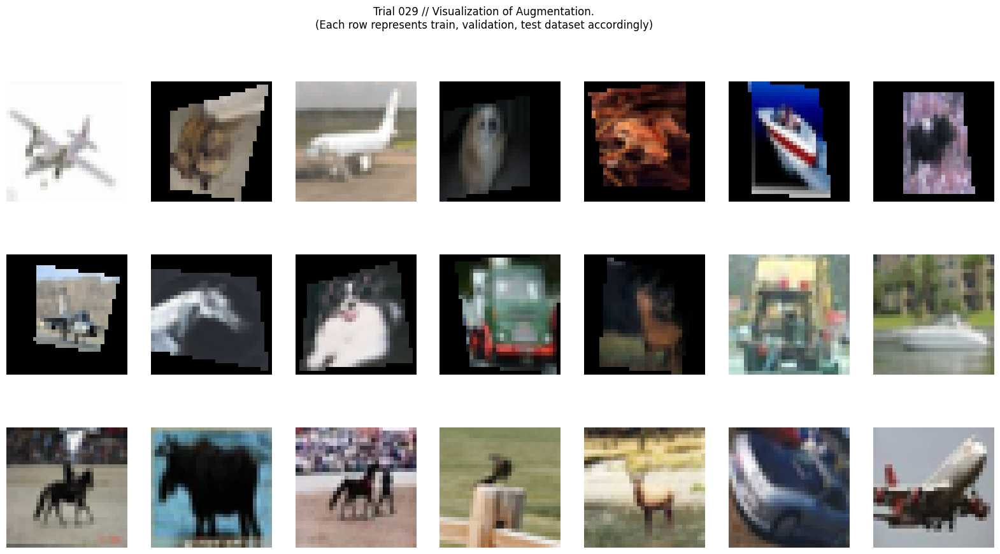

[RandomPerspective(p=0.5), RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           4

Train: [001] Loss: 2.069, Acc: 23.00% F1(macro): 0.22: 100%|██████████| 156/156 [00:10<00:00, 14.95it/s]
 Val:       Loss: 1.843, Acc: 32.50% F1(macro): 0.31: 100%|██████████| 40/40 [00:01<00:00, 24.13it/s]


Model saved. Current best test f1: 0.315


Train: [002] Loss: 1.728, Acc: 36.61% F1(macro): 0.36: 100%|██████████| 156/156 [00:09<00:00, 15.61it/s]
 Val:       Loss: 1.658, Acc: 38.74% F1(macro): 0.37: 100%|██████████| 40/40 [00:01<00:00, 24.59it/s]


Model saved. Current best test f1: 0.369


Train: [003] Loss: 1.589, Acc: 42.03% F1(macro): 0.41: 100%|██████████| 156/156 [00:10<00:00, 14.90it/s]
 Val:       Loss: 1.550, Acc: 42.46% F1(macro): 0.42: 100%|██████████| 40/40 [00:01<00:00, 21.76it/s]


Model saved. Current best test f1: 0.423


Train: [004] Loss: 1.494, Acc: 45.32% F1(macro): 0.45: 100%|██████████| 156/156 [00:10<00:00, 14.96it/s]
 Val:       Loss: 1.475, Acc: 46.67% F1(macro): 0.46: 100%|██████████| 40/40 [00:01<00:00, 24.78it/s]


Model saved. Current best test f1: 0.457


Train: [005] Loss: 1.427, Acc: 48.25% F1(macro): 0.48: 100%|██████████| 156/156 [00:10<00:00, 15.31it/s]
 Val:       Loss: 1.432, Acc: 48.15% F1(macro): 0.48: 100%|██████████| 40/40 [00:01<00:00, 23.98it/s]


Model saved. Current best test f1: 0.476


Train: [006] Loss: 1.371, Acc: 50.25% F1(macro): 0.50: 100%|██████████| 156/156 [00:10<00:00, 15.17it/s]
 Val:       Loss: 1.387, Acc: 49.71% F1(macro): 0.49: 100%|██████████| 40/40 [00:01<00:00, 24.91it/s]


Model saved. Current best test f1: 0.493


Train: [007] Loss: 1.324, Acc: 51.96% F1(macro): 0.52: 100%|██████████| 156/156 [00:10<00:00, 14.95it/s]
 Val:       Loss: 1.362, Acc: 50.91% F1(macro): 0.51: 100%|██████████| 40/40 [00:01<00:00, 24.58it/s]


Model saved. Current best test f1: 0.506


Train: [008] Loss: 1.285, Acc: 53.70% F1(macro): 0.53: 100%|██████████| 156/156 [00:10<00:00, 15.55it/s]
 Val:       Loss: 1.317, Acc: 52.25% F1(macro): 0.52: 100%|██████████| 40/40 [00:01<00:00, 24.39it/s]


Model saved. Current best test f1: 0.517


Train: [009] Loss: 1.256, Acc: 54.43% F1(macro): 0.54: 100%|██████████| 156/156 [00:10<00:00, 15.30it/s]
 Val:       Loss: 1.291, Acc: 53.18% F1(macro): 0.53: 100%|██████████| 40/40 [00:01<00:00, 25.11it/s]


Model saved. Current best test f1: 0.526


Train: [010] Loss: 1.213, Acc: 56.09% F1(macro): 0.56: 100%|██████████| 156/156 [00:10<00:00, 15.35it/s]
 Val:       Loss: 1.237, Acc: 55.13% F1(macro): 0.55: 100%|██████████| 40/40 [00:01<00:00, 21.33it/s]


Model saved. Current best test f1: 0.547
TEST DATASET


 Val:       Loss: 1.124, Acc: 59.76% F1(macro): 0.59: 100%|██████████| 40/40 [00:01<00:00, 35.69it/s]
[I 2021-11-22 05:32:02,376] Trial 29 finished with value: 0.5922869207197088 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': True, 'aug_random_flip': True}. Best is trial 25 with value: 0.6374215675170334.


Files already downloaded and verified
Files already downloaded and verified


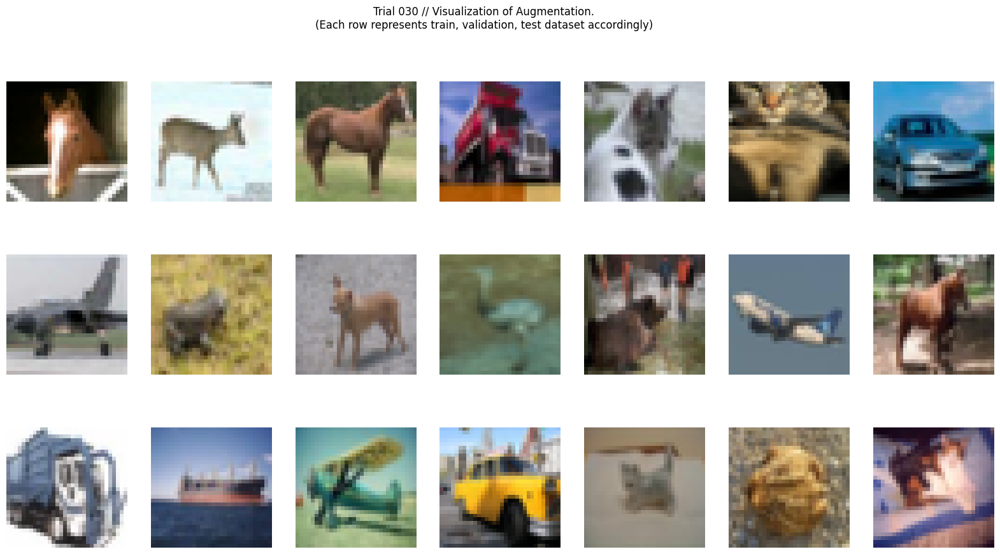

[RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |

Train: [001] Loss: 1.921, Acc: 28.92% F1(macro): 0.28: 100%|██████████| 156/156 [00:10<00:00, 14.88it/s]
 Val:       Loss: 1.630, Acc: 40.46% F1(macro): 0.39: 100%|██████████| 40/40 [00:01<00:00, 36.27it/s]


Model saved. Current best test f1: 0.388


Train: [002] Loss: 1.508, Acc: 45.13% F1(macro): 0.45: 100%|██████████| 156/156 [00:09<00:00, 15.62it/s]
 Val:       Loss: 1.467, Acc: 46.46% F1(macro): 0.46: 100%|██████████| 40/40 [00:01<00:00, 36.92it/s]


Model saved. Current best test f1: 0.462


Train: [003] Loss: 1.368, Acc: 50.29% F1(macro): 0.50: 100%|██████████| 156/156 [00:10<00:00, 15.26it/s]
 Val:       Loss: 1.390, Acc: 48.82% F1(macro): 0.48: 100%|██████████| 40/40 [00:01<00:00, 37.88it/s]


Model saved. Current best test f1: 0.482


Train: [004] Loss: 1.279, Acc: 53.89% F1(macro): 0.54: 100%|██████████| 156/156 [00:10<00:00, 15.35it/s]
 Val:       Loss: 1.306, Acc: 52.85% F1(macro): 0.52: 100%|██████████| 40/40 [00:01<00:00, 35.47it/s]


Model saved. Current best test f1: 0.523


Train: [005] Loss: 1.191, Acc: 57.12% F1(macro): 0.57: 100%|██████████| 156/156 [00:10<00:00, 15.08it/s]
 Val:       Loss: 1.257, Acc: 55.46% F1(macro): 0.55: 100%|██████████| 40/40 [00:01<00:00, 38.15it/s]


Model saved. Current best test f1: 0.547


Train: [006] Loss: 1.139, Acc: 59.21% F1(macro): 0.59: 100%|██████████| 156/156 [00:10<00:00, 15.45it/s]
 Val:       Loss: 1.252, Acc: 55.77% F1(macro): 0.55: 100%|██████████| 40/40 [00:01<00:00, 38.75it/s]


Model saved. Current best test f1: 0.551


Train: [007] Loss: 1.076, Acc: 61.64% F1(macro): 0.61: 100%|██████████| 156/156 [00:10<00:00, 15.36it/s]
 Val:       Loss: 1.221, Acc: 56.23% F1(macro): 0.56: 100%|██████████| 40/40 [00:01<00:00, 36.62it/s]


Model saved. Current best test f1: 0.557


Train: [008] Loss: 1.036, Acc: 62.88% F1(macro): 0.63: 100%|██████████| 156/156 [00:10<00:00, 15.54it/s]
 Val:       Loss: 1.161, Acc: 58.91% F1(macro): 0.58: 100%|██████████| 40/40 [00:01<00:00, 35.67it/s]


Model saved. Current best test f1: 0.582


Train: [009] Loss: 0.985, Acc: 64.78% F1(macro): 0.65: 100%|██████████| 156/156 [00:10<00:00, 15.33it/s]
 Val:       Loss: 1.171, Acc: 58.82% F1(macro): 0.58: 100%|██████████| 40/40 [00:01<00:00, 36.30it/s]


Model saved. Current best test f1: 0.583


Train: [010] Loss: 0.954, Acc: 66.10% F1(macro): 0.66: 100%|██████████| 156/156 [00:10<00:00, 15.58it/s]
 Val:       Loss: 1.109, Acc: 61.03% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 36.25it/s]


Model saved. Current best test f1: 0.607
TEST DATASET


 Val:       Loss: 1.102, Acc: 60.74% F1(macro): 0.60: 100%|██████████| 40/40 [00:01<00:00, 35.82it/s]
[I 2021-11-22 05:34:10,400] Trial 30 finished with value: 0.6048274564992372 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 25 with value: 0.6374215675170334.


Files already downloaded and verified
Files already downloaded and verified


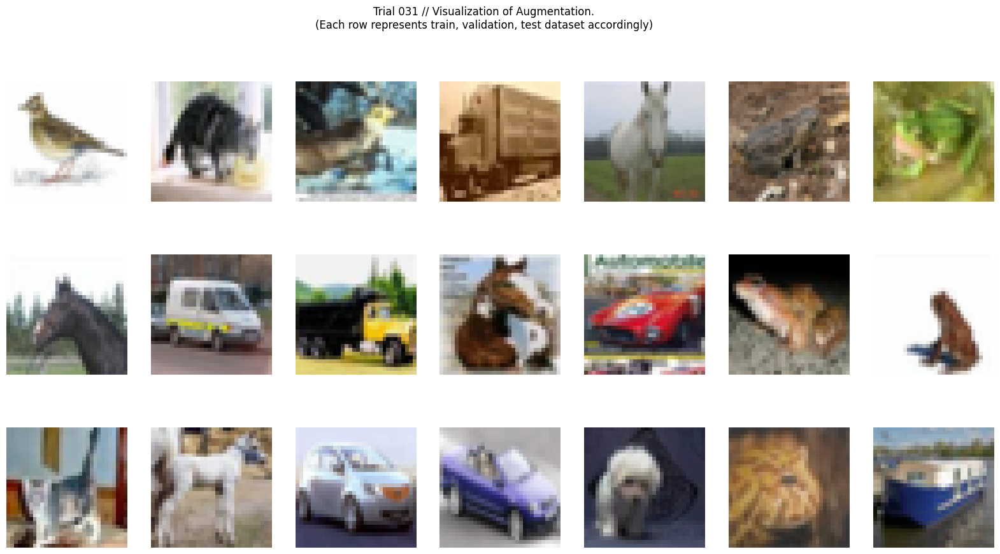

[RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |

Train: [001] Loss: 1.937, Acc: 27.40% F1(macro): 0.27: 100%|██████████| 156/156 [00:10<00:00, 14.91it/s]
 Val:       Loss: 1.633, Acc: 39.30% F1(macro): 0.38: 100%|██████████| 40/40 [00:01<00:00, 36.88it/s]


Model saved. Current best test f1: 0.384


Train: [002] Loss: 1.531, Acc: 43.79% F1(macro): 0.43: 100%|██████████| 156/156 [00:10<00:00, 15.10it/s]
 Val:       Loss: 1.460, Acc: 46.17% F1(macro): 0.45: 100%|██████████| 40/40 [00:01<00:00, 37.92it/s]


Model saved. Current best test f1: 0.450


Train: [003] Loss: 1.372, Acc: 49.90% F1(macro): 0.50: 100%|██████████| 156/156 [00:10<00:00, 15.34it/s]
 Val:       Loss: 1.389, Acc: 49.77% F1(macro): 0.50: 100%|██████████| 40/40 [00:01<00:00, 36.48it/s]


Model saved. Current best test f1: 0.497


Train: [004] Loss: 1.279, Acc: 53.29% F1(macro): 0.53: 100%|██████████| 156/156 [00:10<00:00, 15.36it/s]
 Val:       Loss: 1.259, Acc: 54.41% F1(macro): 0.54: 100%|██████████| 40/40 [00:01<00:00, 36.79it/s]


Model saved. Current best test f1: 0.541


Train: [005] Loss: 1.208, Acc: 56.33% F1(macro): 0.56: 100%|██████████| 156/156 [00:10<00:00, 15.50it/s]
 Val:       Loss: 1.227, Acc: 55.69% F1(macro): 0.55: 100%|██████████| 40/40 [00:01<00:00, 35.03it/s]


Model saved. Current best test f1: 0.551


Train: [006] Loss: 1.138, Acc: 59.04% F1(macro): 0.59: 100%|██████████| 156/156 [00:10<00:00, 15.09it/s]
 Val:       Loss: 1.194, Acc: 57.43% F1(macro): 0.57: 100%|██████████| 40/40 [00:01<00:00, 36.58it/s]


Model saved. Current best test f1: 0.574


Train: [007] Loss: 1.083, Acc: 61.35% F1(macro): 0.61: 100%|██████████| 156/156 [00:10<00:00, 15.18it/s]
 Val:       Loss: 1.194, Acc: 57.27% F1(macro): 0.57: 100%|██████████| 40/40 [00:01<00:00, 36.52it/s]
Train: [008] Loss: 1.024, Acc: 63.56% F1(macro): 0.63: 100%|██████████| 156/156 [00:10<00:00, 15.60it/s]
 Val:       Loss: 1.154, Acc: 59.80% F1(macro): 0.59: 100%|██████████| 40/40 [00:01<00:00, 35.08it/s]


Model saved. Current best test f1: 0.594


Train: [009] Loss: 0.974, Acc: 65.36% F1(macro): 0.65: 100%|██████████| 156/156 [00:10<00:00, 15.36it/s]
 Val:       Loss: 1.067, Acc: 62.10% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 36.73it/s]


Model saved. Current best test f1: 0.616


Train: [010] Loss: 0.927, Acc: 66.77% F1(macro): 0.67: 100%|██████████| 156/156 [00:10<00:00, 14.82it/s]
 Val:       Loss: 1.064, Acc: 62.09% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 33.96it/s]


Model saved. Current best test f1: 0.621
TEST DATASET


 Val:       Loss: 1.071, Acc: 62.07% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 34.09it/s]
[I 2021-11-22 05:36:18,699] Trial 31 finished with value: 0.6214192701062818 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 25 with value: 0.6374215675170334.


Files already downloaded and verified
Files already downloaded and verified


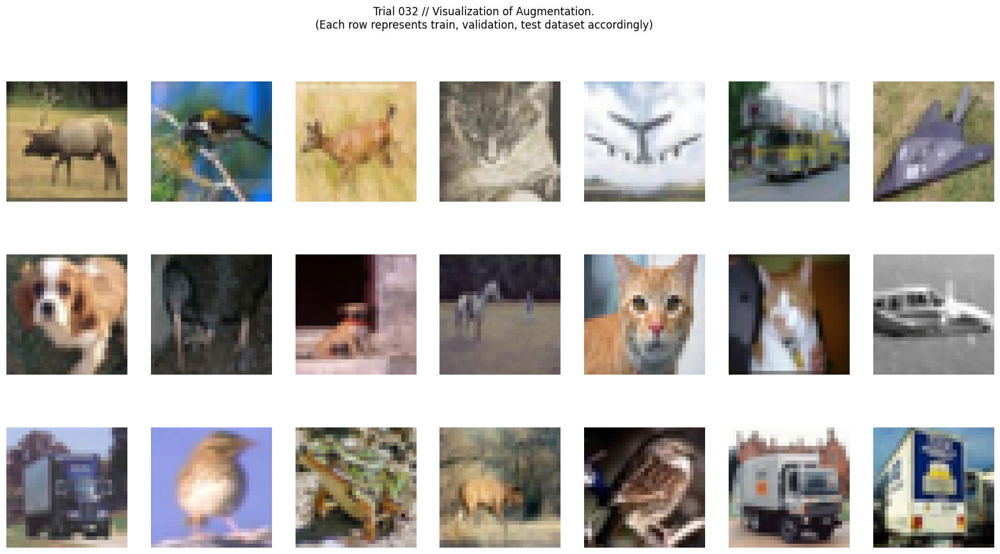

[RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |

Train: [001] Loss: 1.911, Acc: 29.29% F1(macro): 0.29: 100%|██████████| 156/156 [00:19<00:00,  8.13it/s]
 Val:       Loss: 1.703, Acc: 39.89% F1(macro): 0.39: 100%|██████████| 40/40 [00:01<00:00, 27.26it/s]


Model saved. Current best test f1: 0.389


Train: [002] Loss: 1.502, Acc: 45.15% F1(macro): 0.45: 100%|██████████| 156/156 [00:10<00:00, 15.21it/s]
 Val:       Loss: 1.443, Acc: 47.98% F1(macro): 0.48: 100%|██████████| 40/40 [00:01<00:00, 37.02it/s]


Model saved. Current best test f1: 0.479


Train: [003] Loss: 1.350, Acc: 51.16% F1(macro): 0.51: 100%|██████████| 156/156 [00:10<00:00, 15.43it/s]
 Val:       Loss: 1.363, Acc: 50.86% F1(macro): 0.51: 100%|██████████| 40/40 [00:01<00:00, 37.14it/s]


Model saved. Current best test f1: 0.509


Train: [004] Loss: 1.241, Acc: 55.37% F1(macro): 0.55: 100%|██████████| 156/156 [00:10<00:00, 15.47it/s]
 Val:       Loss: 1.268, Acc: 54.49% F1(macro): 0.55: 100%|██████████| 40/40 [00:01<00:00, 36.25it/s]


Model saved. Current best test f1: 0.545


Train: [005] Loss: 1.165, Acc: 58.34% F1(macro): 0.58: 100%|██████████| 156/156 [00:10<00:00, 15.60it/s]
 Val:       Loss: 1.203, Acc: 56.74% F1(macro): 0.57: 100%|██████████| 40/40 [00:01<00:00, 31.85it/s]


Model saved. Current best test f1: 0.566


Train: [006] Loss: 1.101, Acc: 60.46% F1(macro): 0.60: 100%|██████████| 156/156 [00:10<00:00, 15.26it/s]
 Val:       Loss: 1.168, Acc: 58.32% F1(macro): 0.58: 100%|██████████| 40/40 [00:01<00:00, 36.93it/s]


Model saved. Current best test f1: 0.583


Train: [007] Loss: 1.044, Acc: 62.58% F1(macro): 0.62: 100%|██████████| 156/156 [00:10<00:00, 15.10it/s]
 Val:       Loss: 1.171, Acc: 58.90% F1(macro): 0.59: 100%|██████████| 40/40 [00:01<00:00, 35.12it/s]


Model saved. Current best test f1: 0.589


Train: [008] Loss: 0.989, Acc: 64.73% F1(macro): 0.65: 100%|██████████| 156/156 [00:10<00:00, 15.45it/s]
 Val:       Loss: 1.116, Acc: 60.69% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 36.94it/s]


Model saved. Current best test f1: 0.607


Train: [009] Loss: 0.949, Acc: 66.28% F1(macro): 0.66: 100%|██████████| 156/156 [00:11<00:00, 13.27it/s]
 Val:       Loss: 1.065, Acc: 62.14% F1(macro): 0.62: 100%|██████████| 40/40 [00:02<00:00, 18.00it/s]


Model saved. Current best test f1: 0.622


Train: [010] Loss: 0.920, Acc: 67.42% F1(macro): 0.67: 100%|██████████| 156/156 [00:19<00:00,  7.94it/s]
 Val:       Loss: 1.084, Acc: 61.70% F1(macro): 0.62: 100%|██████████| 40/40 [00:02<00:00, 16.80it/s]


TEST DATASET


 Val:       Loss: 1.062, Acc: 61.76% F1(macro): 0.62: 100%|██████████| 40/40 [00:02<00:00, 18.45it/s]
[I 2021-11-22 05:38:52,967] Trial 32 finished with value: 0.6174353874427122 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 25 with value: 0.6374215675170334.


Files already downloaded and verified
Files already downloaded and verified


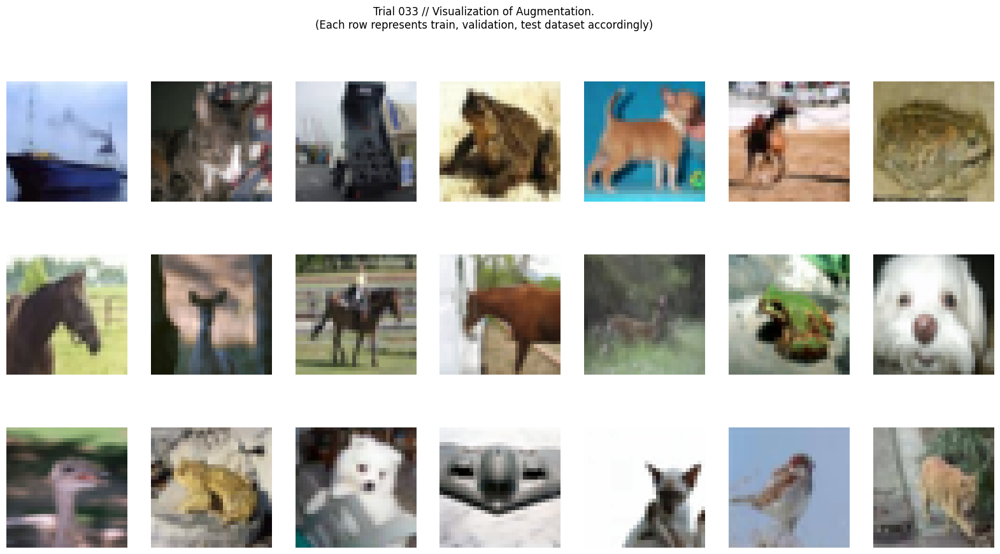

[RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |

Train: [001] Loss: 1.885, Acc: 30.04% F1(macro): 0.29: 100%|██████████| 156/156 [00:19<00:00,  8.07it/s]
 Val:       Loss: 1.617, Acc: 41.66% F1(macro): 0.41: 100%|██████████| 40/40 [00:02<00:00, 15.97it/s]


Model saved. Current best test f1: 0.406


Train: [002] Loss: 1.493, Acc: 45.40% F1(macro): 0.45: 100%|██████████| 156/156 [00:13<00:00, 11.27it/s]
 Val:       Loss: 1.426, Acc: 47.90% F1(macro): 0.48: 100%|██████████| 40/40 [00:01<00:00, 26.64it/s]


Model saved. Current best test f1: 0.479


Train: [003] Loss: 1.352, Acc: 51.05% F1(macro): 0.51: 100%|██████████| 156/156 [00:11<00:00, 13.35it/s]
 Val:       Loss: 1.331, Acc: 51.62% F1(macro): 0.52: 100%|██████████| 40/40 [00:01<00:00, 26.29it/s]


Model saved. Current best test f1: 0.519


Train: [004] Loss: 1.252, Acc: 54.93% F1(macro): 0.55: 100%|██████████| 156/156 [00:14<00:00, 10.68it/s]
 Val:       Loss: 1.264, Acc: 54.69% F1(macro): 0.55: 100%|██████████| 40/40 [00:02<00:00, 15.53it/s]


Model saved. Current best test f1: 0.549


Train: [005] Loss: 1.171, Acc: 57.92% F1(macro): 0.58: 100%|██████████| 156/156 [00:19<00:00,  8.13it/s]
 Val:       Loss: 1.197, Acc: 56.80% F1(macro): 0.57: 100%|██████████| 40/40 [00:02<00:00, 17.14it/s]


Model saved. Current best test f1: 0.567


Train: [006] Loss: 1.090, Acc: 61.09% F1(macro): 0.61: 100%|██████████| 156/156 [00:12<00:00, 12.78it/s]
 Val:       Loss: 1.162, Acc: 58.79% F1(macro): 0.58: 100%|██████████| 40/40 [00:01<00:00, 38.10it/s]


Model saved. Current best test f1: 0.584


Train: [007] Loss: 1.037, Acc: 63.24% F1(macro): 0.63: 100%|██████████| 156/156 [00:10<00:00, 15.23it/s]
 Val:       Loss: 1.122, Acc: 60.06% F1(macro): 0.60: 100%|██████████| 40/40 [00:01<00:00, 34.46it/s]


Model saved. Current best test f1: 0.598


Train: [008] Loss: 0.987, Acc: 64.85% F1(macro): 0.65: 100%|██████████| 156/156 [00:10<00:00, 15.27it/s]
 Val:       Loss: 1.146, Acc: 59.23% F1(macro): 0.59: 100%|██████████| 40/40 [00:01<00:00, 37.02it/s]
Train: [009] Loss: 0.943, Acc: 66.48% F1(macro): 0.66: 100%|██████████| 156/156 [00:09<00:00, 15.91it/s]
 Val:       Loss: 1.057, Acc: 63.01% F1(macro): 0.63: 100%|██████████| 40/40 [00:01<00:00, 37.14it/s]


Model saved. Current best test f1: 0.633


Train: [010] Loss: 0.899, Acc: 68.17% F1(macro): 0.68: 100%|██████████| 156/156 [00:10<00:00, 15.26it/s]
 Val:       Loss: 1.040, Acc: 63.57% F1(macro): 0.64: 100%|██████████| 40/40 [00:01<00:00, 36.12it/s]


Model saved. Current best test f1: 0.636
TEST DATASET


 Val:       Loss: 1.027, Acc: 63.33% F1(macro): 0.63: 100%|██████████| 40/40 [00:01<00:00, 37.53it/s]
[I 2021-11-22 05:41:39,952] Trial 33 finished with value: 0.6314024718058127 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 25 with value: 0.6374215675170334.


Files already downloaded and verified
Files already downloaded and verified


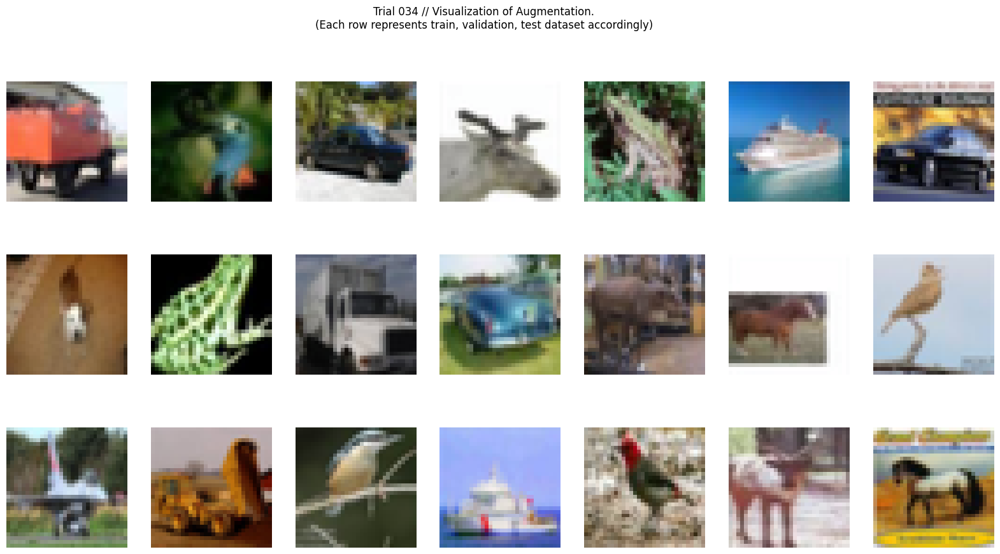

[RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |

Train: [001] Loss: 1.943, Acc: 27.95% F1(macro): 0.27: 100%|██████████| 156/156 [00:10<00:00, 14.94it/s]
 Val:       Loss: 1.727, Acc: 39.04% F1(macro): 0.38: 100%|██████████| 40/40 [00:01<00:00, 36.53it/s]


Model saved. Current best test f1: 0.379


Train: [002] Loss: 1.528, Acc: 43.74% F1(macro): 0.43: 100%|██████████| 156/156 [00:10<00:00, 15.45it/s]
 Val:       Loss: 1.485, Acc: 46.00% F1(macro): 0.44: 100%|██████████| 40/40 [00:01<00:00, 37.20it/s]


Model saved. Current best test f1: 0.445


Train: [003] Loss: 1.376, Acc: 49.80% F1(macro): 0.49: 100%|██████████| 156/156 [00:09<00:00, 15.66it/s]
 Val:       Loss: 1.332, Acc: 51.75% F1(macro): 0.51: 100%|██████████| 40/40 [00:01<00:00, 36.84it/s]


Model saved. Current best test f1: 0.513


Train: [004] Loss: 1.263, Acc: 54.29% F1(macro): 0.54: 100%|██████████| 156/156 [00:10<00:00, 14.80it/s]
 Val:       Loss: 1.271, Acc: 54.95% F1(macro): 0.55: 100%|██████████| 40/40 [00:01<00:00, 35.97it/s]


Model saved. Current best test f1: 0.549


Train: [005] Loss: 1.183, Acc: 57.04% F1(macro): 0.57: 100%|██████████| 156/156 [00:10<00:00, 15.31it/s]
 Val:       Loss: 1.233, Acc: 56.25% F1(macro): 0.56: 100%|██████████| 40/40 [00:01<00:00, 36.53it/s]


Model saved. Current best test f1: 0.560


Train: [006] Loss: 1.117, Acc: 59.86% F1(macro): 0.60: 100%|██████████| 156/156 [00:10<00:00, 15.41it/s]
 Val:       Loss: 1.198, Acc: 57.24% F1(macro): 0.57: 100%|██████████| 40/40 [00:01<00:00, 37.32it/s]


Model saved. Current best test f1: 0.570


Train: [007] Loss: 1.051, Acc: 62.39% F1(macro): 0.62: 100%|██████████| 156/156 [00:10<00:00, 15.52it/s]
 Val:       Loss: 1.155, Acc: 59.70% F1(macro): 0.59: 100%|██████████| 40/40 [00:01<00:00, 35.15it/s]


Model saved. Current best test f1: 0.594


Train: [008] Loss: 0.990, Acc: 64.76% F1(macro): 0.65: 100%|██████████| 156/156 [00:10<00:00, 14.45it/s]
 Val:       Loss: 1.079, Acc: 62.09% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 36.32it/s]


Model saved. Current best test f1: 0.622


Train: [009] Loss: 0.940, Acc: 66.57% F1(macro): 0.66: 100%|██████████| 156/156 [00:10<00:00, 15.07it/s]
 Val:       Loss: 1.069, Acc: 62.41% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 34.38it/s]
Train: [010] Loss: 0.900, Acc: 67.95% F1(macro): 0.68: 100%|██████████| 156/156 [00:10<00:00, 15.15it/s]
 Val:       Loss: 1.038, Acc: 63.84% F1(macro): 0.64: 100%|██████████| 40/40 [00:01<00:00, 36.29it/s]


Model saved. Current best test f1: 0.636
TEST DATASET


 Val:       Loss: 1.048, Acc: 63.31% F1(macro): 0.63: 100%|██████████| 40/40 [00:01<00:00, 35.94it/s]
[I 2021-11-22 05:43:48,588] Trial 34 finished with value: 0.6306381053104418 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 25 with value: 0.6374215675170334.


Files already downloaded and verified
Files already downloaded and verified


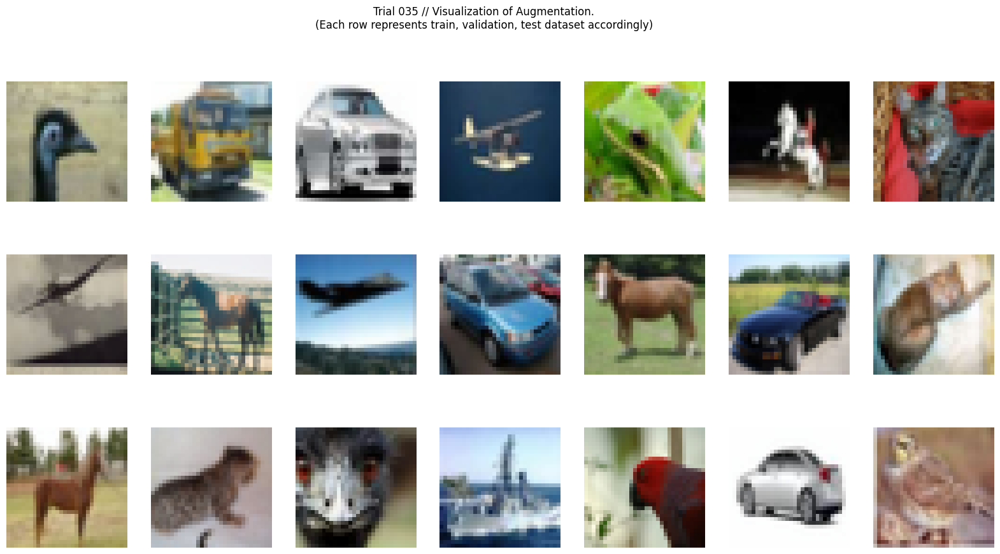

[RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |

Train: [001] Loss: 1.948, Acc: 27.80% F1(macro): 0.27: 100%|██████████| 156/156 [00:10<00:00, 15.03it/s]
 Val:       Loss: 1.649, Acc: 39.73% F1(macro): 0.38: 100%|██████████| 40/40 [00:01<00:00, 37.76it/s]


Model saved. Current best test f1: 0.379


Train: [002] Loss: 1.528, Acc: 44.12% F1(macro): 0.44: 100%|██████████| 156/156 [00:10<00:00, 15.42it/s]
 Val:       Loss: 1.428, Acc: 48.11% F1(macro): 0.48: 100%|██████████| 40/40 [00:01<00:00, 37.10it/s]


Model saved. Current best test f1: 0.477


Train: [003] Loss: 1.386, Acc: 49.74% F1(macro): 0.49: 100%|██████████| 156/156 [00:09<00:00, 15.62it/s]
 Val:       Loss: 1.384, Acc: 49.78% F1(macro): 0.49: 100%|██████████| 40/40 [00:01<00:00, 36.41it/s]


Model saved. Current best test f1: 0.487


Train: [004] Loss: 1.285, Acc: 53.71% F1(macro): 0.53: 100%|██████████| 156/156 [00:10<00:00, 14.35it/s]
 Val:       Loss: 1.333, Acc: 52.83% F1(macro): 0.53: 100%|██████████| 40/40 [00:01<00:00, 29.06it/s]


Model saved. Current best test f1: 0.526


Train: [005] Loss: 1.204, Acc: 56.81% F1(macro): 0.57: 100%|██████████| 156/156 [00:11<00:00, 13.97it/s]
 Val:       Loss: 1.239, Acc: 55.74% F1(macro): 0.56: 100%|██████████| 40/40 [00:01<00:00, 26.92it/s]


Model saved. Current best test f1: 0.557


Train: [006] Loss: 1.134, Acc: 59.52% F1(macro): 0.59: 100%|██████████| 156/156 [00:11<00:00, 13.99it/s]
 Val:       Loss: 1.189, Acc: 57.91% F1(macro): 0.58: 100%|██████████| 40/40 [00:01<00:00, 35.19it/s]


Model saved. Current best test f1: 0.575


Train: [007] Loss: 1.074, Acc: 61.51% F1(macro): 0.61: 100%|██████████| 156/156 [00:10<00:00, 14.57it/s]
 Val:       Loss: 1.172, Acc: 57.94% F1(macro): 0.58: 100%|██████████| 40/40 [00:01<00:00, 35.71it/s]


Model saved. Current best test f1: 0.578


Train: [008] Loss: 1.027, Acc: 63.28% F1(macro): 0.63: 100%|██████████| 156/156 [00:10<00:00, 14.50it/s]
 Val:       Loss: 1.144, Acc: 59.14% F1(macro): 0.59: 100%|██████████| 40/40 [00:01<00:00, 33.33it/s]


Model saved. Current best test f1: 0.592


Train: [009] Loss: 0.984, Acc: 64.86% F1(macro): 0.65: 100%|██████████| 156/156 [00:11<00:00, 14.01it/s]
 Val:       Loss: 1.118, Acc: 60.29% F1(macro): 0.60: 100%|██████████| 40/40 [00:01<00:00, 34.16it/s]


Model saved. Current best test f1: 0.603


Train: [010] Loss: 0.937, Acc: 66.50% F1(macro): 0.66: 100%|██████████| 156/156 [00:11<00:00, 13.92it/s]
 Val:       Loss: 1.105, Acc: 61.42% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 27.32it/s]


Model saved. Current best test f1: 0.612
TEST DATASET


 Val:       Loss: 1.085, Acc: 61.49% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 33.88it/s]
[I 2021-11-22 05:46:04,879] Trial 35 finished with value: 0.6132571360994661 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 25 with value: 0.6374215675170334.


Files already downloaded and verified
Files already downloaded and verified


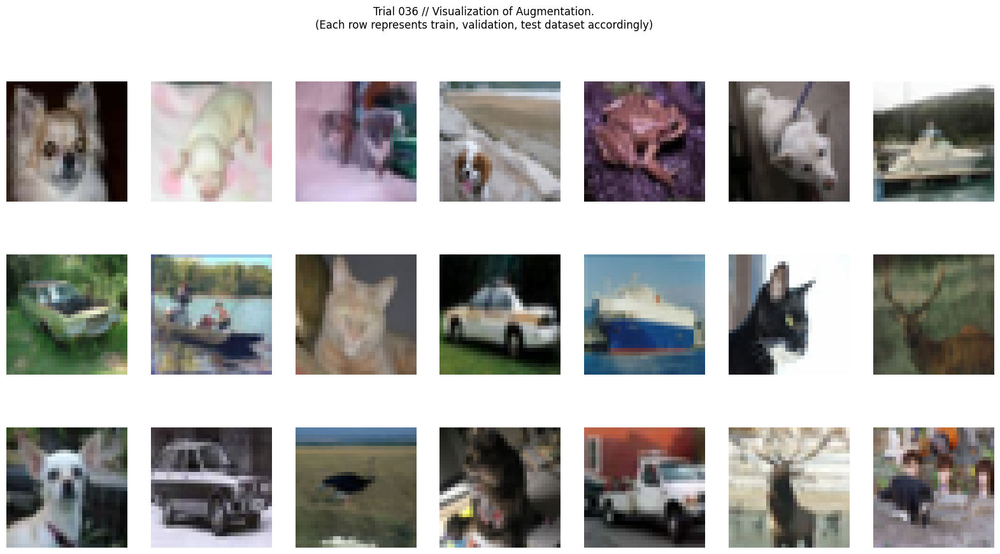

[RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |

Train: [001] Loss: 1.951, Acc: 27.00% F1(macro): 0.27: 100%|██████████| 156/156 [00:12<00:00, 12.99it/s]
 Val:       Loss: 1.673, Acc: 38.04% F1(macro): 0.35: 100%|██████████| 40/40 [00:01<00:00, 30.80it/s]


Model saved. Current best test f1: 0.346


Train: [002] Loss: 1.519, Acc: 44.22% F1(macro): 0.44: 100%|██████████| 156/156 [00:11<00:00, 13.86it/s]
 Val:       Loss: 1.484, Acc: 46.21% F1(macro): 0.46: 100%|██████████| 40/40 [00:01<00:00, 30.98it/s]


Model saved. Current best test f1: 0.459


Train: [003] Loss: 1.364, Acc: 50.30% F1(macro): 0.50: 100%|██████████| 156/156 [00:11<00:00, 13.56it/s]
 Val:       Loss: 1.351, Acc: 51.09% F1(macro): 0.51: 100%|██████████| 40/40 [00:01<00:00, 34.07it/s]


Model saved. Current best test f1: 0.509


Train: [004] Loss: 1.267, Acc: 54.38% F1(macro): 0.54: 100%|██████████| 156/156 [00:11<00:00, 13.02it/s]
 Val:       Loss: 1.290, Acc: 53.54% F1(macro): 0.53: 100%|██████████| 40/40 [00:01<00:00, 33.58it/s]


Model saved. Current best test f1: 0.534


Train: [005] Loss: 1.177, Acc: 57.59% F1(macro): 0.57: 100%|██████████| 156/156 [00:11<00:00, 13.13it/s]
 Val:       Loss: 1.235, Acc: 55.98% F1(macro): 0.56: 100%|██████████| 40/40 [00:01<00:00, 32.59it/s]


Model saved. Current best test f1: 0.559


Train: [006] Loss: 1.115, Acc: 59.95% F1(macro): 0.60: 100%|██████████| 156/156 [00:11<00:00, 13.51it/s]
 Val:       Loss: 1.188, Acc: 57.58% F1(macro): 0.57: 100%|██████████| 40/40 [00:01<00:00, 33.09it/s]


Model saved. Current best test f1: 0.573


Train: [007] Loss: 1.060, Acc: 61.90% F1(macro): 0.62: 100%|██████████| 156/156 [00:11<00:00, 13.11it/s]
 Val:       Loss: 1.197, Acc: 58.95% F1(macro): 0.59: 100%|██████████| 40/40 [00:01<00:00, 26.76it/s]


Model saved. Current best test f1: 0.591


Train: [008] Loss: 1.003, Acc: 64.17% F1(macro): 0.64: 100%|██████████| 156/156 [00:10<00:00, 14.29it/s]
 Val:       Loss: 1.140, Acc: 60.10% F1(macro): 0.60: 100%|██████████| 40/40 [00:01<00:00, 33.40it/s]


Model saved. Current best test f1: 0.599


Train: [009] Loss: 0.962, Acc: 65.80% F1(macro): 0.66: 100%|██████████| 156/156 [00:10<00:00, 14.36it/s]
 Val:       Loss: 1.104, Acc: 60.92% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 37.02it/s]


Model saved. Current best test f1: 0.609


Train: [010] Loss: 0.917, Acc: 67.36% F1(macro): 0.67: 100%|██████████| 156/156 [00:11<00:00, 13.99it/s]
 Val:       Loss: 1.096, Acc: 61.75% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 34.14it/s]


Model saved. Current best test f1: 0.614
TEST DATASET


 Val:       Loss: 1.107, Acc: 61.46% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 35.88it/s]
[I 2021-11-22 05:48:29,259] Trial 36 finished with value: 0.6107143222008707 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 25 with value: 0.6374215675170334.


Files already downloaded and verified
Files already downloaded and verified


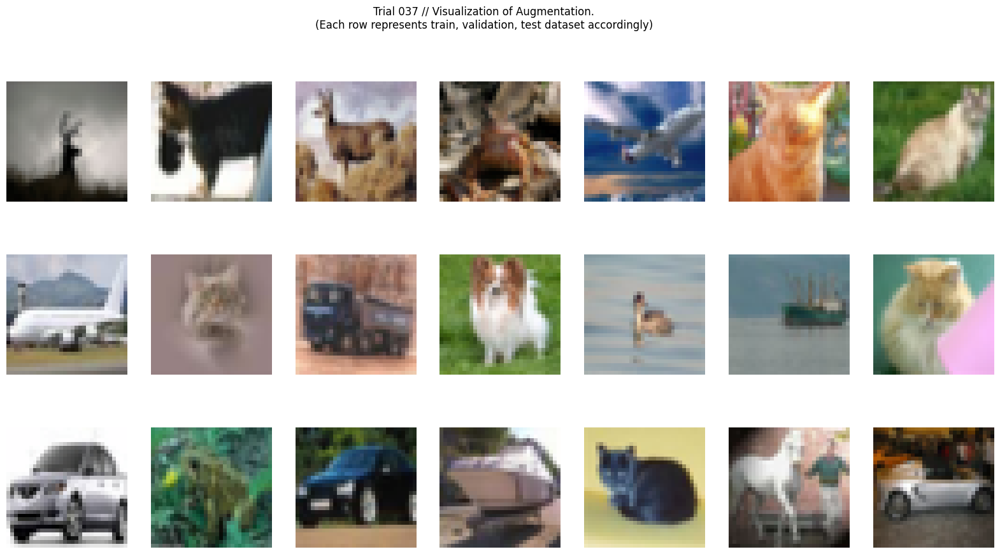

[RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |

Train: [001] Loss: 1.919, Acc: 28.42% F1(macro): 0.28: 100%|██████████| 156/156 [00:11<00:00, 13.07it/s]
 Val:       Loss: 1.699, Acc: 37.99% F1(macro): 0.36: 100%|██████████| 40/40 [00:01<00:00, 30.03it/s]


Model saved. Current best test f1: 0.365


Train: [002] Loss: 1.520, Acc: 44.07% F1(macro): 0.44: 100%|██████████| 156/156 [00:11<00:00, 13.78it/s]
 Val:       Loss: 1.458, Acc: 46.43% F1(macro): 0.46: 100%|██████████| 40/40 [00:01<00:00, 33.67it/s]


Model saved. Current best test f1: 0.463


Train: [003] Loss: 1.378, Acc: 49.82% F1(macro): 0.49: 100%|██████████| 156/156 [00:10<00:00, 14.27it/s]
 Val:       Loss: 1.356, Acc: 50.38% F1(macro): 0.50: 100%|██████████| 40/40 [00:01<00:00, 34.67it/s]


Model saved. Current best test f1: 0.502


Train: [004] Loss: 1.287, Acc: 53.26% F1(macro): 0.53: 100%|██████████| 156/156 [00:10<00:00, 14.28it/s]
 Val:       Loss: 1.299, Acc: 52.70% F1(macro): 0.52: 100%|██████████| 40/40 [00:01<00:00, 37.26it/s]


Model saved. Current best test f1: 0.523


Train: [005] Loss: 1.202, Acc: 56.77% F1(macro): 0.57: 100%|██████████| 156/156 [00:10<00:00, 14.27it/s]
 Val:       Loss: 1.243, Acc: 55.15% F1(macro): 0.55: 100%|██████████| 40/40 [00:01<00:00, 33.57it/s]


Model saved. Current best test f1: 0.550


Train: [006] Loss: 1.147, Acc: 58.81% F1(macro): 0.59: 100%|██████████| 156/156 [00:11<00:00, 14.16it/s]
 Val:       Loss: 1.209, Acc: 56.46% F1(macro): 0.56: 100%|██████████| 40/40 [00:01<00:00, 34.04it/s]


Model saved. Current best test f1: 0.562


Train: [007] Loss: 1.084, Acc: 61.20% F1(macro): 0.61: 100%|██████████| 156/156 [00:11<00:00, 14.10it/s]
 Val:       Loss: 1.187, Acc: 57.83% F1(macro): 0.58: 100%|██████████| 40/40 [00:01<00:00, 33.61it/s]


Model saved. Current best test f1: 0.579


Train: [008] Loss: 1.032, Acc: 63.37% F1(macro): 0.63: 100%|██████████| 156/156 [00:10<00:00, 15.13it/s]
 Val:       Loss: 1.182, Acc: 58.90% F1(macro): 0.59: 100%|██████████| 40/40 [00:01<00:00, 35.99it/s]


Model saved. Current best test f1: 0.595


Train: [009] Loss: 0.982, Acc: 65.08% F1(macro): 0.65: 100%|██████████| 156/156 [00:11<00:00, 14.11it/s]
 Val:       Loss: 1.115, Acc: 60.68% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 36.35it/s]


Model saved. Current best test f1: 0.606


Train: [010] Loss: 0.941, Acc: 66.60% F1(macro): 0.66: 100%|██████████| 156/156 [00:11<00:00, 13.87it/s]
 Val:       Loss: 1.079, Acc: 62.38% F1(macro): 0.63: 100%|██████████| 40/40 [00:01<00:00, 36.91it/s]


Model saved. Current best test f1: 0.625
TEST DATASET


 Val:       Loss: 1.096, Acc: 61.51% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 34.28it/s]
[I 2021-11-22 05:50:48,239] Trial 37 finished with value: 0.615479667497247 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 25 with value: 0.6374215675170334.


Files already downloaded and verified
Files already downloaded and verified


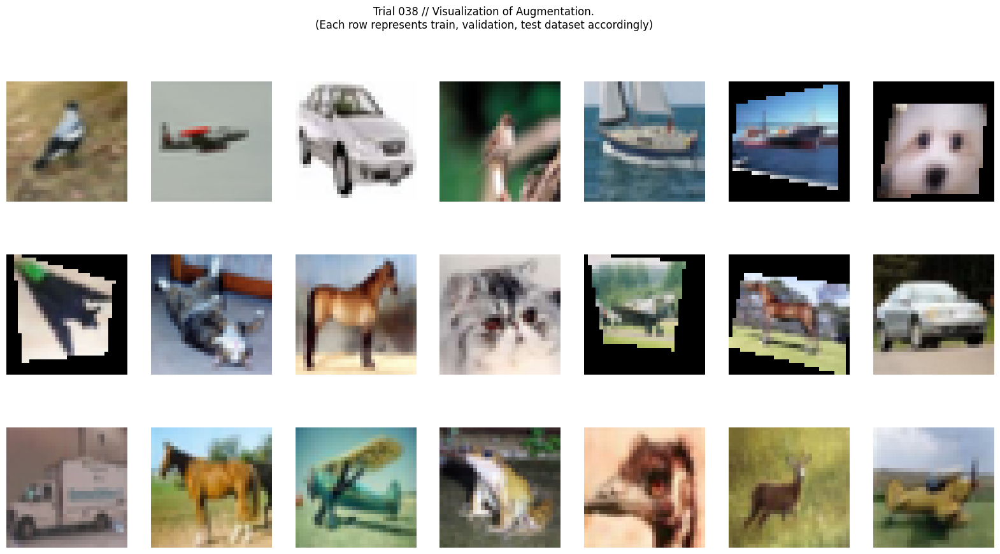

[RandomPerspective(p=0.5), RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           4

Train: [001] Loss: 2.051, Acc: 23.41% F1(macro): 0.23: 100%|██████████| 156/156 [00:10<00:00, 14.70it/s]
 Val:       Loss: 1.807, Acc: 33.61% F1(macro): 0.33: 100%|██████████| 40/40 [00:01<00:00, 22.70it/s]


Model saved. Current best test f1: 0.326


Train: [002] Loss: 1.703, Acc: 37.37% F1(macro): 0.37: 100%|██████████| 156/156 [00:11<00:00, 13.82it/s]
 Val:       Loss: 1.627, Acc: 40.02% F1(macro): 0.38: 100%|██████████| 40/40 [00:01<00:00, 24.90it/s]


Model saved. Current best test f1: 0.382


Train: [003] Loss: 1.560, Acc: 42.65% F1(macro): 0.42: 100%|██████████| 156/156 [00:10<00:00, 14.58it/s]
 Val:       Loss: 1.504, Acc: 45.06% F1(macro): 0.44: 100%|██████████| 40/40 [00:01<00:00, 22.54it/s]


Model saved. Current best test f1: 0.444


Train: [004] Loss: 1.485, Acc: 45.54% F1(macro): 0.45: 100%|██████████| 156/156 [00:11<00:00, 14.04it/s]
 Val:       Loss: 1.450, Acc: 46.53% F1(macro): 0.46: 100%|██████████| 40/40 [00:01<00:00, 23.31it/s]


Model saved. Current best test f1: 0.459


Train: [005] Loss: 1.436, Acc: 47.39% F1(macro): 0.47: 100%|██████████| 156/156 [00:10<00:00, 14.86it/s]
 Val:       Loss: 1.400, Acc: 49.43% F1(macro): 0.49: 100%|██████████| 40/40 [00:01<00:00, 24.27it/s]


Model saved. Current best test f1: 0.490


Train: [006] Loss: 1.376, Acc: 49.94% F1(macro): 0.50: 100%|██████████| 156/156 [00:10<00:00, 14.29it/s]
 Val:       Loss: 1.373, Acc: 50.06% F1(macro): 0.50: 100%|██████████| 40/40 [00:01<00:00, 23.35it/s]


Model saved. Current best test f1: 0.501


Train: [007] Loss: 1.336, Acc: 51.32% F1(macro): 0.51: 100%|██████████| 156/156 [00:10<00:00, 15.16it/s]
 Val:       Loss: 1.360, Acc: 50.73% F1(macro): 0.50: 100%|██████████| 40/40 [00:01<00:00, 23.12it/s]
Train: [008] Loss: 1.297, Acc: 53.38% F1(macro): 0.53: 100%|██████████| 156/156 [00:10<00:00, 14.67it/s]
 Val:       Loss: 1.393, Acc: 50.11% F1(macro): 0.50: 100%|██████████| 40/40 [00:02<00:00, 19.48it/s]


Model saved. Current best test f1: 0.501


Train: [009] Loss: 1.275, Acc: 53.92% F1(macro): 0.54: 100%|██████████| 156/156 [00:11<00:00, 14.18it/s]
 Val:       Loss: 1.266, Acc: 54.19% F1(macro): 0.54: 100%|██████████| 40/40 [00:01<00:00, 24.08it/s]


Model saved. Current best test f1: 0.538


Train: [010] Loss: 1.227, Acc: 55.75% F1(macro): 0.56: 100%|██████████| 156/156 [00:10<00:00, 14.84it/s]
 Val:       Loss: 1.247, Acc: 54.41% F1(macro): 0.54: 100%|██████████| 40/40 [00:01<00:00, 22.73it/s]


Model saved. Current best test f1: 0.542
TEST DATASET


 Val:       Loss: 1.154, Acc: 57.87% F1(macro): 0.58: 100%|██████████| 40/40 [00:01<00:00, 37.84it/s]
[I 2021-11-22 05:53:08,902] Trial 38 finished with value: 0.5766506930542181 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': True, 'aug_random_flip': True}. Best is trial 25 with value: 0.6374215675170334.


Files already downloaded and verified
Files already downloaded and verified


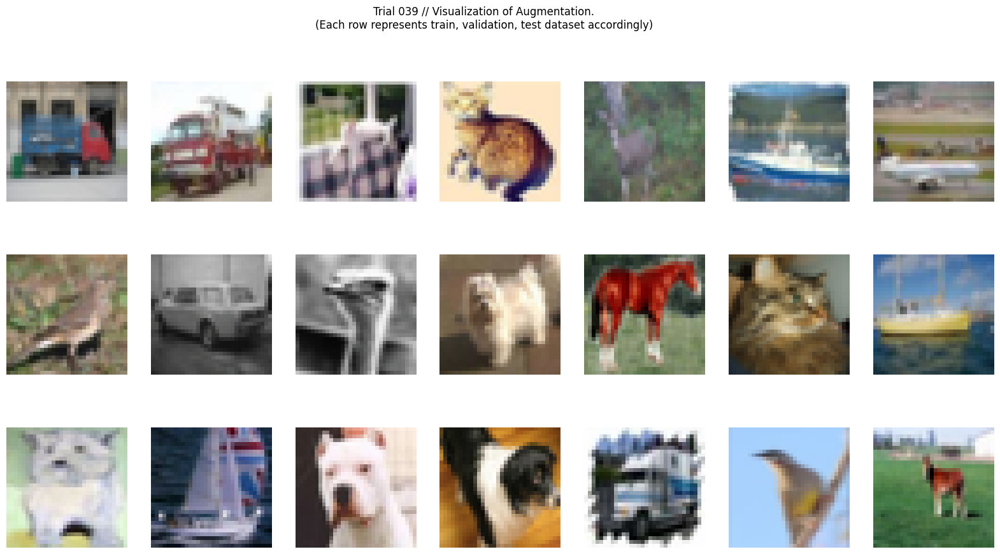

[RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |

Train: [001] Loss: 1.906, Acc: 29.34% F1(macro): 0.29: 100%|██████████| 156/156 [00:10<00:00, 15.15it/s]
 Val:       Loss: 1.607, Acc: 41.30% F1(macro): 0.41: 100%|██████████| 40/40 [00:01<00:00, 35.12it/s]


Model saved. Current best test f1: 0.409


Train: [002] Loss: 1.506, Acc: 45.13% F1(macro): 0.45: 100%|██████████| 156/156 [00:10<00:00, 14.76it/s]
 Val:       Loss: 1.430, Acc: 47.63% F1(macro): 0.47: 100%|██████████| 40/40 [00:01<00:00, 35.80it/s]


Model saved. Current best test f1: 0.473


Train: [003] Loss: 1.366, Acc: 50.70% F1(macro): 0.50: 100%|██████████| 156/156 [00:09<00:00, 15.62it/s]
 Val:       Loss: 1.331, Acc: 52.11% F1(macro): 0.52: 100%|██████████| 40/40 [00:01<00:00, 37.05it/s]


Model saved. Current best test f1: 0.521


Train: [004] Loss: 1.263, Acc: 54.84% F1(macro): 0.55: 100%|██████████| 156/156 [00:10<00:00, 14.67it/s]
 Val:       Loss: 1.274, Acc: 54.53% F1(macro): 0.54: 100%|██████████| 40/40 [00:01<00:00, 35.02it/s]


Model saved. Current best test f1: 0.540


Train: [005] Loss: 1.182, Acc: 57.74% F1(macro): 0.58: 100%|██████████| 156/156 [00:10<00:00, 15.02it/s]
 Val:       Loss: 1.217, Acc: 56.56% F1(macro): 0.56: 100%|██████████| 40/40 [00:01<00:00, 36.82it/s]


Model saved. Current best test f1: 0.562


Train: [006] Loss: 1.114, Acc: 60.27% F1(macro): 0.60: 100%|██████████| 156/156 [00:09<00:00, 15.74it/s]
 Val:       Loss: 1.209, Acc: 58.19% F1(macro): 0.58: 100%|██████████| 40/40 [00:01<00:00, 36.74it/s]


Model saved. Current best test f1: 0.579


Train: [007] Loss: 1.061, Acc: 62.40% F1(macro): 0.62: 100%|██████████| 156/156 [00:10<00:00, 14.96it/s]
 Val:       Loss: 1.162, Acc: 60.11% F1(macro): 0.60: 100%|██████████| 40/40 [00:01<00:00, 37.55it/s]


Model saved. Current best test f1: 0.603


Train: [008] Loss: 1.007, Acc: 64.07% F1(macro): 0.64: 100%|██████████| 156/156 [00:10<00:00, 15.49it/s]
 Val:       Loss: 1.087, Acc: 62.05% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 37.10it/s]


Model saved. Current best test f1: 0.619


Train: [009] Loss: 0.965, Acc: 65.52% F1(macro): 0.65: 100%|██████████| 156/156 [00:10<00:00, 15.20it/s]
 Val:       Loss: 1.055, Acc: 63.26% F1(macro): 0.63: 100%|██████████| 40/40 [00:01<00:00, 36.66it/s]


Model saved. Current best test f1: 0.630


Train: [010] Loss: 0.911, Acc: 67.77% F1(macro): 0.68: 100%|██████████| 156/156 [00:10<00:00, 14.64it/s]
 Val:       Loss: 1.057, Acc: 63.46% F1(macro): 0.63: 100%|██████████| 40/40 [00:01<00:00, 36.41it/s]


TEST DATASET


 Val:       Loss: 1.061, Acc: 62.68% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 37.51it/s]
[I 2021-11-22 05:55:18,153] Trial 39 finished with value: 0.6189563638327973 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 25 with value: 0.6374215675170334.


Files already downloaded and verified
Files already downloaded and verified


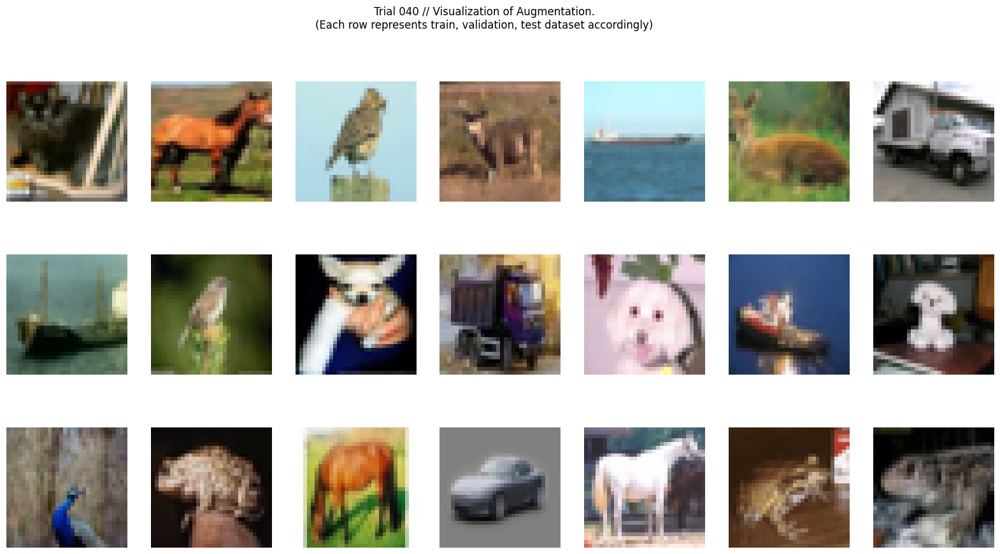

[RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |

Train: [001] Loss: 1.938, Acc: 27.45% F1(macro): 0.27: 100%|██████████| 156/156 [00:10<00:00, 15.32it/s]
 Val:       Loss: 1.609, Acc: 40.02% F1(macro): 0.39: 100%|██████████| 40/40 [00:01<00:00, 37.76it/s]


Model saved. Current best test f1: 0.395


Train: [002] Loss: 1.535, Acc: 43.21% F1(macro): 0.43: 100%|██████████| 156/156 [00:10<00:00, 15.00it/s]
 Val:       Loss: 1.455, Acc: 46.78% F1(macro): 0.46: 100%|██████████| 40/40 [00:01<00:00, 34.21it/s]


Model saved. Current best test f1: 0.455


Train: [003] Loss: 1.373, Acc: 49.88% F1(macro): 0.50: 100%|██████████| 156/156 [00:15<00:00,  9.98it/s]
 Val:       Loss: 1.342, Acc: 51.08% F1(macro): 0.51: 100%|██████████| 40/40 [00:02<00:00, 15.92it/s]


Model saved. Current best test f1: 0.506


Train: [004] Loss: 1.269, Acc: 54.17% F1(macro): 0.54: 100%|██████████| 156/156 [00:18<00:00,  8.25it/s]
 Val:       Loss: 1.271, Acc: 54.58% F1(macro): 0.54: 100%|██████████| 40/40 [00:02<00:00, 17.78it/s]


Model saved. Current best test f1: 0.537


Train: [005] Loss: 1.173, Acc: 57.53% F1(macro): 0.57: 100%|██████████| 156/156 [00:15<00:00, 10.03it/s]
 Val:       Loss: 1.236, Acc: 55.46% F1(macro): 0.55: 100%|██████████| 40/40 [00:01<00:00, 37.64it/s]


Model saved. Current best test f1: 0.545


Train: [006] Loss: 1.108, Acc: 60.16% F1(macro): 0.60: 100%|██████████| 156/156 [00:10<00:00, 15.09it/s]
 Val:       Loss: 1.148, Acc: 58.80% F1(macro): 0.59: 100%|██████████| 40/40 [00:01<00:00, 35.88it/s]


Model saved. Current best test f1: 0.585


Train: [007] Loss: 1.043, Acc: 62.74% F1(macro): 0.63: 100%|██████████| 156/156 [00:14<00:00, 10.41it/s]
 Val:       Loss: 1.175, Acc: 57.54% F1(macro): 0.57: 100%|██████████| 40/40 [00:02<00:00, 16.47it/s]
Train: [008] Loss: 0.996, Acc: 64.53% F1(macro): 0.64: 100%|██████████| 156/156 [00:19<00:00,  8.21it/s]
 Val:       Loss: 1.150, Acc: 59.61% F1(macro): 0.59: 100%|██████████| 40/40 [00:02<00:00, 16.13it/s]


Model saved. Current best test f1: 0.592


Train: [009] Loss: 0.942, Acc: 66.40% F1(macro): 0.66: 100%|██████████| 156/156 [00:19<00:00,  8.14it/s]
 Val:       Loss: 1.067, Acc: 62.53% F1(macro): 0.62: 100%|██████████| 40/40 [00:02<00:00, 16.77it/s]


Model saved. Current best test f1: 0.622


Train: [010] Loss: 0.906, Acc: 67.80% F1(macro): 0.68: 100%|██████████| 156/156 [00:15<00:00, 10.39it/s]
 Val:       Loss: 1.091, Acc: 61.56% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 20.06it/s]

TEST DATASET



 Val:       Loss: 1.087, Acc: 61.56% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 24.80it/s]
[I 2021-11-22 05:58:23,639] Trial 40 finished with value: 0.6139453346774686 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 25 with value: 0.6374215675170334.


Files already downloaded and verified
Files already downloaded and verified


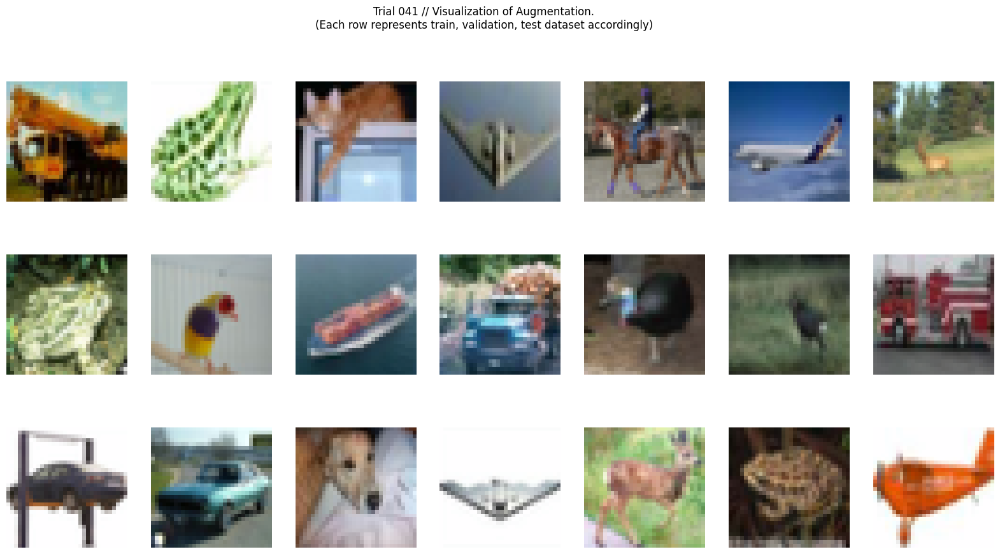

[RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |

Train: [001] Loss: 1.915, Acc: 28.51% F1(macro): 0.28: 100%|██████████| 156/156 [00:11<00:00, 13.33it/s]
 Val:       Loss: 1.640, Acc: 39.73% F1(macro): 0.39: 100%|██████████| 40/40 [00:01<00:00, 24.78it/s]


Model saved. Current best test f1: 0.387


Train: [002] Loss: 1.507, Acc: 44.73% F1(macro): 0.44: 100%|██████████| 156/156 [00:11<00:00, 13.64it/s]
 Val:       Loss: 1.420, Acc: 48.59% F1(macro): 0.48: 100%|██████████| 40/40 [00:01<00:00, 37.66it/s]


Model saved. Current best test f1: 0.477


Train: [003] Loss: 1.348, Acc: 51.02% F1(macro): 0.51: 100%|██████████| 156/156 [00:10<00:00, 15.30it/s]
 Val:       Loss: 1.349, Acc: 51.41% F1(macro): 0.51: 100%|██████████| 40/40 [00:01<00:00, 36.66it/s]


Model saved. Current best test f1: 0.510


Train: [004] Loss: 1.249, Acc: 55.22% F1(macro): 0.55: 100%|██████████| 156/156 [00:10<00:00, 15.00it/s]
 Val:       Loss: 1.241, Acc: 55.54% F1(macro): 0.55: 100%|██████████| 40/40 [00:01<00:00, 33.07it/s]


Model saved. Current best test f1: 0.554


Train: [005] Loss: 1.162, Acc: 58.74% F1(macro): 0.59: 100%|██████████| 156/156 [00:17<00:00,  9.14it/s]
 Val:       Loss: 1.189, Acc: 57.43% F1(macro): 0.57: 100%|██████████| 40/40 [00:02<00:00, 17.51it/s]


Model saved. Current best test f1: 0.571


Train: [006] Loss: 1.094, Acc: 60.94% F1(macro): 0.61: 100%|██████████| 156/156 [00:18<00:00,  8.32it/s]
 Val:       Loss: 1.148, Acc: 58.63% F1(macro): 0.58: 100%|██████████| 40/40 [00:01<00:00, 26.86it/s]


Model saved. Current best test f1: 0.580


Train: [007] Loss: 1.042, Acc: 63.00% F1(macro): 0.63: 100%|██████████| 156/156 [00:10<00:00, 14.63it/s]
 Val:       Loss: 1.100, Acc: 60.65% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 36.21it/s]


Model saved. Current best test f1: 0.607


Train: [008] Loss: 0.976, Acc: 65.31% F1(macro): 0.65: 100%|██████████| 156/156 [00:10<00:00, 14.44it/s]
 Val:       Loss: 1.062, Acc: 62.76% F1(macro): 0.63: 100%|██████████| 40/40 [00:01<00:00, 36.64it/s]


Model saved. Current best test f1: 0.627


Train: [009] Loss: 0.933, Acc: 66.81% F1(macro): 0.67: 100%|██████████| 156/156 [00:10<00:00, 14.94it/s]
 Val:       Loss: 1.080, Acc: 61.89% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 36.64it/s]
Train: [010] Loss: 0.888, Acc: 68.51% F1(macro): 0.68: 100%|██████████| 156/156 [00:10<00:00, 15.46it/s]
 Val:       Loss: 1.020, Acc: 63.88% F1(macro): 0.63: 100%|██████████| 40/40 [00:01<00:00, 33.99it/s]


Model saved. Current best test f1: 0.634
TEST DATASET


 Val:       Loss: 1.034, Acc: 62.86% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 37.07it/s]
[I 2021-11-22 06:00:54,077] Trial 41 finished with value: 0.6240386332065796 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 25 with value: 0.6374215675170334.


Files already downloaded and verified
Files already downloaded and verified


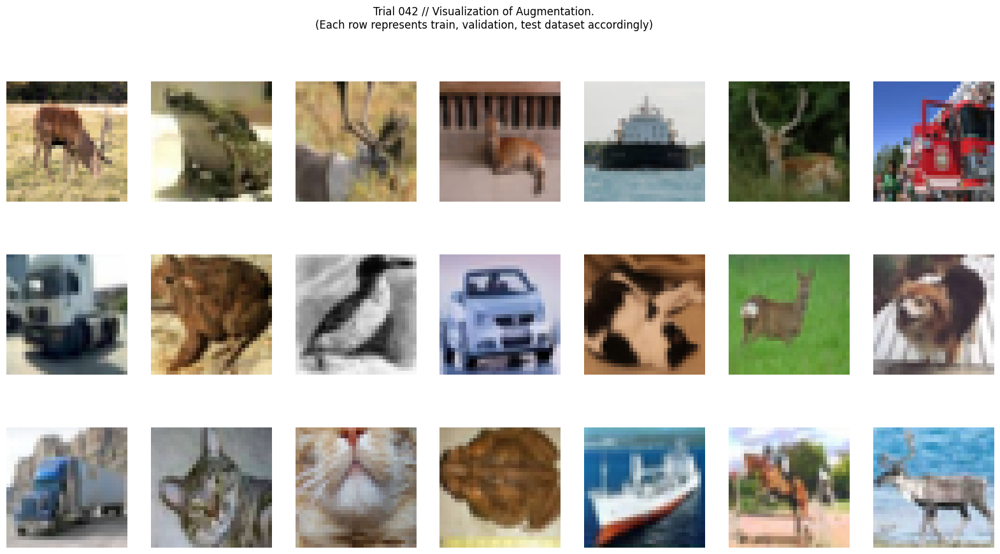

[RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |

Train: [001] Loss: 1.939, Acc: 27.92% F1(macro): 0.28: 100%|██████████| 156/156 [00:10<00:00, 14.48it/s]
 Val:       Loss: 1.626, Acc: 40.07% F1(macro): 0.38: 100%|██████████| 40/40 [00:01<00:00, 35.31it/s]


Model saved. Current best test f1: 0.382


Train: [002] Loss: 1.502, Acc: 44.43% F1(macro): 0.44: 100%|██████████| 156/156 [00:10<00:00, 14.98it/s]
 Val:       Loss: 1.489, Acc: 46.32% F1(macro): 0.46: 100%|██████████| 40/40 [00:01<00:00, 31.74it/s]


Model saved. Current best test f1: 0.458


Train: [003] Loss: 1.371, Acc: 50.15% F1(macro): 0.50: 100%|██████████| 156/156 [00:10<00:00, 14.66it/s]
 Val:       Loss: 1.364, Acc: 50.62% F1(macro): 0.50: 100%|██████████| 40/40 [00:01<00:00, 33.21it/s]


Model saved. Current best test f1: 0.502


Train: [004] Loss: 1.261, Acc: 54.45% F1(macro): 0.54: 100%|██████████| 156/156 [00:10<00:00, 14.46it/s]
 Val:       Loss: 1.288, Acc: 53.42% F1(macro): 0.53: 100%|██████████| 40/40 [00:02<00:00, 17.00it/s]


Model saved. Current best test f1: 0.527


Train: [005] Loss: 1.186, Acc: 56.97% F1(macro): 0.57: 100%|██████████| 156/156 [00:19<00:00,  8.19it/s]
 Val:       Loss: 1.244, Acc: 55.80% F1(macro): 0.55: 100%|██████████| 40/40 [00:02<00:00, 19.49it/s]


Model saved. Current best test f1: 0.551


Train: [006] Loss: 1.117, Acc: 59.71% F1(macro): 0.60: 100%|██████████| 156/156 [00:19<00:00,  7.82it/s]
 Val:       Loss: 1.190, Acc: 57.66% F1(macro): 0.57: 100%|██████████| 40/40 [00:02<00:00, 15.87it/s]


Model saved. Current best test f1: 0.572


Train: [007] Loss: 1.061, Acc: 62.06% F1(macro): 0.62: 100%|██████████| 156/156 [00:17<00:00,  9.04it/s]
 Val:       Loss: 1.150, Acc: 58.81% F1(macro): 0.59: 100%|██████████| 40/40 [00:01<00:00, 23.84it/s]


Model saved. Current best test f1: 0.586


Train: [008] Loss: 1.007, Acc: 64.23% F1(macro): 0.64: 100%|██████████| 156/156 [00:12<00:00, 12.70it/s]
 Val:       Loss: 1.113, Acc: 59.82% F1(macro): 0.59: 100%|██████████| 40/40 [00:01<00:00, 23.06it/s]


Model saved. Current best test f1: 0.592


Train: [009] Loss: 0.959, Acc: 65.60% F1(macro): 0.66: 100%|██████████| 156/156 [00:12<00:00, 12.91it/s]
 Val:       Loss: 1.088, Acc: 61.60% F1(macro): 0.61: 100%|██████████| 40/40 [00:02<00:00, 16.96it/s]


Model saved. Current best test f1: 0.612


Train: [010] Loss: 0.914, Acc: 67.22% F1(macro): 0.67: 100%|██████████| 156/156 [00:10<00:00, 14.67it/s]
 Val:       Loss: 1.052, Acc: 62.70% F1(macro): 0.63: 100%|██████████| 40/40 [00:01<00:00, 36.19it/s]


Model saved. Current best test f1: 0.625
TEST DATASET


 Val:       Loss: 1.068, Acc: 62.30% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 34.64it/s]
[I 2021-11-22 06:03:44,453] Trial 42 finished with value: 0.6225922678094825 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 25 with value: 0.6374215675170334.


Files already downloaded and verified
Files already downloaded and verified


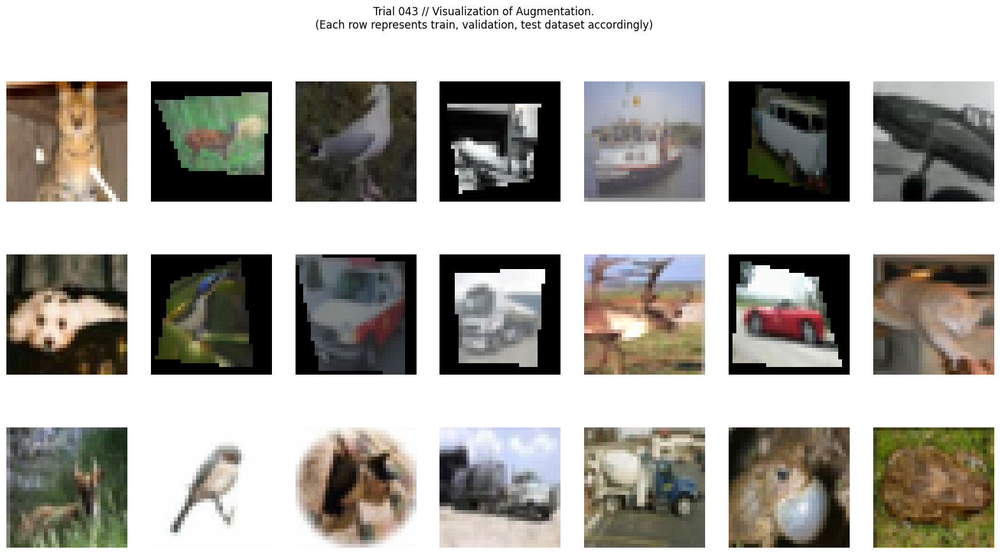

[ColorJitter(brightness=(0.5, 1.5), contrast=(0.5, 1.5), saturation=(0.5, 1.5), hue=None), RandomPerspective(p=0.5), RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40    

Train: [001] Loss: 2.217, Acc: 17.05% F1(macro): 0.17: 100%|██████████| 156/156 [00:11<00:00, 13.94it/s]
 Val:       Loss: 2.095, Acc: 25.62% F1(macro): 0.24: 100%|██████████| 40/40 [00:02<00:00, 16.20it/s]


Model saved. Current best test f1: 0.236


Train: [002] Loss: 1.864, Acc: 30.59% F1(macro): 0.30: 100%|██████████| 156/156 [00:11<00:00, 13.62it/s]
 Val:       Loss: 1.779, Acc: 34.02% F1(macro): 0.33: 100%|██████████| 40/40 [00:02<00:00, 16.40it/s]


Model saved. Current best test f1: 0.327


Train: [003] Loss: 1.702, Acc: 37.23% F1(macro): 0.37: 100%|██████████| 156/156 [00:11<00:00, 14.05it/s]
 Val:       Loss: 1.705, Acc: 37.89% F1(macro): 0.38: 100%|██████████| 40/40 [00:02<00:00, 15.18it/s]


Model saved. Current best test f1: 0.377


Train: [004] Loss: 1.620, Acc: 40.22% F1(macro): 0.40: 100%|██████████| 156/156 [00:11<00:00, 13.98it/s]
 Val:       Loss: 1.626, Acc: 40.95% F1(macro): 0.41: 100%|██████████| 40/40 [00:02<00:00, 15.98it/s]


Model saved. Current best test f1: 0.407


Train: [005] Loss: 1.563, Acc: 42.93% F1(macro): 0.43: 100%|██████████| 156/156 [00:11<00:00, 13.90it/s]
 Val:       Loss: 1.585, Acc: 42.80% F1(macro): 0.43: 100%|██████████| 40/40 [00:02<00:00, 16.39it/s]


Model saved. Current best test f1: 0.426


Train: [006] Loss: 1.501, Acc: 45.40% F1(macro): 0.45: 100%|██████████| 156/156 [00:11<00:00, 13.84it/s]
 Val:       Loss: 1.486, Acc: 45.76% F1(macro): 0.45: 100%|██████████| 40/40 [00:02<00:00, 15.80it/s]


Model saved. Current best test f1: 0.453


Train: [007] Loss: 1.469, Acc: 46.30% F1(macro): 0.46: 100%|██████████| 156/156 [00:22<00:00,  6.94it/s]
 Val:       Loss: 1.473, Acc: 46.10% F1(macro): 0.46: 100%|██████████| 40/40 [00:04<00:00,  8.64it/s]


Model saved. Current best test f1: 0.461


Train: [008] Loss: 1.441, Acc: 47.92% F1(macro): 0.48: 100%|██████████| 156/156 [00:22<00:00,  6.89it/s]
 Val:       Loss: 1.462, Acc: 47.24% F1(macro): 0.48: 100%|██████████| 40/40 [00:04<00:00,  8.30it/s]


Model saved. Current best test f1: 0.475


Train: [009] Loss: 1.405, Acc: 49.03% F1(macro): 0.49: 100%|██████████| 156/156 [00:18<00:00,  8.31it/s]
 Val:       Loss: 1.420, Acc: 48.61% F1(macro): 0.48: 100%|██████████| 40/40 [00:03<00:00, 12.80it/s]


Model saved. Current best test f1: 0.482


Train: [010] Loss: 1.353, Acc: 51.40% F1(macro): 0.51: 100%|██████████| 156/156 [00:16<00:00,  9.61it/s]
 Val:       Loss: 1.379, Acc: 50.87% F1(macro): 0.50: 100%|██████████| 40/40 [00:03<00:00, 11.24it/s]


Model saved. Current best test f1: 0.504
TEST DATASET


 Val:       Loss: 1.215, Acc: 56.56% F1(macro): 0.56: 100%|██████████| 40/40 [00:01<00:00, 26.88it/s]
[I 2021-11-22 06:07:02,354] Trial 43 finished with value: 0.5575445957373715 and parameters: {'aug_color_jitter': True, 'aug_random_perspective': True, 'aug_random_flip': True}. Best is trial 25 with value: 0.6374215675170334.


Files already downloaded and verified
Files already downloaded and verified


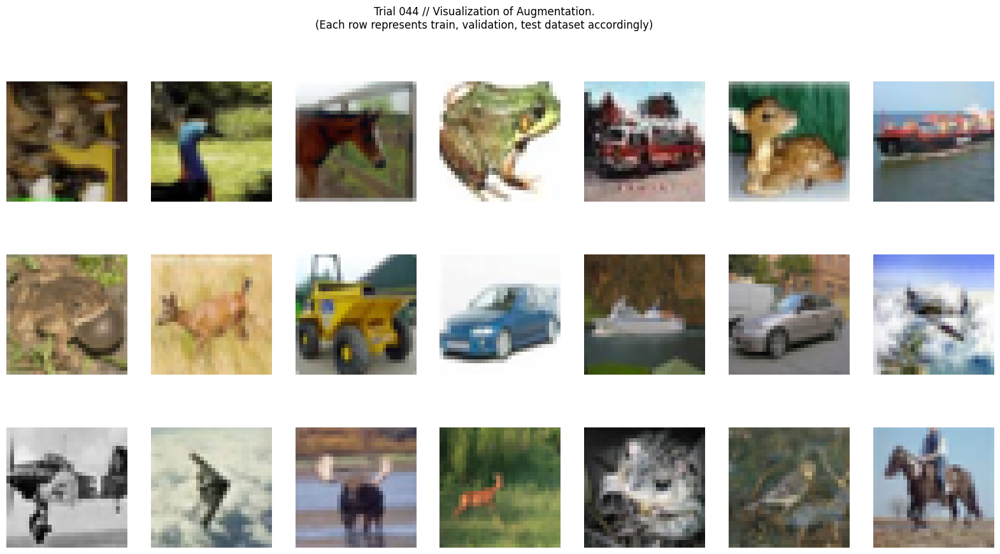

[]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |     34,760 | InvertedResid

Train: [001] Loss: 1.915, Acc: 29.30% F1(macro): 0.29: 100%|██████████| 156/156 [00:18<00:00,  8.66it/s]
 Val:       Loss: 1.645, Acc: 40.61% F1(macro): 0.39: 100%|██████████| 40/40 [00:02<00:00, 16.40it/s]


Model saved. Current best test f1: 0.385


Train: [002] Loss: 1.484, Acc: 46.04% F1(macro): 0.46: 100%|██████████| 156/156 [00:19<00:00,  8.06it/s]
 Val:       Loss: 1.428, Acc: 48.59% F1(macro): 0.48: 100%|██████████| 40/40 [00:02<00:00, 16.85it/s]


Model saved. Current best test f1: 0.480


Train: [003] Loss: 1.329, Acc: 51.61% F1(macro): 0.51: 100%|██████████| 156/156 [00:19<00:00,  7.86it/s]
 Val:       Loss: 1.366, Acc: 50.84% F1(macro): 0.50: 100%|██████████| 40/40 [00:01<00:00, 22.56it/s]


Model saved. Current best test f1: 0.499


Train: [004] Loss: 1.215, Acc: 56.07% F1(macro): 0.56: 100%|██████████| 156/156 [00:11<00:00, 13.06it/s]
 Val:       Loss: 1.298, Acc: 53.93% F1(macro): 0.54: 100%|██████████| 40/40 [00:01<00:00, 26.64it/s]


Model saved. Current best test f1: 0.537


Train: [005] Loss: 1.130, Acc: 59.47% F1(macro): 0.59: 100%|██████████| 156/156 [00:12<00:00, 12.51it/s]
 Val:       Loss: 1.288, Acc: 53.99% F1(macro): 0.54: 100%|██████████| 40/40 [00:01<00:00, 35.16it/s]


Model saved. Current best test f1: 0.540


Train: [006] Loss: 1.065, Acc: 61.63% F1(macro): 0.62: 100%|██████████| 156/156 [00:18<00:00,  8.52it/s]
 Val:       Loss: 1.236, Acc: 57.30% F1(macro): 0.57: 100%|██████████| 40/40 [00:02<00:00, 18.82it/s]


Model saved. Current best test f1: 0.573


Train: [007] Loss: 0.981, Acc: 64.93% F1(macro): 0.65: 100%|██████████| 156/156 [00:19<00:00,  7.93it/s]
 Val:       Loss: 1.220, Acc: 57.07% F1(macro): 0.57: 100%|██████████| 40/40 [00:02<00:00, 17.02it/s]
Train: [008] Loss: 0.927, Acc: 66.94% F1(macro): 0.67: 100%|██████████| 156/156 [00:18<00:00,  8.54it/s]
 Val:       Loss: 1.266, Acc: 55.96% F1(macro): 0.56: 100%|██████████| 40/40 [00:01<00:00, 20.19it/s]
Train: [009] Loss: 0.886, Acc: 68.60% F1(macro): 0.69: 100%|██████████| 156/156 [00:12<00:00, 12.81it/s]
 Val:       Loss: 1.196, Acc: 58.99% F1(macro): 0.59: 100%|██████████| 40/40 [00:01<00:00, 24.32it/s]


Model saved. Current best test f1: 0.585


Train: [010] Loss: 0.837, Acc: 70.29% F1(macro): 0.70: 100%|██████████| 156/156 [00:12<00:00, 12.87it/s]
 Val:       Loss: 1.216, Acc: 58.45% F1(macro): 0.58: 100%|██████████| 40/40 [00:01<00:00, 30.36it/s]

TEST DATASET



 Val:       Loss: 1.203, Acc: 57.92% F1(macro): 0.58: 100%|██████████| 40/40 [00:01<00:00, 31.25it/s]
[I 2021-11-22 06:10:19,040] Trial 44 finished with value: 0.5752776079813247 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': False}. Best is trial 25 with value: 0.6374215675170334.


Files already downloaded and verified
Files already downloaded and verified


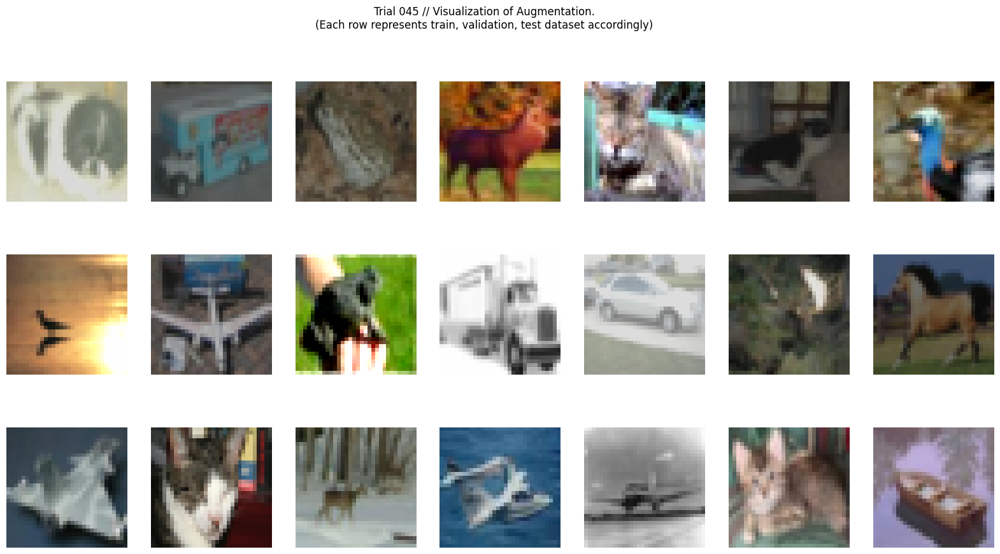

[ColorJitter(brightness=(0.5, 1.5), contrast=(0.5, 1.5), saturation=(0.5, 1.5), hue=None), RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     

Train: [001] Loss: 2.025, Acc: 24.34% F1(macro): 0.24: 100%|██████████| 156/156 [00:13<00:00, 11.73it/s]
 Val:       Loss: 1.833, Acc: 32.93% F1(macro): 0.31: 100%|██████████| 40/40 [00:01<00:00, 20.40it/s]


Model saved. Current best test f1: 0.315


Train: [002] Loss: 1.674, Acc: 37.99% F1(macro): 0.37: 100%|██████████| 156/156 [00:10<00:00, 14.69it/s]
 Val:       Loss: 1.676, Acc: 40.50% F1(macro): 0.39: 100%|██████████| 40/40 [00:01<00:00, 20.74it/s]


Model saved. Current best test f1: 0.391


Train: [003] Loss: 1.550, Acc: 43.02% F1(macro): 0.43: 100%|██████████| 156/156 [00:10<00:00, 14.20it/s]
 Val:       Loss: 1.507, Acc: 45.16% F1(macro): 0.45: 100%|██████████| 40/40 [00:02<00:00, 14.97it/s]


Model saved. Current best test f1: 0.450


Train: [004] Loss: 1.448, Acc: 47.16% F1(macro): 0.47: 100%|██████████| 156/156 [00:20<00:00,  7.45it/s]
 Val:       Loss: 1.448, Acc: 48.55% F1(macro): 0.48: 100%|██████████| 40/40 [00:03<00:00, 10.04it/s]


Model saved. Current best test f1: 0.484


Train: [005] Loss: 1.380, Acc: 49.71% F1(macro): 0.49: 100%|██████████| 156/156 [00:20<00:00,  7.58it/s]
 Val:       Loss: 1.376, Acc: 51.01% F1(macro): 0.51: 100%|██████████| 40/40 [00:03<00:00, 10.23it/s]


Model saved. Current best test f1: 0.510


Train: [006] Loss: 1.312, Acc: 52.36% F1(macro): 0.52: 100%|██████████| 156/156 [00:17<00:00,  8.69it/s]
 Val:       Loss: 1.347, Acc: 51.82% F1(macro): 0.52: 100%|██████████| 40/40 [00:02<00:00, 16.13it/s]


Model saved. Current best test f1: 0.515


Train: [007] Loss: 1.268, Acc: 54.24% F1(macro): 0.54: 100%|██████████| 156/156 [00:14<00:00, 11.00it/s]
 Val:       Loss: 1.275, Acc: 54.50% F1(macro): 0.54: 100%|██████████| 40/40 [00:02<00:00, 15.54it/s]


Model saved. Current best test f1: 0.542


Train: [008] Loss: 1.195, Acc: 57.13% F1(macro): 0.57: 100%|██████████| 156/156 [00:17<00:00,  9.09it/s]
 Val:       Loss: 1.228, Acc: 56.32% F1(macro): 0.56: 100%|██████████| 40/40 [00:03<00:00, 10.09it/s]


Model saved. Current best test f1: 0.555


Train: [009] Loss: 1.147, Acc: 58.70% F1(macro): 0.59: 100%|██████████| 156/156 [00:20<00:00,  7.76it/s]
 Val:       Loss: 1.205, Acc: 57.19% F1(macro): 0.56: 100%|██████████| 40/40 [00:04<00:00,  9.75it/s]


Model saved. Current best test f1: 0.565


Train: [010] Loss: 1.096, Acc: 61.19% F1(macro): 0.61: 100%|██████████| 156/156 [00:20<00:00,  7.73it/s]
 Val:       Loss: 1.168, Acc: 59.36% F1(macro): 0.59: 100%|██████████| 40/40 [00:03<00:00, 10.29it/s]


Model saved. Current best test f1: 0.593
TEST DATASET


 Val:       Loss: 1.105, Acc: 60.76% F1(macro): 0.60: 100%|██████████| 40/40 [00:02<00:00, 15.07it/s]
[I 2021-11-22 06:14:00,192] Trial 45 finished with value: 0.6049778498040077 and parameters: {'aug_color_jitter': True, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 25 with value: 0.6374215675170334.


Files already downloaded and verified
Files already downloaded and verified


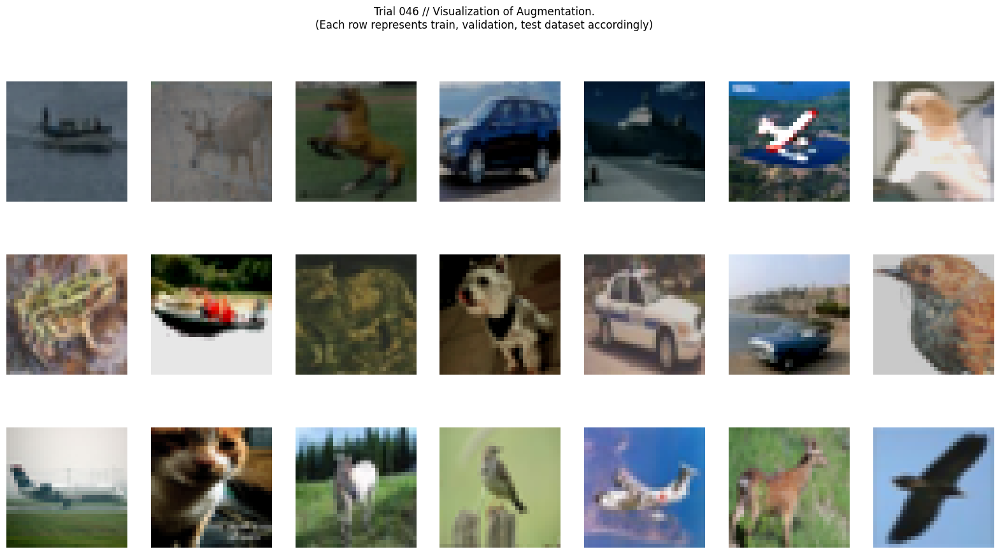

[ColorJitter(brightness=(0.5, 1.5), contrast=(0.5, 1.5), saturation=(0.5, 1.5), hue=None)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |

Train: [001] Loss: 2.098, Acc: 21.72% F1(macro): 0.21: 100%|██████████| 156/156 [00:14<00:00, 11.03it/s]
 Val:       Loss: 1.887, Acc: 30.02% F1(macro): 0.29: 100%|██████████| 40/40 [00:02<00:00, 16.34it/s]


Model saved. Current best test f1: 0.286


Train: [002] Loss: 1.717, Acc: 36.08% F1(macro): 0.36: 100%|██████████| 156/156 [00:12<00:00, 12.13it/s]
 Val:       Loss: 1.633, Acc: 39.63% F1(macro): 0.39: 100%|██████████| 40/40 [00:02<00:00, 16.32it/s]


Model saved. Current best test f1: 0.386


Train: [003] Loss: 1.548, Acc: 42.88% F1(macro): 0.42: 100%|██████████| 156/156 [00:20<00:00,  7.57it/s]
 Val:       Loss: 1.541, Acc: 43.94% F1(macro): 0.43: 100%|██████████| 40/40 [00:03<00:00, 10.42it/s]


Model saved. Current best test f1: 0.430


Train: [004] Loss: 1.450, Acc: 47.06% F1(macro): 0.47: 100%|██████████| 156/156 [00:20<00:00,  7.55it/s]
 Val:       Loss: 1.456, Acc: 46.61% F1(macro): 0.46: 100%|██████████| 40/40 [00:03<00:00, 10.22it/s]


Model saved. Current best test f1: 0.461


Train: [005] Loss: 1.347, Acc: 51.07% F1(macro): 0.51: 100%|██████████| 156/156 [00:18<00:00,  8.36it/s]
 Val:       Loss: 1.378, Acc: 50.33% F1(macro): 0.50: 100%|██████████| 40/40 [00:02<00:00, 15.60it/s]


Model saved. Current best test f1: 0.504


Train: [006] Loss: 1.272, Acc: 54.24% F1(macro): 0.54: 100%|██████████| 156/156 [00:12<00:00, 12.00it/s]
 Val:       Loss: 1.299, Acc: 54.03% F1(macro): 0.53: 100%|██████████| 40/40 [00:01<00:00, 21.57it/s]


Model saved. Current best test f1: 0.533


Train: [007] Loss: 1.188, Acc: 57.29% F1(macro): 0.57: 100%|██████████| 156/156 [00:10<00:00, 14.36it/s]
 Val:       Loss: 1.243, Acc: 56.06% F1(macro): 0.56: 100%|██████████| 40/40 [00:01<00:00, 20.90it/s]


Model saved. Current best test f1: 0.555


Train: [008] Loss: 1.116, Acc: 60.17% F1(macro): 0.60: 100%|██████████| 156/156 [00:11<00:00, 14.01it/s]
 Val:       Loss: 1.182, Acc: 58.55% F1(macro): 0.58: 100%|██████████| 40/40 [00:01<00:00, 21.71it/s]


Model saved. Current best test f1: 0.581


Train: [009] Loss: 1.040, Acc: 62.92% F1(macro): 0.63: 100%|██████████| 156/156 [00:10<00:00, 14.23it/s]
 Val:       Loss: 1.187, Acc: 57.77% F1(macro): 0.58: 100%|██████████| 40/40 [00:01<00:00, 21.90it/s]
Train: [010] Loss: 0.992, Acc: 64.71% F1(macro): 0.65: 100%|██████████| 156/156 [00:10<00:00, 15.21it/s]
 Val:       Loss: 1.139, Acc: 60.53% F1(macro): 0.60: 100%|██████████| 40/40 [00:01<00:00, 21.93it/s]


Model saved. Current best test f1: 0.605
TEST DATASET


 Val:       Loss: 1.089, Acc: 61.54% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 36.11it/s]
[I 2021-11-22 06:17:05,381] Trial 46 finished with value: 0.6141581098965979 and parameters: {'aug_color_jitter': True, 'aug_random_perspective': False, 'aug_random_flip': False}. Best is trial 25 with value: 0.6374215675170334.


Files already downloaded and verified
Files already downloaded and verified


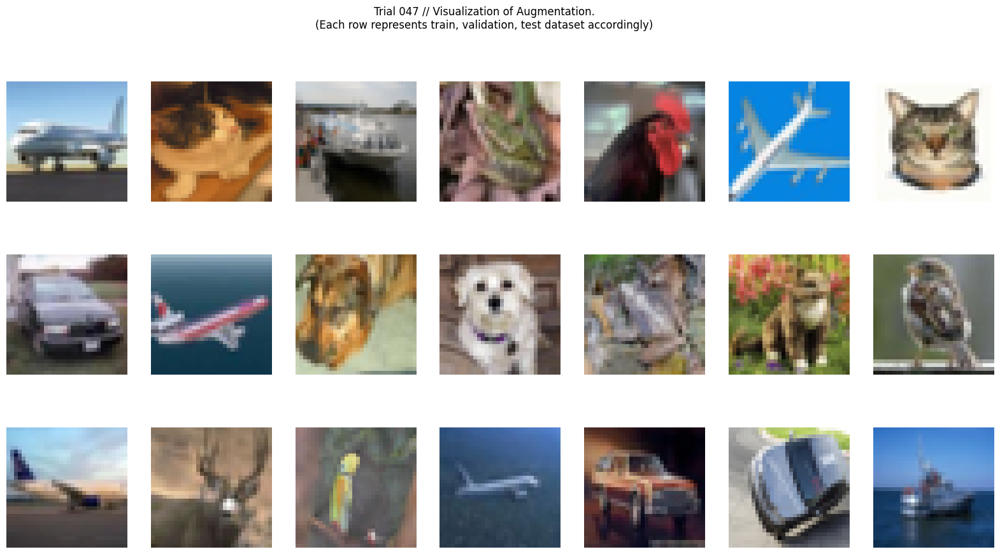

[RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |

Train: [001] Loss: 1.919, Acc: 28.65% F1(macro): 0.28: 100%|██████████| 156/156 [00:10<00:00, 15.13it/s]
 Val:       Loss: 1.663, Acc: 39.46% F1(macro): 0.38: 100%|██████████| 40/40 [00:01<00:00, 30.91it/s]


Model saved. Current best test f1: 0.378


Train: [002] Loss: 1.515, Acc: 44.46% F1(macro): 0.44: 100%|██████████| 156/156 [00:10<00:00, 14.45it/s]
 Val:       Loss: 1.461, Acc: 47.93% F1(macro): 0.47: 100%|██████████| 40/40 [00:01<00:00, 36.58it/s]


Model saved. Current best test f1: 0.474


Train: [003] Loss: 1.371, Acc: 50.24% F1(macro): 0.50: 100%|██████████| 156/156 [00:10<00:00, 14.77it/s]
 Val:       Loss: 1.353, Acc: 51.70% F1(macro): 0.51: 100%|██████████| 40/40 [00:01<00:00, 33.13it/s]


Model saved. Current best test f1: 0.510


Train: [004] Loss: 1.263, Acc: 54.29% F1(macro): 0.54: 100%|██████████| 156/156 [00:16<00:00,  9.40it/s]
 Val:       Loss: 1.278, Acc: 54.59% F1(macro): 0.54: 100%|██████████| 40/40 [00:02<00:00, 17.93it/s]


Model saved. Current best test f1: 0.539


Train: [005] Loss: 1.176, Acc: 58.26% F1(macro): 0.58: 100%|██████████| 156/156 [00:18<00:00,  8.48it/s]
 Val:       Loss: 1.228, Acc: 56.69% F1(macro): 0.56: 100%|██████████| 40/40 [00:02<00:00, 17.49it/s]


Model saved. Current best test f1: 0.560


Train: [006] Loss: 1.098, Acc: 60.86% F1(macro): 0.61: 100%|██████████| 156/156 [00:19<00:00,  7.88it/s]
 Val:       Loss: 1.220, Acc: 56.68% F1(macro): 0.56: 100%|██████████| 40/40 [00:02<00:00, 18.10it/s]


Model saved. Current best test f1: 0.562


Train: [007] Loss: 1.045, Acc: 62.78% F1(macro): 0.63: 100%|██████████| 156/156 [00:12<00:00, 12.45it/s]
 Val:       Loss: 1.155, Acc: 59.74% F1(macro): 0.59: 100%|██████████| 40/40 [00:01<00:00, 24.14it/s]


Model saved. Current best test f1: 0.595


Train: [008] Loss: 0.997, Acc: 64.31% F1(macro): 0.64: 100%|██████████| 156/156 [00:12<00:00, 12.64it/s]
 Val:       Loss: 1.112, Acc: 60.85% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 22.48it/s]


Model saved. Current best test f1: 0.606


Train: [009] Loss: 0.950, Acc: 66.05% F1(macro): 0.66: 100%|██████████| 156/156 [00:16<00:00,  9.42it/s]
 Val:       Loss: 1.094, Acc: 61.63% F1(macro): 0.61: 100%|██████████| 40/40 [00:02<00:00, 16.47it/s]


Model saved. Current best test f1: 0.609


Train: [010] Loss: 0.911, Acc: 67.69% F1(macro): 0.68: 100%|██████████| 156/156 [00:19<00:00,  7.81it/s]
 Val:       Loss: 1.089, Acc: 61.02% F1(macro): 0.61: 100%|██████████| 40/40 [00:02<00:00, 15.64it/s]


Model saved. Current best test f1: 0.610
TEST DATASET


 Val:       Loss: 1.074, Acc: 61.65% F1(macro): 0.62: 100%|██████████| 40/40 [00:02<00:00, 19.76it/s]
[I 2021-11-22 06:20:13,130] Trial 47 finished with value: 0.6174714493022473 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 25 with value: 0.6374215675170334.


Files already downloaded and verified
Files already downloaded and verified


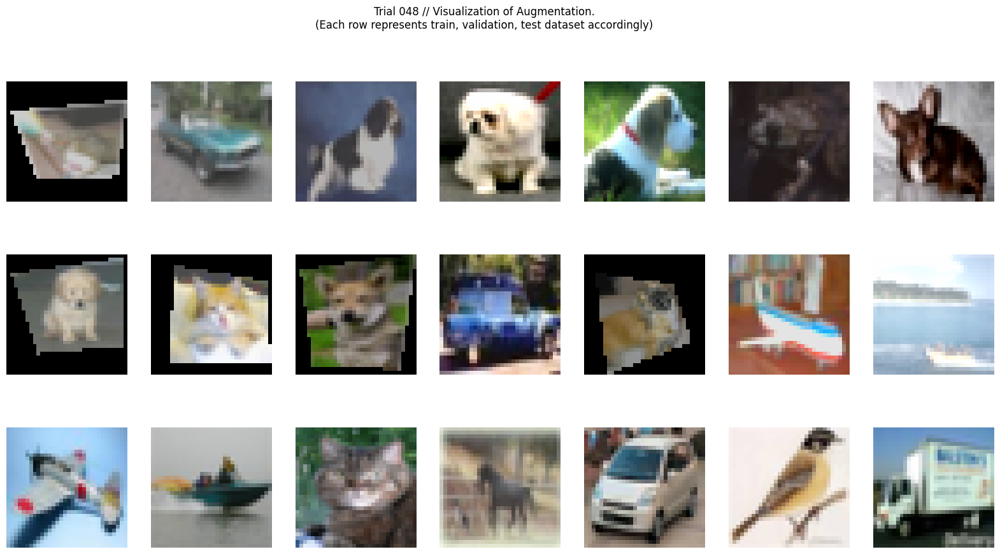

[ColorJitter(brightness=(0.5, 1.5), contrast=(0.5, 1.5), saturation=(0.5, 1.5), hue=None), RandomPerspective(p=0.5), RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40    

Train: [001] Loss: 2.175, Acc: 18.40% F1(macro): 0.18: 100%|██████████| 156/156 [00:21<00:00,  7.13it/s]
 Val:       Loss: 2.007, Acc: 27.30% F1(macro): 0.25: 100%|██████████| 40/40 [00:02<00:00, 14.60it/s]


Model saved. Current best test f1: 0.249


Train: [002] Loss: 1.854, Acc: 30.44% F1(macro): 0.30: 100%|██████████| 156/156 [00:14<00:00, 10.42it/s]
 Val:       Loss: 1.805, Acc: 32.75% F1(macro): 0.30: 100%|██████████| 40/40 [00:03<00:00, 12.35it/s]


Model saved. Current best test f1: 0.305


Train: [003] Loss: 1.752, Acc: 35.21% F1(macro): 0.35: 100%|██████████| 156/156 [00:16<00:00,  9.65it/s]
 Val:       Loss: 1.723, Acc: 38.24% F1(macro): 0.37: 100%|██████████| 40/40 [00:05<00:00,  7.83it/s]


Model saved. Current best test f1: 0.375


Train: [004] Loss: 1.690, Acc: 37.97% F1(macro): 0.38: 100%|██████████| 156/156 [00:22<00:00,  6.86it/s]
 Val:       Loss: 1.634, Acc: 40.61% F1(macro): 0.38: 100%|██████████| 40/40 [00:04<00:00,  8.24it/s]


Model saved. Current best test f1: 0.382


Train: [005] Loss: 1.626, Acc: 40.73% F1(macro): 0.40: 100%|██████████| 156/156 [00:22<00:00,  6.85it/s]
 Val:       Loss: 1.600, Acc: 42.41% F1(macro): 0.41: 100%|██████████| 40/40 [00:05<00:00,  7.51it/s]


Model saved. Current best test f1: 0.414


Train: [006] Loss: 1.552, Acc: 43.12% F1(macro): 0.43: 100%|██████████| 156/156 [00:15<00:00, 10.01it/s]
 Val:       Loss: 1.531, Acc: 44.90% F1(macro): 0.44: 100%|██████████| 40/40 [00:03<00:00, 11.71it/s]


Model saved. Current best test f1: 0.441


Train: [007] Loss: 1.513, Acc: 44.90% F1(macro): 0.45: 100%|██████████| 156/156 [00:12<00:00, 12.93it/s]
 Val:       Loss: 1.480, Acc: 46.89% F1(macro): 0.46: 100%|██████████| 40/40 [00:02<00:00, 16.21it/s]


Model saved. Current best test f1: 0.464


Train: [008] Loss: 1.454, Acc: 47.32% F1(macro): 0.47: 100%|██████████| 156/156 [00:17<00:00,  8.98it/s]
 Val:       Loss: 1.434, Acc: 48.49% F1(macro): 0.48: 100%|██████████| 40/40 [00:05<00:00,  7.90it/s]


Model saved. Current best test f1: 0.480


Train: [009] Loss: 1.421, Acc: 48.80% F1(macro): 0.49: 100%|██████████| 156/156 [00:22<00:00,  7.00it/s]
 Val:       Loss: 1.394, Acc: 50.69% F1(macro): 0.50: 100%|██████████| 40/40 [00:04<00:00,  8.53it/s]


Model saved. Current best test f1: 0.503


Train: [010] Loss: 1.378, Acc: 50.35% F1(macro): 0.50: 100%|██████████| 156/156 [00:22<00:00,  6.97it/s]
 Val:       Loss: 1.387, Acc: 49.58% F1(macro): 0.49: 100%|██████████| 40/40 [00:03<00:00, 11.61it/s]

TEST DATASET



 Val:       Loss: 1.273, Acc: 54.10% F1(macro): 0.53: 100%|██████████| 40/40 [00:01<00:00, 23.59it/s]
[I 2021-11-22 06:24:23,838] Trial 48 finished with value: 0.5318894149160448 and parameters: {'aug_color_jitter': True, 'aug_random_perspective': True, 'aug_random_flip': True}. Best is trial 25 with value: 0.6374215675170334.


Files already downloaded and verified
Files already downloaded and verified


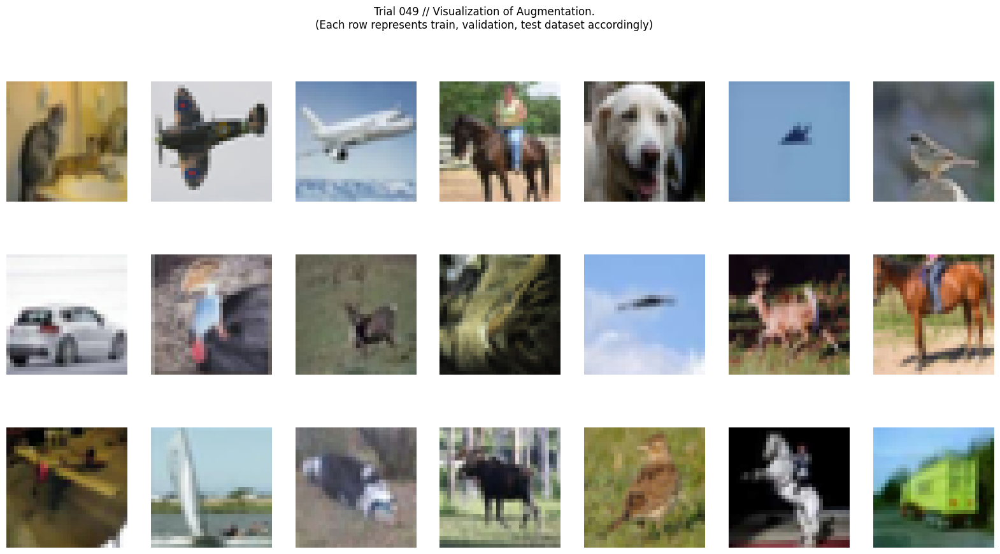

[]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |     34,760 | InvertedResid

Train: [001] Loss: 1.943, Acc: 27.83% F1(macro): 0.27: 100%|██████████| 156/156 [00:12<00:00, 12.67it/s]
 Val:       Loss: 1.640, Acc: 39.74% F1(macro): 0.38: 100%|██████████| 40/40 [00:01<00:00, 25.20it/s]


Model saved. Current best test f1: 0.379


Train: [002] Loss: 1.527, Acc: 43.82% F1(macro): 0.43: 100%|██████████| 156/156 [00:12<00:00, 12.60it/s]
 Val:       Loss: 1.431, Acc: 47.62% F1(macro): 0.47: 100%|██████████| 40/40 [00:02<00:00, 17.60it/s]


Model saved. Current best test f1: 0.471


Train: [003] Loss: 1.356, Acc: 50.69% F1(macro): 0.50: 100%|██████████| 156/156 [00:19<00:00,  7.92it/s]
 Val:       Loss: 1.373, Acc: 50.22% F1(macro): 0.50: 100%|██████████| 40/40 [00:02<00:00, 16.76it/s]


Model saved. Current best test f1: 0.498


Train: [004] Loss: 1.241, Acc: 55.08% F1(macro): 0.55: 100%|██████████| 156/156 [00:15<00:00, 10.12it/s]
 Val:       Loss: 1.323, Acc: 52.26% F1(macro): 0.52: 100%|██████████| 40/40 [00:01<00:00, 37.68it/s]


Model saved. Current best test f1: 0.519


Train: [005] Loss: 1.149, Acc: 58.91% F1(macro): 0.59: 100%|██████████| 156/156 [00:10<00:00, 14.84it/s]
 Val:       Loss: 1.295, Acc: 53.65% F1(macro): 0.53: 100%|██████████| 40/40 [00:01<00:00, 38.22it/s]


Model saved. Current best test f1: 0.532


Train: [006] Loss: 1.070, Acc: 61.47% F1(macro): 0.61: 100%|██████████| 156/156 [00:10<00:00, 14.67it/s]
 Val:       Loss: 1.257, Acc: 55.48% F1(macro): 0.54: 100%|██████████| 40/40 [00:01<00:00, 38.60it/s]


Model saved. Current best test f1: 0.543


Train: [007] Loss: 1.004, Acc: 64.16% F1(macro): 0.64: 100%|██████████| 156/156 [00:10<00:00, 14.63it/s]
 Val:       Loss: 1.215, Acc: 57.16% F1(macro): 0.57: 100%|██████████| 40/40 [00:00<00:00, 40.05it/s]


Model saved. Current best test f1: 0.573


Train: [008] Loss: 0.943, Acc: 66.53% F1(macro): 0.66: 100%|██████████| 156/156 [00:10<00:00, 14.82it/s]
 Val:       Loss: 1.266, Acc: 56.43% F1(macro): 0.56: 100%|██████████| 40/40 [00:01<00:00, 38.73it/s]
Train: [009] Loss: 0.890, Acc: 68.05% F1(macro): 0.68: 100%|██████████| 156/156 [00:10<00:00, 15.42it/s]
 Val:       Loss: 1.254, Acc: 56.79% F1(macro): 0.57: 100%|██████████| 40/40 [00:01<00:00, 36.88it/s]
Train: [010] Loss: 0.848, Acc: 69.54% F1(macro): 0.69: 100%|██████████| 156/156 [00:10<00:00, 15.57it/s]
 Val:       Loss: 1.246, Acc: 57.26% F1(macro): 0.57: 100%|██████████| 40/40 [00:01<00:00, 39.13it/s]


TEST DATASET


 Val:       Loss: 1.273, Acc: 57.06% F1(macro): 0.57: 100%|██████████| 40/40 [00:01<00:00, 34.63it/s]
[I 2021-11-22 06:26:54,736] Trial 49 finished with value: 0.5690773693737541 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': False}. Best is trial 25 with value: 0.6374215675170334.


Files already downloaded and verified
Files already downloaded and verified


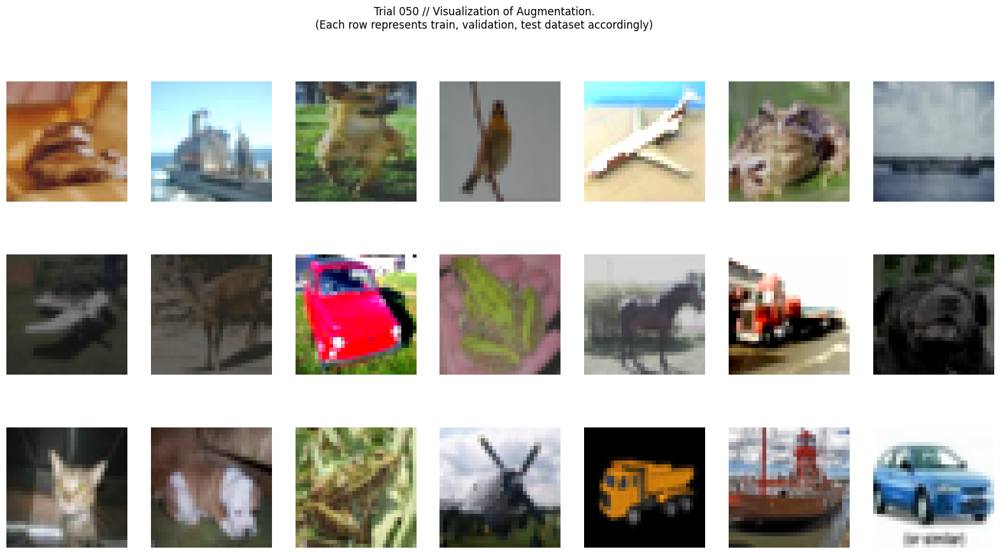

[ColorJitter(brightness=(0.5, 1.5), contrast=(0.5, 1.5), saturation=(0.5, 1.5), hue=None), RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     

Train: [001] Loss: 2.034, Acc: 24.09% F1(macro): 0.24: 100%|██████████| 156/156 [00:11<00:00, 14.14it/s]
 Val:       Loss: 1.781, Acc: 33.35% F1(macro): 0.32: 100%|██████████| 40/40 [00:01<00:00, 20.68it/s]


Model saved. Current best test f1: 0.322


Train: [002] Loss: 1.660, Acc: 38.86% F1(macro): 0.38: 100%|██████████| 156/156 [00:10<00:00, 14.51it/s]
 Val:       Loss: 1.596, Acc: 41.91% F1(macro): 0.42: 100%|██████████| 40/40 [00:01<00:00, 21.13it/s]


Model saved. Current best test f1: 0.415


Train: [003] Loss: 1.528, Acc: 44.62% F1(macro): 0.44: 100%|██████████| 156/156 [00:10<00:00, 14.29it/s]
 Val:       Loss: 1.535, Acc: 44.37% F1(macro): 0.43: 100%|██████████| 40/40 [00:01<00:00, 21.40it/s]


Model saved. Current best test f1: 0.431


Train: [004] Loss: 1.411, Acc: 48.94% F1(macro): 0.49: 100%|██████████| 156/156 [00:10<00:00, 14.45it/s]
 Val:       Loss: 1.397, Acc: 50.23% F1(macro): 0.50: 100%|██████████| 40/40 [00:02<00:00, 18.55it/s]


Model saved. Current best test f1: 0.497


Train: [005] Loss: 1.330, Acc: 51.94% F1(macro): 0.52: 100%|██████████| 156/156 [00:10<00:00, 14.20it/s]
 Val:       Loss: 1.337, Acc: 52.19% F1(macro): 0.52: 100%|██████████| 40/40 [00:02<00:00, 18.00it/s]


Model saved. Current best test f1: 0.518


Train: [006] Loss: 1.259, Acc: 54.78% F1(macro): 0.55: 100%|██████████| 156/156 [00:10<00:00, 14.30it/s]
 Val:       Loss: 1.272, Acc: 54.55% F1(macro): 0.54: 100%|██████████| 40/40 [00:02<00:00, 17.81it/s]


Model saved. Current best test f1: 0.544


Train: [007] Loss: 1.177, Acc: 58.01% F1(macro): 0.58: 100%|██████████| 156/156 [00:10<00:00, 14.33it/s]
 Val:       Loss: 1.229, Acc: 56.13% F1(macro): 0.56: 100%|██████████| 40/40 [00:01<00:00, 20.75it/s]


Model saved. Current best test f1: 0.560


Train: [008] Loss: 1.131, Acc: 59.65% F1(macro): 0.59: 100%|██████████| 156/156 [00:10<00:00, 14.71it/s]
 Val:       Loss: 1.166, Acc: 59.11% F1(macro): 0.59: 100%|██████████| 40/40 [00:01<00:00, 20.99it/s]


Model saved. Current best test f1: 0.586


Train: [009] Loss: 1.079, Acc: 61.45% F1(macro): 0.61: 100%|██████████| 156/156 [00:10<00:00, 14.60it/s]
 Val:       Loss: 1.139, Acc: 60.27% F1(macro): 0.60: 100%|██████████| 40/40 [00:01<00:00, 20.83it/s]


Model saved. Current best test f1: 0.603


Train: [010] Loss: 1.038, Acc: 63.11% F1(macro): 0.63: 100%|██████████| 156/156 [00:11<00:00, 13.04it/s]
 Val:       Loss: 1.108, Acc: 61.26% F1(macro): 0.61: 100%|██████████| 40/40 [00:03<00:00, 10.25it/s]


Model saved. Current best test f1: 0.606
TEST DATASET


 Val:       Loss: 1.054, Acc: 62.61% F1(macro): 0.62: 100%|██████████| 40/40 [00:02<00:00, 16.27it/s]
[I 2021-11-22 06:29:24,615] Trial 50 finished with value: 0.6194004488509951 and parameters: {'aug_color_jitter': True, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 25 with value: 0.6374215675170334.


Files already downloaded and verified
Files already downloaded and verified


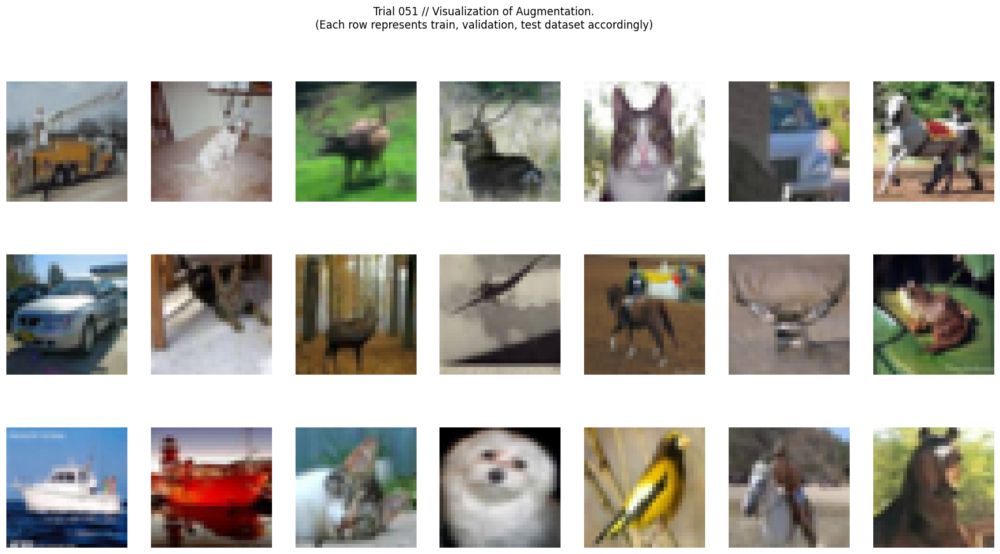

[RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |

Train: [001] Loss: 1.963, Acc: 26.87% F1(macro): 0.26: 100%|██████████| 156/156 [00:15<00:00, 10.31it/s]
 Val:       Loss: 1.665, Acc: 38.81% F1(macro): 0.38: 100%|██████████| 40/40 [00:01<00:00, 38.05it/s]


Model saved. Current best test f1: 0.376


Train: [002] Loss: 1.505, Acc: 44.46% F1(macro): 0.44: 100%|██████████| 156/156 [00:10<00:00, 14.99it/s]
 Val:       Loss: 1.444, Acc: 46.63% F1(macro): 0.46: 100%|██████████| 40/40 [00:01<00:00, 36.09it/s]


Model saved. Current best test f1: 0.457


Train: [003] Loss: 1.360, Acc: 50.59% F1(macro): 0.50: 100%|██████████| 156/156 [00:10<00:00, 15.01it/s]
 Val:       Loss: 1.363, Acc: 50.74% F1(macro): 0.50: 100%|██████████| 40/40 [00:01<00:00, 36.17it/s]


Model saved. Current best test f1: 0.498


Train: [004] Loss: 1.262, Acc: 54.41% F1(macro): 0.54: 100%|██████████| 156/156 [00:10<00:00, 14.79it/s]
 Val:       Loss: 1.287, Acc: 53.54% F1(macro): 0.53: 100%|██████████| 40/40 [00:01<00:00, 31.17it/s]


Model saved. Current best test f1: 0.533


Train: [005] Loss: 1.181, Acc: 57.54% F1(macro): 0.57: 100%|██████████| 156/156 [00:10<00:00, 15.04it/s]
 Val:       Loss: 1.226, Acc: 56.61% F1(macro): 0.56: 100%|██████████| 40/40 [00:01<00:00, 35.56it/s]


Model saved. Current best test f1: 0.562


Train: [006] Loss: 1.122, Acc: 59.79% F1(macro): 0.60: 100%|██████████| 156/156 [00:10<00:00, 15.12it/s]
 Val:       Loss: 1.209, Acc: 57.01% F1(macro): 0.57: 100%|██████████| 40/40 [00:01<00:00, 37.04it/s]


Model saved. Current best test f1: 0.570


Train: [007] Loss: 1.054, Acc: 62.54% F1(macro): 0.62: 100%|██████████| 156/156 [00:10<00:00, 14.69it/s]
 Val:       Loss: 1.131, Acc: 60.31% F1(macro): 0.60: 100%|██████████| 40/40 [00:01<00:00, 34.85it/s]


Model saved. Current best test f1: 0.599


Train: [008] Loss: 1.002, Acc: 64.64% F1(macro): 0.65: 100%|██████████| 156/156 [00:10<00:00, 15.00it/s]
 Val:       Loss: 1.125, Acc: 60.31% F1(macro): 0.60: 100%|██████████| 40/40 [00:01<00:00, 37.56it/s]
Train: [009] Loss: 0.953, Acc: 66.12% F1(macro): 0.66: 100%|██████████| 156/156 [00:10<00:00, 15.48it/s]
 Val:       Loss: 1.076, Acc: 62.06% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 36.76it/s]


Model saved. Current best test f1: 0.618


Train: [010] Loss: 0.905, Acc: 67.72% F1(macro): 0.68: 100%|██████████| 156/156 [00:10<00:00, 14.72it/s]
 Val:       Loss: 1.048, Acc: 63.98% F1(macro): 0.64: 100%|██████████| 40/40 [00:01<00:00, 37.12it/s]


Model saved. Current best test f1: 0.636
TEST DATASET


 Val:       Loss: 1.048, Acc: 63.32% F1(macro): 0.63: 100%|██████████| 40/40 [00:01<00:00, 34.43it/s]
[I 2021-11-22 06:31:41,310] Trial 51 finished with value: 0.6306700221127568 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 25 with value: 0.6374215675170334.


Files already downloaded and verified
Files already downloaded and verified


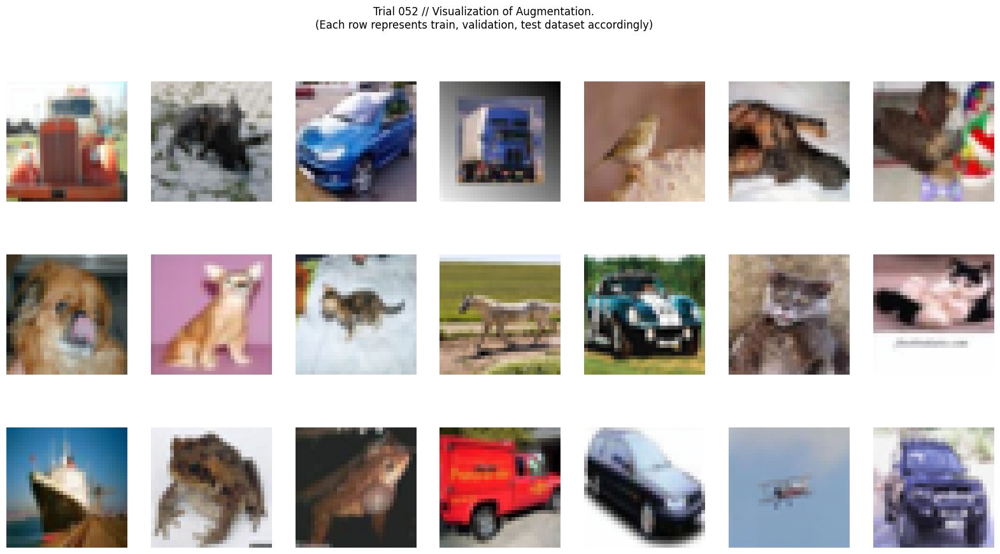

[RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |

Train: [001] Loss: 1.947, Acc: 28.02% F1(macro): 0.28: 100%|██████████| 156/156 [00:10<00:00, 14.82it/s]
 Val:       Loss: 1.650, Acc: 40.32% F1(macro): 0.40: 100%|██████████| 40/40 [00:01<00:00, 31.39it/s]


Model saved. Current best test f1: 0.401


Train: [002] Loss: 1.487, Acc: 45.36% F1(macro): 0.45: 100%|██████████| 156/156 [00:10<00:00, 15.09it/s]
 Val:       Loss: 1.414, Acc: 48.45% F1(macro): 0.47: 100%|██████████| 40/40 [00:01<00:00, 33.30it/s]


Model saved. Current best test f1: 0.474


Train: [003] Loss: 1.335, Acc: 51.72% F1(macro): 0.51: 100%|██████████| 156/156 [00:10<00:00, 14.50it/s]
 Val:       Loss: 1.346, Acc: 51.42% F1(macro): 0.50: 100%|██████████| 40/40 [00:01<00:00, 37.09it/s]


Model saved. Current best test f1: 0.502


Train: [004] Loss: 1.225, Acc: 55.91% F1(macro): 0.56: 100%|██████████| 156/156 [00:10<00:00, 14.71it/s]
 Val:       Loss: 1.255, Acc: 54.51% F1(macro): 0.54: 100%|██████████| 40/40 [00:01<00:00, 33.92it/s]


Model saved. Current best test f1: 0.541


Train: [005] Loss: 1.152, Acc: 58.98% F1(macro): 0.59: 100%|██████████| 156/156 [00:10<00:00, 14.49it/s]
 Val:       Loss: 1.189, Acc: 57.30% F1(macro): 0.57: 100%|██████████| 40/40 [00:01<00:00, 35.89it/s]


Model saved. Current best test f1: 0.568


Train: [006] Loss: 1.077, Acc: 61.77% F1(macro): 0.62: 100%|██████████| 156/156 [00:10<00:00, 15.00it/s]
 Val:       Loss: 1.129, Acc: 59.02% F1(macro): 0.59: 100%|██████████| 40/40 [00:01<00:00, 37.04it/s]


Model saved. Current best test f1: 0.587


Train: [007] Loss: 1.022, Acc: 63.89% F1(macro): 0.64: 100%|██████████| 156/156 [00:10<00:00, 14.65it/s]
 Val:       Loss: 1.108, Acc: 60.07% F1(macro): 0.60: 100%|██████████| 40/40 [00:01<00:00, 39.11it/s]


Model saved. Current best test f1: 0.603


Train: [008] Loss: 0.974, Acc: 65.59% F1(macro): 0.65: 100%|██████████| 156/156 [00:10<00:00, 14.79it/s]
 Val:       Loss: 1.078, Acc: 61.79% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 35.28it/s]


Model saved. Current best test f1: 0.615


Train: [009] Loss: 0.919, Acc: 67.38% F1(macro): 0.67: 100%|██████████| 156/156 [00:10<00:00, 14.29it/s]
 Val:       Loss: 1.045, Acc: 63.21% F1(macro): 0.63: 100%|██████████| 40/40 [00:01<00:00, 37.25it/s]


Model saved. Current best test f1: 0.630


Train: [010] Loss: 0.880, Acc: 68.68% F1(macro): 0.69: 100%|██████████| 156/156 [00:10<00:00, 14.94it/s]
 Val:       Loss: 1.099, Acc: 62.34% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 36.28it/s]


TEST DATASET


 Val:       Loss: 1.100, Acc: 62.35% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 33.44it/s]
[I 2021-11-22 06:33:53,698] Trial 52 finished with value: 0.6178085164822668 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 25 with value: 0.6374215675170334.


Files already downloaded and verified
Files already downloaded and verified


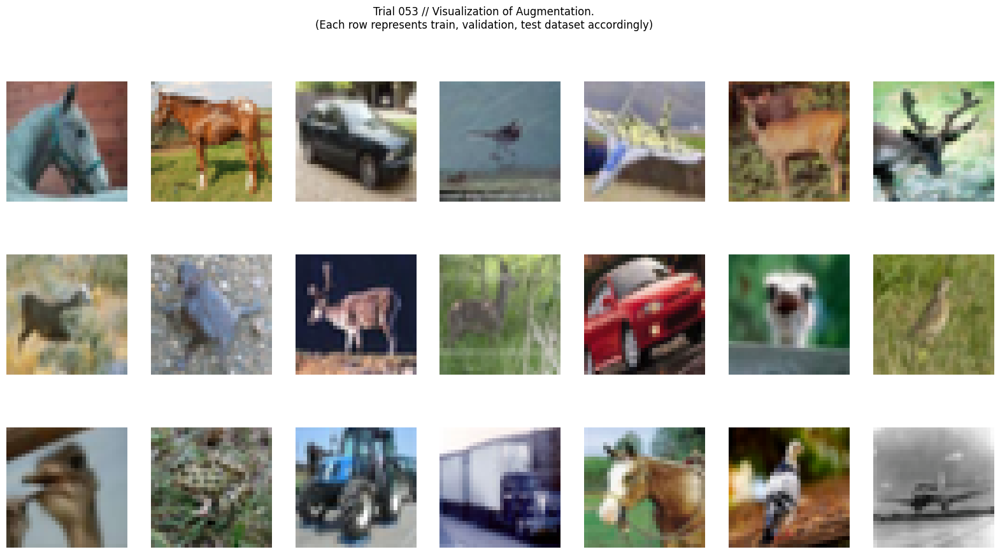

[RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |

Train: [001] Loss: 1.896, Acc: 29.87% F1(macro): 0.29: 100%|██████████| 156/156 [00:10<00:00, 15.02it/s]
 Val:       Loss: 1.600, Acc: 41.69% F1(macro): 0.41: 100%|██████████| 40/40 [00:01<00:00, 37.49it/s]


Model saved. Current best test f1: 0.405


Train: [002] Loss: 1.492, Acc: 45.35% F1(macro): 0.45: 100%|██████████| 156/156 [00:10<00:00, 14.88it/s]
 Val:       Loss: 1.436, Acc: 47.59% F1(macro): 0.46: 100%|██████████| 40/40 [00:01<00:00, 35.80it/s]


Model saved. Current best test f1: 0.463


Train: [003] Loss: 1.348, Acc: 51.19% F1(macro): 0.51: 100%|██████████| 156/156 [00:10<00:00, 14.46it/s]
 Val:       Loss: 1.363, Acc: 50.41% F1(macro): 0.50: 100%|██████████| 40/40 [00:01<00:00, 35.21it/s]


Model saved. Current best test f1: 0.500


Train: [004] Loss: 1.254, Acc: 55.24% F1(macro): 0.55: 100%|██████████| 156/156 [00:19<00:00,  7.88it/s]
 Val:       Loss: 1.283, Acc: 53.00% F1(macro): 0.53: 100%|██████████| 40/40 [00:02<00:00, 16.38it/s]


Model saved. Current best test f1: 0.529


Train: [005] Loss: 1.170, Acc: 58.10% F1(macro): 0.58: 100%|██████████| 156/156 [00:19<00:00,  7.98it/s]
 Val:       Loss: 1.206, Acc: 56.46% F1(macro): 0.57: 100%|██████████| 40/40 [00:02<00:00, 18.62it/s]


Model saved. Current best test f1: 0.565


Train: [006] Loss: 1.104, Acc: 60.46% F1(macro): 0.60: 100%|██████████| 156/156 [00:18<00:00,  8.28it/s]
 Val:       Loss: 1.170, Acc: 58.40% F1(macro): 0.58: 100%|██████████| 40/40 [00:01<00:00, 29.02it/s]


Model saved. Current best test f1: 0.584


Train: [007] Loss: 1.052, Acc: 62.59% F1(macro): 0.62: 100%|██████████| 156/156 [00:11<00:00, 13.08it/s]
 Val:       Loss: 1.121, Acc: 59.90% F1(macro): 0.60: 100%|██████████| 40/40 [00:01<00:00, 25.46it/s]


Model saved. Current best test f1: 0.596


Train: [008] Loss: 0.995, Acc: 64.50% F1(macro): 0.64: 100%|██████████| 156/156 [00:12<00:00, 12.72it/s]
 Val:       Loss: 1.118, Acc: 60.12% F1(macro): 0.60: 100%|██████████| 40/40 [00:01<00:00, 34.32it/s]


Model saved. Current best test f1: 0.597


Train: [009] Loss: 0.954, Acc: 65.92% F1(macro): 0.66: 100%|██████████| 156/156 [00:19<00:00,  7.86it/s]
 Val:       Loss: 1.096, Acc: 61.34% F1(macro): 0.61: 100%|██████████| 40/40 [00:02<00:00, 16.64it/s]


Model saved. Current best test f1: 0.611


Train: [010] Loss: 0.916, Acc: 67.35% F1(macro): 0.67: 100%|██████████| 156/156 [00:19<00:00,  8.14it/s]
 Val:       Loss: 1.058, Acc: 61.99% F1(macro): 0.62: 100%|██████████| 40/40 [00:02<00:00, 17.19it/s]


Model saved. Current best test f1: 0.620
TEST DATASET


 Val:       Loss: 1.064, Acc: 62.27% F1(macro): 0.62: 100%|██████████| 40/40 [00:02<00:00, 15.96it/s]
[I 2021-11-22 06:37:04,049] Trial 53 finished with value: 0.6229326786632009 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 25 with value: 0.6374215675170334.


Files already downloaded and verified
Files already downloaded and verified


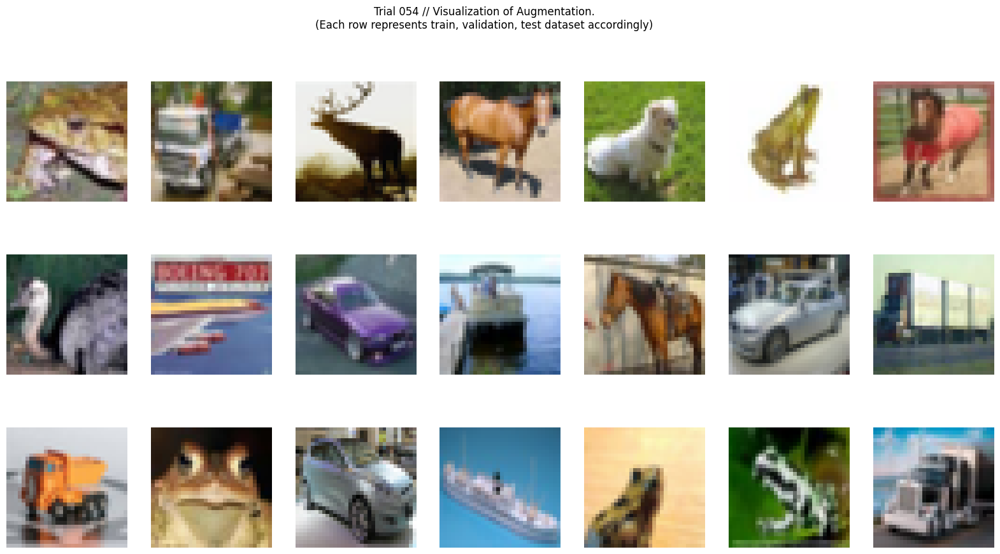

[RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |

Train: [001] Loss: 1.876, Acc: 30.46% F1(macro): 0.30: 100%|██████████| 156/156 [00:17<00:00,  9.06it/s]
 Val:       Loss: 1.615, Acc: 40.07% F1(macro): 0.39: 100%|██████████| 40/40 [00:01<00:00, 20.72it/s]


Model saved. Current best test f1: 0.387


Train: [002] Loss: 1.497, Acc: 45.23% F1(macro): 0.45: 100%|██████████| 156/156 [00:12<00:00, 12.64it/s]
 Val:       Loss: 1.458, Acc: 46.74% F1(macro): 0.45: 100%|██████████| 40/40 [00:01<00:00, 24.12it/s]


Model saved. Current best test f1: 0.445


Train: [003] Loss: 1.354, Acc: 50.82% F1(macro): 0.51: 100%|██████████| 156/156 [00:12<00:00, 12.85it/s]
 Val:       Loss: 1.354, Acc: 50.56% F1(macro): 0.50: 100%|██████████| 40/40 [00:02<00:00, 17.40it/s]


Model saved. Current best test f1: 0.499


Train: [004] Loss: 1.250, Acc: 54.78% F1(macro): 0.55: 100%|██████████| 156/156 [00:19<00:00,  8.11it/s]
 Val:       Loss: 1.285, Acc: 53.77% F1(macro): 0.53: 100%|██████████| 40/40 [00:02<00:00, 16.54it/s]


Model saved. Current best test f1: 0.533


Train: [005] Loss: 1.169, Acc: 57.98% F1(macro): 0.58: 100%|██████████| 156/156 [00:19<00:00,  8.09it/s]
 Val:       Loss: 1.244, Acc: 55.18% F1(macro): 0.54: 100%|██████████| 40/40 [00:02<00:00, 16.51it/s]


Model saved. Current best test f1: 0.545


Train: [006] Loss: 1.106, Acc: 60.31% F1(macro): 0.60: 100%|██████████| 156/156 [00:17<00:00,  9.05it/s]
 Val:       Loss: 1.197, Acc: 58.00% F1(macro): 0.57: 100%|██████████| 40/40 [00:01<00:00, 24.12it/s]


Model saved. Current best test f1: 0.575


Train: [007] Loss: 1.044, Acc: 62.70% F1(macro): 0.63: 100%|██████████| 156/156 [00:12<00:00, 12.63it/s]
 Val:       Loss: 1.190, Acc: 58.15% F1(macro): 0.58: 100%|██████████| 40/40 [00:01<00:00, 24.69it/s]


Model saved. Current best test f1: 0.580


Train: [008] Loss: 0.993, Acc: 64.54% F1(macro): 0.64: 100%|██████████| 156/156 [00:12<00:00, 12.37it/s]
 Val:       Loss: 1.127, Acc: 60.38% F1(macro): 0.60: 100%|██████████| 40/40 [00:02<00:00, 16.12it/s]


Model saved. Current best test f1: 0.602


Train: [009] Loss: 0.948, Acc: 66.36% F1(macro): 0.66: 100%|██████████| 156/156 [00:19<00:00,  8.15it/s]
 Val:       Loss: 1.105, Acc: 61.51% F1(macro): 0.61: 100%|██████████| 40/40 [00:02<00:00, 16.38it/s]


Model saved. Current best test f1: 0.610


Train: [010] Loss: 0.901, Acc: 68.19% F1(macro): 0.68: 100%|██████████| 156/156 [00:18<00:00,  8.29it/s]
 Val:       Loss: 1.100, Acc: 61.81% F1(macro): 0.61: 100%|██████████| 40/40 [00:02<00:00, 17.81it/s]


Model saved. Current best test f1: 0.615
TEST DATASET


 Val:       Loss: 1.084, Acc: 61.90% F1(macro): 0.62: 100%|██████████| 40/40 [00:02<00:00, 16.56it/s]
[I 2021-11-22 06:40:30,008] Trial 54 finished with value: 0.616389048620399 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 25 with value: 0.6374215675170334.


Files already downloaded and verified
Files already downloaded and verified


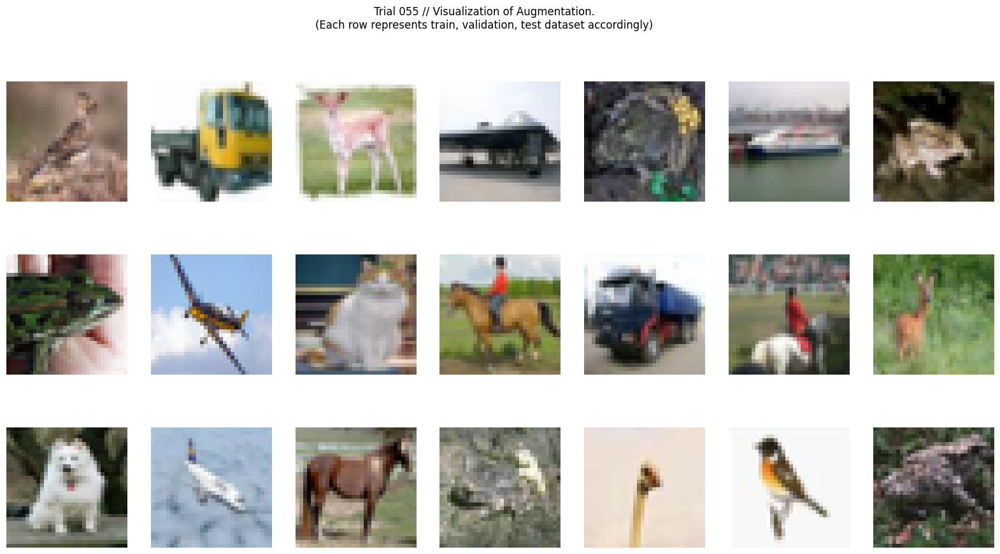

[RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |

Train: [001] Loss: 1.921, Acc: 28.85% F1(macro): 0.28: 100%|██████████| 156/156 [00:15<00:00,  9.90it/s]
 Val:       Loss: 1.594, Acc: 40.65% F1(macro): 0.40: 100%|██████████| 40/40 [00:01<00:00, 24.30it/s]


Model saved. Current best test f1: 0.396


Train: [002] Loss: 1.482, Acc: 45.82% F1(macro): 0.45: 100%|██████████| 156/156 [00:12<00:00, 12.67it/s]
 Val:       Loss: 1.430, Acc: 47.56% F1(macro): 0.47: 100%|██████████| 40/40 [00:01<00:00, 24.21it/s]


Model saved. Current best test f1: 0.470


Train: [003] Loss: 1.317, Acc: 52.16% F1(macro): 0.52: 100%|██████████| 156/156 [00:15<00:00,  9.87it/s]
 Val:       Loss: 1.302, Acc: 52.63% F1(macro): 0.53: 100%|██████████| 40/40 [00:02<00:00, 17.69it/s]


Model saved. Current best test f1: 0.526


Train: [004] Loss: 1.217, Acc: 56.22% F1(macro): 0.56: 100%|██████████| 156/156 [00:20<00:00,  7.71it/s]
 Val:       Loss: 1.250, Acc: 55.44% F1(macro): 0.55: 100%|██████████| 40/40 [00:02<00:00, 17.37it/s]


Model saved. Current best test f1: 0.554


Train: [005] Loss: 1.144, Acc: 59.03% F1(macro): 0.59: 100%|██████████| 156/156 [00:20<00:00,  7.78it/s]
 Val:       Loss: 1.180, Acc: 57.20% F1(macro): 0.57: 100%|██████████| 40/40 [00:02<00:00, 16.93it/s]


Model saved. Current best test f1: 0.568


Train: [006] Loss: 1.080, Acc: 61.30% F1(macro): 0.61: 100%|██████████| 156/156 [00:12<00:00, 12.14it/s]
 Val:       Loss: 1.146, Acc: 59.11% F1(macro): 0.59: 100%|██████████| 40/40 [00:01<00:00, 25.49it/s]


Model saved. Current best test f1: 0.590


Train: [007] Loss: 1.017, Acc: 63.66% F1(macro): 0.64: 100%|██████████| 156/156 [00:12<00:00, 12.32it/s]
 Val:       Loss: 1.132, Acc: 59.82% F1(macro): 0.59: 100%|██████████| 40/40 [00:01<00:00, 25.74it/s]


Model saved. Current best test f1: 0.591


Train: [008] Loss: 0.977, Acc: 65.24% F1(macro): 0.65: 100%|██████████| 156/156 [00:15<00:00,  9.82it/s]
 Val:       Loss: 1.094, Acc: 61.90% F1(macro): 0.61: 100%|██████████| 40/40 [00:02<00:00, 17.29it/s]


Model saved. Current best test f1: 0.615


Train: [009] Loss: 0.924, Acc: 67.37% F1(macro): 0.67: 100%|██████████| 156/156 [00:19<00:00,  7.83it/s]
 Val:       Loss: 1.083, Acc: 62.03% F1(macro): 0.62: 100%|██████████| 40/40 [00:02<00:00, 16.27it/s]


Model saved. Current best test f1: 0.619


Train: [010] Loss: 0.884, Acc: 68.71% F1(macro): 0.69: 100%|██████████| 156/156 [00:19<00:00,  7.87it/s]
 Val:       Loss: 1.044, Acc: 63.80% F1(macro): 0.64: 100%|██████████| 40/40 [00:02<00:00, 16.07it/s]


Model saved. Current best test f1: 0.637
TEST DATASET


 Val:       Loss: 1.041, Acc: 63.41% F1(macro): 0.63: 100%|██████████| 40/40 [00:01<00:00, 27.91it/s]
[I 2021-11-22 06:43:59,813] Trial 55 finished with value: 0.634506343338604 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 25 with value: 0.6374215675170334.


Files already downloaded and verified
Files already downloaded and verified


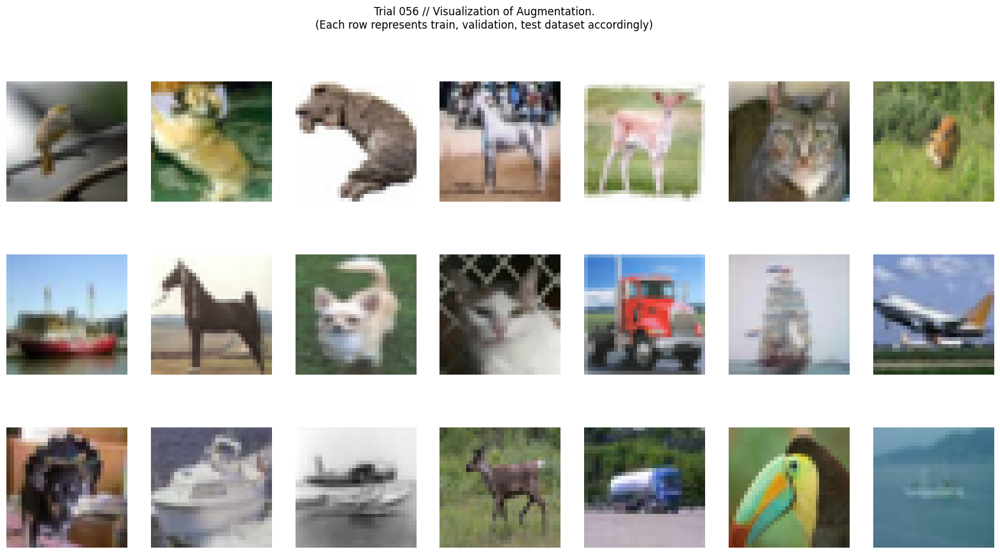

[RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |

Train: [001] Loss: 1.927, Acc: 28.57% F1(macro): 0.28: 100%|██████████| 156/156 [00:10<00:00, 14.48it/s]
 Val:       Loss: 1.648, Acc: 40.01% F1(macro): 0.39: 100%|██████████| 40/40 [00:01<00:00, 34.52it/s]


Model saved. Current best test f1: 0.392


Train: [002] Loss: 1.511, Acc: 44.67% F1(macro): 0.44: 100%|██████████| 156/156 [00:14<00:00, 10.85it/s]
 Val:       Loss: 1.448, Acc: 46.44% F1(macro): 0.46: 100%|██████████| 40/40 [00:02<00:00, 17.05it/s]


Model saved. Current best test f1: 0.460


Train: [003] Loss: 1.363, Acc: 49.89% F1(macro): 0.50: 100%|██████████| 156/156 [00:19<00:00,  8.01it/s]
 Val:       Loss: 1.338, Acc: 51.53% F1(macro): 0.51: 100%|██████████| 40/40 [00:01<00:00, 27.80it/s]


Model saved. Current best test f1: 0.509


Train: [004] Loss: 1.255, Acc: 54.60% F1(macro): 0.54: 100%|██████████| 156/156 [00:10<00:00, 15.29it/s]
 Val:       Loss: 1.261, Acc: 54.03% F1(macro): 0.54: 100%|██████████| 40/40 [00:01<00:00, 36.78it/s]


Model saved. Current best test f1: 0.540


Train: [005] Loss: 1.177, Acc: 57.54% F1(macro): 0.57: 100%|██████████| 156/156 [00:10<00:00, 14.54it/s]
 Val:       Loss: 1.225, Acc: 55.91% F1(macro): 0.55: 100%|██████████| 40/40 [00:01<00:00, 34.88it/s]


Model saved. Current best test f1: 0.554


Train: [006] Loss: 1.097, Acc: 60.92% F1(macro): 0.61: 100%|██████████| 156/156 [00:10<00:00, 15.13it/s]
 Val:       Loss: 1.146, Acc: 58.95% F1(macro): 0.59: 100%|██████████| 40/40 [00:01<00:00, 37.65it/s]


Model saved. Current best test f1: 0.589


Train: [007] Loss: 1.042, Acc: 62.96% F1(macro): 0.63: 100%|██████████| 156/156 [00:10<00:00, 14.76it/s]
 Val:       Loss: 1.120, Acc: 60.10% F1(macro): 0.60: 100%|██████████| 40/40 [00:01<00:00, 36.42it/s]


Model saved. Current best test f1: 0.598


Train: [008] Loss: 0.984, Acc: 64.96% F1(macro): 0.65: 100%|██████████| 156/156 [00:10<00:00, 15.07it/s]
 Val:       Loss: 1.074, Acc: 61.88% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 34.84it/s]


Model saved. Current best test f1: 0.621


Train: [009] Loss: 0.934, Acc: 66.89% F1(macro): 0.67: 100%|██████████| 156/156 [00:10<00:00, 14.91it/s]
 Val:       Loss: 1.119, Acc: 60.95% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 37.08it/s]
Train: [010] Loss: 0.894, Acc: 68.43% F1(macro): 0.68: 100%|██████████| 156/156 [00:10<00:00, 15.36it/s]
 Val:       Loss: 1.079, Acc: 62.38% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 35.83it/s]


Model saved. Current best test f1: 0.621
TEST DATASET


 Val:       Loss: 1.082, Acc: 62.40% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 35.76it/s]
[I 2021-11-22 06:46:25,441] Trial 56 finished with value: 0.6209865636031151 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 25 with value: 0.6374215675170334.


Files already downloaded and verified
Files already downloaded and verified


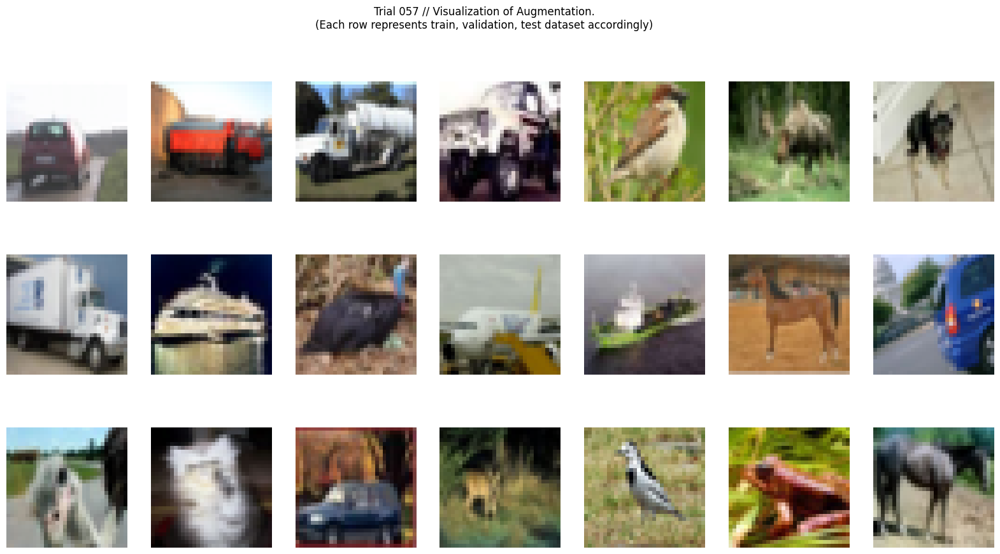

[RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |

Train: [001] Loss: 1.889, Acc: 29.06% F1(macro): 0.29: 100%|██████████| 156/156 [00:10<00:00, 14.99it/s]
 Val:       Loss: 1.599, Acc: 40.33% F1(macro): 0.38: 100%|██████████| 40/40 [00:01<00:00, 35.68it/s]


Model saved. Current best test f1: 0.376


Train: [002] Loss: 1.482, Acc: 45.74% F1(macro): 0.45: 100%|██████████| 156/156 [00:10<00:00, 14.89it/s]
 Val:       Loss: 1.402, Acc: 48.41% F1(macro): 0.48: 100%|██████████| 40/40 [00:01<00:00, 36.48it/s]


Model saved. Current best test f1: 0.476


Train: [003] Loss: 1.350, Acc: 50.81% F1(macro): 0.51: 100%|██████████| 156/156 [00:10<00:00, 14.83it/s]
 Val:       Loss: 1.343, Acc: 51.46% F1(macro): 0.52: 100%|██████████| 40/40 [00:01<00:00, 35.63it/s]


Model saved. Current best test f1: 0.515


Train: [004] Loss: 1.260, Acc: 54.44% F1(macro): 0.54: 100%|██████████| 156/156 [00:10<00:00, 14.87it/s]
 Val:       Loss: 1.311, Acc: 52.04% F1(macro): 0.52: 100%|██████████| 40/40 [00:01<00:00, 36.65it/s]


Model saved. Current best test f1: 0.520


Train: [005] Loss: 1.197, Acc: 57.08% F1(macro): 0.57: 100%|██████████| 156/156 [00:10<00:00, 14.79it/s]
 Val:       Loss: 1.243, Acc: 55.23% F1(macro): 0.55: 100%|██████████| 40/40 [00:01<00:00, 37.18it/s]


Model saved. Current best test f1: 0.551


Train: [006] Loss: 1.131, Acc: 59.73% F1(macro): 0.60: 100%|██████████| 156/156 [00:10<00:00, 14.19it/s]
 Val:       Loss: 1.227, Acc: 55.85% F1(macro): 0.56: 100%|██████████| 40/40 [00:01<00:00, 36.24it/s]


Model saved. Current best test f1: 0.558


Train: [007] Loss: 1.080, Acc: 61.43% F1(macro): 0.61: 100%|██████████| 156/156 [00:10<00:00, 15.17it/s]
 Val:       Loss: 1.160, Acc: 58.43% F1(macro): 0.58: 100%|██████████| 40/40 [00:01<00:00, 34.73it/s]


Model saved. Current best test f1: 0.578


Train: [008] Loss: 1.031, Acc: 63.16% F1(macro): 0.63: 100%|██████████| 156/156 [00:10<00:00, 14.80it/s]
 Val:       Loss: 1.166, Acc: 58.30% F1(macro): 0.58: 100%|██████████| 40/40 [00:01<00:00, 36.69it/s]


Model saved. Current best test f1: 0.584


Train: [009] Loss: 0.995, Acc: 64.60% F1(macro): 0.64: 100%|██████████| 156/156 [00:10<00:00, 14.75it/s]
 Val:       Loss: 1.122, Acc: 60.20% F1(macro): 0.60: 100%|██████████| 40/40 [00:01<00:00, 38.21it/s]


Model saved. Current best test f1: 0.602


Train: [010] Loss: 0.955, Acc: 66.03% F1(macro): 0.66: 100%|██████████| 156/156 [00:13<00:00, 11.30it/s]
 Val:       Loss: 1.076, Acc: 61.89% F1(macro): 0.62: 100%|██████████| 40/40 [00:02<00:00, 16.23it/s]


Model saved. Current best test f1: 0.615
TEST DATASET


 Val:       Loss: 1.094, Acc: 61.55% F1(macro): 0.61: 100%|██████████| 40/40 [00:02<00:00, 15.92it/s]
[I 2021-11-22 06:48:43,937] Trial 57 finished with value: 0.6123700996963913 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 25 with value: 0.6374215675170334.


Files already downloaded and verified
Files already downloaded and verified


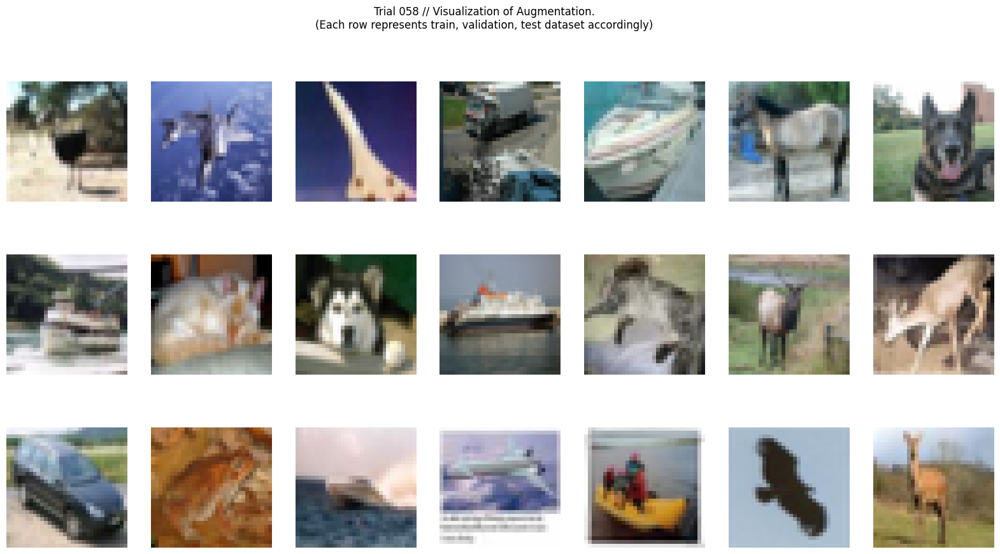

[RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |

Train: [001] Loss: 1.933, Acc: 28.58% F1(macro): 0.28: 100%|██████████| 156/156 [00:20<00:00,  7.77it/s]
 Val:       Loss: 1.605, Acc: 41.08% F1(macro): 0.41: 100%|██████████| 40/40 [00:02<00:00, 15.79it/s]


Model saved. Current best test f1: 0.406


Train: [002] Loss: 1.492, Acc: 45.50% F1(macro): 0.45: 100%|██████████| 156/156 [00:18<00:00,  8.21it/s]
 Val:       Loss: 1.425, Acc: 48.65% F1(macro): 0.48: 100%|██████████| 40/40 [00:02<00:00, 16.34it/s]


Model saved. Current best test f1: 0.476


Train: [003] Loss: 1.345, Acc: 50.87% F1(macro): 0.51: 100%|██████████| 156/156 [00:12<00:00, 12.39it/s]
 Val:       Loss: 1.321, Acc: 52.89% F1(macro): 0.52: 100%|██████████| 40/40 [00:01<00:00, 23.50it/s]


Model saved. Current best test f1: 0.523


Train: [004] Loss: 1.242, Acc: 55.23% F1(macro): 0.55: 100%|██████████| 156/156 [00:12<00:00, 12.76it/s]
 Val:       Loss: 1.241, Acc: 55.25% F1(macro): 0.55: 100%|██████████| 40/40 [00:01<00:00, 24.78it/s]


Model saved. Current best test f1: 0.549


Train: [005] Loss: 1.167, Acc: 58.07% F1(macro): 0.58: 100%|██████████| 156/156 [00:10<00:00, 14.66it/s]
 Val:       Loss: 1.187, Acc: 57.68% F1(macro): 0.58: 100%|██████████| 40/40 [00:01<00:00, 37.85it/s]


Model saved. Current best test f1: 0.576


Train: [006] Loss: 1.095, Acc: 60.92% F1(macro): 0.61: 100%|██████████| 156/156 [00:10<00:00, 14.92it/s]
 Val:       Loss: 1.176, Acc: 58.23% F1(macro): 0.58: 100%|██████████| 40/40 [00:01<00:00, 36.61it/s]


Model saved. Current best test f1: 0.578


Train: [007] Loss: 1.036, Acc: 63.08% F1(macro): 0.63: 100%|██████████| 156/156 [00:10<00:00, 14.70it/s]
 Val:       Loss: 1.117, Acc: 60.52% F1(macro): 0.60: 100%|██████████| 40/40 [00:01<00:00, 33.96it/s]


Model saved. Current best test f1: 0.596


Train: [008] Loss: 0.982, Acc: 65.33% F1(macro): 0.65: 100%|██████████| 156/156 [00:10<00:00, 14.85it/s]
 Val:       Loss: 1.073, Acc: 61.72% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 35.65it/s]


Model saved. Current best test f1: 0.617


Train: [009] Loss: 0.940, Acc: 66.51% F1(macro): 0.66: 100%|██████████| 156/156 [00:10<00:00, 14.54it/s]
 Val:       Loss: 1.056, Acc: 62.72% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 37.93it/s]


Model saved. Current best test f1: 0.623


Train: [010] Loss: 0.900, Acc: 67.98% F1(macro): 0.68: 100%|██████████| 156/156 [00:10<00:00, 14.93it/s]
 Val:       Loss: 1.025, Acc: 64.41% F1(macro): 0.64: 100%|██████████| 40/40 [00:01<00:00, 35.44it/s]


Model saved. Current best test f1: 0.643
TEST DATASET


 Val:       Loss: 1.041, Acc: 63.34% F1(macro): 0.63: 100%|██████████| 40/40 [00:01<00:00, 36.05it/s]
[I 2021-11-22 06:51:25,261] Trial 58 finished with value: 0.6318961435805647 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 25 with value: 0.6374215675170334.


Files already downloaded and verified
Files already downloaded and verified


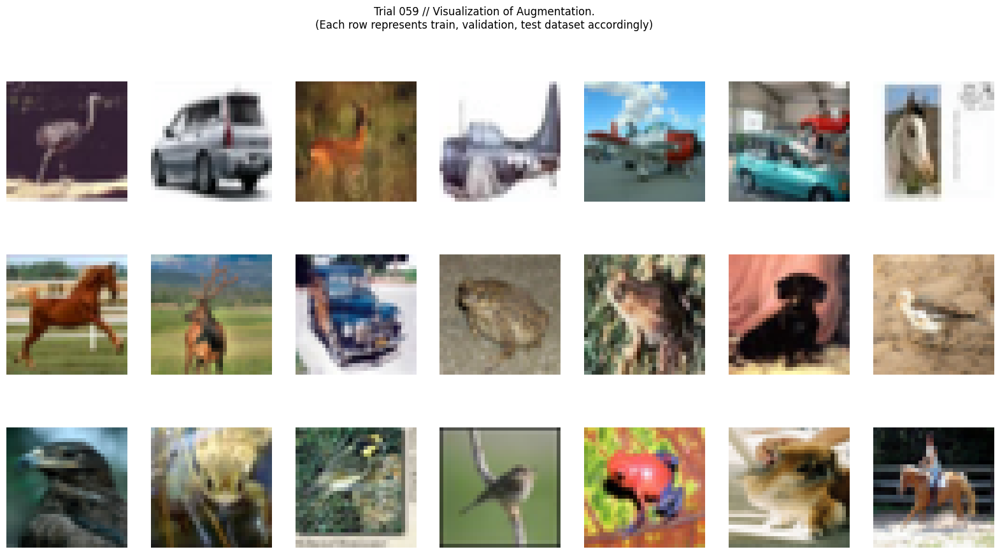

[]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |     34,760 | InvertedResid

Train: [001] Loss: 1.931, Acc: 27.83% F1(macro): 0.28: 100%|██████████| 156/156 [00:10<00:00, 14.99it/s]
 Val:       Loss: 1.708, Acc: 39.41% F1(macro): 0.37: 100%|██████████| 40/40 [00:01<00:00, 38.96it/s]


Model saved. Current best test f1: 0.375


Train: [002] Loss: 1.517, Acc: 44.33% F1(macro): 0.44: 100%|██████████| 156/156 [00:10<00:00, 14.67it/s]
 Val:       Loss: 1.454, Acc: 46.96% F1(macro): 0.46: 100%|██████████| 40/40 [00:01<00:00, 39.45it/s]


Model saved. Current best test f1: 0.464


Train: [003] Loss: 1.365, Acc: 50.37% F1(macro): 0.50: 100%|██████████| 156/156 [00:10<00:00, 14.48it/s]
 Val:       Loss: 1.361, Acc: 51.26% F1(macro): 0.50: 100%|██████████| 40/40 [00:01<00:00, 37.30it/s]


Model saved. Current best test f1: 0.502


Train: [004] Loss: 1.257, Acc: 54.40% F1(macro): 0.54: 100%|██████████| 156/156 [00:10<00:00, 14.61it/s]
 Val:       Loss: 1.308, Acc: 53.16% F1(macro): 0.54: 100%|██████████| 40/40 [00:00<00:00, 40.18it/s]


Model saved. Current best test f1: 0.535


Train: [005] Loss: 1.167, Acc: 58.12% F1(macro): 0.58: 100%|██████████| 156/156 [00:10<00:00, 14.96it/s]
 Val:       Loss: 1.263, Acc: 55.54% F1(macro): 0.55: 100%|██████████| 40/40 [00:01<00:00, 38.79it/s]


Model saved. Current best test f1: 0.554


Train: [006] Loss: 1.095, Acc: 60.90% F1(macro): 0.61: 100%|██████████| 156/156 [00:10<00:00, 15.03it/s]
 Val:       Loss: 1.286, Acc: 54.89% F1(macro): 0.54: 100%|██████████| 40/40 [00:01<00:00, 38.56it/s]
Train: [007] Loss: 1.025, Acc: 63.89% F1(macro): 0.64: 100%|██████████| 156/156 [00:09<00:00, 15.85it/s]
 Val:       Loss: 1.254, Acc: 56.13% F1(macro): 0.56: 100%|██████████| 40/40 [00:01<00:00, 39.04it/s]


Model saved. Current best test f1: 0.557


Train: [008] Loss: 0.962, Acc: 65.74% F1(macro): 0.66: 100%|██████████| 156/156 [00:10<00:00, 14.99it/s]
 Val:       Loss: 1.273, Acc: 56.27% F1(macro): 0.55: 100%|██████████| 40/40 [00:01<00:00, 37.01it/s]
Train: [009] Loss: 0.914, Acc: 67.65% F1(macro): 0.68: 100%|██████████| 156/156 [00:10<00:00, 15.47it/s]
 Val:       Loss: 1.213, Acc: 58.39% F1(macro): 0.58: 100%|██████████| 40/40 [00:01<00:00, 37.17it/s]


Model saved. Current best test f1: 0.579


Train: [010] Loss: 0.873, Acc: 69.05% F1(macro): 0.69: 100%|██████████| 156/156 [00:10<00:00, 14.83it/s]
 Val:       Loss: 1.248, Acc: 58.14% F1(macro): 0.58: 100%|██████████| 40/40 [00:01<00:00, 37.44it/s]


TEST DATASET


 Val:       Loss: 1.270, Acc: 57.53% F1(macro): 0.57: 100%|██████████| 40/40 [00:01<00:00, 34.95it/s]
[I 2021-11-22 06:53:32,964] Trial 59 finished with value: 0.5727749953097363 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': False}. Best is trial 25 with value: 0.6374215675170334.


Files already downloaded and verified
Files already downloaded and verified


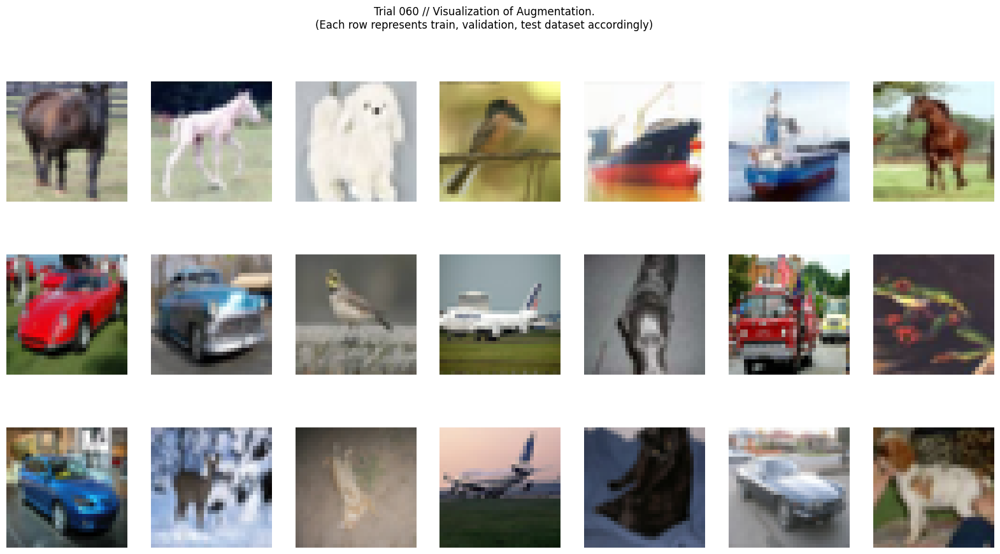

[RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |

Train: [001] Loss: 1.913, Acc: 28.79% F1(macro): 0.28: 100%|██████████| 156/156 [00:10<00:00, 14.77it/s]
 Val:       Loss: 1.595, Acc: 40.35% F1(macro): 0.38: 100%|██████████| 40/40 [00:01<00:00, 32.34it/s]


Model saved. Current best test f1: 0.381


Train: [002] Loss: 1.492, Acc: 44.72% F1(macro): 0.44: 100%|██████████| 156/156 [00:10<00:00, 14.89it/s]
 Val:       Loss: 1.399, Acc: 48.05% F1(macro): 0.47: 100%|██████████| 40/40 [00:01<00:00, 35.91it/s]


Model saved. Current best test f1: 0.473


Train: [003] Loss: 1.348, Acc: 51.16% F1(macro): 0.51: 100%|██████████| 156/156 [00:10<00:00, 15.28it/s]
 Val:       Loss: 1.310, Acc: 51.76% F1(macro): 0.51: 100%|██████████| 40/40 [00:01<00:00, 36.96it/s]


Model saved. Current best test f1: 0.510


Train: [004] Loss: 1.249, Acc: 55.27% F1(macro): 0.55: 100%|██████████| 156/156 [00:10<00:00, 14.70it/s]
 Val:       Loss: 1.258, Acc: 53.79% F1(macro): 0.53: 100%|██████████| 40/40 [00:01<00:00, 35.76it/s]


Model saved. Current best test f1: 0.534


Train: [005] Loss: 1.170, Acc: 58.25% F1(macro): 0.58: 100%|██████████| 156/156 [00:10<00:00, 14.94it/s]
 Val:       Loss: 1.194, Acc: 56.44% F1(macro): 0.56: 100%|██████████| 40/40 [00:01<00:00, 36.55it/s]


Model saved. Current best test f1: 0.561


Train: [006] Loss: 1.097, Acc: 60.67% F1(macro): 0.60: 100%|██████████| 156/156 [00:10<00:00, 14.64it/s]
 Val:       Loss: 1.173, Acc: 57.74% F1(macro): 0.58: 100%|██████████| 40/40 [00:01<00:00, 37.05it/s]


Model saved. Current best test f1: 0.575


Train: [007] Loss: 1.033, Acc: 63.27% F1(macro): 0.63: 100%|██████████| 156/156 [00:10<00:00, 14.95it/s]
 Val:       Loss: 1.110, Acc: 60.29% F1(macro): 0.60: 100%|██████████| 40/40 [00:01<00:00, 37.71it/s]


Model saved. Current best test f1: 0.597


Train: [008] Loss: 0.980, Acc: 65.24% F1(macro): 0.65: 100%|██████████| 156/156 [00:10<00:00, 15.14it/s]
 Val:       Loss: 1.076, Acc: 61.06% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 38.08it/s]


Model saved. Current best test f1: 0.610


Train: [009] Loss: 0.932, Acc: 67.15% F1(macro): 0.67: 100%|██████████| 156/156 [00:10<00:00, 14.87it/s]
 Val:       Loss: 1.071, Acc: 62.05% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 30.51it/s]


Model saved. Current best test f1: 0.617


Train: [010] Loss: 0.903, Acc: 67.95% F1(macro): 0.68: 100%|██████████| 156/156 [00:10<00:00, 14.52it/s]
 Val:       Loss: 1.037, Acc: 62.67% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 34.74it/s]


Model saved. Current best test f1: 0.625
TEST DATASET


 Val:       Loss: 1.052, Acc: 62.89% F1(macro): 0.63: 100%|██████████| 40/40 [00:01<00:00, 36.40it/s]
[I 2021-11-22 06:55:45,072] Trial 60 finished with value: 0.6257916026496212 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 25 with value: 0.6374215675170334.


Files already downloaded and verified
Files already downloaded and verified


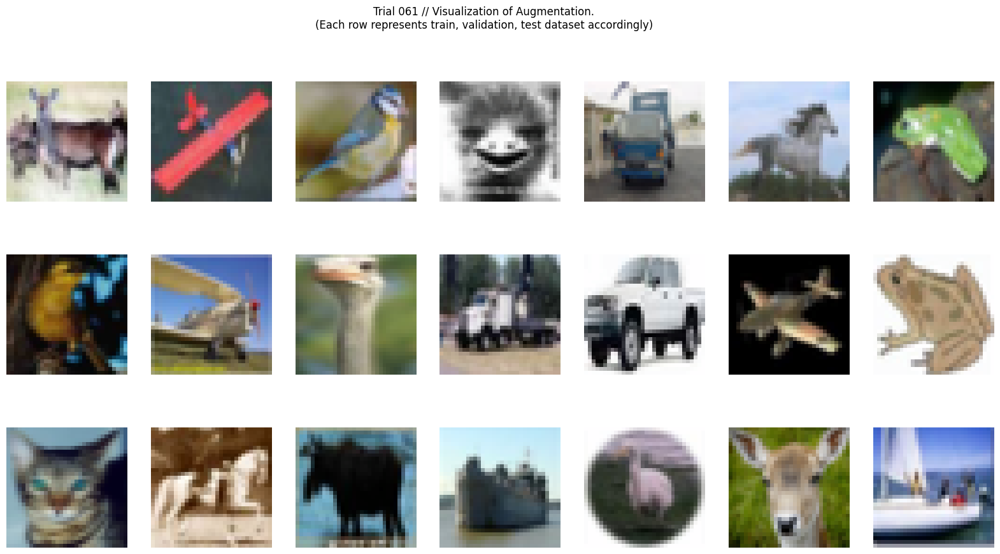

[RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |

Train: [001] Loss: 1.902, Acc: 29.22% F1(macro): 0.29: 100%|██████████| 156/156 [00:10<00:00, 14.76it/s]
 Val:       Loss: 1.628, Acc: 40.06% F1(macro): 0.38: 100%|██████████| 40/40 [00:01<00:00, 35.33it/s]


Model saved. Current best test f1: 0.383


Train: [002] Loss: 1.483, Acc: 45.55% F1(macro): 0.45: 100%|██████████| 156/156 [00:10<00:00, 14.79it/s]
 Val:       Loss: 1.406, Acc: 48.20% F1(macro): 0.47: 100%|██████████| 40/40 [00:01<00:00, 36.72it/s]


Model saved. Current best test f1: 0.471


Train: [003] Loss: 1.330, Acc: 51.73% F1(macro): 0.51: 100%|██████████| 156/156 [00:10<00:00, 14.94it/s]
 Val:       Loss: 1.351, Acc: 51.46% F1(macro): 0.51: 100%|██████████| 40/40 [00:01<00:00, 35.79it/s]


Model saved. Current best test f1: 0.513


Train: [004] Loss: 1.224, Acc: 55.70% F1(macro): 0.55: 100%|██████████| 156/156 [00:10<00:00, 14.96it/s]
 Val:       Loss: 1.221, Acc: 55.80% F1(macro): 0.55: 100%|██████████| 40/40 [00:01<00:00, 36.25it/s]


Model saved. Current best test f1: 0.554


Train: [005] Loss: 1.140, Acc: 59.00% F1(macro): 0.59: 100%|██████████| 156/156 [00:10<00:00, 14.54it/s]
 Val:       Loss: 1.169, Acc: 58.38% F1(macro): 0.58: 100%|██████████| 40/40 [00:01<00:00, 34.93it/s]


Model saved. Current best test f1: 0.583


Train: [006] Loss: 1.075, Acc: 61.60% F1(macro): 0.61: 100%|██████████| 156/156 [00:10<00:00, 14.63it/s]
 Val:       Loss: 1.123, Acc: 60.52% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 38.25it/s]


Model saved. Current best test f1: 0.608


Train: [007] Loss: 1.015, Acc: 63.68% F1(macro): 0.64: 100%|██████████| 156/156 [00:10<00:00, 14.34it/s]
 Val:       Loss: 1.071, Acc: 62.24% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 37.06it/s]


Model saved. Current best test f1: 0.623


Train: [008] Loss: 0.967, Acc: 65.24% F1(macro): 0.65: 100%|██████████| 156/156 [00:10<00:00, 14.61it/s]
 Val:       Loss: 1.040, Acc: 63.15% F1(macro): 0.63: 100%|██████████| 40/40 [00:01<00:00, 36.57it/s]


Model saved. Current best test f1: 0.630


Train: [009] Loss: 0.910, Acc: 67.76% F1(macro): 0.68: 100%|██████████| 156/156 [00:10<00:00, 14.63it/s]
 Val:       Loss: 1.019, Acc: 63.37% F1(macro): 0.63: 100%|██████████| 40/40 [00:01<00:00, 38.25it/s]


Model saved. Current best test f1: 0.635


Train: [010] Loss: 0.878, Acc: 68.61% F1(macro): 0.69: 100%|██████████| 156/156 [00:10<00:00, 14.36it/s]
 Val:       Loss: 0.988, Acc: 65.21% F1(macro): 0.65: 100%|██████████| 40/40 [00:01<00:00, 35.76it/s]


Model saved. Current best test f1: 0.654
TEST DATASET


 Val:       Loss: 1.025, Acc: 63.73% F1(macro): 0.64: 100%|██████████| 40/40 [00:01<00:00, 33.29it/s]
[I 2021-11-22 06:57:58,451] Trial 61 finished with value: 0.6380612760676546 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 61 with value: 0.6380612760676546.


Files already downloaded and verified
Files already downloaded and verified


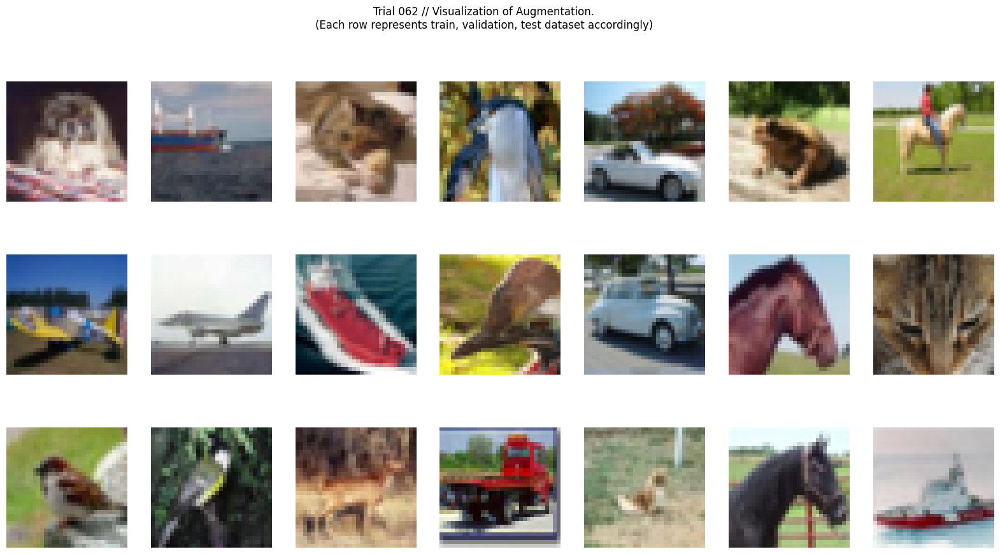

[RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |

Train: [001] Loss: 1.953, Acc: 27.35% F1(macro): 0.27: 100%|██████████| 156/156 [00:10<00:00, 14.52it/s]
 Val:       Loss: 1.658, Acc: 39.34% F1(macro): 0.38: 100%|██████████| 40/40 [00:01<00:00, 34.70it/s]


Model saved. Current best test f1: 0.383


Train: [002] Loss: 1.515, Acc: 44.13% F1(macro): 0.44: 100%|██████████| 156/156 [00:10<00:00, 14.28it/s]
 Val:       Loss: 1.436, Acc: 47.65% F1(macro): 0.47: 100%|██████████| 40/40 [00:02<00:00, 17.34it/s]


Model saved. Current best test f1: 0.471


Train: [003] Loss: 1.358, Acc: 50.53% F1(macro): 0.50: 100%|██████████| 156/156 [00:10<00:00, 14.88it/s]
 Val:       Loss: 1.355, Acc: 50.02% F1(macro): 0.50: 100%|██████████| 40/40 [00:01<00:00, 37.33it/s]


Model saved. Current best test f1: 0.497


Train: [004] Loss: 1.248, Acc: 55.05% F1(macro): 0.55: 100%|██████████| 156/156 [00:10<00:00, 14.67it/s]
 Val:       Loss: 1.273, Acc: 54.11% F1(macro): 0.54: 100%|██████████| 40/40 [00:01<00:00, 35.84it/s]


Model saved. Current best test f1: 0.535


Train: [005] Loss: 1.169, Acc: 57.80% F1(macro): 0.57: 100%|██████████| 156/156 [00:14<00:00, 10.91it/s]
 Val:       Loss: 1.195, Acc: 57.41% F1(macro): 0.58: 100%|██████████| 40/40 [00:02<00:00, 18.11it/s]


Model saved. Current best test f1: 0.575


Train: [006] Loss: 1.103, Acc: 60.63% F1(macro): 0.60: 100%|██████████| 156/156 [00:19<00:00,  8.05it/s]
 Val:       Loss: 1.192, Acc: 57.88% F1(macro): 0.57: 100%|██████████| 40/40 [00:02<00:00, 16.65it/s]
Train: [007] Loss: 1.043, Acc: 62.77% F1(macro): 0.63: 100%|██████████| 156/156 [00:19<00:00,  8.09it/s]
 Val:       Loss: 1.134, Acc: 60.29% F1(macro): 0.60: 100%|██████████| 40/40 [00:02<00:00, 16.14it/s]


Model saved. Current best test f1: 0.600


Train: [008] Loss: 1.000, Acc: 64.20% F1(macro): 0.64: 100%|██████████| 156/156 [00:14<00:00, 10.79it/s]
 Val:       Loss: 1.113, Acc: 61.05% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 24.75it/s]


Model saved. Current best test f1: 0.605


Train: [009] Loss: 0.949, Acc: 66.38% F1(macro): 0.66: 100%|██████████| 156/156 [00:12<00:00, 12.56it/s]
 Val:       Loss: 1.078, Acc: 62.54% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 24.65it/s]


Model saved. Current best test f1: 0.624


Train: [010] Loss: 0.911, Acc: 67.75% F1(macro): 0.68: 100%|██████████| 156/156 [00:11<00:00, 13.51it/s]
 Val:       Loss: 1.053, Acc: 62.10% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 33.75it/s]


TEST DATASET


 Val:       Loss: 1.050, Acc: 62.71% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 34.57it/s]
[I 2021-11-22 07:00:46,515] Trial 62 finished with value: 0.6234320584564714 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 61 with value: 0.6380612760676546.


Files already downloaded and verified
Files already downloaded and verified


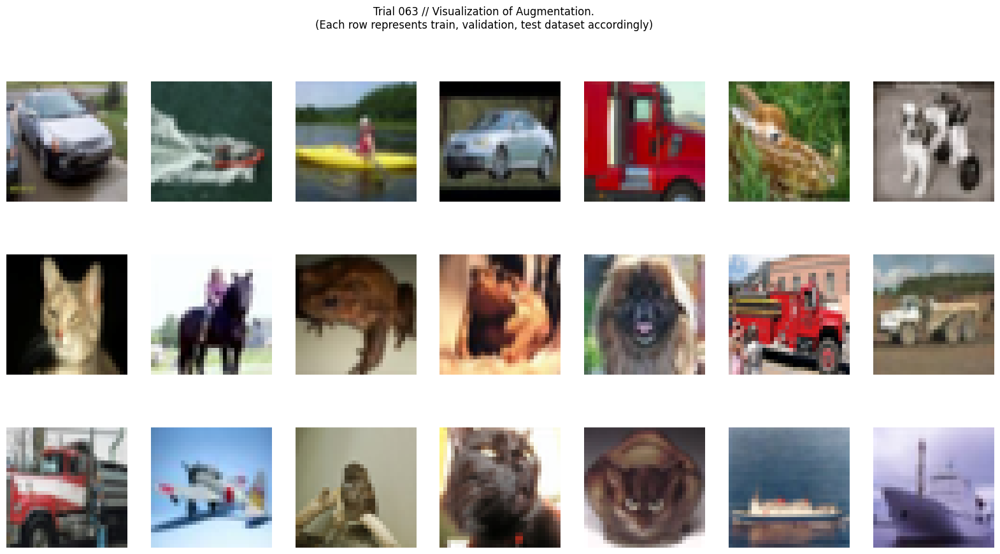

[RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |

Train: [001] Loss: 1.881, Acc: 30.34% F1(macro): 0.30: 100%|██████████| 156/156 [00:10<00:00, 14.65it/s]
 Val:       Loss: 1.592, Acc: 40.91% F1(macro): 0.40: 100%|██████████| 40/40 [00:01<00:00, 36.45it/s]


Model saved. Current best test f1: 0.401


Train: [002] Loss: 1.467, Acc: 46.29% F1(macro): 0.46: 100%|██████████| 156/156 [00:10<00:00, 14.82it/s]
 Val:       Loss: 1.402, Acc: 49.18% F1(macro): 0.49: 100%|██████████| 40/40 [00:01<00:00, 36.02it/s]


Model saved. Current best test f1: 0.490


Train: [003] Loss: 1.337, Acc: 51.47% F1(macro): 0.51: 100%|██████████| 156/156 [00:10<00:00, 14.79it/s]
 Val:       Loss: 1.288, Acc: 53.66% F1(macro): 0.54: 100%|██████████| 40/40 [00:01<00:00, 36.09it/s]


Model saved. Current best test f1: 0.535


Train: [004] Loss: 1.239, Acc: 55.25% F1(macro): 0.55: 100%|██████████| 156/156 [00:10<00:00, 14.81it/s]
 Val:       Loss: 1.252, Acc: 55.36% F1(macro): 0.55: 100%|██████████| 40/40 [00:01<00:00, 35.86it/s]


Model saved. Current best test f1: 0.550


Train: [005] Loss: 1.157, Acc: 58.72% F1(macro): 0.59: 100%|██████████| 156/156 [00:10<00:00, 14.46it/s]
 Val:       Loss: 1.165, Acc: 58.34% F1(macro): 0.58: 100%|██████████| 40/40 [00:01<00:00, 37.95it/s]


Model saved. Current best test f1: 0.583


Train: [006] Loss: 1.094, Acc: 61.09% F1(macro): 0.61: 100%|██████████| 156/156 [00:13<00:00, 11.28it/s]
 Val:       Loss: 1.109, Acc: 59.81% F1(macro): 0.59: 100%|██████████| 40/40 [00:02<00:00, 18.00it/s]


Model saved. Current best test f1: 0.595


Train: [007] Loss: 1.035, Acc: 63.04% F1(macro): 0.63: 100%|██████████| 156/156 [00:18<00:00,  8.37it/s]
 Val:       Loss: 1.118, Acc: 59.48% F1(macro): 0.59: 100%|██████████| 40/40 [00:02<00:00, 14.87it/s]
Train: [008] Loss: 0.982, Acc: 64.95% F1(macro): 0.65: 100%|██████████| 156/156 [00:19<00:00,  8.01it/s]
 Val:       Loss: 1.039, Acc: 62.13% F1(macro): 0.62: 100%|██████████| 40/40 [00:02<00:00, 17.17it/s]


Model saved. Current best test f1: 0.620


Train: [009] Loss: 0.935, Acc: 66.72% F1(macro): 0.67: 100%|██████████| 156/156 [00:16<00:00,  9.55it/s]
 Val:       Loss: 1.053, Acc: 62.46% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 23.90it/s]


Model saved. Current best test f1: 0.623


Train: [010] Loss: 0.902, Acc: 68.03% F1(macro): 0.68: 100%|██████████| 156/156 [00:12<00:00, 12.65it/s]
 Val:       Loss: 1.056, Acc: 62.91% F1(macro): 0.63: 100%|██████████| 40/40 [00:01<00:00, 25.81it/s]


Model saved. Current best test f1: 0.626
TEST DATASET


 Val:       Loss: 1.102, Acc: 61.70% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 24.59it/s]
[I 2021-11-22 07:03:33,535] Trial 63 finished with value: 0.6145211233786891 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 61 with value: 0.6380612760676546.


Files already downloaded and verified
Files already downloaded and verified


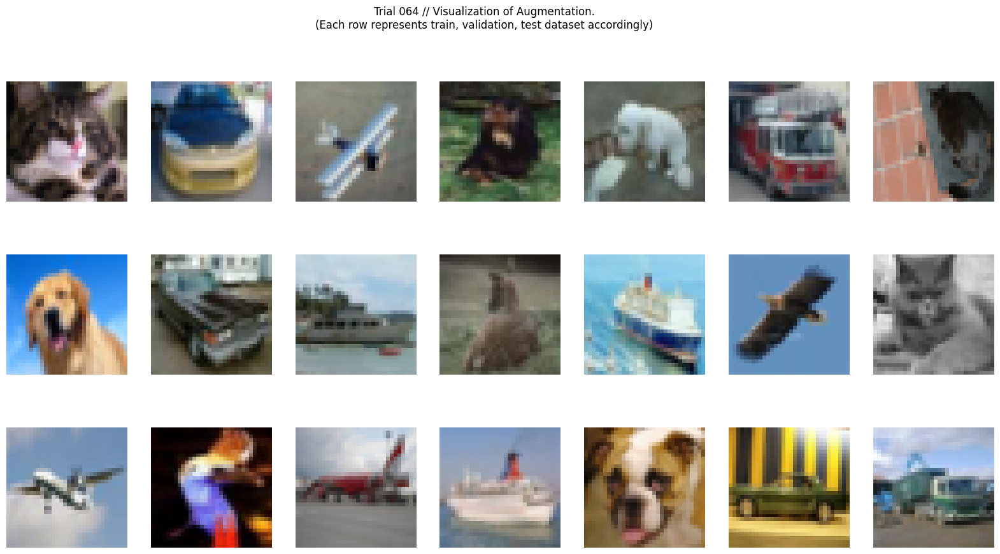

[RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |

Train: [001] Loss: 1.894, Acc: 29.64% F1(macro): 0.29: 100%|██████████| 156/156 [00:14<00:00, 10.42it/s]
 Val:       Loss: 1.596, Acc: 41.15% F1(macro): 0.41: 100%|██████████| 40/40 [00:02<00:00, 14.64it/s]


Model saved. Current best test f1: 0.406


Train: [002] Loss: 1.484, Acc: 45.58% F1(macro): 0.45: 100%|██████████| 156/156 [00:20<00:00,  7.80it/s]
 Val:       Loss: 1.420, Acc: 48.06% F1(macro): 0.47: 100%|██████████| 40/40 [00:02<00:00, 17.38it/s]


Model saved. Current best test f1: 0.468


Train: [003] Loss: 1.333, Acc: 51.86% F1(macro): 0.52: 100%|██████████| 156/156 [00:19<00:00,  7.83it/s]
 Val:       Loss: 1.317, Acc: 52.33% F1(macro): 0.52: 100%|██████████| 40/40 [00:02<00:00, 16.08it/s]


Model saved. Current best test f1: 0.518


Train: [004] Loss: 1.244, Acc: 55.12% F1(macro): 0.55: 100%|██████████| 156/156 [00:13<00:00, 11.48it/s]
 Val:       Loss: 1.274, Acc: 54.23% F1(macro): 0.54: 100%|██████████| 40/40 [00:01<00:00, 23.71it/s]


Model saved. Current best test f1: 0.539


Train: [005] Loss: 1.157, Acc: 58.71% F1(macro): 0.58: 100%|██████████| 156/156 [00:12<00:00, 12.77it/s]
 Val:       Loss: 1.235, Acc: 55.47% F1(macro): 0.56: 100%|██████████| 40/40 [00:01<00:00, 24.37it/s]


Model saved. Current best test f1: 0.556


Train: [006] Loss: 1.103, Acc: 60.54% F1(macro): 0.60: 100%|██████████| 156/156 [00:15<00:00, 10.26it/s]
 Val:       Loss: 1.159, Acc: 58.49% F1(macro): 0.58: 100%|██████████| 40/40 [00:02<00:00, 18.37it/s]


Model saved. Current best test f1: 0.583


Train: [007] Loss: 1.045, Acc: 62.77% F1(macro): 0.63: 100%|██████████| 156/156 [00:19<00:00,  7.87it/s]
 Val:       Loss: 1.198, Acc: 58.90% F1(macro): 0.59: 100%|██████████| 40/40 [00:02<00:00, 16.69it/s]


Model saved. Current best test f1: 0.585


Train: [008] Loss: 0.997, Acc: 64.82% F1(macro): 0.65: 100%|██████████| 156/156 [00:19<00:00,  8.02it/s]
 Val:       Loss: 1.117, Acc: 60.15% F1(macro): 0.60: 100%|██████████| 40/40 [00:02<00:00, 16.68it/s]


Model saved. Current best test f1: 0.602


Train: [009] Loss: 0.953, Acc: 66.09% F1(macro): 0.66: 100%|██████████| 156/156 [00:12<00:00, 12.12it/s]
 Val:       Loss: 1.076, Acc: 61.40% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 24.16it/s]


Model saved. Current best test f1: 0.612


Train: [010] Loss: 0.915, Acc: 67.54% F1(macro): 0.67: 100%|██████████| 156/156 [00:11<00:00, 13.06it/s]
 Val:       Loss: 1.093, Acc: 62.09% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 23.49it/s]


Model saved. Current best test f1: 0.618
TEST DATASET


 Val:       Loss: 1.098, Acc: 62.04% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 30.82it/s]
[I 2021-11-22 07:06:56,362] Trial 64 finished with value: 0.6162327220929716 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 61 with value: 0.6380612760676546.


Files already downloaded and verified
Files already downloaded and verified


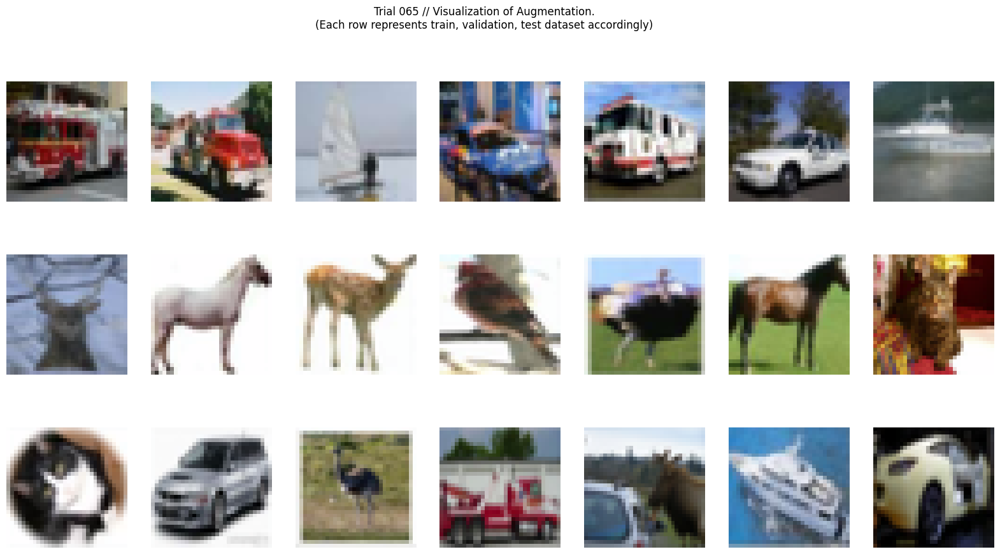

[RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |

Train: [001] Loss: 1.887, Acc: 29.37% F1(macro): 0.29: 100%|██████████| 156/156 [00:19<00:00,  8.04it/s]
 Val:       Loss: 1.650, Acc: 40.44% F1(macro): 0.40: 100%|██████████| 40/40 [00:02<00:00, 16.58it/s]


Model saved. Current best test f1: 0.401


Train: [002] Loss: 1.494, Acc: 45.04% F1(macro): 0.45: 100%|██████████| 156/156 [00:19<00:00,  7.97it/s]
 Val:       Loss: 1.473, Acc: 46.39% F1(macro): 0.46: 100%|██████████| 40/40 [00:02<00:00, 15.84it/s]


Model saved. Current best test f1: 0.456


Train: [003] Loss: 1.344, Acc: 51.01% F1(macro): 0.51: 100%|██████████| 156/156 [00:18<00:00,  8.43it/s]
 Val:       Loss: 1.326, Acc: 52.25% F1(macro): 0.52: 100%|██████████| 40/40 [00:01<00:00, 28.41it/s]


Model saved. Current best test f1: 0.516


Train: [004] Loss: 1.234, Acc: 55.18% F1(macro): 0.55: 100%|██████████| 156/156 [00:12<00:00, 12.78it/s]
 Val:       Loss: 1.243, Acc: 55.63% F1(macro): 0.55: 100%|██████████| 40/40 [00:01<00:00, 24.71it/s]


Model saved. Current best test f1: 0.552


Train: [005] Loss: 1.147, Acc: 58.74% F1(macro): 0.59: 100%|██████████| 156/156 [00:12<00:00, 12.95it/s]
 Val:       Loss: 1.215, Acc: 56.62% F1(macro): 0.57: 100%|██████████| 40/40 [00:01<00:00, 34.98it/s]


Model saved. Current best test f1: 0.565


Train: [006] Loss: 1.083, Acc: 61.07% F1(macro): 0.61: 100%|██████████| 156/156 [00:19<00:00,  7.95it/s]
 Val:       Loss: 1.148, Acc: 59.21% F1(macro): 0.59: 100%|██████████| 40/40 [00:02<00:00, 16.61it/s]


Model saved. Current best test f1: 0.591


Train: [007] Loss: 1.020, Acc: 63.57% F1(macro): 0.63: 100%|██████████| 156/156 [00:18<00:00,  8.58it/s]
 Val:       Loss: 1.111, Acc: 60.52% F1(macro): 0.61: 100%|██████████| 40/40 [00:02<00:00, 16.10it/s]


Model saved. Current best test f1: 0.605


Train: [008] Loss: 0.965, Acc: 65.88% F1(macro): 0.66: 100%|██████████| 156/156 [00:18<00:00,  8.47it/s]
 Val:       Loss: 1.069, Acc: 62.60% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 29.46it/s]


Model saved. Current best test f1: 0.623


Train: [009] Loss: 0.915, Acc: 67.54% F1(macro): 0.67: 100%|██████████| 156/156 [00:11<00:00, 13.12it/s]
 Val:       Loss: 1.036, Acc: 63.99% F1(macro): 0.64: 100%|██████████| 40/40 [00:01<00:00, 25.97it/s]


Model saved. Current best test f1: 0.637


Train: [010] Loss: 0.867, Acc: 69.25% F1(macro): 0.69: 100%|██████████| 156/156 [00:11<00:00, 13.16it/s]
 Val:       Loss: 1.035, Acc: 64.62% F1(macro): 0.64: 100%|██████████| 40/40 [00:01<00:00, 31.23it/s]


Model saved. Current best test f1: 0.644
TEST DATASET


 Val:       Loss: 1.023, Acc: 63.77% F1(macro): 0.63: 100%|██████████| 40/40 [00:02<00:00, 17.39it/s]
[I 2021-11-22 07:10:18,125] Trial 65 finished with value: 0.6348789170239375 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 61 with value: 0.6380612760676546.


Files already downloaded and verified
Files already downloaded and verified


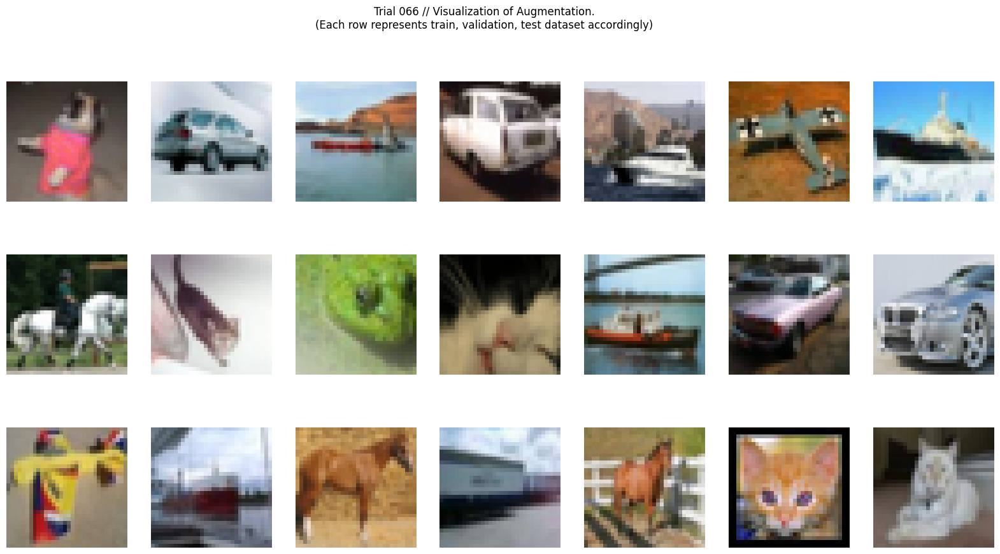

[RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |

Train: [001] Loss: 1.926, Acc: 28.35% F1(macro): 0.28: 100%|██████████| 156/156 [00:19<00:00,  7.89it/s]
 Val:       Loss: 1.633, Acc: 39.64% F1(macro): 0.39: 100%|██████████| 40/40 [00:02<00:00, 17.11it/s]


Model saved. Current best test f1: 0.387


Train: [002] Loss: 1.514, Acc: 44.08% F1(macro): 0.43: 100%|██████████| 156/156 [00:19<00:00,  8.02it/s]
 Val:       Loss: 1.453, Acc: 46.70% F1(macro): 0.46: 100%|██████████| 40/40 [00:02<00:00, 17.90it/s]


Model saved. Current best test f1: 0.462


Train: [003] Loss: 1.369, Acc: 49.94% F1(macro): 0.50: 100%|██████████| 156/156 [00:15<00:00, 10.28it/s]
 Val:       Loss: 1.364, Acc: 50.12% F1(macro): 0.50: 100%|██████████| 40/40 [00:01<00:00, 23.56it/s]


Model saved. Current best test f1: 0.495


Train: [004] Loss: 1.267, Acc: 53.99% F1(macro): 0.54: 100%|██████████| 156/156 [00:12<00:00, 12.76it/s]
 Val:       Loss: 1.283, Acc: 52.90% F1(macro): 0.52: 100%|██████████| 40/40 [00:02<00:00, 19.71it/s]


Model saved. Current best test f1: 0.520


Train: [005] Loss: 1.180, Acc: 57.31% F1(macro): 0.57: 100%|██████████| 156/156 [00:13<00:00, 11.59it/s]
 Val:       Loss: 1.238, Acc: 55.88% F1(macro): 0.55: 100%|██████████| 40/40 [00:02<00:00, 16.16it/s]


Model saved. Current best test f1: 0.553


Train: [006] Loss: 1.104, Acc: 60.33% F1(macro): 0.60: 100%|██████████| 156/156 [00:20<00:00,  7.71it/s]
 Val:       Loss: 1.159, Acc: 58.41% F1(macro): 0.58: 100%|██████████| 40/40 [00:02<00:00, 14.24it/s]


Model saved. Current best test f1: 0.582


Train: [007] Loss: 1.046, Acc: 62.69% F1(macro): 0.63: 100%|██████████| 156/156 [00:11<00:00, 13.78it/s]
 Val:       Loss: 1.183, Acc: 58.03% F1(macro): 0.57: 100%|██████████| 40/40 [00:01<00:00, 33.66it/s]
Train: [008] Loss: 1.004, Acc: 64.10% F1(macro): 0.64: 100%|██████████| 156/156 [00:10<00:00, 14.43it/s]
 Val:       Loss: 1.110, Acc: 60.59% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 31.43it/s]


Model saved. Current best test f1: 0.605


Train: [009] Loss: 0.952, Acc: 66.04% F1(macro): 0.66: 100%|██████████| 156/156 [00:12<00:00, 12.62it/s]
 Val:       Loss: 1.076, Acc: 61.87% F1(macro): 0.62: 100%|██████████| 40/40 [00:02<00:00, 14.33it/s]


Model saved. Current best test f1: 0.616


Train: [010] Loss: 0.916, Acc: 67.54% F1(macro): 0.67: 100%|██████████| 156/156 [00:20<00:00,  7.70it/s]
 Val:       Loss: 1.060, Acc: 62.87% F1(macro): 0.62: 100%|██████████| 40/40 [00:02<00:00, 15.07it/s]


Model saved. Current best test f1: 0.624
TEST DATASET


 Val:       Loss: 1.086, Acc: 62.24% F1(macro): 0.62: 100%|██████████| 40/40 [00:02<00:00, 17.47it/s]
[I 2021-11-22 07:13:36,922] Trial 66 finished with value: 0.6187257532742992 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 61 with value: 0.6380612760676546.


Files already downloaded and verified
Files already downloaded and verified


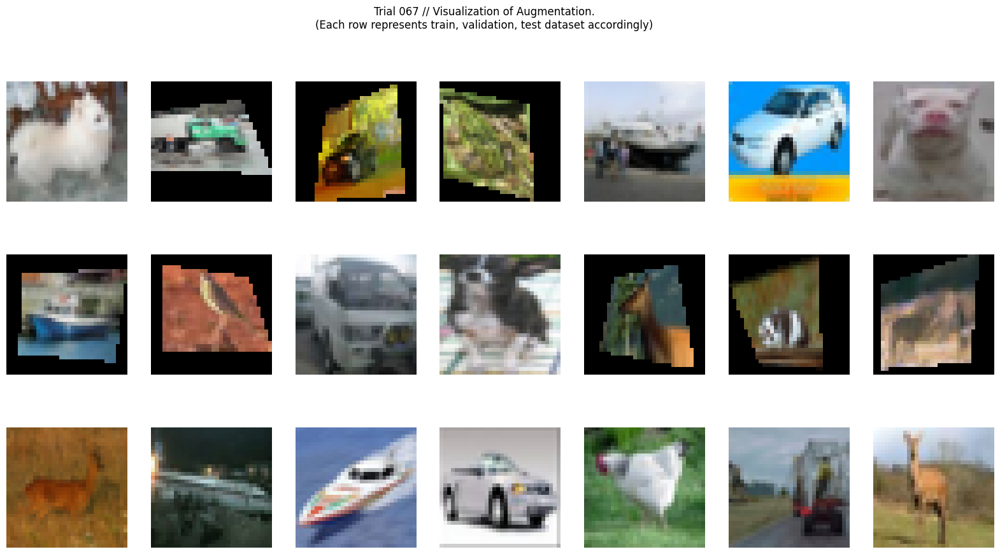

[RandomPerspective(p=0.5), RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           4

Train: [001] Loss: 2.102, Acc: 22.04% F1(macro): 0.21: 100%|██████████| 156/156 [00:20<00:00,  7.60it/s]
 Val:       Loss: 1.884, Acc: 31.37% F1(macro): 0.29: 100%|██████████| 40/40 [00:03<00:00, 11.15it/s]


Model saved. Current best test f1: 0.290


Train: [002] Loss: 1.736, Acc: 35.85% F1(macro): 0.35: 100%|██████████| 156/156 [00:14<00:00, 10.63it/s]
 Val:       Loss: 1.652, Acc: 39.39% F1(macro): 0.37: 100%|██████████| 40/40 [00:02<00:00, 15.04it/s]


Model saved. Current best test f1: 0.374


Train: [003] Loss: 1.592, Acc: 41.68% F1(macro): 0.41: 100%|██████████| 156/156 [00:13<00:00, 11.50it/s]
 Val:       Loss: 1.546, Acc: 43.24% F1(macro): 0.43: 100%|██████████| 40/40 [00:01<00:00, 22.61it/s]


Model saved. Current best test f1: 0.429


Train: [004] Loss: 1.504, Acc: 44.76% F1(macro): 0.44: 100%|██████████| 156/156 [00:10<00:00, 14.41it/s]
 Val:       Loss: 1.519, Acc: 44.74% F1(macro): 0.44: 100%|██████████| 40/40 [00:01<00:00, 22.73it/s]


Model saved. Current best test f1: 0.442


Train: [005] Loss: 1.444, Acc: 47.28% F1(macro): 0.47: 100%|██████████| 156/156 [00:10<00:00, 14.42it/s]
 Val:       Loss: 1.432, Acc: 47.76% F1(macro): 0.47: 100%|██████████| 40/40 [00:01<00:00, 25.29it/s]


Model saved. Current best test f1: 0.471


Train: [006] Loss: 1.385, Acc: 49.56% F1(macro): 0.49: 100%|██████████| 156/156 [00:10<00:00, 14.78it/s]
 Val:       Loss: 1.373, Acc: 50.17% F1(macro): 0.49: 100%|██████████| 40/40 [00:01<00:00, 25.01it/s]


Model saved. Current best test f1: 0.494


Train: [007] Loss: 1.348, Acc: 51.24% F1(macro): 0.51: 100%|██████████| 156/156 [00:10<00:00, 14.62it/s]
 Val:       Loss: 1.374, Acc: 50.06% F1(macro): 0.50: 100%|██████████| 40/40 [00:01<00:00, 24.69it/s]


Model saved. Current best test f1: 0.499


Train: [008] Loss: 1.290, Acc: 53.39% F1(macro): 0.53: 100%|██████████| 156/156 [00:10<00:00, 14.23it/s]
 Val:       Loss: 1.323, Acc: 52.16% F1(macro): 0.52: 100%|██████████| 40/40 [00:01<00:00, 25.12it/s]


Model saved. Current best test f1: 0.517


Train: [009] Loss: 1.250, Acc: 54.98% F1(macro): 0.55: 100%|██████████| 156/156 [00:10<00:00, 14.39it/s]
 Val:       Loss: 1.297, Acc: 53.37% F1(macro): 0.53: 100%|██████████| 40/40 [00:01<00:00, 23.82it/s]


Model saved. Current best test f1: 0.528


Train: [010] Loss: 1.219, Acc: 56.19% F1(macro): 0.56: 100%|██████████| 156/156 [00:10<00:00, 14.96it/s]
 Val:       Loss: 1.256, Acc: 54.61% F1(macro): 0.54: 100%|██████████| 40/40 [00:01<00:00, 25.02it/s]


Model saved. Current best test f1: 0.543
TEST DATASET


 Val:       Loss: 1.124, Acc: 59.32% F1(macro): 0.59: 100%|██████████| 40/40 [00:01<00:00, 39.23it/s]
[I 2021-11-22 07:16:19,623] Trial 67 finished with value: 0.5901256112985745 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': True, 'aug_random_flip': True}. Best is trial 61 with value: 0.6380612760676546.


Files already downloaded and verified
Files already downloaded and verified


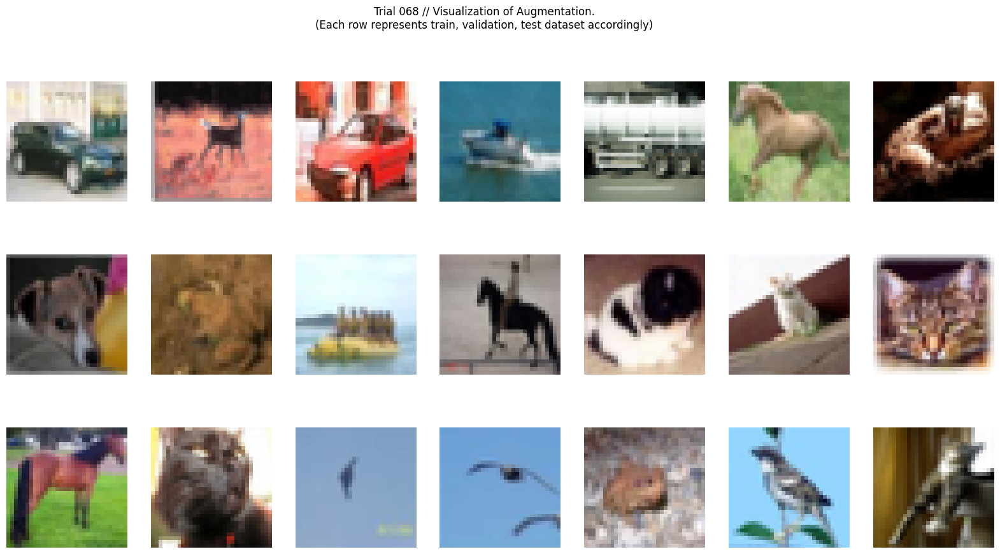

[RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |

Train: [001] Loss: 1.944, Acc: 28.09% F1(macro): 0.28: 100%|██████████| 156/156 [00:10<00:00, 15.57it/s]
 Val:       Loss: 1.642, Acc: 39.09% F1(macro): 0.38: 100%|██████████| 40/40 [00:01<00:00, 36.00it/s]


Model saved. Current best test f1: 0.385


Train: [002] Loss: 1.526, Acc: 44.14% F1(macro): 0.44: 100%|██████████| 156/156 [00:10<00:00, 15.31it/s]
 Val:       Loss: 1.433, Acc: 47.25% F1(macro): 0.46: 100%|██████████| 40/40 [00:01<00:00, 35.59it/s]


Model saved. Current best test f1: 0.465


Train: [003] Loss: 1.361, Acc: 50.28% F1(macro): 0.50: 100%|██████████| 156/156 [00:10<00:00, 15.36it/s]
 Val:       Loss: 1.336, Acc: 51.03% F1(macro): 0.50: 100%|██████████| 40/40 [00:01<00:00, 31.73it/s]


Model saved. Current best test f1: 0.505


Train: [004] Loss: 1.249, Acc: 54.86% F1(macro): 0.55: 100%|██████████| 156/156 [00:10<00:00, 15.47it/s]
 Val:       Loss: 1.257, Acc: 54.94% F1(macro): 0.55: 100%|██████████| 40/40 [00:01<00:00, 37.24it/s]


Model saved. Current best test f1: 0.547


Train: [005] Loss: 1.172, Acc: 57.94% F1(macro): 0.58: 100%|██████████| 156/156 [00:10<00:00, 14.93it/s]
 Val:       Loss: 1.242, Acc: 55.98% F1(macro): 0.55: 100%|██████████| 40/40 [00:01<00:00, 38.03it/s]


Model saved. Current best test f1: 0.554


Train: [006] Loss: 1.096, Acc: 60.71% F1(macro): 0.61: 100%|██████████| 156/156 [00:10<00:00, 15.23it/s]
 Val:       Loss: 1.157, Acc: 58.52% F1(macro): 0.58: 100%|██████████| 40/40 [00:01<00:00, 36.40it/s]


Model saved. Current best test f1: 0.584


Train: [007] Loss: 1.042, Acc: 62.75% F1(macro): 0.63: 100%|██████████| 156/156 [00:10<00:00, 15.28it/s]
 Val:       Loss: 1.131, Acc: 59.89% F1(macro): 0.60: 100%|██████████| 40/40 [00:01<00:00, 36.00it/s]


Model saved. Current best test f1: 0.596


Train: [008] Loss: 0.992, Acc: 64.89% F1(macro): 0.65: 100%|██████████| 156/156 [00:10<00:00, 14.97it/s]
 Val:       Loss: 1.118, Acc: 60.70% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 35.51it/s]


Model saved. Current best test f1: 0.610


Train: [009] Loss: 0.942, Acc: 66.21% F1(macro): 0.66: 100%|██████████| 156/156 [00:10<00:00, 15.25it/s]
 Val:       Loss: 1.087, Acc: 61.49% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 37.04it/s]


Model saved. Current best test f1: 0.614


Train: [010] Loss: 0.903, Acc: 67.76% F1(macro): 0.68: 100%|██████████| 156/156 [00:10<00:00, 15.47it/s]
 Val:       Loss: 1.043, Acc: 62.76% F1(macro): 0.63: 100%|██████████| 40/40 [00:01<00:00, 36.26it/s]


Model saved. Current best test f1: 0.626
TEST DATASET


 Val:       Loss: 1.049, Acc: 63.51% F1(macro): 0.63: 100%|██████████| 40/40 [00:01<00:00, 38.45it/s]
[I 2021-11-22 07:18:28,628] Trial 68 finished with value: 0.6322463779088369 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 61 with value: 0.6380612760676546.


Files already downloaded and verified
Files already downloaded and verified


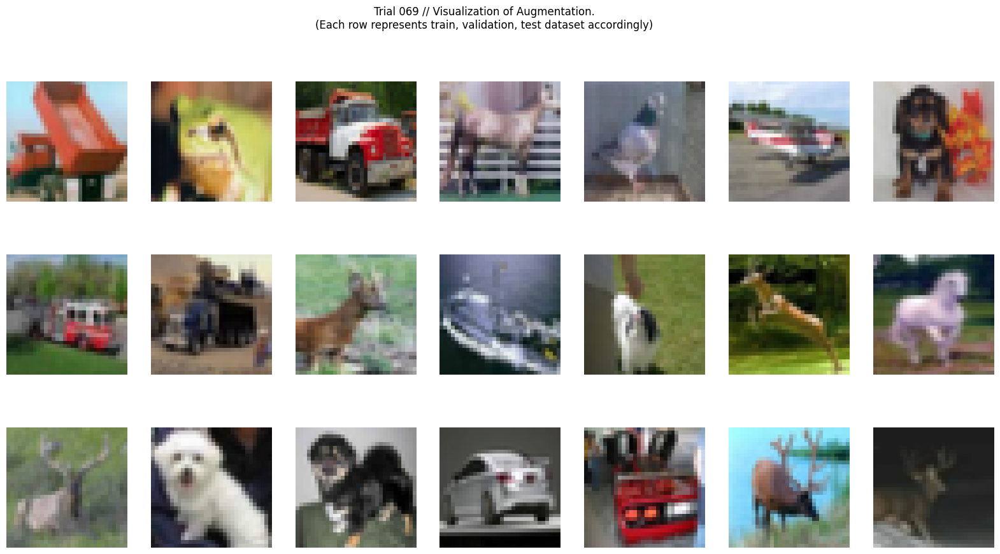

[RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |

Train: [001] Loss: 1.905, Acc: 29.30% F1(macro): 0.29: 100%|██████████| 156/156 [00:10<00:00, 14.80it/s]
 Val:       Loss: 1.622, Acc: 41.38% F1(macro): 0.41: 100%|██████████| 40/40 [00:01<00:00, 38.85it/s]


Model saved. Current best test f1: 0.407


Train: [002] Loss: 1.483, Acc: 45.47% F1(macro): 0.45: 100%|██████████| 156/156 [00:10<00:00, 15.27it/s]
 Val:       Loss: 1.462, Acc: 48.74% F1(macro): 0.48: 100%|██████████| 40/40 [00:01<00:00, 38.24it/s]


Model saved. Current best test f1: 0.484


Train: [003] Loss: 1.324, Acc: 51.85% F1(macro): 0.52: 100%|██████████| 156/156 [00:10<00:00, 15.10it/s]
 Val:       Loss: 1.307, Acc: 53.34% F1(macro): 0.53: 100%|██████████| 40/40 [00:01<00:00, 36.05it/s]


Model saved. Current best test f1: 0.528


Train: [004] Loss: 1.205, Acc: 56.97% F1(macro): 0.57: 100%|██████████| 156/156 [00:10<00:00, 14.96it/s]
 Val:       Loss: 1.215, Acc: 56.59% F1(macro): 0.56: 100%|██████████| 40/40 [00:01<00:00, 37.09it/s]


Model saved. Current best test f1: 0.562


Train: [005] Loss: 1.121, Acc: 59.54% F1(macro): 0.59: 100%|██████████| 156/156 [00:10<00:00, 15.44it/s]
 Val:       Loss: 1.155, Acc: 58.50% F1(macro): 0.58: 100%|██████████| 40/40 [00:01<00:00, 35.92it/s]


Model saved. Current best test f1: 0.583


Train: [006] Loss: 1.050, Acc: 62.38% F1(macro): 0.62: 100%|██████████| 156/156 [00:10<00:00, 14.95it/s]
 Val:       Loss: 1.092, Acc: 60.72% F1(macro): 0.60: 100%|██████████| 40/40 [00:01<00:00, 37.20it/s]


Model saved. Current best test f1: 0.605


Train: [007] Loss: 0.984, Acc: 64.78% F1(macro): 0.65: 100%|██████████| 156/156 [00:10<00:00, 15.33it/s]
 Val:       Loss: 1.061, Acc: 62.84% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 37.19it/s]


Model saved. Current best test f1: 0.623


Train: [008] Loss: 0.939, Acc: 66.38% F1(macro): 0.66: 100%|██████████| 156/156 [00:10<00:00, 14.68it/s]
 Val:       Loss: 1.029, Acc: 62.66% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 35.82it/s]
Train: [009] Loss: 0.905, Acc: 67.84% F1(macro): 0.68: 100%|██████████| 156/156 [00:09<00:00, 15.72it/s]
 Val:       Loss: 1.019, Acc: 64.61% F1(macro): 0.64: 100%|██████████| 40/40 [00:01<00:00, 37.87it/s]


Model saved. Current best test f1: 0.643


Train: [010] Loss: 0.858, Acc: 69.62% F1(macro): 0.70: 100%|██████████| 156/156 [00:10<00:00, 14.71it/s]
 Val:       Loss: 0.961, Acc: 66.03% F1(macro): 0.66: 100%|██████████| 40/40 [00:01<00:00, 36.84it/s]


Model saved. Current best test f1: 0.659
TEST DATASET


 Val:       Loss: 0.978, Acc: 65.02% F1(macro): 0.65: 100%|██████████| 40/40 [00:01<00:00, 37.03it/s]
[I 2021-11-22 07:20:37,929] Trial 69 finished with value: 0.6497389456185138 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 69 with value: 0.6497389456185138.


Files already downloaded and verified
Files already downloaded and verified


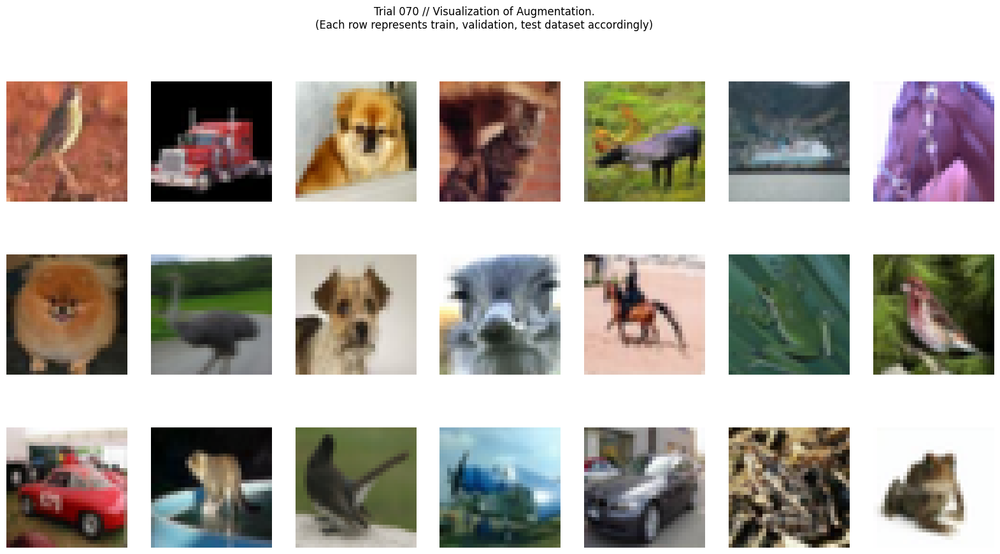

[RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |

Train: [001] Loss: 1.937, Acc: 27.70% F1(macro): 0.27: 100%|██████████| 156/156 [00:10<00:00, 14.79it/s]
 Val:       Loss: 1.682, Acc: 38.88% F1(macro): 0.38: 100%|██████████| 40/40 [00:01<00:00, 36.72it/s]


Model saved. Current best test f1: 0.378


Train: [002] Loss: 1.516, Acc: 44.32% F1(macro): 0.44: 100%|██████████| 156/156 [00:10<00:00, 14.66it/s]
 Val:       Loss: 1.458, Acc: 47.52% F1(macro): 0.47: 100%|██████████| 40/40 [00:01<00:00, 34.80it/s]


Model saved. Current best test f1: 0.465


Train: [003] Loss: 1.372, Acc: 50.39% F1(macro): 0.50: 100%|██████████| 156/156 [00:10<00:00, 14.71it/s]
 Val:       Loss: 1.325, Acc: 52.58% F1(macro): 0.52: 100%|██████████| 40/40 [00:01<00:00, 36.88it/s]


Model saved. Current best test f1: 0.518


Train: [004] Loss: 1.263, Acc: 54.16% F1(macro): 0.54: 100%|██████████| 156/156 [00:10<00:00, 15.50it/s]
 Val:       Loss: 1.268, Acc: 54.30% F1(macro): 0.53: 100%|██████████| 40/40 [00:01<00:00, 36.71it/s]


Model saved. Current best test f1: 0.533


Train: [005] Loss: 1.179, Acc: 57.49% F1(macro): 0.57: 100%|██████████| 156/156 [00:10<00:00, 15.04it/s]
 Val:       Loss: 1.237, Acc: 55.43% F1(macro): 0.55: 100%|██████████| 40/40 [00:01<00:00, 37.44it/s]


Model saved. Current best test f1: 0.547


Train: [006] Loss: 1.112, Acc: 60.08% F1(macro): 0.60: 100%|██████████| 156/156 [00:10<00:00, 14.90it/s]
 Val:       Loss: 1.177, Acc: 57.85% F1(macro): 0.57: 100%|██████████| 40/40 [00:01<00:00, 37.46it/s]


Model saved. Current best test f1: 0.571


Train: [007] Loss: 1.057, Acc: 62.24% F1(macro): 0.62: 100%|██████████| 156/156 [00:10<00:00, 14.97it/s]
 Val:       Loss: 1.132, Acc: 60.11% F1(macro): 0.60: 100%|██████████| 40/40 [00:01<00:00, 36.49it/s]


Model saved. Current best test f1: 0.598


Train: [008] Loss: 1.003, Acc: 64.21% F1(macro): 0.64: 100%|██████████| 156/156 [00:10<00:00, 15.34it/s]
 Val:       Loss: 1.117, Acc: 60.60% F1(macro): 0.60: 100%|██████████| 40/40 [00:01<00:00, 36.00it/s]


Model saved. Current best test f1: 0.604


Train: [009] Loss: 0.952, Acc: 66.07% F1(macro): 0.66: 100%|██████████| 156/156 [00:10<00:00, 15.40it/s]
 Val:       Loss: 1.092, Acc: 61.63% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 36.85it/s]


Model saved. Current best test f1: 0.613


Train: [010] Loss: 0.908, Acc: 67.81% F1(macro): 0.68: 100%|██████████| 156/156 [00:10<00:00, 15.55it/s]
 Val:       Loss: 1.066, Acc: 62.77% F1(macro): 0.63: 100%|██████████| 40/40 [00:01<00:00, 36.51it/s]


Model saved. Current best test f1: 0.627
TEST DATASET


 Val:       Loss: 1.066, Acc: 62.46% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 38.47it/s]
[I 2021-11-22 07:22:48,011] Trial 70 finished with value: 0.624621654205903 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 69 with value: 0.6497389456185138.


Files already downloaded and verified
Files already downloaded and verified


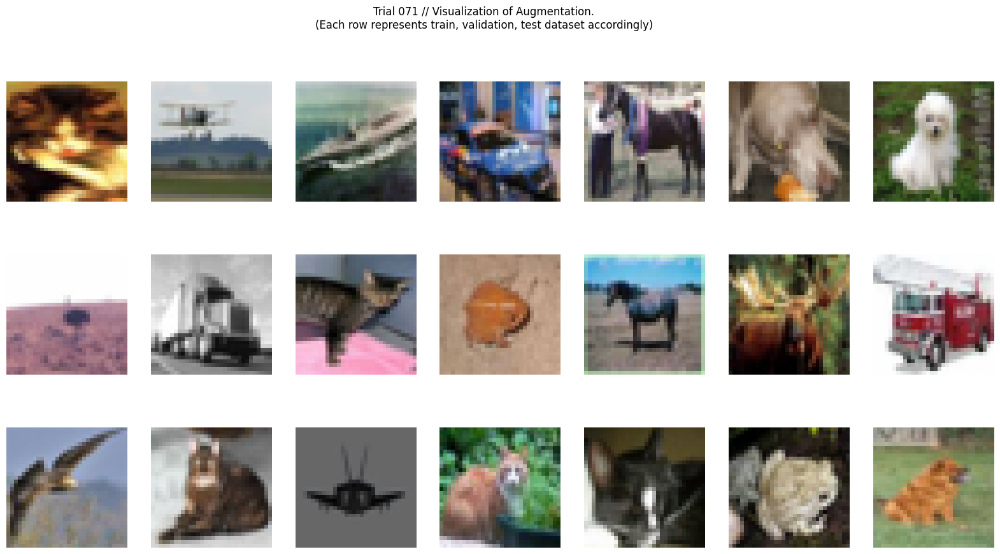

[RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |

Train: [001] Loss: 1.957, Acc: 26.96% F1(macro): 0.26: 100%|██████████| 156/156 [00:10<00:00, 15.09it/s]
 Val:       Loss: 1.730, Acc: 37.94% F1(macro): 0.37: 100%|██████████| 40/40 [00:01<00:00, 34.27it/s]


Model saved. Current best test f1: 0.369


Train: [002] Loss: 1.550, Acc: 43.03% F1(macro): 0.43: 100%|██████████| 156/156 [00:10<00:00, 14.84it/s]
 Val:       Loss: 1.487, Acc: 45.83% F1(macro): 0.45: 100%|██████████| 40/40 [00:01<00:00, 36.14it/s]


Model saved. Current best test f1: 0.447


Train: [003] Loss: 1.390, Acc: 49.45% F1(macro): 0.49: 100%|██████████| 156/156 [00:10<00:00, 15.26it/s]
 Val:       Loss: 1.399, Acc: 48.91% F1(macro): 0.49: 100%|██████████| 40/40 [00:01<00:00, 37.77it/s]


Model saved. Current best test f1: 0.488


Train: [004] Loss: 1.297, Acc: 53.13% F1(macro): 0.53: 100%|██████████| 156/156 [00:10<00:00, 14.91it/s]
 Val:       Loss: 1.345, Acc: 51.97% F1(macro): 0.52: 100%|██████████| 40/40 [00:01<00:00, 34.65it/s]


Model saved. Current best test f1: 0.520


Train: [005] Loss: 1.205, Acc: 56.45% F1(macro): 0.56: 100%|██████████| 156/156 [00:10<00:00, 15.15it/s]
 Val:       Loss: 1.277, Acc: 54.57% F1(macro): 0.54: 100%|██████████| 40/40 [00:01<00:00, 38.47it/s]


Model saved. Current best test f1: 0.541


Train: [006] Loss: 1.134, Acc: 59.25% F1(macro): 0.59: 100%|██████████| 156/156 [00:10<00:00, 14.73it/s]
 Val:       Loss: 1.208, Acc: 57.21% F1(macro): 0.57: 100%|██████████| 40/40 [00:01<00:00, 37.14it/s]


Model saved. Current best test f1: 0.567


Train: [007] Loss: 1.074, Acc: 61.56% F1(macro): 0.61: 100%|██████████| 156/156 [00:10<00:00, 14.72it/s]
 Val:       Loss: 1.173, Acc: 58.56% F1(macro): 0.58: 100%|██████████| 40/40 [00:01<00:00, 34.63it/s]


Model saved. Current best test f1: 0.582


Train: [008] Loss: 1.036, Acc: 63.09% F1(macro): 0.63: 100%|██████████| 156/156 [00:10<00:00, 15.15it/s]
 Val:       Loss: 1.140, Acc: 59.83% F1(macro): 0.60: 100%|██████████| 40/40 [00:01<00:00, 36.57it/s]


Model saved. Current best test f1: 0.600


Train: [009] Loss: 0.985, Acc: 64.84% F1(macro): 0.65: 100%|██████████| 156/156 [00:10<00:00, 15.24it/s]
 Val:       Loss: 1.151, Acc: 59.27% F1(macro): 0.59: 100%|██████████| 40/40 [00:01<00:00, 35.74it/s]
Train: [010] Loss: 0.947, Acc: 66.35% F1(macro): 0.66: 100%|██████████| 156/156 [00:09<00:00, 15.82it/s]
 Val:       Loss: 1.111, Acc: 61.18% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 35.40it/s]


Model saved. Current best test f1: 0.612
TEST DATASET


 Val:       Loss: 1.090, Acc: 61.58% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 36.36it/s]
[I 2021-11-22 07:24:57,384] Trial 71 finished with value: 0.6141131408243795 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 69 with value: 0.6497389456185138.


Files already downloaded and verified
Files already downloaded and verified


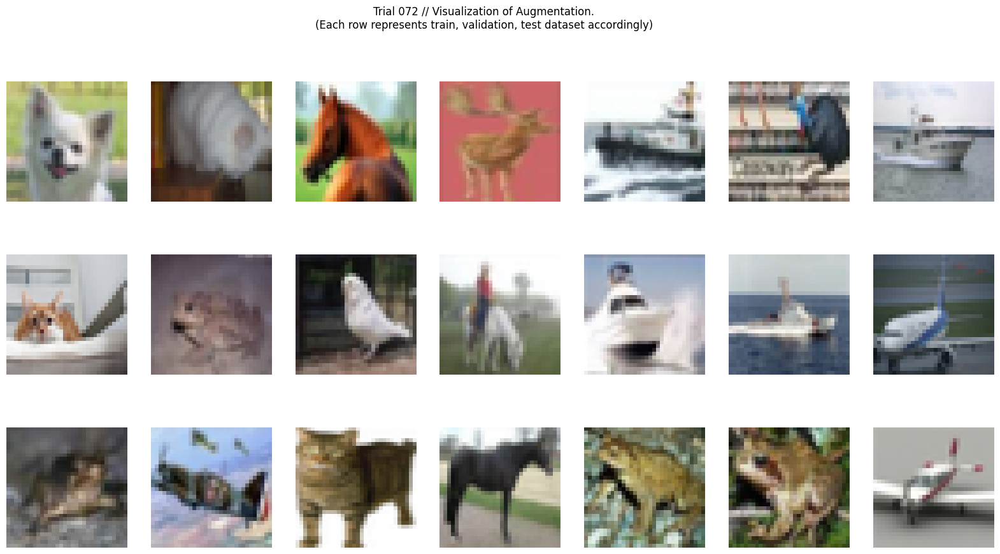

[RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |

Train: [001] Loss: 1.907, Acc: 28.62% F1(macro): 0.28: 100%|██████████| 156/156 [00:10<00:00, 14.84it/s]
 Val:       Loss: 1.637, Acc: 39.19% F1(macro): 0.38: 100%|██████████| 40/40 [00:01<00:00, 33.52it/s]


Model saved. Current best test f1: 0.383


Train: [002] Loss: 1.487, Acc: 45.32% F1(macro): 0.45: 100%|██████████| 156/156 [00:10<00:00, 14.70it/s]
 Val:       Loss: 1.419, Acc: 48.81% F1(macro): 0.48: 100%|██████████| 40/40 [00:01<00:00, 33.26it/s]


Model saved. Current best test f1: 0.479


Train: [003] Loss: 1.329, Acc: 51.50% F1(macro): 0.51: 100%|██████████| 156/156 [00:10<00:00, 14.60it/s]
 Val:       Loss: 1.312, Acc: 52.52% F1(macro): 0.52: 100%|██████████| 40/40 [00:01<00:00, 36.29it/s]


Model saved. Current best test f1: 0.522


Train: [004] Loss: 1.219, Acc: 55.86% F1(macro): 0.56: 100%|██████████| 156/156 [00:10<00:00, 14.27it/s]
 Val:       Loss: 1.250, Acc: 54.67% F1(macro): 0.55: 100%|██████████| 40/40 [00:01<00:00, 37.03it/s]


Model saved. Current best test f1: 0.549


Train: [005] Loss: 1.131, Acc: 59.19% F1(macro): 0.59: 100%|██████████| 156/156 [00:10<00:00, 15.17it/s]
 Val:       Loss: 1.200, Acc: 56.41% F1(macro): 0.56: 100%|██████████| 40/40 [00:01<00:00, 36.69it/s]


Model saved. Current best test f1: 0.561


Train: [006] Loss: 1.072, Acc: 61.51% F1(macro): 0.61: 100%|██████████| 156/156 [00:10<00:00, 14.46it/s]
 Val:       Loss: 1.135, Acc: 59.06% F1(macro): 0.59: 100%|██████████| 40/40 [00:01<00:00, 34.73it/s]


Model saved. Current best test f1: 0.587


Train: [007] Loss: 1.017, Acc: 63.73% F1(macro): 0.64: 100%|██████████| 156/156 [00:10<00:00, 14.76it/s]
 Val:       Loss: 1.129, Acc: 60.90% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 34.00it/s]


Model saved. Current best test f1: 0.611


Train: [008] Loss: 0.978, Acc: 64.85% F1(macro): 0.65: 100%|██████████| 156/156 [00:10<00:00, 15.22it/s]
 Val:       Loss: 1.099, Acc: 60.54% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 32.66it/s]
Train: [009] Loss: 0.923, Acc: 67.02% F1(macro): 0.67: 100%|██████████| 156/156 [00:10<00:00, 15.11it/s]
 Val:       Loss: 1.070, Acc: 62.01% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 35.25it/s]


Model saved. Current best test f1: 0.620


Train: [010] Loss: 0.891, Acc: 68.00% F1(macro): 0.68: 100%|██████████| 156/156 [00:10<00:00, 14.91it/s]
 Val:       Loss: 1.039, Acc: 63.73% F1(macro): 0.64: 100%|██████████| 40/40 [00:01<00:00, 36.55it/s]


Model saved. Current best test f1: 0.637
TEST DATASET


 Val:       Loss: 1.013, Acc: 63.73% F1(macro): 0.64: 100%|██████████| 40/40 [00:01<00:00, 39.43it/s]
[I 2021-11-22 07:27:08,993] Trial 72 finished with value: 0.6357821857948094 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 69 with value: 0.6497389456185138.


Files already downloaded and verified
Files already downloaded and verified


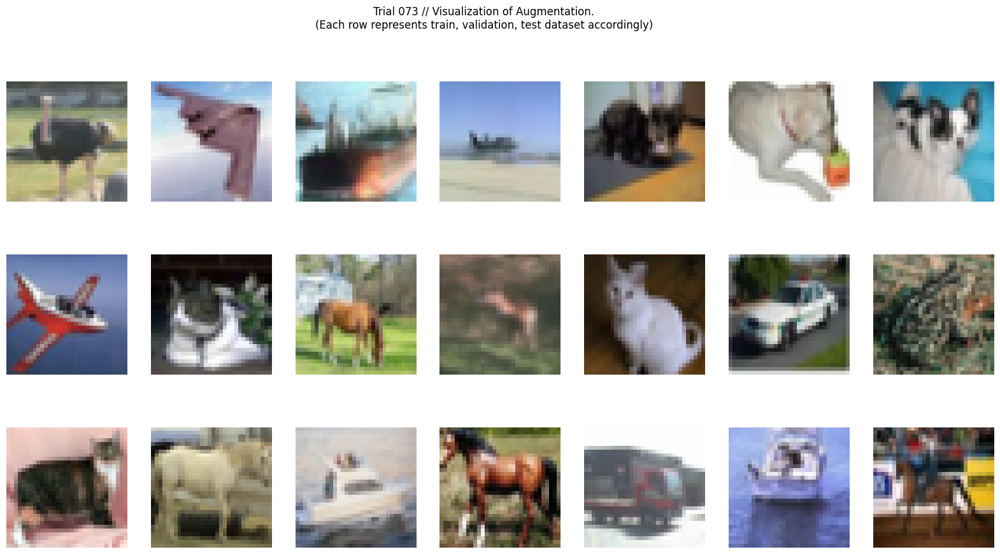

[RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |

Train: [001] Loss: 1.904, Acc: 29.35% F1(macro): 0.29: 100%|██████████| 156/156 [00:10<00:00, 14.89it/s]
 Val:       Loss: 1.595, Acc: 41.58% F1(macro): 0.39: 100%|██████████| 40/40 [00:01<00:00, 38.08it/s]


Model saved. Current best test f1: 0.392


Train: [002] Loss: 1.480, Acc: 45.62% F1(macro): 0.45: 100%|██████████| 156/156 [00:10<00:00, 14.81it/s]
 Val:       Loss: 1.447, Acc: 48.15% F1(macro): 0.48: 100%|██████████| 40/40 [00:01<00:00, 35.39it/s]


Model saved. Current best test f1: 0.476


Train: [003] Loss: 1.331, Acc: 51.42% F1(macro): 0.51: 100%|██████████| 156/156 [00:10<00:00, 14.42it/s]
 Val:       Loss: 1.295, Acc: 53.48% F1(macro): 0.53: 100%|██████████| 40/40 [00:01<00:00, 36.70it/s]


Model saved. Current best test f1: 0.531


Train: [004] Loss: 1.218, Acc: 56.21% F1(macro): 0.56: 100%|██████████| 156/156 [00:10<00:00, 14.75it/s]
 Val:       Loss: 1.216, Acc: 56.89% F1(macro): 0.57: 100%|██████████| 40/40 [00:01<00:00, 35.99it/s]


Model saved. Current best test f1: 0.566


Train: [005] Loss: 1.134, Acc: 59.09% F1(macro): 0.59: 100%|██████████| 156/156 [00:10<00:00, 14.88it/s]
 Val:       Loss: 1.178, Acc: 57.96% F1(macro): 0.58: 100%|██████████| 40/40 [00:01<00:00, 36.32it/s]


Model saved. Current best test f1: 0.581


Train: [006] Loss: 1.070, Acc: 61.82% F1(macro): 0.62: 100%|██████████| 156/156 [00:10<00:00, 14.57it/s]
 Val:       Loss: 1.101, Acc: 61.02% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 37.39it/s]


Model saved. Current best test f1: 0.607


Train: [007] Loss: 1.007, Acc: 63.95% F1(macro): 0.64: 100%|██████████| 156/156 [00:10<00:00, 14.77it/s]
 Val:       Loss: 1.077, Acc: 61.74% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 36.42it/s]


Model saved. Current best test f1: 0.616


Train: [008] Loss: 0.958, Acc: 65.68% F1(macro): 0.66: 100%|██████████| 156/156 [00:10<00:00, 14.52it/s]
 Val:       Loss: 1.057, Acc: 62.89% F1(macro): 0.63: 100%|██████████| 40/40 [00:01<00:00, 37.01it/s]


Model saved. Current best test f1: 0.627


Train: [009] Loss: 0.905, Acc: 67.96% F1(macro): 0.68: 100%|██████████| 156/156 [00:11<00:00, 14.04it/s]
 Val:       Loss: 1.035, Acc: 62.94% F1(macro): 0.63: 100%|██████████| 40/40 [00:01<00:00, 35.25it/s]


Model saved. Current best test f1: 0.630


Train: [010] Loss: 0.871, Acc: 69.26% F1(macro): 0.69: 100%|██████████| 156/156 [00:10<00:00, 15.17it/s]
 Val:       Loss: 1.063, Acc: 63.48% F1(macro): 0.64: 100%|██████████| 40/40 [00:01<00:00, 37.97it/s]


Model saved. Current best test f1: 0.637
TEST DATASET


 Val:       Loss: 1.060, Acc: 63.51% F1(macro): 0.64: 100%|██████████| 40/40 [00:01<00:00, 36.92it/s]
[I 2021-11-22 07:29:21,868] Trial 73 finished with value: 0.637385742399307 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 69 with value: 0.6497389456185138.


Files already downloaded and verified
Files already downloaded and verified


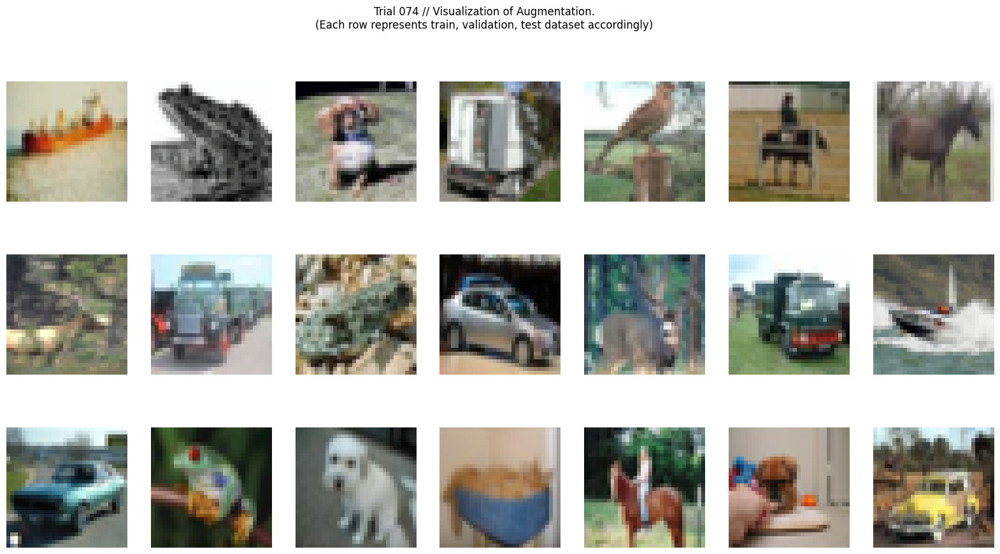

[RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |

Train: [001] Loss: 1.902, Acc: 29.25% F1(macro): 0.29: 100%|██████████| 156/156 [00:10<00:00, 14.83it/s]
 Val:       Loss: 1.637, Acc: 39.83% F1(macro): 0.38: 100%|██████████| 40/40 [00:01<00:00, 36.78it/s]


Model saved. Current best test f1: 0.379


Train: [002] Loss: 1.487, Acc: 45.41% F1(macro): 0.45: 100%|██████████| 156/156 [00:10<00:00, 14.80it/s]
 Val:       Loss: 1.429, Acc: 47.76% F1(macro): 0.48: 100%|██████████| 40/40 [00:01<00:00, 35.20it/s]


Model saved. Current best test f1: 0.477


Train: [003] Loss: 1.332, Acc: 51.73% F1(macro): 0.51: 100%|██████████| 156/156 [00:10<00:00, 14.87it/s]
 Val:       Loss: 1.308, Acc: 52.44% F1(macro): 0.52: 100%|██████████| 40/40 [00:01<00:00, 29.26it/s]


Model saved. Current best test f1: 0.522


Train: [004] Loss: 1.226, Acc: 55.79% F1(macro): 0.56: 100%|██████████| 156/156 [00:10<00:00, 14.85it/s]
 Val:       Loss: 1.258, Acc: 54.72% F1(macro): 0.55: 100%|██████████| 40/40 [00:01<00:00, 34.88it/s]


Model saved. Current best test f1: 0.547


Train: [005] Loss: 1.152, Acc: 58.43% F1(macro): 0.58: 100%|██████████| 156/156 [00:10<00:00, 15.04it/s]
 Val:       Loss: 1.192, Acc: 57.05% F1(macro): 0.57: 100%|██████████| 40/40 [00:01<00:00, 33.77it/s]


Model saved. Current best test f1: 0.566


Train: [006] Loss: 1.077, Acc: 61.41% F1(macro): 0.61: 100%|██████████| 156/156 [00:10<00:00, 15.05it/s]
 Val:       Loss: 1.162, Acc: 58.93% F1(macro): 0.59: 100%|██████████| 40/40 [00:01<00:00, 35.12it/s]


Model saved. Current best test f1: 0.587


Train: [007] Loss: 1.023, Acc: 63.85% F1(macro): 0.64: 100%|██████████| 156/156 [00:10<00:00, 14.63it/s]
 Val:       Loss: 1.136, Acc: 59.72% F1(macro): 0.60: 100%|██████████| 40/40 [00:01<00:00, 34.16it/s]


Model saved. Current best test f1: 0.595


Train: [008] Loss: 0.967, Acc: 65.80% F1(macro): 0.66: 100%|██████████| 156/156 [00:10<00:00, 15.48it/s]
 Val:       Loss: 1.084, Acc: 61.45% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 32.13it/s]


Model saved. Current best test f1: 0.613


Train: [009] Loss: 0.931, Acc: 67.08% F1(macro): 0.67: 100%|██████████| 156/156 [00:10<00:00, 14.36it/s]
 Val:       Loss: 1.054, Acc: 62.80% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 35.44it/s]


Model saved. Current best test f1: 0.625


Train: [010] Loss: 0.877, Acc: 68.94% F1(macro): 0.69: 100%|██████████| 156/156 [00:10<00:00, 14.72it/s]
 Val:       Loss: 1.039, Acc: 63.24% F1(macro): 0.63: 100%|██████████| 40/40 [00:01<00:00, 35.44it/s]


Model saved. Current best test f1: 0.631
TEST DATASET


 Val:       Loss: 1.012, Acc: 64.02% F1(macro): 0.64: 100%|██████████| 40/40 [00:01<00:00, 36.15it/s]
[I 2021-11-22 07:31:34,533] Trial 74 finished with value: 0.6384400976268081 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 69 with value: 0.6497389456185138.


Files already downloaded and verified
Files already downloaded and verified


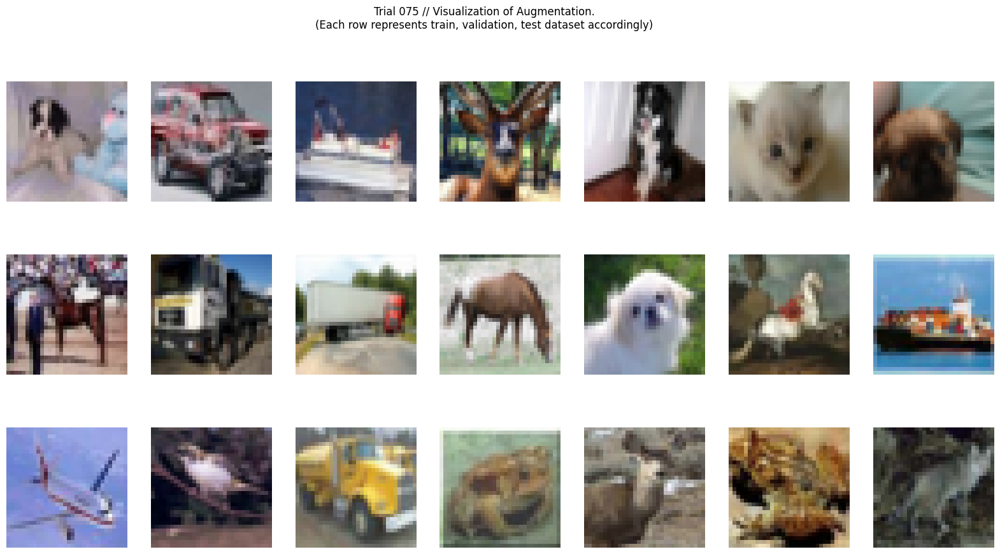

[RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |

Train: [001] Loss: 1.929, Acc: 28.29% F1(macro): 0.28: 100%|██████████| 156/156 [00:10<00:00, 14.49it/s]
 Val:       Loss: 1.682, Acc: 40.33% F1(macro): 0.40: 100%|██████████| 40/40 [00:01<00:00, 30.92it/s]


Model saved. Current best test f1: 0.397


Train: [002] Loss: 1.527, Acc: 44.00% F1(macro): 0.44: 100%|██████████| 156/156 [00:10<00:00, 14.91it/s]
 Val:       Loss: 1.484, Acc: 46.39% F1(macro): 0.46: 100%|██████████| 40/40 [00:01<00:00, 33.11it/s]


Model saved. Current best test f1: 0.458


Train: [003] Loss: 1.377, Acc: 49.49% F1(macro): 0.49: 100%|██████████| 156/156 [00:10<00:00, 14.51it/s]
 Val:       Loss: 1.381, Acc: 49.88% F1(macro): 0.48: 100%|██████████| 40/40 [00:01<00:00, 36.88it/s]


Model saved. Current best test f1: 0.484


Train: [004] Loss: 1.286, Acc: 53.29% F1(macro): 0.53: 100%|██████████| 156/156 [00:10<00:00, 14.37it/s]
 Val:       Loss: 1.330, Acc: 52.10% F1(macro): 0.52: 100%|██████████| 40/40 [00:01<00:00, 35.81it/s]


Model saved. Current best test f1: 0.518


Train: [005] Loss: 1.198, Acc: 56.73% F1(macro): 0.57: 100%|██████████| 156/156 [00:10<00:00, 14.83it/s]
 Val:       Loss: 1.258, Acc: 54.71% F1(macro): 0.54: 100%|██████████| 40/40 [00:01<00:00, 35.00it/s]


Model saved. Current best test f1: 0.545


Train: [006] Loss: 1.137, Acc: 58.89% F1(macro): 0.59: 100%|██████████| 156/156 [00:10<00:00, 14.69it/s]
 Val:       Loss: 1.234, Acc: 55.14% F1(macro): 0.55: 100%|██████████| 40/40 [00:01<00:00, 32.15it/s]


Model saved. Current best test f1: 0.548


Train: [007] Loss: 1.077, Acc: 61.31% F1(macro): 0.61: 100%|██████████| 156/156 [00:10<00:00, 14.19it/s]
 Val:       Loss: 1.179, Acc: 58.13% F1(macro): 0.57: 100%|██████████| 40/40 [00:01<00:00, 36.63it/s]


Model saved. Current best test f1: 0.574


Train: [008] Loss: 1.021, Acc: 63.35% F1(macro): 0.63: 100%|██████████| 156/156 [00:10<00:00, 14.67it/s]
 Val:       Loss: 1.140, Acc: 58.75% F1(macro): 0.59: 100%|██████████| 40/40 [00:01<00:00, 34.84it/s]


Model saved. Current best test f1: 0.587


Train: [009] Loss: 0.975, Acc: 65.07% F1(macro): 0.65: 100%|██████████| 156/156 [00:10<00:00, 15.04it/s]
 Val:       Loss: 1.104, Acc: 60.53% F1(macro): 0.60: 100%|██████████| 40/40 [00:01<00:00, 36.60it/s]


Model saved. Current best test f1: 0.604


Train: [010] Loss: 0.920, Acc: 67.29% F1(macro): 0.67: 100%|██████████| 156/156 [00:10<00:00, 14.96it/s]
 Val:       Loss: 1.091, Acc: 61.05% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 36.19it/s]


Model saved. Current best test f1: 0.613
TEST DATASET


 Val:       Loss: 1.086, Acc: 61.72% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 35.82it/s]
[I 2021-11-22 07:33:48,149] Trial 75 finished with value: 0.6179614097062286 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 69 with value: 0.6497389456185138.


Files already downloaded and verified
Files already downloaded and verified


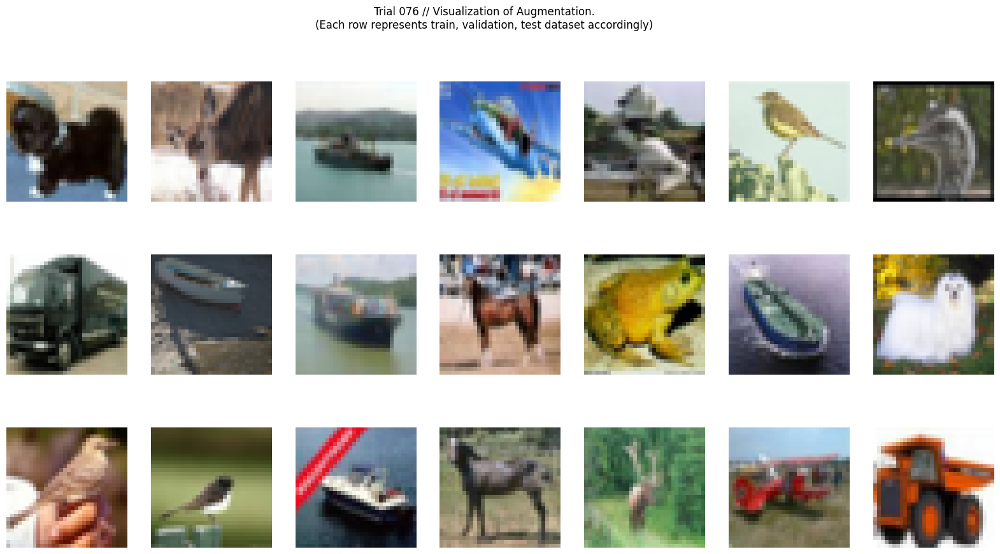

[RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |

Train: [001] Loss: 1.927, Acc: 28.85% F1(macro): 0.28: 100%|██████████| 156/156 [00:11<00:00, 14.13it/s]
 Val:       Loss: 1.609, Acc: 41.20% F1(macro): 0.40: 100%|██████████| 40/40 [00:01<00:00, 31.08it/s]


Model saved. Current best test f1: 0.401


Train: [002] Loss: 1.505, Acc: 45.22% F1(macro): 0.45: 100%|██████████| 156/156 [00:10<00:00, 14.49it/s]
 Val:       Loss: 1.448, Acc: 47.45% F1(macro): 0.46: 100%|██████████| 40/40 [00:01<00:00, 33.07it/s]


Model saved. Current best test f1: 0.455


Train: [003] Loss: 1.349, Acc: 51.35% F1(macro): 0.51: 100%|██████████| 156/156 [00:10<00:00, 14.68it/s]
 Val:       Loss: 1.345, Acc: 50.99% F1(macro): 0.50: 100%|██████████| 40/40 [00:01<00:00, 35.09it/s]


Model saved. Current best test f1: 0.504


Train: [004] Loss: 1.245, Acc: 55.07% F1(macro): 0.55: 100%|██████████| 156/156 [00:10<00:00, 14.70it/s]
 Val:       Loss: 1.287, Acc: 53.75% F1(macro): 0.54: 100%|██████████| 40/40 [00:01<00:00, 33.98it/s]


Model saved. Current best test f1: 0.537


Train: [005] Loss: 1.167, Acc: 58.06% F1(macro): 0.58: 100%|██████████| 156/156 [00:10<00:00, 14.65it/s]
 Val:       Loss: 1.196, Acc: 57.12% F1(macro): 0.57: 100%|██████████| 40/40 [00:01<00:00, 36.17it/s]


Model saved. Current best test f1: 0.573


Train: [006] Loss: 1.085, Acc: 61.35% F1(macro): 0.61: 100%|██████████| 156/156 [00:11<00:00, 14.09it/s]
 Val:       Loss: 1.170, Acc: 58.09% F1(macro): 0.58: 100%|██████████| 40/40 [00:01<00:00, 36.19it/s]


Model saved. Current best test f1: 0.582


Train: [007] Loss: 1.032, Acc: 63.43% F1(macro): 0.63: 100%|██████████| 156/156 [00:10<00:00, 14.40it/s]
 Val:       Loss: 1.157, Acc: 58.89% F1(macro): 0.59: 100%|██████████| 40/40 [00:01<00:00, 36.93it/s]


Model saved. Current best test f1: 0.588


Train: [008] Loss: 0.986, Acc: 64.74% F1(macro): 0.65: 100%|██████████| 156/156 [00:10<00:00, 14.41it/s]
 Val:       Loss: 1.113, Acc: 60.96% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 37.09it/s]


Model saved. Current best test f1: 0.609


Train: [009] Loss: 0.932, Acc: 67.01% F1(macro): 0.67: 100%|██████████| 156/156 [00:10<00:00, 14.60it/s]
 Val:       Loss: 1.079, Acc: 61.68% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 36.56it/s]


Model saved. Current best test f1: 0.610


Train: [010] Loss: 0.895, Acc: 68.28% F1(macro): 0.68: 100%|██████████| 156/156 [00:10<00:00, 14.73it/s]
 Val:       Loss: 1.058, Acc: 62.49% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 36.11it/s]


Model saved. Current best test f1: 0.625
TEST DATASET


 Val:       Loss: 1.050, Acc: 62.73% F1(macro): 0.63: 100%|██████████| 40/40 [00:01<00:00, 38.67it/s]
[I 2021-11-22 07:36:02,893] Trial 76 finished with value: 0.6266272749381343 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 69 with value: 0.6497389456185138.


Files already downloaded and verified
Files already downloaded and verified


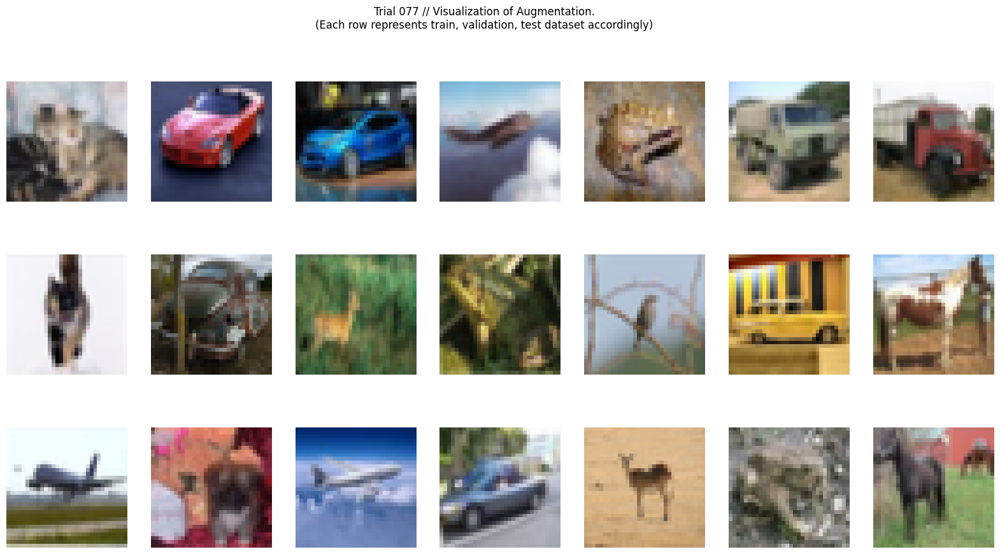

[RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |

Train: [001] Loss: 1.903, Acc: 29.62% F1(macro): 0.29: 100%|██████████| 156/156 [00:10<00:00, 15.07it/s]
 Val:       Loss: 1.588, Acc: 41.06% F1(macro): 0.40: 100%|██████████| 40/40 [00:01<00:00, 36.47it/s]


Model saved. Current best test f1: 0.396


Train: [002] Loss: 1.487, Acc: 45.56% F1(macro): 0.45: 100%|██████████| 156/156 [00:10<00:00, 14.85it/s]
 Val:       Loss: 1.407, Acc: 47.86% F1(macro): 0.47: 100%|██████████| 40/40 [00:01<00:00, 36.53it/s]


Model saved. Current best test f1: 0.472


Train: [003] Loss: 1.346, Acc: 51.03% F1(macro): 0.51: 100%|██████████| 156/156 [00:11<00:00, 14.14it/s]
 Val:       Loss: 1.302, Acc: 53.19% F1(macro): 0.53: 100%|██████████| 40/40 [00:01<00:00, 36.57it/s]


Model saved. Current best test f1: 0.527


Train: [004] Loss: 1.243, Acc: 55.21% F1(macro): 0.55: 100%|██████████| 156/156 [00:10<00:00, 14.39it/s]
 Val:       Loss: 1.254, Acc: 53.94% F1(macro): 0.54: 100%|██████████| 40/40 [00:01<00:00, 35.56it/s]


Model saved. Current best test f1: 0.540


Train: [005] Loss: 1.164, Acc: 58.21% F1(macro): 0.58: 100%|██████████| 156/156 [00:10<00:00, 14.42it/s]
 Val:       Loss: 1.192, Acc: 56.48% F1(macro): 0.56: 100%|██████████| 40/40 [00:01<00:00, 37.15it/s]


Model saved. Current best test f1: 0.562


Train: [006] Loss: 1.110, Acc: 60.42% F1(macro): 0.60: 100%|██████████| 156/156 [00:10<00:00, 14.24it/s]
 Val:       Loss: 1.144, Acc: 58.67% F1(macro): 0.59: 100%|██████████| 40/40 [00:01<00:00, 36.68it/s]


Model saved. Current best test f1: 0.586


Train: [007] Loss: 1.058, Acc: 62.57% F1(macro): 0.62: 100%|██████████| 156/156 [00:10<00:00, 14.55it/s]
 Val:       Loss: 1.128, Acc: 59.74% F1(macro): 0.60: 100%|██████████| 40/40 [00:01<00:00, 36.96it/s]


Model saved. Current best test f1: 0.595


Train: [008] Loss: 1.002, Acc: 64.74% F1(macro): 0.65: 100%|██████████| 156/156 [00:10<00:00, 14.42it/s]
 Val:       Loss: 1.110, Acc: 60.68% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 34.75it/s]


Model saved. Current best test f1: 0.605


Train: [009] Loss: 0.951, Acc: 66.32% F1(macro): 0.66: 100%|██████████| 156/156 [00:10<00:00, 14.81it/s]
 Val:       Loss: 1.053, Acc: 62.09% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 35.47it/s]


Model saved. Current best test f1: 0.619


Train: [010] Loss: 0.913, Acc: 67.80% F1(macro): 0.68: 100%|██████████| 156/156 [00:10<00:00, 14.32it/s]
 Val:       Loss: 1.022, Acc: 63.90% F1(macro): 0.64: 100%|██████████| 40/40 [00:01<00:00, 36.71it/s]


Model saved. Current best test f1: 0.640
TEST DATASET


 Val:       Loss: 1.039, Acc: 63.08% F1(macro): 0.63: 100%|██████████| 40/40 [00:01<00:00, 36.57it/s]
[I 2021-11-22 07:38:17,309] Trial 77 finished with value: 0.6307317827163107 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 69 with value: 0.6497389456185138.


Files already downloaded and verified
Files already downloaded and verified


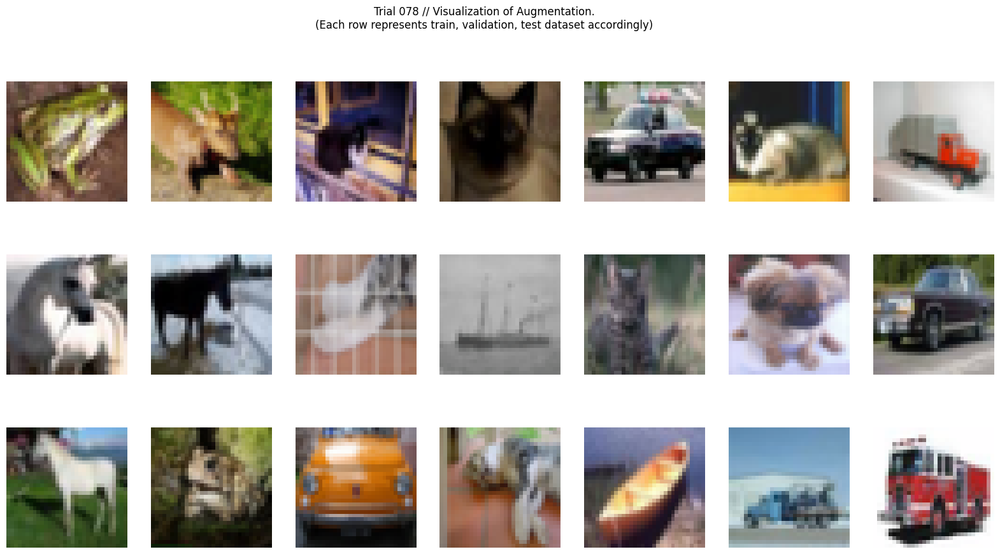

[RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |

Train: [001] Loss: 1.888, Acc: 29.89% F1(macro): 0.30: 100%|██████████| 156/156 [00:10<00:00, 14.54it/s]
 Val:       Loss: 1.633, Acc: 40.68% F1(macro): 0.39: 100%|██████████| 40/40 [00:01<00:00, 34.61it/s]


Model saved. Current best test f1: 0.393


Train: [002] Loss: 1.498, Acc: 45.18% F1(macro): 0.45: 100%|██████████| 156/156 [00:10<00:00, 14.90it/s]
 Val:       Loss: 1.457, Acc: 47.53% F1(macro): 0.47: 100%|██████████| 40/40 [00:01<00:00, 29.35it/s]


Model saved. Current best test f1: 0.473


Train: [003] Loss: 1.346, Acc: 50.96% F1(macro): 0.51: 100%|██████████| 156/156 [00:10<00:00, 14.44it/s]
 Val:       Loss: 1.356, Acc: 51.56% F1(macro): 0.51: 100%|██████████| 40/40 [00:01<00:00, 32.83it/s]


Model saved. Current best test f1: 0.507


Train: [004] Loss: 1.242, Acc: 55.45% F1(macro): 0.55: 100%|██████████| 156/156 [00:10<00:00, 14.34it/s]
 Val:       Loss: 1.308, Acc: 53.80% F1(macro): 0.54: 100%|██████████| 40/40 [00:01<00:00, 32.99it/s]


Model saved. Current best test f1: 0.537


Train: [005] Loss: 1.157, Acc: 58.34% F1(macro): 0.58: 100%|██████████| 156/156 [00:10<00:00, 14.78it/s]
 Val:       Loss: 1.217, Acc: 56.54% F1(macro): 0.56: 100%|██████████| 40/40 [00:01<00:00, 34.69it/s]


Model saved. Current best test f1: 0.561


Train: [006] Loss: 1.086, Acc: 61.21% F1(macro): 0.61: 100%|██████████| 156/156 [00:10<00:00, 14.57it/s]
 Val:       Loss: 1.170, Acc: 58.70% F1(macro): 0.59: 100%|██████████| 40/40 [00:01<00:00, 31.65it/s]


Model saved. Current best test f1: 0.585


Train: [007] Loss: 1.023, Acc: 63.51% F1(macro): 0.63: 100%|██████████| 156/156 [00:10<00:00, 14.55it/s]
 Val:       Loss: 1.140, Acc: 60.09% F1(macro): 0.60: 100%|██████████| 40/40 [00:01<00:00, 37.45it/s]


Model saved. Current best test f1: 0.601


Train: [008] Loss: 0.983, Acc: 64.94% F1(macro): 0.65: 100%|██████████| 156/156 [00:10<00:00, 14.61it/s]
 Val:       Loss: 1.107, Acc: 60.72% F1(macro): 0.60: 100%|██████████| 40/40 [00:01<00:00, 35.18it/s]


Model saved. Current best test f1: 0.603


Train: [009] Loss: 0.939, Acc: 66.49% F1(macro): 0.66: 100%|██████████| 156/156 [00:10<00:00, 14.48it/s]
 Val:       Loss: 1.070, Acc: 62.19% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 37.96it/s]


Model saved. Current best test f1: 0.617


Train: [010] Loss: 0.888, Acc: 68.43% F1(macro): 0.68: 100%|██████████| 156/156 [00:10<00:00, 14.93it/s]
 Val:       Loss: 1.090, Acc: 62.04% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 34.42it/s]


Model saved. Current best test f1: 0.620
TEST DATASET


 Val:       Loss: 1.075, Acc: 61.96% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 36.50it/s]
[I 2021-11-22 07:40:31,708] Trial 78 finished with value: 0.6186387919718971 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 69 with value: 0.6497389456185138.


Files already downloaded and verified
Files already downloaded and verified


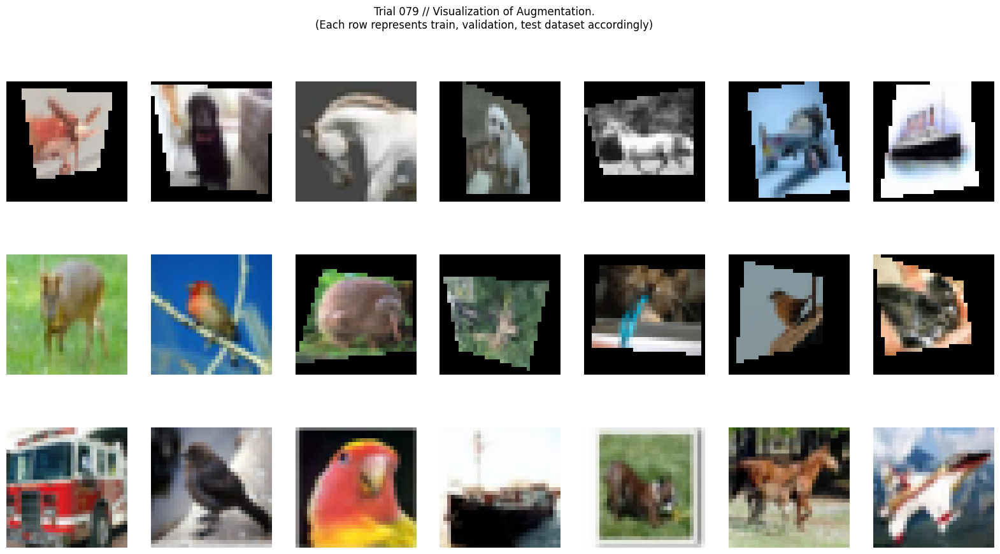

[RandomPerspective(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |   

Train: [001] Loss: 2.036, Acc: 24.40% F1(macro): 0.24: 100%|██████████| 156/156 [00:10<00:00, 14.66it/s]
 Val:       Loss: 1.763, Acc: 35.10% F1(macro): 0.33: 100%|██████████| 40/40 [00:01<00:00, 24.60it/s]


Model saved. Current best test f1: 0.328


Train: [002] Loss: 1.660, Acc: 38.20% F1(macro): 0.38: 100%|██████████| 156/156 [00:10<00:00, 15.07it/s]
 Val:       Loss: 1.604, Acc: 41.10% F1(macro): 0.40: 100%|██████████| 40/40 [00:01<00:00, 23.45it/s]


Model saved. Current best test f1: 0.400


Train: [003] Loss: 1.536, Acc: 43.94% F1(macro): 0.43: 100%|██████████| 156/156 [00:10<00:00, 14.42it/s]
 Val:       Loss: 1.477, Acc: 46.29% F1(macro): 0.46: 100%|██████████| 40/40 [00:01<00:00, 25.30it/s]


Model saved. Current best test f1: 0.460


Train: [004] Loss: 1.449, Acc: 47.39% F1(macro): 0.47: 100%|██████████| 156/156 [00:10<00:00, 14.70it/s]
 Val:       Loss: 1.417, Acc: 48.69% F1(macro): 0.49: 100%|██████████| 40/40 [00:01<00:00, 25.41it/s]


Model saved. Current best test f1: 0.485


Train: [005] Loss: 1.387, Acc: 49.43% F1(macro): 0.49: 100%|██████████| 156/156 [00:10<00:00, 14.97it/s]
 Val:       Loss: 1.382, Acc: 50.09% F1(macro): 0.50: 100%|██████████| 40/40 [00:01<00:00, 25.14it/s]


Model saved. Current best test f1: 0.496


Train: [006] Loss: 1.332, Acc: 51.87% F1(macro): 0.52: 100%|██████████| 156/156 [00:09<00:00, 15.69it/s]
 Val:       Loss: 1.368, Acc: 50.23% F1(macro): 0.50: 100%|██████████| 40/40 [00:01<00:00, 25.71it/s]


Model saved. Current best test f1: 0.501


Train: [007] Loss: 1.284, Acc: 53.70% F1(macro): 0.53: 100%|██████████| 156/156 [00:10<00:00, 14.90it/s]
 Val:       Loss: 1.365, Acc: 52.60% F1(macro): 0.52: 100%|██████████| 40/40 [00:01<00:00, 25.55it/s]


Model saved. Current best test f1: 0.522


Train: [008] Loss: 1.259, Acc: 54.80% F1(macro): 0.54: 100%|██████████| 156/156 [00:10<00:00, 14.93it/s]
 Val:       Loss: 1.301, Acc: 52.73% F1(macro): 0.52: 100%|██████████| 40/40 [00:01<00:00, 25.10it/s]


Model saved. Current best test f1: 0.525


Train: [009] Loss: 1.207, Acc: 56.62% F1(macro): 0.56: 100%|██████████| 156/156 [00:10<00:00, 14.94it/s]
 Val:       Loss: 1.284, Acc: 54.03% F1(macro): 0.54: 100%|██████████| 40/40 [00:01<00:00, 23.65it/s]


Model saved. Current best test f1: 0.536


Train: [010] Loss: 1.186, Acc: 57.77% F1(macro): 0.58: 100%|██████████| 156/156 [00:10<00:00, 14.60it/s]
 Val:       Loss: 1.234, Acc: 55.76% F1(macro): 0.55: 100%|██████████| 40/40 [00:01<00:00, 25.77it/s]


Model saved. Current best test f1: 0.553
TEST DATASET


 Val:       Loss: 1.148, Acc: 59.43% F1(macro): 0.59: 100%|██████████| 40/40 [00:01<00:00, 36.80it/s]
[I 2021-11-22 07:42:48,661] Trial 79 finished with value: 0.5878022185556444 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': True, 'aug_random_flip': False}. Best is trial 69 with value: 0.6497389456185138.


Files already downloaded and verified
Files already downloaded and verified


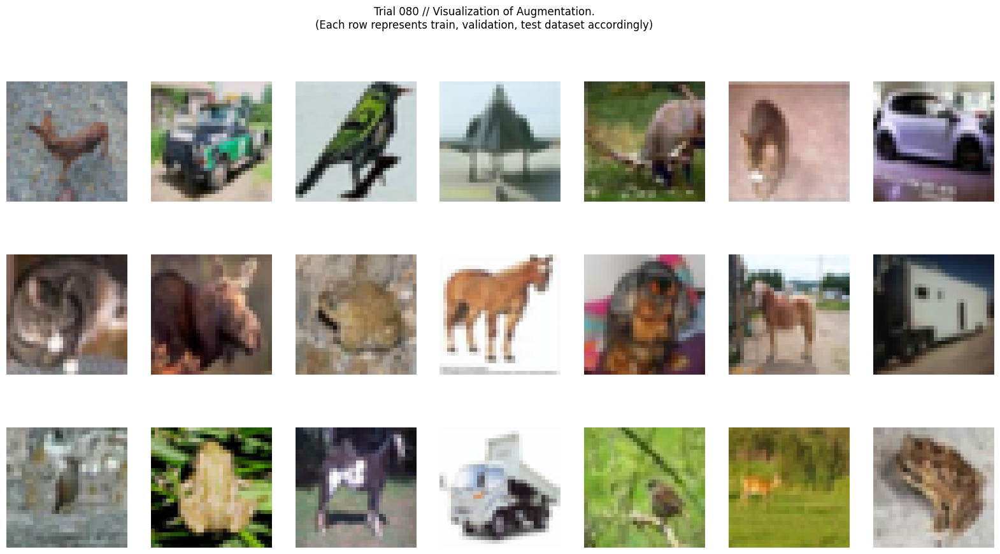

[RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |

Train: [001] Loss: 1.917, Acc: 28.32% F1(macro): 0.28: 100%|██████████| 156/156 [00:10<00:00, 14.82it/s]
 Val:       Loss: 1.634, Acc: 39.35% F1(macro): 0.39: 100%|██████████| 40/40 [00:01<00:00, 35.59it/s]


Model saved. Current best test f1: 0.387


Train: [002] Loss: 1.523, Acc: 43.93% F1(macro): 0.43: 100%|██████████| 156/156 [00:10<00:00, 15.00it/s]
 Val:       Loss: 1.432, Acc: 47.30% F1(macro): 0.46: 100%|██████████| 40/40 [00:01<00:00, 34.78it/s]


Model saved. Current best test f1: 0.463


Train: [003] Loss: 1.363, Acc: 50.31% F1(macro): 0.50: 100%|██████████| 156/156 [00:10<00:00, 14.44it/s]
 Val:       Loss: 1.352, Acc: 50.35% F1(macro): 0.50: 100%|██████████| 40/40 [00:01<00:00, 34.78it/s]


Model saved. Current best test f1: 0.499


Train: [004] Loss: 1.264, Acc: 54.27% F1(macro): 0.54: 100%|██████████| 156/156 [00:10<00:00, 14.75it/s]
 Val:       Loss: 1.254, Acc: 54.94% F1(macro): 0.55: 100%|██████████| 40/40 [00:01<00:00, 33.80it/s]


Model saved. Current best test f1: 0.550


Train: [005] Loss: 1.180, Acc: 57.56% F1(macro): 0.57: 100%|██████████| 156/156 [00:10<00:00, 14.70it/s]
 Val:       Loss: 1.210, Acc: 56.29% F1(macro): 0.56: 100%|██████████| 40/40 [00:01<00:00, 32.77it/s]


Model saved. Current best test f1: 0.560


Train: [006] Loss: 1.102, Acc: 60.65% F1(macro): 0.60: 100%|██████████| 156/156 [00:10<00:00, 14.65it/s]
 Val:       Loss: 1.150, Acc: 58.65% F1(macro): 0.59: 100%|██████████| 40/40 [00:01<00:00, 32.54it/s]


Model saved. Current best test f1: 0.586


Train: [007] Loss: 1.052, Acc: 62.23% F1(macro): 0.62: 100%|██████████| 156/156 [00:10<00:00, 15.14it/s]
 Val:       Loss: 1.136, Acc: 60.01% F1(macro): 0.60: 100%|██████████| 40/40 [00:01<00:00, 35.95it/s]


Model saved. Current best test f1: 0.600


Train: [008] Loss: 0.999, Acc: 64.38% F1(macro): 0.64: 100%|██████████| 156/156 [00:10<00:00, 14.90it/s]
 Val:       Loss: 1.080, Acc: 61.66% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 35.18it/s]


Model saved. Current best test f1: 0.613


Train: [009] Loss: 0.953, Acc: 66.11% F1(macro): 0.66: 100%|██████████| 156/156 [00:10<00:00, 14.49it/s]
 Val:       Loss: 1.092, Acc: 62.02% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 33.05it/s]


Model saved. Current best test f1: 0.616


Train: [010] Loss: 0.923, Acc: 67.49% F1(macro): 0.67: 100%|██████████| 156/156 [00:10<00:00, 15.05it/s]
 Val:       Loss: 1.079, Acc: 62.21% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 30.99it/s]


Model saved. Current best test f1: 0.617
TEST DATASET


 Val:       Loss: 1.088, Acc: 61.92% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 35.02it/s]
[I 2021-11-22 07:45:01,642] Trial 80 finished with value: 0.6131842142084404 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 69 with value: 0.6497389456185138.


Files already downloaded and verified
Files already downloaded and verified


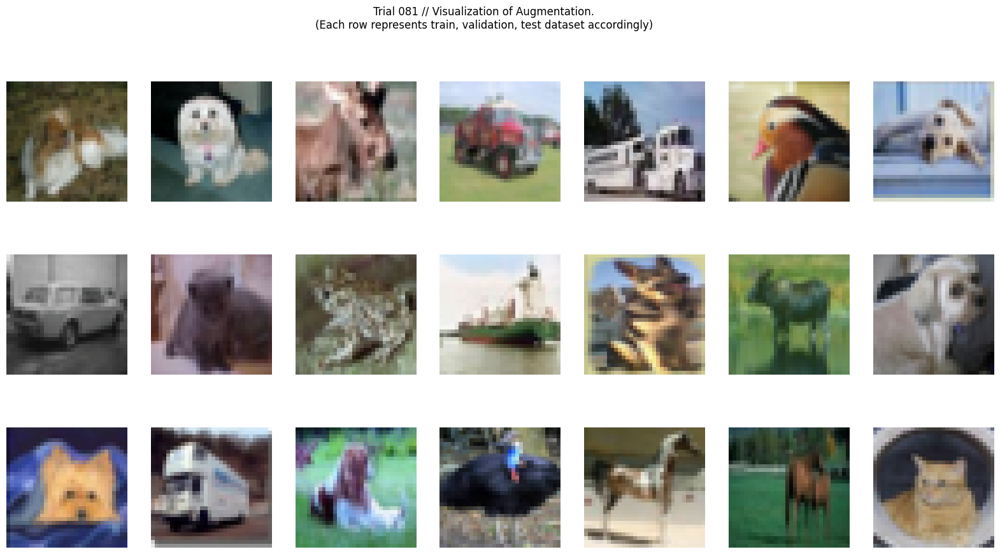

[RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |

Train: [001] Loss: 1.893, Acc: 29.14% F1(macro): 0.29: 100%|██████████| 156/156 [00:10<00:00, 15.15it/s]
 Val:       Loss: 1.628, Acc: 39.97% F1(macro): 0.39: 100%|██████████| 40/40 [00:01<00:00, 33.19it/s]


Model saved. Current best test f1: 0.387


Train: [002] Loss: 1.507, Acc: 44.72% F1(macro): 0.44: 100%|██████████| 156/156 [00:10<00:00, 15.01it/s]
 Val:       Loss: 1.451, Acc: 48.07% F1(macro): 0.47: 100%|██████████| 40/40 [00:01<00:00, 36.48it/s]


Model saved. Current best test f1: 0.467


Train: [003] Loss: 1.371, Acc: 50.28% F1(macro): 0.50: 100%|██████████| 156/156 [00:10<00:00, 15.35it/s]
 Val:       Loss: 1.364, Acc: 51.25% F1(macro): 0.51: 100%|██████████| 40/40 [00:01<00:00, 31.82it/s]


Model saved. Current best test f1: 0.510


Train: [004] Loss: 1.266, Acc: 54.21% F1(macro): 0.54: 100%|██████████| 156/156 [00:10<00:00, 14.59it/s]
 Val:       Loss: 1.295, Acc: 53.31% F1(macro): 0.53: 100%|██████████| 40/40 [00:01<00:00, 32.60it/s]


Model saved. Current best test f1: 0.532


Train: [005] Loss: 1.184, Acc: 57.48% F1(macro): 0.57: 100%|██████████| 156/156 [00:10<00:00, 14.72it/s]
 Val:       Loss: 1.236, Acc: 56.49% F1(macro): 0.56: 100%|██████████| 40/40 [00:01<00:00, 34.37it/s]


Model saved. Current best test f1: 0.559


Train: [006] Loss: 1.113, Acc: 60.15% F1(macro): 0.60: 100%|██████████| 156/156 [00:10<00:00, 14.76it/s]
 Val:       Loss: 1.164, Acc: 58.30% F1(macro): 0.57: 100%|██████████| 40/40 [00:01<00:00, 32.42it/s]


Model saved. Current best test f1: 0.573


Train: [007] Loss: 1.053, Acc: 62.41% F1(macro): 0.62: 100%|██████████| 156/156 [00:10<00:00, 14.60it/s]
 Val:       Loss: 1.112, Acc: 60.47% F1(macro): 0.60: 100%|██████████| 40/40 [00:01<00:00, 35.11it/s]


Model saved. Current best test f1: 0.601


Train: [008] Loss: 1.001, Acc: 64.54% F1(macro): 0.64: 100%|██████████| 156/156 [00:10<00:00, 14.42it/s]
 Val:       Loss: 1.104, Acc: 61.28% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 35.86it/s]


Model saved. Current best test f1: 0.614


Train: [009] Loss: 0.954, Acc: 66.01% F1(macro): 0.66: 100%|██████████| 156/156 [00:10<00:00, 14.46it/s]
 Val:       Loss: 1.106, Acc: 60.90% F1(macro): 0.60: 100%|██████████| 40/40 [00:01<00:00, 35.76it/s]
Train: [010] Loss: 0.915, Acc: 67.28% F1(macro): 0.67: 100%|██████████| 156/156 [00:10<00:00, 15.54it/s]
 Val:       Loss: 1.031, Acc: 63.72% F1(macro): 0.63: 100%|██████████| 40/40 [00:01<00:00, 37.74it/s]


Model saved. Current best test f1: 0.633
TEST DATASET


 Val:       Loss: 1.034, Acc: 63.69% F1(macro): 0.63: 100%|██████████| 40/40 [00:01<00:00, 36.10it/s]
[I 2021-11-22 07:47:13,241] Trial 81 finished with value: 0.6327875516618636 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 69 with value: 0.6497389456185138.


Files already downloaded and verified
Files already downloaded and verified


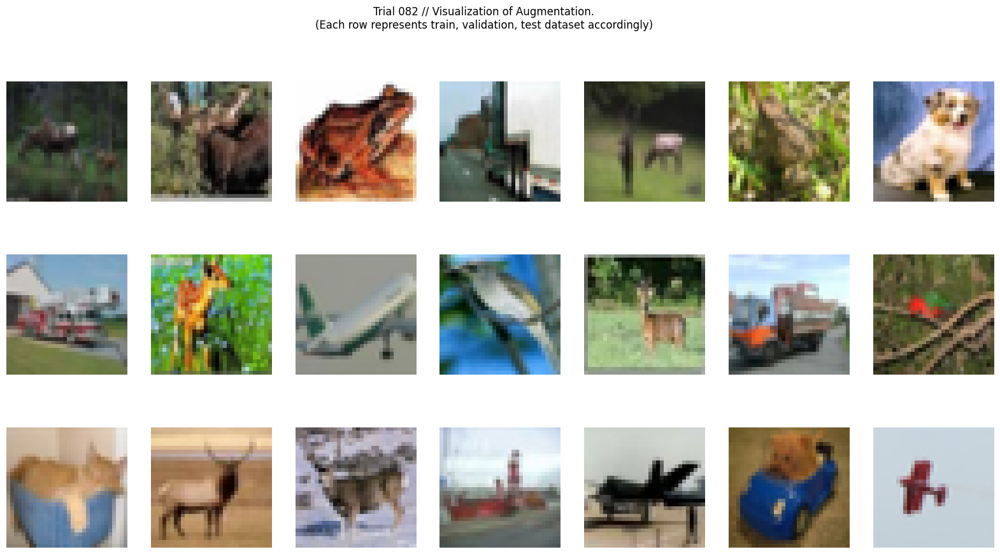

[RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |

Train: [001] Loss: 1.922, Acc: 28.93% F1(macro): 0.28: 100%|██████████| 156/156 [00:11<00:00, 14.02it/s]
 Val:       Loss: 1.689, Acc: 39.70% F1(macro): 0.38: 100%|██████████| 40/40 [00:01<00:00, 35.40it/s]


Model saved. Current best test f1: 0.378


Train: [002] Loss: 1.478, Acc: 45.84% F1(macro): 0.45: 100%|██████████| 156/156 [00:10<00:00, 15.17it/s]
 Val:       Loss: 1.436, Acc: 47.71% F1(macro): 0.47: 100%|██████████| 40/40 [00:01<00:00, 36.00it/s]


Model saved. Current best test f1: 0.474


Train: [003] Loss: 1.339, Acc: 51.32% F1(macro): 0.51: 100%|██████████| 156/156 [00:10<00:00, 14.85it/s]
 Val:       Loss: 1.363, Acc: 49.67% F1(macro): 0.49: 100%|██████████| 40/40 [00:01<00:00, 35.11it/s]


Model saved. Current best test f1: 0.489


Train: [004] Loss: 1.247, Acc: 54.85% F1(macro): 0.55: 100%|██████████| 156/156 [00:10<00:00, 14.92it/s]
 Val:       Loss: 1.290, Acc: 53.19% F1(macro): 0.52: 100%|██████████| 40/40 [00:01<00:00, 35.36it/s]


Model saved. Current best test f1: 0.523


Train: [005] Loss: 1.174, Acc: 57.58% F1(macro): 0.57: 100%|██████████| 156/156 [00:10<00:00, 14.88it/s]
 Val:       Loss: 1.242, Acc: 54.89% F1(macro): 0.55: 100%|██████████| 40/40 [00:01<00:00, 34.92it/s]


Model saved. Current best test f1: 0.549


Train: [006] Loss: 1.110, Acc: 60.20% F1(macro): 0.60: 100%|██████████| 156/156 [00:10<00:00, 14.42it/s]
 Val:       Loss: 1.207, Acc: 56.60% F1(macro): 0.57: 100%|██████████| 40/40 [00:01<00:00, 34.29it/s]


Model saved. Current best test f1: 0.567


Train: [007] Loss: 1.050, Acc: 62.39% F1(macro): 0.62: 100%|██████████| 156/156 [00:10<00:00, 14.32it/s]
 Val:       Loss: 1.163, Acc: 58.29% F1(macro): 0.58: 100%|██████████| 40/40 [00:01<00:00, 35.75it/s]


Model saved. Current best test f1: 0.582


Train: [008] Loss: 1.002, Acc: 64.04% F1(macro): 0.64: 100%|██████████| 156/156 [00:10<00:00, 14.57it/s]
 Val:       Loss: 1.105, Acc: 60.30% F1(macro): 0.60: 100%|██████████| 40/40 [00:01<00:00, 35.06it/s]


Model saved. Current best test f1: 0.603


Train: [009] Loss: 0.961, Acc: 65.75% F1(macro): 0.66: 100%|██████████| 156/156 [00:10<00:00, 14.54it/s]
 Val:       Loss: 1.118, Acc: 60.13% F1(macro): 0.60: 100%|██████████| 40/40 [00:01<00:00, 31.41it/s]


Model saved. Current best test f1: 0.604


Train: [010] Loss: 0.927, Acc: 67.12% F1(macro): 0.67: 100%|██████████| 156/156 [00:10<00:00, 14.94it/s]
 Val:       Loss: 1.079, Acc: 61.40% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 31.39it/s]


Model saved. Current best test f1: 0.615
TEST DATASET


 Val:       Loss: 1.089, Acc: 61.47% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 37.44it/s]
[I 2021-11-22 07:49:26,998] Trial 82 finished with value: 0.6134079918883784 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 69 with value: 0.6497389456185138.


Files already downloaded and verified
Files already downloaded and verified


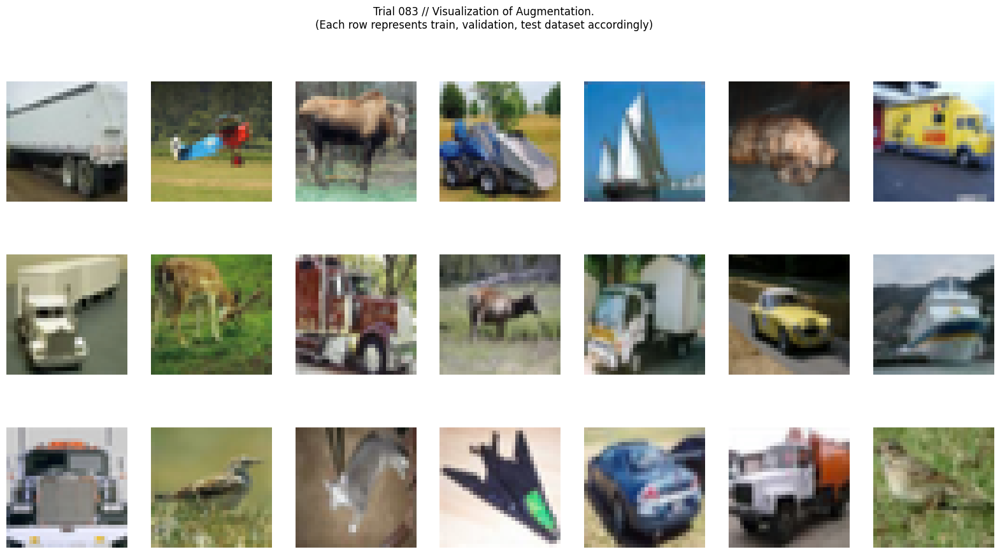

[RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |

Train: [001] Loss: 1.912, Acc: 28.75% F1(macro): 0.28: 100%|██████████| 156/156 [00:10<00:00, 15.12it/s]
 Val:       Loss: 1.604, Acc: 41.27% F1(macro): 0.40: 100%|██████████| 40/40 [00:01<00:00, 35.17it/s]


Model saved. Current best test f1: 0.404


Train: [002] Loss: 1.491, Acc: 45.45% F1(macro): 0.45: 100%|██████████| 156/156 [00:10<00:00, 14.52it/s]
 Val:       Loss: 1.453, Acc: 46.71% F1(macro): 0.47: 100%|██████████| 40/40 [00:01<00:00, 34.80it/s]


Model saved. Current best test f1: 0.465


Train: [003] Loss: 1.350, Acc: 50.97% F1(macro): 0.51: 100%|██████████| 156/156 [00:10<00:00, 15.07it/s]
 Val:       Loss: 1.320, Acc: 51.93% F1(macro): 0.52: 100%|██████████| 40/40 [00:01<00:00, 35.20it/s]


Model saved. Current best test f1: 0.519


Train: [004] Loss: 1.249, Acc: 55.28% F1(macro): 0.55: 100%|██████████| 156/156 [00:10<00:00, 14.85it/s]
 Val:       Loss: 1.277, Acc: 53.80% F1(macro): 0.53: 100%|██████████| 40/40 [00:01<00:00, 33.11it/s]


Model saved. Current best test f1: 0.534


Train: [005] Loss: 1.172, Acc: 58.26% F1(macro): 0.58: 100%|██████████| 156/156 [00:10<00:00, 14.75it/s]
 Val:       Loss: 1.231, Acc: 56.02% F1(macro): 0.56: 100%|██████████| 40/40 [00:01<00:00, 36.06it/s]


Model saved. Current best test f1: 0.557


Train: [006] Loss: 1.107, Acc: 60.62% F1(macro): 0.60: 100%|██████████| 156/156 [00:10<00:00, 14.62it/s]
 Val:       Loss: 1.222, Acc: 56.75% F1(macro): 0.56: 100%|██████████| 40/40 [00:01<00:00, 35.08it/s]
Train: [007] Loss: 1.049, Acc: 62.83% F1(macro): 0.63: 100%|██████████| 156/156 [00:10<00:00, 15.21it/s]
 Val:       Loss: 1.151, Acc: 59.03% F1(macro): 0.58: 100%|██████████| 40/40 [00:01<00:00, 35.71it/s]


Model saved. Current best test f1: 0.583


Train: [008] Loss: 0.989, Acc: 65.07% F1(macro): 0.65: 100%|██████████| 156/156 [00:10<00:00, 14.82it/s]
 Val:       Loss: 1.131, Acc: 59.84% F1(macro): 0.59: 100%|██████████| 40/40 [00:01<00:00, 37.54it/s]


Model saved. Current best test f1: 0.595


Train: [009] Loss: 0.954, Acc: 66.14% F1(macro): 0.66: 100%|██████████| 156/156 [00:10<00:00, 15.06it/s]
 Val:       Loss: 1.121, Acc: 61.04% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 34.85it/s]


Model saved. Current best test f1: 0.605


Train: [010] Loss: 0.903, Acc: 68.03% F1(macro): 0.68: 100%|██████████| 156/156 [00:10<00:00, 14.54it/s]
 Val:       Loss: 1.056, Acc: 63.06% F1(macro): 0.63: 100%|██████████| 40/40 [00:01<00:00, 28.38it/s]


Model saved. Current best test f1: 0.633
TEST DATASET


 Val:       Loss: 1.048, Acc: 63.39% F1(macro): 0.64: 100%|██████████| 40/40 [00:01<00:00, 31.74it/s]
[I 2021-11-22 07:51:38,924] Trial 83 finished with value: 0.6356110305868841 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 69 with value: 0.6497389456185138.


Files already downloaded and verified
Files already downloaded and verified


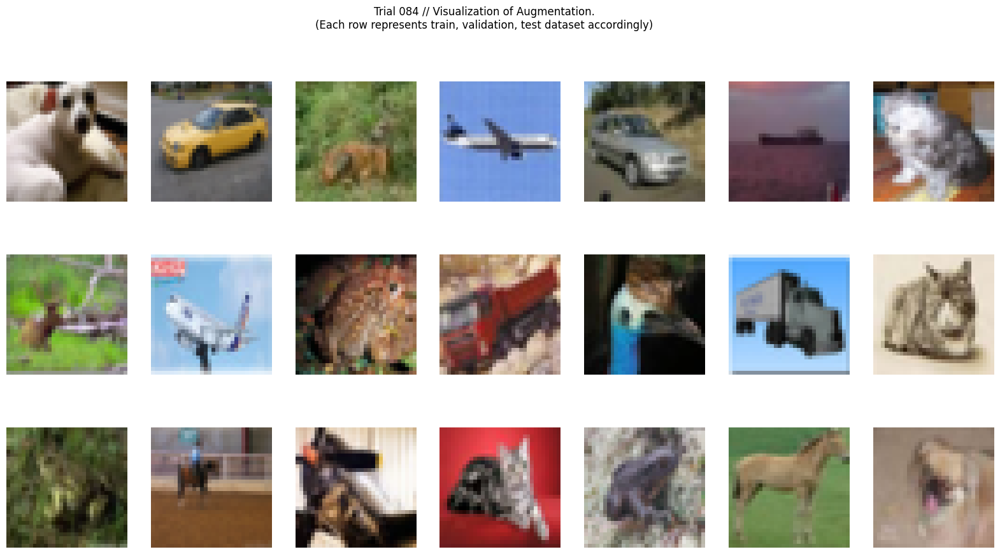

[RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |

Train: [001] Loss: 1.901, Acc: 28.91% F1(macro): 0.29: 100%|██████████| 156/156 [00:10<00:00, 14.95it/s]
 Val:       Loss: 1.633, Acc: 39.10% F1(macro): 0.37: 100%|██████████| 40/40 [00:01<00:00, 35.23it/s]


Model saved. Current best test f1: 0.375


Train: [002] Loss: 1.499, Acc: 44.91% F1(macro): 0.44: 100%|██████████| 156/156 [00:10<00:00, 14.41it/s]
 Val:       Loss: 1.434, Acc: 48.48% F1(macro): 0.48: 100%|██████████| 40/40 [00:01<00:00, 33.60it/s]


Model saved. Current best test f1: 0.475


Train: [003] Loss: 1.352, Acc: 51.15% F1(macro): 0.51: 100%|██████████| 156/156 [00:10<00:00, 14.38it/s]
 Val:       Loss: 1.337, Acc: 51.82% F1(macro): 0.51: 100%|██████████| 40/40 [00:01<00:00, 32.80it/s]


Model saved. Current best test f1: 0.510


Train: [004] Loss: 1.259, Acc: 54.85% F1(macro): 0.55: 100%|██████████| 156/156 [00:11<00:00, 14.14it/s]
 Val:       Loss: 1.275, Acc: 53.69% F1(macro): 0.53: 100%|██████████| 40/40 [00:01<00:00, 32.72it/s]


Model saved. Current best test f1: 0.534


Train: [005] Loss: 1.168, Acc: 58.06% F1(macro): 0.58: 100%|██████████| 156/156 [00:10<00:00, 14.64it/s]
 Val:       Loss: 1.230, Acc: 56.25% F1(macro): 0.56: 100%|██████████| 40/40 [00:01<00:00, 33.63it/s]


Model saved. Current best test f1: 0.558


Train: [006] Loss: 1.119, Acc: 59.99% F1(macro): 0.60: 100%|██████████| 156/156 [00:10<00:00, 14.88it/s]
 Val:       Loss: 1.164, Acc: 58.39% F1(macro): 0.58: 100%|██████████| 40/40 [00:01<00:00, 37.11it/s]


Model saved. Current best test f1: 0.582


Train: [007] Loss: 1.059, Acc: 62.31% F1(macro): 0.62: 100%|██████████| 156/156 [00:10<00:00, 14.59it/s]
 Val:       Loss: 1.168, Acc: 58.69% F1(macro): 0.58: 100%|██████████| 40/40 [00:01<00:00, 35.82it/s]
Train: [008] Loss: 1.007, Acc: 63.86% F1(macro): 0.64: 100%|██████████| 156/156 [00:10<00:00, 15.10it/s]
 Val:       Loss: 1.084, Acc: 61.40% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 35.64it/s]


Model saved. Current best test f1: 0.610


Train: [009] Loss: 0.957, Acc: 66.04% F1(macro): 0.66: 100%|██████████| 156/156 [00:10<00:00, 15.02it/s]
 Val:       Loss: 1.066, Acc: 61.91% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 34.84it/s]


Model saved. Current best test f1: 0.615


Train: [010] Loss: 0.928, Acc: 66.86% F1(macro): 0.67: 100%|██████████| 156/156 [00:10<00:00, 14.56it/s]
 Val:       Loss: 1.078, Acc: 61.40% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 35.07it/s]

TEST DATASET



 Val:       Loss: 1.113, Acc: 60.82% F1(macro): 0.60: 100%|██████████| 40/40 [00:01<00:00, 38.81it/s]
[I 2021-11-22 07:53:50,727] Trial 84 finished with value: 0.6049760924320918 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 69 with value: 0.6497389456185138.


Files already downloaded and verified
Files already downloaded and verified


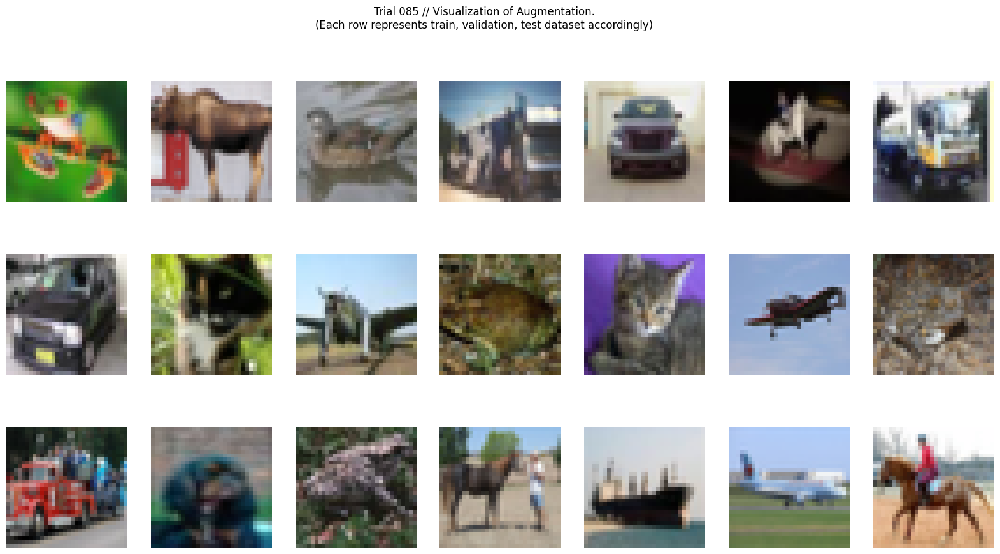

[RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |

Train: [001] Loss: 1.940, Acc: 27.72% F1(macro): 0.27: 100%|██████████| 156/156 [00:10<00:00, 14.22it/s]
 Val:       Loss: 1.634, Acc: 40.63% F1(macro): 0.39: 100%|██████████| 40/40 [00:01<00:00, 32.63it/s]


Model saved. Current best test f1: 0.393


Train: [002] Loss: 1.515, Acc: 44.45% F1(macro): 0.44: 100%|██████████| 156/156 [00:10<00:00, 14.77it/s]
 Val:       Loss: 1.425, Acc: 48.87% F1(macro): 0.47: 100%|██████████| 40/40 [00:01<00:00, 36.48it/s]


Model saved. Current best test f1: 0.474


Train: [003] Loss: 1.356, Acc: 50.68% F1(macro): 0.50: 100%|██████████| 156/156 [00:10<00:00, 14.24it/s]
 Val:       Loss: 1.309, Acc: 52.36% F1(macro): 0.51: 100%|██████████| 40/40 [00:01<00:00, 35.68it/s]


Model saved. Current best test f1: 0.513


Train: [004] Loss: 1.257, Acc: 54.91% F1(macro): 0.55: 100%|██████████| 156/156 [00:10<00:00, 14.54it/s]
 Val:       Loss: 1.295, Acc: 55.31% F1(macro): 0.55: 100%|██████████| 40/40 [00:01<00:00, 36.64it/s]


Model saved. Current best test f1: 0.547


Train: [005] Loss: 1.180, Acc: 58.14% F1(macro): 0.58: 100%|██████████| 156/156 [00:10<00:00, 14.24it/s]
 Val:       Loss: 1.192, Acc: 57.30% F1(macro): 0.57: 100%|██████████| 40/40 [00:01<00:00, 31.98it/s]


Model saved. Current best test f1: 0.568


Train: [006] Loss: 1.106, Acc: 60.37% F1(macro): 0.60: 100%|██████████| 156/156 [00:10<00:00, 14.24it/s]
 Val:       Loss: 1.154, Acc: 59.20% F1(macro): 0.59: 100%|██████████| 40/40 [00:01<00:00, 30.86it/s]


Model saved. Current best test f1: 0.589


Train: [007] Loss: 1.050, Acc: 62.69% F1(macro): 0.63: 100%|██████████| 156/156 [00:10<00:00, 14.71it/s]
 Val:       Loss: 1.159, Acc: 59.89% F1(macro): 0.59: 100%|██████████| 40/40 [00:01<00:00, 35.51it/s]


Model saved. Current best test f1: 0.594


Train: [008] Loss: 1.004, Acc: 64.46% F1(macro): 0.64: 100%|██████████| 156/156 [00:10<00:00, 14.94it/s]
 Val:       Loss: 1.097, Acc: 61.05% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 32.62it/s]


Model saved. Current best test f1: 0.608


Train: [009] Loss: 0.962, Acc: 65.97% F1(macro): 0.66: 100%|██████████| 156/156 [00:10<00:00, 14.48it/s]
 Val:       Loss: 1.063, Acc: 62.97% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 32.49it/s]


Model saved. Current best test f1: 0.624


Train: [010] Loss: 0.912, Acc: 67.57% F1(macro): 0.67: 100%|██████████| 156/156 [00:10<00:00, 14.49it/s]
 Val:       Loss: 1.058, Acc: 63.11% F1(macro): 0.63: 100%|██████████| 40/40 [00:01<00:00, 36.31it/s]


Model saved. Current best test f1: 0.627
TEST DATASET


 Val:       Loss: 1.064, Acc: 62.72% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 36.31it/s]
[I 2021-11-22 07:56:06,339] Trial 85 finished with value: 0.623444612793822 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 69 with value: 0.6497389456185138.


Files already downloaded and verified
Files already downloaded and verified


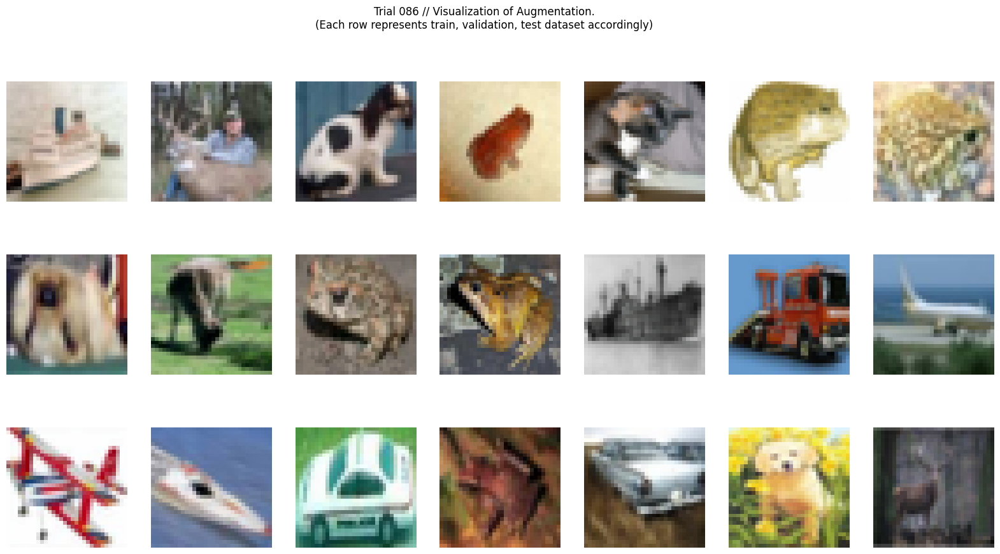

[RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |

Train: [001] Loss: 1.904, Acc: 29.15% F1(macro): 0.29: 100%|██████████| 156/156 [00:11<00:00, 14.16it/s]
 Val:       Loss: 1.594, Acc: 41.27% F1(macro): 0.40: 100%|██████████| 40/40 [00:01<00:00, 34.75it/s]


Model saved. Current best test f1: 0.398


Train: [002] Loss: 1.504, Acc: 44.95% F1(macro): 0.44: 100%|██████████| 156/156 [00:10<00:00, 14.56it/s]
 Val:       Loss: 1.434, Acc: 47.58% F1(macro): 0.47: 100%|██████████| 40/40 [00:01<00:00, 32.42it/s]


Model saved. Current best test f1: 0.471


Train: [003] Loss: 1.344, Acc: 51.53% F1(macro): 0.51: 100%|██████████| 156/156 [00:10<00:00, 14.22it/s]
 Val:       Loss: 1.324, Acc: 51.83% F1(macro): 0.51: 100%|██████████| 40/40 [00:01<00:00, 34.88it/s]


Model saved. Current best test f1: 0.512


Train: [004] Loss: 1.239, Acc: 55.55% F1(macro): 0.55: 100%|██████████| 156/156 [00:10<00:00, 14.57it/s]
 Val:       Loss: 1.285, Acc: 53.54% F1(macro): 0.54: 100%|██████████| 40/40 [00:01<00:00, 35.99it/s]


Model saved. Current best test f1: 0.535


Train: [005] Loss: 1.147, Acc: 59.03% F1(macro): 0.59: 100%|██████████| 156/156 [00:10<00:00, 14.41it/s]
 Val:       Loss: 1.205, Acc: 56.76% F1(macro): 0.56: 100%|██████████| 40/40 [00:01<00:00, 36.00it/s]


Model saved. Current best test f1: 0.563


Train: [006] Loss: 1.072, Acc: 61.97% F1(macro): 0.62: 100%|██████████| 156/156 [00:10<00:00, 14.66it/s]
 Val:       Loss: 1.129, Acc: 59.42% F1(macro): 0.59: 100%|██████████| 40/40 [00:01<00:00, 35.95it/s]


Model saved. Current best test f1: 0.592


Train: [007] Loss: 1.013, Acc: 63.99% F1(macro): 0.64: 100%|██████████| 156/156 [00:10<00:00, 14.61it/s]
 Val:       Loss: 1.096, Acc: 61.24% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 35.14it/s]


Model saved. Current best test f1: 0.610


Train: [008] Loss: 0.959, Acc: 66.07% F1(macro): 0.66: 100%|██████████| 156/156 [00:10<00:00, 14.68it/s]
 Val:       Loss: 1.090, Acc: 60.73% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 36.30it/s]
Train: [009] Loss: 0.918, Acc: 67.40% F1(macro): 0.67: 100%|██████████| 156/156 [00:10<00:00, 15.36it/s]
 Val:       Loss: 1.072, Acc: 62.56% F1(macro): 0.63: 100%|██████████| 40/40 [00:01<00:00, 36.81it/s]


Model saved. Current best test f1: 0.626


Train: [010] Loss: 0.878, Acc: 68.77% F1(macro): 0.69: 100%|██████████| 156/156 [00:10<00:00, 14.43it/s]
 Val:       Loss: 1.025, Acc: 64.24% F1(macro): 0.64: 100%|██████████| 40/40 [00:01<00:00, 34.50it/s]


Model saved. Current best test f1: 0.640
TEST DATASET


 Val:       Loss: 1.027, Acc: 64.50% F1(macro): 0.64: 100%|██████████| 40/40 [00:01<00:00, 33.05it/s]
[I 2021-11-22 07:58:19,835] Trial 86 finished with value: 0.6417475445294563 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 69 with value: 0.6497389456185138.


Files already downloaded and verified
Files already downloaded and verified


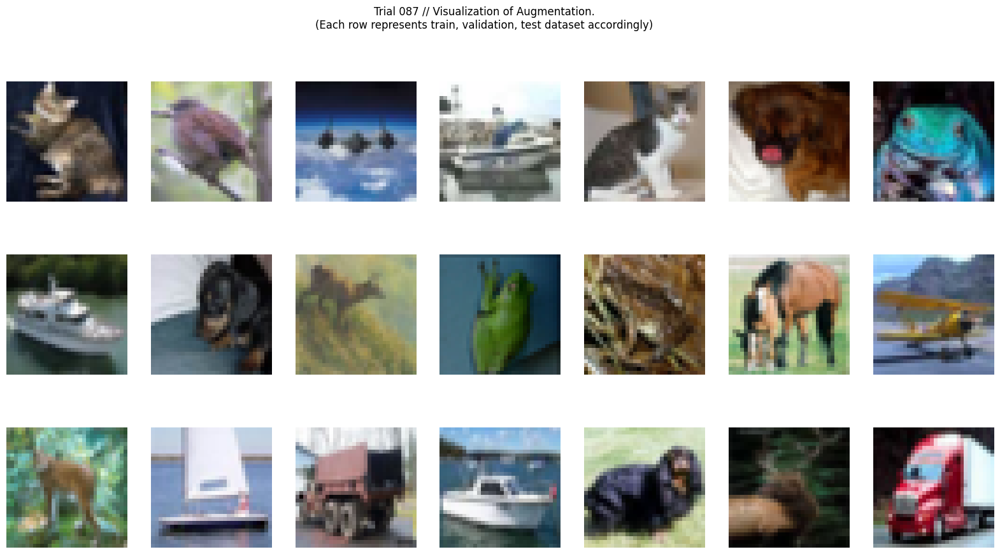

[RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |

Train: [001] Loss: 1.917, Acc: 28.54% F1(macro): 0.28: 100%|██████████| 156/156 [00:10<00:00, 14.49it/s]
 Val:       Loss: 1.606, Acc: 40.46% F1(macro): 0.39: 100%|██████████| 40/40 [00:01<00:00, 33.85it/s]


Model saved. Current best test f1: 0.390


Train: [002] Loss: 1.492, Acc: 44.95% F1(macro): 0.44: 100%|██████████| 156/156 [00:10<00:00, 14.46it/s]
 Val:       Loss: 1.447, Acc: 46.84% F1(macro): 0.46: 100%|██████████| 40/40 [00:01<00:00, 33.23it/s]


Model saved. Current best test f1: 0.465


Train: [003] Loss: 1.368, Acc: 50.04% F1(macro): 0.50: 100%|██████████| 156/156 [00:10<00:00, 14.87it/s]
 Val:       Loss: 1.363, Acc: 50.73% F1(macro): 0.50: 100%|██████████| 40/40 [00:01<00:00, 35.08it/s]


Model saved. Current best test f1: 0.498


Train: [004] Loss: 1.269, Acc: 53.69% F1(macro): 0.53: 100%|██████████| 156/156 [00:10<00:00, 14.25it/s]
 Val:       Loss: 1.331, Acc: 52.03% F1(macro): 0.52: 100%|██████████| 40/40 [00:01<00:00, 36.29it/s]


Model saved. Current best test f1: 0.518


Train: [005] Loss: 1.190, Acc: 57.04% F1(macro): 0.57: 100%|██████████| 156/156 [00:10<00:00, 15.21it/s]
 Val:       Loss: 1.220, Acc: 55.45% F1(macro): 0.55: 100%|██████████| 40/40 [00:01<00:00, 34.99it/s]


Model saved. Current best test f1: 0.551


Train: [006] Loss: 1.122, Acc: 59.58% F1(macro): 0.59: 100%|██████████| 156/156 [00:10<00:00, 15.09it/s]
 Val:       Loss: 1.196, Acc: 56.93% F1(macro): 0.57: 100%|██████████| 40/40 [00:01<00:00, 34.50it/s]


Model saved. Current best test f1: 0.569


Train: [007] Loss: 1.065, Acc: 61.96% F1(macro): 0.62: 100%|██████████| 156/156 [00:10<00:00, 14.56it/s]
 Val:       Loss: 1.172, Acc: 58.70% F1(macro): 0.58: 100%|██████████| 40/40 [00:01<00:00, 31.91it/s]


Model saved. Current best test f1: 0.577


Train: [008] Loss: 1.018, Acc: 63.80% F1(macro): 0.64: 100%|██████████| 156/156 [00:10<00:00, 14.31it/s]
 Val:       Loss: 1.141, Acc: 59.77% F1(macro): 0.60: 100%|██████████| 40/40 [00:01<00:00, 35.71it/s]


Model saved. Current best test f1: 0.596


Train: [009] Loss: 0.969, Acc: 65.45% F1(macro): 0.65: 100%|██████████| 156/156 [00:10<00:00, 14.28it/s]
 Val:       Loss: 1.132, Acc: 59.84% F1(macro): 0.60: 100%|██████████| 40/40 [00:01<00:00, 31.85it/s]


Model saved. Current best test f1: 0.597


Train: [010] Loss: 0.928, Acc: 66.75% F1(macro): 0.67: 100%|██████████| 156/156 [00:10<00:00, 14.51it/s]
 Val:       Loss: 1.119, Acc: 61.31% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 35.56it/s]


Model saved. Current best test f1: 0.612
TEST DATASET


 Val:       Loss: 1.096, Acc: 61.86% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 35.67it/s]
[I 2021-11-22 08:00:34,510] Trial 87 finished with value: 0.6177333096966581 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 69 with value: 0.6497389456185138.


Files already downloaded and verified
Files already downloaded and verified


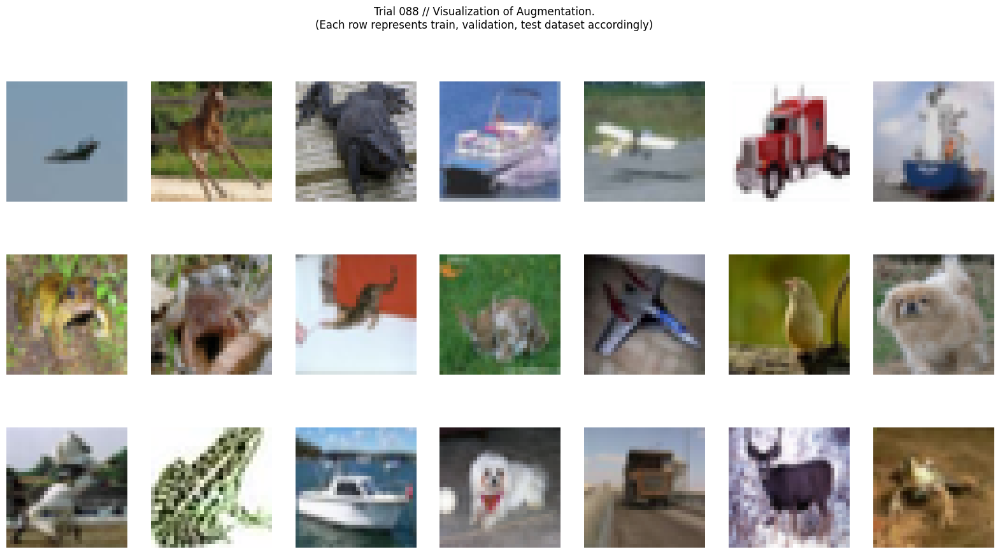

[RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |

Train: [001] Loss: 1.946, Acc: 27.65% F1(macro): 0.27: 100%|██████████| 156/156 [00:10<00:00, 14.71it/s]
 Val:       Loss: 1.734, Acc: 36.81% F1(macro): 0.35: 100%|██████████| 40/40 [00:01<00:00, 31.81it/s]


Model saved. Current best test f1: 0.352


Train: [002] Loss: 1.518, Acc: 44.14% F1(macro): 0.44: 100%|██████████| 156/156 [00:10<00:00, 14.39it/s]
 Val:       Loss: 1.447, Acc: 47.29% F1(macro): 0.47: 100%|██████████| 40/40 [00:01<00:00, 29.65it/s]


Model saved. Current best test f1: 0.465


Train: [003] Loss: 1.359, Acc: 50.66% F1(macro): 0.50: 100%|██████████| 156/156 [00:10<00:00, 14.20it/s]
 Val:       Loss: 1.342, Acc: 51.43% F1(macro): 0.51: 100%|██████████| 40/40 [00:01<00:00, 29.28it/s]


Model saved. Current best test f1: 0.511


Train: [004] Loss: 1.264, Acc: 54.33% F1(macro): 0.54: 100%|██████████| 156/156 [00:10<00:00, 14.43it/s]
 Val:       Loss: 1.309, Acc: 51.99% F1(macro): 0.51: 100%|██████████| 40/40 [00:01<00:00, 35.11it/s]


Model saved. Current best test f1: 0.513


Train: [005] Loss: 1.188, Acc: 57.43% F1(macro): 0.57: 100%|██████████| 156/156 [00:10<00:00, 14.99it/s]
 Val:       Loss: 1.227, Acc: 55.94% F1(macro): 0.56: 100%|██████████| 40/40 [00:01<00:00, 34.74it/s]


Model saved. Current best test f1: 0.561


Train: [006] Loss: 1.121, Acc: 59.66% F1(macro): 0.59: 100%|██████████| 156/156 [00:10<00:00, 14.74it/s]
 Val:       Loss: 1.209, Acc: 57.66% F1(macro): 0.57: 100%|██████████| 40/40 [00:01<00:00, 37.05it/s]


Model saved. Current best test f1: 0.574


Train: [007] Loss: 1.071, Acc: 62.10% F1(macro): 0.62: 100%|██████████| 156/156 [00:10<00:00, 15.00it/s]
 Val:       Loss: 1.202, Acc: 57.23% F1(macro): 0.57: 100%|██████████| 40/40 [00:01<00:00, 31.65it/s]
Train: [008] Loss: 1.033, Acc: 63.14% F1(macro): 0.63: 100%|██████████| 156/156 [00:10<00:00, 14.70it/s]
 Val:       Loss: 1.146, Acc: 60.14% F1(macro): 0.60: 100%|██████████| 40/40 [00:01<00:00, 32.39it/s]


Model saved. Current best test f1: 0.598


Train: [009] Loss: 0.982, Acc: 65.10% F1(macro): 0.65: 100%|██████████| 156/156 [00:10<00:00, 14.57it/s]
 Val:       Loss: 1.112, Acc: 61.48% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 29.73it/s]


Model saved. Current best test f1: 0.614


Train: [010] Loss: 0.943, Acc: 66.56% F1(macro): 0.66: 100%|██████████| 156/156 [00:10<00:00, 14.53it/s]
 Val:       Loss: 1.112, Acc: 61.23% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 36.86it/s]


TEST DATASET


 Val:       Loss: 1.126, Acc: 61.01% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 38.08it/s]
[I 2021-11-22 08:02:47,588] Trial 88 finished with value: 0.6099722927637983 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 69 with value: 0.6497389456185138.


Files already downloaded and verified
Files already downloaded and verified


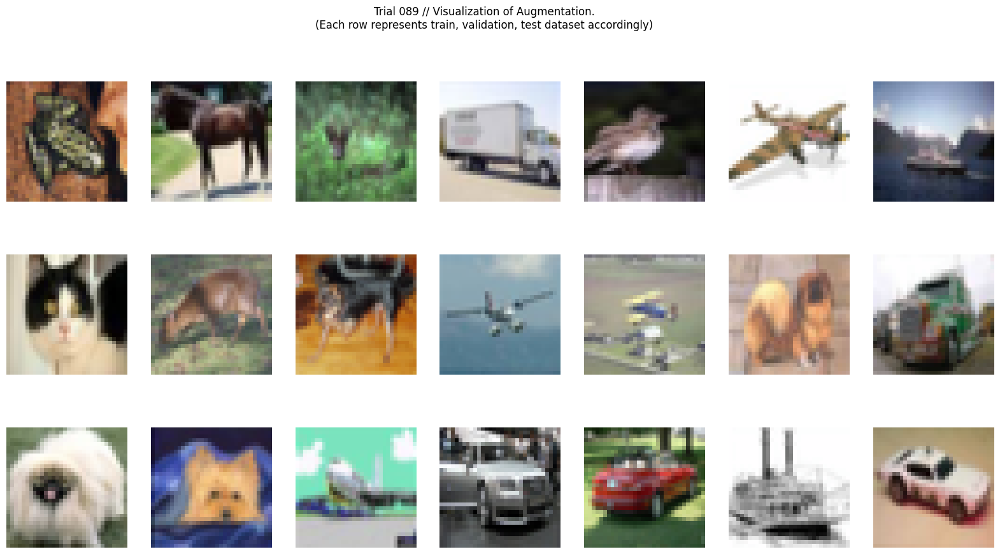

[RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |

Train: [001] Loss: 1.921, Acc: 29.28% F1(macro): 0.29: 100%|██████████| 156/156 [00:10<00:00, 14.34it/s]
 Val:       Loss: 1.639, Acc: 40.84% F1(macro): 0.40: 100%|██████████| 40/40 [00:01<00:00, 32.97it/s]


Model saved. Current best test f1: 0.400


Train: [002] Loss: 1.504, Acc: 45.47% F1(macro): 0.45: 100%|██████████| 156/156 [00:10<00:00, 14.25it/s]
 Val:       Loss: 1.475, Acc: 47.25% F1(macro): 0.46: 100%|██████████| 40/40 [00:01<00:00, 36.08it/s]


Model saved. Current best test f1: 0.461


Train: [003] Loss: 1.349, Acc: 51.06% F1(macro): 0.51: 100%|██████████| 156/156 [00:11<00:00, 13.56it/s]
 Val:       Loss: 1.368, Acc: 50.79% F1(macro): 0.51: 100%|██████████| 40/40 [00:01<00:00, 36.00it/s]


Model saved. Current best test f1: 0.511


Train: [004] Loss: 1.238, Acc: 55.37% F1(macro): 0.55: 100%|██████████| 156/156 [00:10<00:00, 15.11it/s]
 Val:       Loss: 1.256, Acc: 54.95% F1(macro): 0.55: 100%|██████████| 40/40 [00:01<00:00, 34.47it/s]


Model saved. Current best test f1: 0.550


Train: [005] Loss: 1.154, Acc: 58.64% F1(macro): 0.58: 100%|██████████| 156/156 [00:10<00:00, 15.09it/s]
 Val:       Loss: 1.218, Acc: 56.20% F1(macro): 0.55: 100%|██████████| 40/40 [00:01<00:00, 37.54it/s]


Model saved. Current best test f1: 0.555


Train: [006] Loss: 1.071, Acc: 61.79% F1(macro): 0.62: 100%|██████████| 156/156 [00:11<00:00, 13.57it/s]
 Val:       Loss: 1.153, Acc: 58.93% F1(macro): 0.59: 100%|██████████| 40/40 [00:01<00:00, 33.19it/s]


Model saved. Current best test f1: 0.590


Train: [007] Loss: 1.014, Acc: 63.73% F1(macro): 0.64: 100%|██████████| 156/156 [00:11<00:00, 14.18it/s]
 Val:       Loss: 1.165, Acc: 59.00% F1(macro): 0.59: 100%|██████████| 40/40 [00:01<00:00, 36.58it/s]


Model saved. Current best test f1: 0.591


Train: [008] Loss: 0.960, Acc: 65.74% F1(macro): 0.66: 100%|██████████| 156/156 [00:10<00:00, 14.31it/s]
 Val:       Loss: 1.079, Acc: 61.73% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 33.50it/s]


Model saved. Current best test f1: 0.614


Train: [009] Loss: 0.915, Acc: 67.46% F1(macro): 0.67: 100%|██████████| 156/156 [00:10<00:00, 15.00it/s]
 Val:       Loss: 1.082, Acc: 61.18% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 34.58it/s]
Train: [010] Loss: 0.880, Acc: 68.78% F1(macro): 0.69: 100%|██████████| 156/156 [00:11<00:00, 13.69it/s]
 Val:       Loss: 1.082, Acc: 61.23% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 30.56it/s]


TEST DATASET


 Val:       Loss: 1.076, Acc: 61.57% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 33.84it/s]
[I 2021-11-22 08:05:02,698] Trial 89 finished with value: 0.6152096934739685 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 69 with value: 0.6497389456185138.


Files already downloaded and verified
Files already downloaded and verified


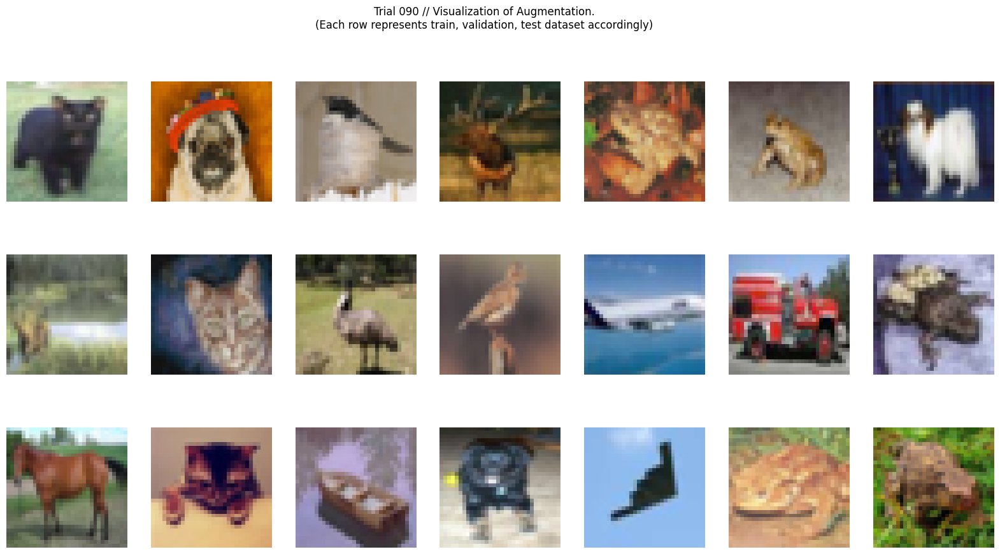

[RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |

Train: [001] Loss: 1.904, Acc: 29.39% F1(macro): 0.29: 100%|██████████| 156/156 [00:10<00:00, 15.37it/s]
 Val:       Loss: 1.600, Acc: 41.28% F1(macro): 0.40: 100%|██████████| 40/40 [00:01<00:00, 32.20it/s]


Model saved. Current best test f1: 0.401


Train: [002] Loss: 1.480, Acc: 46.12% F1(macro): 0.46: 100%|██████████| 156/156 [00:10<00:00, 14.59it/s]
 Val:       Loss: 1.420, Acc: 47.74% F1(macro): 0.48: 100%|██████████| 40/40 [00:01<00:00, 34.65it/s]


Model saved. Current best test f1: 0.476


Train: [003] Loss: 1.327, Acc: 52.01% F1(macro): 0.52: 100%|██████████| 156/156 [00:10<00:00, 14.79it/s]
 Val:       Loss: 1.346, Acc: 51.59% F1(macro): 0.51: 100%|██████████| 40/40 [00:01<00:00, 28.82it/s]


Model saved. Current best test f1: 0.514


Train: [004] Loss: 1.238, Acc: 55.13% F1(macro): 0.55: 100%|██████████| 156/156 [00:10<00:00, 14.74it/s]
 Val:       Loss: 1.257, Acc: 54.64% F1(macro): 0.55: 100%|██████████| 40/40 [00:01<00:00, 37.66it/s]


Model saved. Current best test f1: 0.548


Train: [005] Loss: 1.156, Acc: 58.72% F1(macro): 0.59: 100%|██████████| 156/156 [00:10<00:00, 14.71it/s]
 Val:       Loss: 1.267, Acc: 55.15% F1(macro): 0.54: 100%|██████████| 40/40 [00:01<00:00, 32.14it/s]
Train: [006] Loss: 1.088, Acc: 60.97% F1(macro): 0.61: 100%|██████████| 156/156 [00:10<00:00, 15.13it/s]
 Val:       Loss: 1.167, Acc: 58.84% F1(macro): 0.59: 100%|██████████| 40/40 [00:01<00:00, 37.02it/s]


Model saved. Current best test f1: 0.589


Train: [007] Loss: 1.032, Acc: 63.22% F1(macro): 0.63: 100%|██████████| 156/156 [00:10<00:00, 14.58it/s]
 Val:       Loss: 1.130, Acc: 59.90% F1(macro): 0.60: 100%|██████████| 40/40 [00:01<00:00, 32.22it/s]


Model saved. Current best test f1: 0.600


Train: [008] Loss: 0.978, Acc: 65.26% F1(macro): 0.65: 100%|██████████| 156/156 [00:10<00:00, 14.36it/s]
 Val:       Loss: 1.075, Acc: 61.69% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 34.77it/s]


Model saved. Current best test f1: 0.618


Train: [009] Loss: 0.929, Acc: 66.88% F1(macro): 0.67: 100%|██████████| 156/156 [00:10<00:00, 14.70it/s]
 Val:       Loss: 1.083, Acc: 61.79% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 34.93it/s]
Train: [010] Loss: 0.902, Acc: 68.06% F1(macro): 0.68: 100%|██████████| 156/156 [00:10<00:00, 15.07it/s]
 Val:       Loss: 1.077, Acc: 61.58% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 36.99it/s]

TEST DATASET



 Val:       Loss: 1.063, Acc: 62.18% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 37.55it/s]
[I 2021-11-22 08:07:13,395] Trial 90 finished with value: 0.6202433122291791 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 69 with value: 0.6497389456185138.


Files already downloaded and verified
Files already downloaded and verified


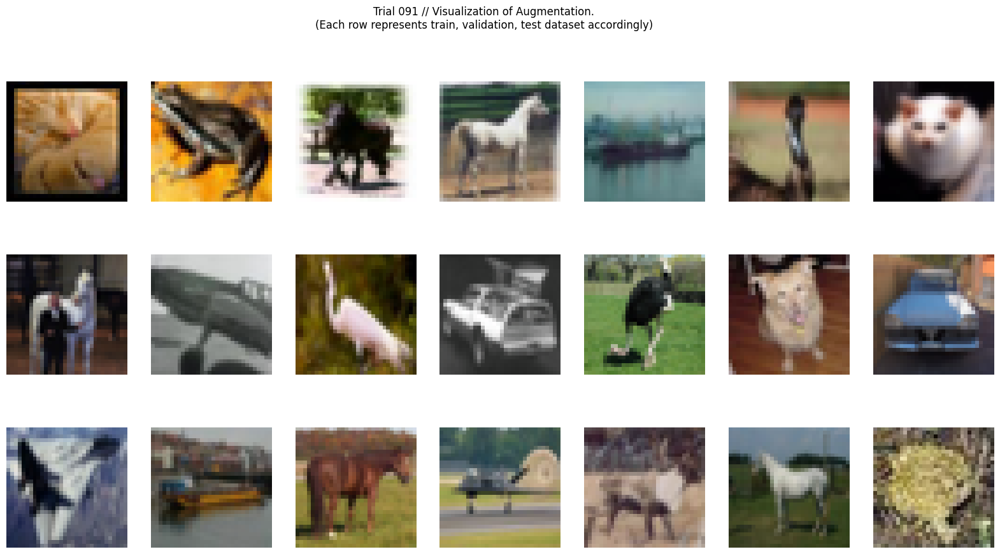

[RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |

Train: [001] Loss: 1.936, Acc: 27.88% F1(macro): 0.27: 100%|██████████| 156/156 [00:10<00:00, 14.71it/s]
 Val:       Loss: 1.693, Acc: 38.52% F1(macro): 0.37: 100%|██████████| 40/40 [00:01<00:00, 36.54it/s]


Model saved. Current best test f1: 0.371


Train: [002] Loss: 1.520, Acc: 43.60% F1(macro): 0.43: 100%|██████████| 156/156 [00:10<00:00, 14.67it/s]
 Val:       Loss: 1.477, Acc: 46.31% F1(macro): 0.45: 100%|██████████| 40/40 [00:01<00:00, 35.63it/s]


Model saved. Current best test f1: 0.454


Train: [003] Loss: 1.357, Acc: 50.55% F1(macro): 0.50: 100%|██████████| 156/156 [00:10<00:00, 14.99it/s]
 Val:       Loss: 1.345, Acc: 51.86% F1(macro): 0.51: 100%|██████████| 40/40 [00:01<00:00, 35.39it/s]


Model saved. Current best test f1: 0.512


Train: [004] Loss: 1.242, Acc: 55.42% F1(macro): 0.55: 100%|██████████| 156/156 [00:10<00:00, 14.37it/s]
 Val:       Loss: 1.266, Acc: 54.19% F1(macro): 0.53: 100%|██████████| 40/40 [00:01<00:00, 35.97it/s]


Model saved. Current best test f1: 0.534


Train: [005] Loss: 1.151, Acc: 58.73% F1(macro): 0.59: 100%|██████████| 156/156 [00:10<00:00, 14.39it/s]
 Val:       Loss: 1.212, Acc: 56.94% F1(macro): 0.56: 100%|██████████| 40/40 [00:01<00:00, 31.50it/s]


Model saved. Current best test f1: 0.562


Train: [006] Loss: 1.079, Acc: 61.52% F1(macro): 0.61: 100%|██████████| 156/156 [00:10<00:00, 14.39it/s]
 Val:       Loss: 1.169, Acc: 58.36% F1(macro): 0.58: 100%|██████████| 40/40 [00:01<00:00, 34.19it/s]


Model saved. Current best test f1: 0.581


Train: [007] Loss: 1.017, Acc: 63.48% F1(macro): 0.63: 100%|██████████| 156/156 [00:10<00:00, 14.45it/s]
 Val:       Loss: 1.135, Acc: 59.57% F1(macro): 0.59: 100%|██████████| 40/40 [00:01<00:00, 36.16it/s]


Model saved. Current best test f1: 0.595


Train: [008] Loss: 0.960, Acc: 65.64% F1(macro): 0.66: 100%|██████████| 156/156 [00:10<00:00, 14.99it/s]
 Val:       Loss: 1.064, Acc: 62.24% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 32.94it/s]


Model saved. Current best test f1: 0.615


Train: [009] Loss: 0.913, Acc: 67.43% F1(macro): 0.67: 100%|██████████| 156/156 [00:10<00:00, 14.63it/s]
 Val:       Loss: 1.041, Acc: 63.08% F1(macro): 0.63: 100%|██████████| 40/40 [00:01<00:00, 34.02it/s]


Model saved. Current best test f1: 0.627


Train: [010] Loss: 0.868, Acc: 69.09% F1(macro): 0.69: 100%|██████████| 156/156 [00:10<00:00, 14.96it/s]
 Val:       Loss: 1.006, Acc: 64.61% F1(macro): 0.64: 100%|██████████| 40/40 [00:01<00:00, 34.02it/s]


Model saved. Current best test f1: 0.639
TEST DATASET


 Val:       Loss: 1.010, Acc: 64.96% F1(macro): 0.64: 100%|██████████| 40/40 [00:01<00:00, 36.82it/s]
[I 2021-11-22 08:09:27,426] Trial 91 finished with value: 0.6437618999642077 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 69 with value: 0.6497389456185138.


Files already downloaded and verified
Files already downloaded and verified


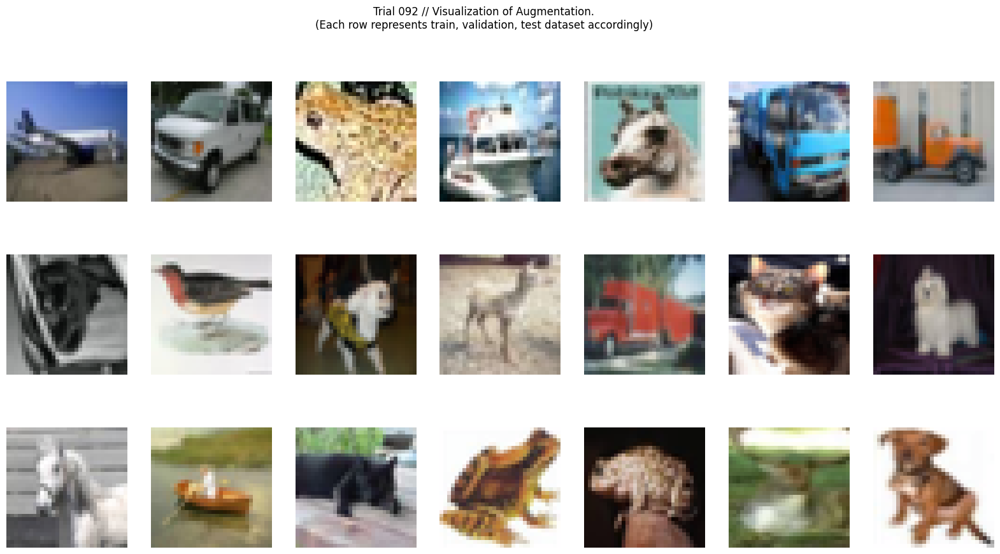

[RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |

Train: [001] Loss: 1.895, Acc: 30.05% F1(macro): 0.30: 100%|██████████| 156/156 [00:10<00:00, 15.39it/s]
 Val:       Loss: 1.565, Acc: 41.74% F1(macro): 0.41: 100%|██████████| 40/40 [00:01<00:00, 33.17it/s]


Model saved. Current best test f1: 0.411


Train: [002] Loss: 1.479, Acc: 45.77% F1(macro): 0.45: 100%|██████████| 156/156 [00:10<00:00, 14.59it/s]
 Val:       Loss: 1.475, Acc: 48.85% F1(macro): 0.48: 100%|██████████| 40/40 [00:01<00:00, 35.35it/s]


Model saved. Current best test f1: 0.481


Train: [003] Loss: 1.316, Acc: 52.71% F1(macro): 0.52: 100%|██████████| 156/156 [00:10<00:00, 14.79it/s]
 Val:       Loss: 1.295, Acc: 53.53% F1(macro): 0.53: 100%|██████████| 40/40 [00:01<00:00, 36.00it/s]


Model saved. Current best test f1: 0.533


Train: [004] Loss: 1.213, Acc: 56.56% F1(macro): 0.56: 100%|██████████| 156/156 [00:10<00:00, 14.67it/s]
 Val:       Loss: 1.216, Acc: 56.61% F1(macro): 0.57: 100%|██████████| 40/40 [00:01<00:00, 35.23it/s]


Model saved. Current best test f1: 0.567


Train: [005] Loss: 1.140, Acc: 59.33% F1(macro): 0.59: 100%|██████████| 156/156 [00:10<00:00, 14.66it/s]
 Val:       Loss: 1.166, Acc: 58.34% F1(macro): 0.58: 100%|██████████| 40/40 [00:01<00:00, 31.66it/s]


Model saved. Current best test f1: 0.581


Train: [006] Loss: 1.074, Acc: 61.60% F1(macro): 0.61: 100%|██████████| 156/156 [00:10<00:00, 14.28it/s]
 Val:       Loss: 1.160, Acc: 58.79% F1(macro): 0.59: 100%|██████████| 40/40 [00:01<00:00, 32.80it/s]


Model saved. Current best test f1: 0.585


Train: [007] Loss: 1.019, Acc: 63.66% F1(macro): 0.64: 100%|██████████| 156/156 [00:10<00:00, 14.55it/s]
 Val:       Loss: 1.083, Acc: 60.91% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 34.47it/s]


Model saved. Current best test f1: 0.609


Train: [008] Loss: 0.969, Acc: 65.43% F1(macro): 0.65: 100%|██████████| 156/156 [00:10<00:00, 14.76it/s]
 Val:       Loss: 1.069, Acc: 61.90% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 32.66it/s]


Model saved. Current best test f1: 0.621


Train: [009] Loss: 0.929, Acc: 66.74% F1(macro): 0.67: 100%|██████████| 156/156 [00:10<00:00, 14.70it/s]
 Val:       Loss: 1.044, Acc: 63.08% F1(macro): 0.63: 100%|██████████| 40/40 [00:01<00:00, 35.73it/s]


Model saved. Current best test f1: 0.628


Train: [010] Loss: 0.893, Acc: 68.29% F1(macro): 0.68: 100%|██████████| 156/156 [00:11<00:00, 14.10it/s]
 Val:       Loss: 1.028, Acc: 63.71% F1(macro): 0.64: 100%|██████████| 40/40 [00:01<00:00, 35.60it/s]


Model saved. Current best test f1: 0.639
TEST DATASET


 Val:       Loss: 1.036, Acc: 63.35% F1(macro): 0.63: 100%|██████████| 40/40 [00:01<00:00, 37.91it/s]
[I 2021-11-22 08:11:41,487] Trial 92 finished with value: 0.634414290160515 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 69 with value: 0.6497389456185138.


Files already downloaded and verified
Files already downloaded and verified


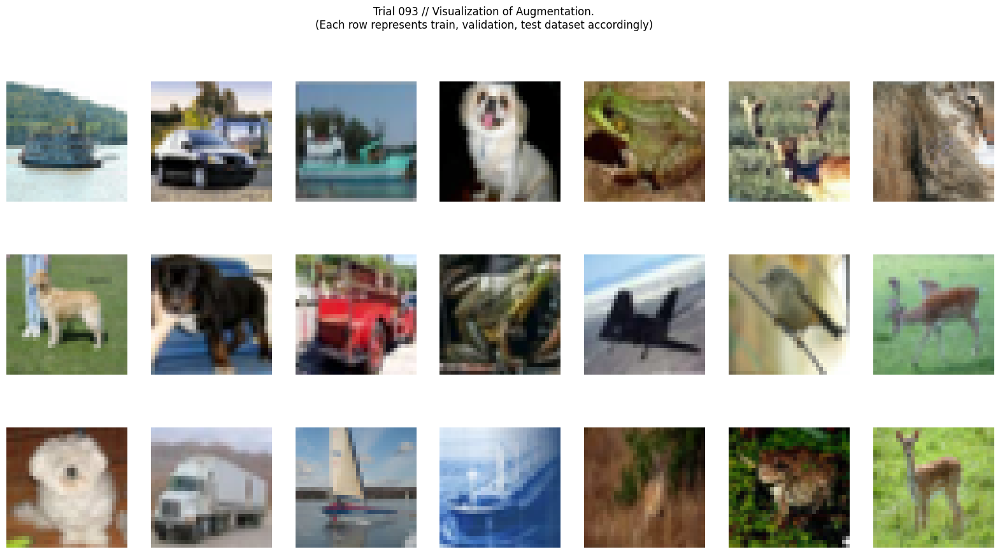

[RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |

Train: [001] Loss: 1.923, Acc: 28.82% F1(macro): 0.28: 100%|██████████| 156/156 [00:10<00:00, 14.51it/s]
 Val:       Loss: 1.618, Acc: 40.99% F1(macro): 0.40: 100%|██████████| 40/40 [00:01<00:00, 32.55it/s]


Model saved. Current best test f1: 0.400


Train: [002] Loss: 1.480, Acc: 45.85% F1(macro): 0.45: 100%|██████████| 156/156 [00:10<00:00, 14.70it/s]
 Val:       Loss: 1.433, Acc: 47.52% F1(macro): 0.47: 100%|██████████| 40/40 [00:01<00:00, 30.25it/s]


Model saved. Current best test f1: 0.467


Train: [003] Loss: 1.344, Acc: 51.41% F1(macro): 0.51: 100%|██████████| 156/156 [00:11<00:00, 13.69it/s]
 Val:       Loss: 1.355, Acc: 51.17% F1(macro): 0.51: 100%|██████████| 40/40 [00:01<00:00, 34.44it/s]


Model saved. Current best test f1: 0.510


Train: [004] Loss: 1.243, Acc: 55.46% F1(macro): 0.55: 100%|██████████| 156/156 [00:10<00:00, 14.94it/s]
 Val:       Loss: 1.286, Acc: 53.38% F1(macro): 0.53: 100%|██████████| 40/40 [00:01<00:00, 36.37it/s]


Model saved. Current best test f1: 0.531


Train: [005] Loss: 1.172, Acc: 58.23% F1(macro): 0.58: 100%|██████████| 156/156 [00:10<00:00, 14.94it/s]
 Val:       Loss: 1.207, Acc: 56.71% F1(macro): 0.56: 100%|██████████| 40/40 [00:01<00:00, 35.82it/s]


Model saved. Current best test f1: 0.564


Train: [006] Loss: 1.107, Acc: 60.49% F1(macro): 0.60: 100%|██████████| 156/156 [00:11<00:00, 14.08it/s]
 Val:       Loss: 1.177, Acc: 57.86% F1(macro): 0.58: 100%|██████████| 40/40 [00:01<00:00, 33.83it/s]


Model saved. Current best test f1: 0.578


Train: [007] Loss: 1.061, Acc: 62.18% F1(macro): 0.62: 100%|██████████| 156/156 [00:10<00:00, 14.60it/s]
 Val:       Loss: 1.147, Acc: 58.51% F1(macro): 0.58: 100%|██████████| 40/40 [00:01<00:00, 34.69it/s]


Model saved. Current best test f1: 0.582


Train: [008] Loss: 1.013, Acc: 63.95% F1(macro): 0.64: 100%|██████████| 156/156 [00:10<00:00, 14.21it/s]
 Val:       Loss: 1.138, Acc: 59.53% F1(macro): 0.60: 100%|██████████| 40/40 [00:01<00:00, 33.40it/s]


Model saved. Current best test f1: 0.597


Train: [009] Loss: 0.960, Acc: 65.88% F1(macro): 0.66: 100%|██████████| 156/156 [00:10<00:00, 14.61it/s]
 Val:       Loss: 1.094, Acc: 61.05% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 30.58it/s]


Model saved. Current best test f1: 0.612


Train: [010] Loss: 0.923, Acc: 67.08% F1(macro): 0.67: 100%|██████████| 156/156 [00:10<00:00, 14.75it/s]
 Val:       Loss: 1.109, Acc: 62.08% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 28.19it/s]


Model saved. Current best test f1: 0.617
TEST DATASET


 Val:       Loss: 1.105, Acc: 61.49% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 36.37it/s]
[I 2021-11-22 08:13:57,390] Trial 93 finished with value: 0.6100602748576046 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 69 with value: 0.6497389456185138.


Files already downloaded and verified
Files already downloaded and verified


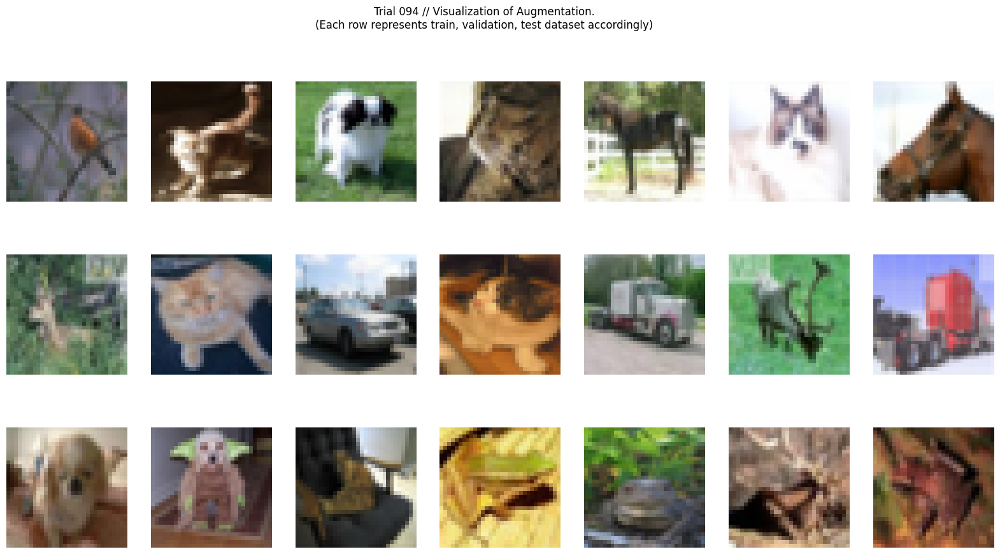

[RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |

Train: [001] Loss: 1.957, Acc: 27.52% F1(macro): 0.27: 100%|██████████| 156/156 [00:10<00:00, 14.60it/s]
 Val:       Loss: 1.629, Acc: 40.01% F1(macro): 0.39: 100%|██████████| 40/40 [00:01<00:00, 33.27it/s]


Model saved. Current best test f1: 0.386


Train: [002] Loss: 1.506, Acc: 44.42% F1(macro): 0.44: 100%|██████████| 156/156 [00:10<00:00, 14.19it/s]
 Val:       Loss: 1.472, Acc: 46.27% F1(macro): 0.46: 100%|██████████| 40/40 [00:01<00:00, 33.99it/s]


Model saved. Current best test f1: 0.457


Train: [003] Loss: 1.374, Acc: 49.79% F1(macro): 0.49: 100%|██████████| 156/156 [00:11<00:00, 13.91it/s]
 Val:       Loss: 1.383, Acc: 49.84% F1(macro): 0.50: 100%|██████████| 40/40 [00:01<00:00, 34.07it/s]


Model saved. Current best test f1: 0.498


Train: [004] Loss: 1.279, Acc: 53.56% F1(macro): 0.53: 100%|██████████| 156/156 [00:10<00:00, 15.12it/s]
 Val:       Loss: 1.308, Acc: 52.15% F1(macro): 0.52: 100%|██████████| 40/40 [00:01<00:00, 35.19it/s]


Model saved. Current best test f1: 0.522


Train: [005] Loss: 1.209, Acc: 56.59% F1(macro): 0.56: 100%|██████████| 156/156 [00:10<00:00, 14.99it/s]
 Val:       Loss: 1.256, Acc: 54.55% F1(macro): 0.54: 100%|██████████| 40/40 [00:01<00:00, 36.38it/s]


Model saved. Current best test f1: 0.543


Train: [006] Loss: 1.131, Acc: 59.47% F1(macro): 0.59: 100%|██████████| 156/156 [00:10<00:00, 14.84it/s]
 Val:       Loss: 1.201, Acc: 56.85% F1(macro): 0.57: 100%|██████████| 40/40 [00:01<00:00, 30.01it/s]


Model saved. Current best test f1: 0.572


Train: [007] Loss: 1.068, Acc: 61.72% F1(macro): 0.62: 100%|██████████| 156/156 [00:10<00:00, 14.40it/s]
 Val:       Loss: 1.159, Acc: 58.54% F1(macro): 0.58: 100%|██████████| 40/40 [00:01<00:00, 34.77it/s]


Model saved. Current best test f1: 0.582


Train: [008] Loss: 1.018, Acc: 63.60% F1(macro): 0.63: 100%|██████████| 156/156 [00:10<00:00, 14.57it/s]
 Val:       Loss: 1.130, Acc: 60.22% F1(macro): 0.59: 100%|██████████| 40/40 [00:01<00:00, 33.73it/s]


Model saved. Current best test f1: 0.595


Train: [009] Loss: 0.973, Acc: 65.47% F1(macro): 0.65: 100%|██████████| 156/156 [00:10<00:00, 14.57it/s]
 Val:       Loss: 1.100, Acc: 60.49% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 33.78it/s]


Model saved. Current best test f1: 0.606


Train: [010] Loss: 0.922, Acc: 67.37% F1(macro): 0.67: 100%|██████████| 156/156 [00:10<00:00, 14.95it/s]
 Val:       Loss: 1.070, Acc: 62.52% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 32.95it/s]


Model saved. Current best test f1: 0.622
TEST DATASET


 Val:       Loss: 1.073, Acc: 61.82% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 34.77it/s]
[I 2021-11-22 08:16:12,166] Trial 94 finished with value: 0.6141050178354249 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 69 with value: 0.6497389456185138.


Files already downloaded and verified
Files already downloaded and verified


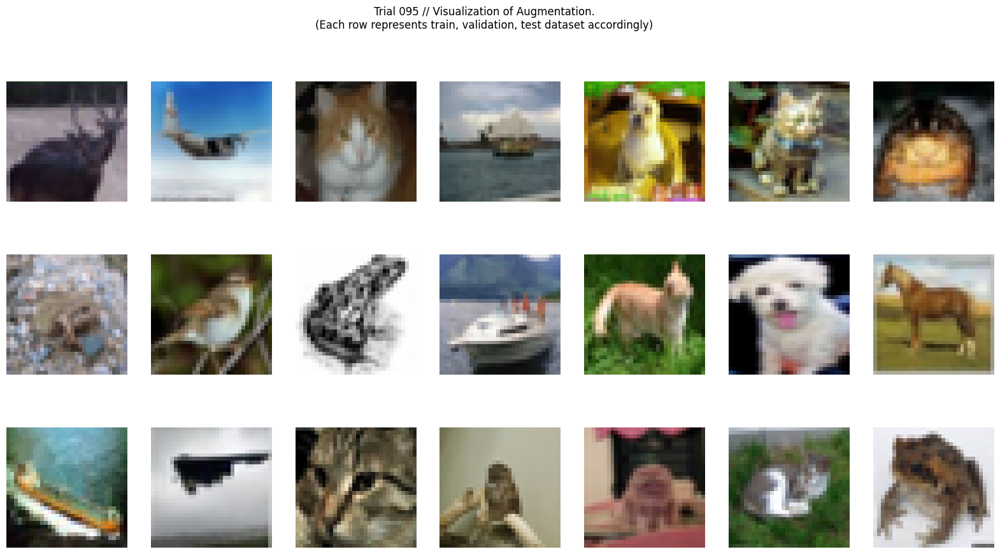

[RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |

Train: [001] Loss: 1.918, Acc: 28.96% F1(macro): 0.29: 100%|██████████| 156/156 [00:10<00:00, 14.59it/s]
 Val:       Loss: 1.648, Acc: 39.42% F1(macro): 0.38: 100%|██████████| 40/40 [00:01<00:00, 31.68it/s]


Model saved. Current best test f1: 0.382


Train: [002] Loss: 1.495, Acc: 44.91% F1(macro): 0.44: 100%|██████████| 156/156 [00:11<00:00, 13.87it/s]
 Val:       Loss: 1.404, Acc: 49.10% F1(macro): 0.48: 100%|██████████| 40/40 [00:01<00:00, 32.20it/s]


Model saved. Current best test f1: 0.483


Train: [003] Loss: 1.334, Acc: 51.33% F1(macro): 0.51: 100%|██████████| 156/156 [00:10<00:00, 14.41it/s]
 Val:       Loss: 1.323, Acc: 51.67% F1(macro): 0.51: 100%|██████████| 40/40 [00:01<00:00, 28.36it/s]


Model saved. Current best test f1: 0.511


Train: [004] Loss: 1.235, Acc: 55.57% F1(macro): 0.55: 100%|██████████| 156/156 [00:10<00:00, 14.19it/s]
 Val:       Loss: 1.235, Acc: 55.63% F1(macro): 0.55: 100%|██████████| 40/40 [00:01<00:00, 33.53it/s]


Model saved. Current best test f1: 0.548


Train: [005] Loss: 1.153, Acc: 58.70% F1(macro): 0.58: 100%|██████████| 156/156 [00:10<00:00, 14.35it/s]
 Val:       Loss: 1.187, Acc: 57.51% F1(macro): 0.57: 100%|██████████| 40/40 [00:01<00:00, 33.40it/s]


Model saved. Current best test f1: 0.574


Train: [006] Loss: 1.079, Acc: 61.25% F1(macro): 0.61: 100%|██████████| 156/156 [00:10<00:00, 14.54it/s]
 Val:       Loss: 1.155, Acc: 58.65% F1(macro): 0.58: 100%|██████████| 40/40 [00:01<00:00, 30.89it/s]


Model saved. Current best test f1: 0.581


Train: [007] Loss: 1.026, Acc: 63.28% F1(macro): 0.63: 100%|██████████| 156/156 [00:10<00:00, 14.28it/s]
 Val:       Loss: 1.122, Acc: 59.04% F1(macro): 0.59: 100%|██████████| 40/40 [00:01<00:00, 32.58it/s]


Model saved. Current best test f1: 0.588


Train: [008] Loss: 0.979, Acc: 65.15% F1(macro): 0.65: 100%|██████████| 156/156 [00:11<00:00, 14.17it/s]
 Val:       Loss: 1.078, Acc: 61.74% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 36.99it/s]


Model saved. Current best test f1: 0.613


Train: [009] Loss: 0.935, Acc: 66.71% F1(macro): 0.67: 100%|██████████| 156/156 [00:11<00:00, 14.05it/s]
 Val:       Loss: 1.081, Acc: 61.12% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 33.60it/s]
Train: [010] Loss: 0.911, Acc: 67.54% F1(macro): 0.67: 100%|██████████| 156/156 [00:11<00:00, 13.82it/s]
 Val:       Loss: 1.042, Acc: 63.04% F1(macro): 0.63: 100%|██████████| 40/40 [00:01<00:00, 32.32it/s]


Model saved. Current best test f1: 0.631
TEST DATASET


 Val:       Loss: 1.051, Acc: 63.26% F1(macro): 0.63: 100%|██████████| 40/40 [00:01<00:00, 30.66it/s]
[I 2021-11-22 08:18:29,746] Trial 95 finished with value: 0.6338727244893803 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 69 with value: 0.6497389456185138.


Files already downloaded and verified
Files already downloaded and verified


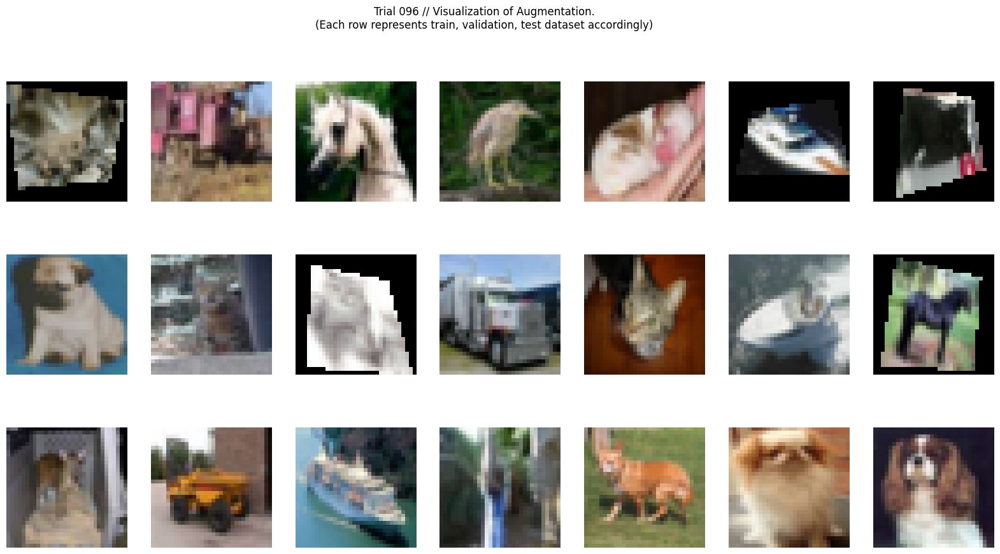

[RandomPerspective(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |   

Train: [001] Loss: 2.051, Acc: 23.53% F1(macro): 0.23: 100%|██████████| 156/156 [00:11<00:00, 14.07it/s]
 Val:       Loss: 1.827, Acc: 31.49% F1(macro): 0.29: 100%|██████████| 40/40 [00:01<00:00, 26.71it/s]


Model saved. Current best test f1: 0.292


Train: [002] Loss: 1.691, Acc: 37.09% F1(macro): 0.36: 100%|██████████| 156/156 [00:10<00:00, 14.39it/s]
 Val:       Loss: 1.599, Acc: 41.14% F1(macro): 0.40: 100%|██████████| 40/40 [00:01<00:00, 25.55it/s]


Model saved. Current best test f1: 0.400


Train: [003] Loss: 1.556, Acc: 42.79% F1(macro): 0.42: 100%|██████████| 156/156 [00:10<00:00, 14.27it/s]
 Val:       Loss: 1.513, Acc: 43.90% F1(macro): 0.44: 100%|██████████| 40/40 [00:01<00:00, 20.18it/s]


Model saved. Current best test f1: 0.439


Train: [004] Loss: 1.458, Acc: 46.78% F1(macro): 0.46: 100%|██████████| 156/156 [00:10<00:00, 14.31it/s]
 Val:       Loss: 1.450, Acc: 47.45% F1(macro): 0.47: 100%|██████████| 40/40 [00:01<00:00, 23.81it/s]


Model saved. Current best test f1: 0.466


Train: [005] Loss: 1.412, Acc: 48.74% F1(macro): 0.48: 100%|██████████| 156/156 [00:15<00:00, 10.25it/s]
 Val:       Loss: 1.415, Acc: 48.39% F1(macro): 0.48: 100%|██████████| 40/40 [00:03<00:00, 12.01it/s]


Model saved. Current best test f1: 0.478


Train: [006] Loss: 1.340, Acc: 51.34% F1(macro): 0.51: 100%|██████████| 156/156 [00:20<00:00,  7.50it/s]
 Val:       Loss: 1.349, Acc: 50.93% F1(macro): 0.50: 100%|██████████| 40/40 [00:03<00:00, 13.29it/s]


Model saved. Current best test f1: 0.503


Train: [007] Loss: 1.296, Acc: 52.82% F1(macro): 0.53: 100%|██████████| 156/156 [00:20<00:00,  7.43it/s]
 Val:       Loss: 1.318, Acc: 52.09% F1(macro): 0.51: 100%|██████████| 40/40 [00:03<00:00, 12.21it/s]


Model saved. Current best test f1: 0.514


Train: [008] Loss: 1.266, Acc: 54.05% F1(macro): 0.54: 100%|██████████| 156/156 [00:14<00:00, 10.73it/s]
 Val:       Loss: 1.316, Acc: 52.22% F1(macro): 0.52: 100%|██████████| 40/40 [00:01<00:00, 25.99it/s]


Model saved. Current best test f1: 0.518


Train: [009] Loss: 1.232, Acc: 55.49% F1(macro): 0.55: 100%|██████████| 156/156 [00:10<00:00, 15.22it/s]
 Val:       Loss: 1.298, Acc: 53.76% F1(macro): 0.54: 100%|██████████| 40/40 [00:01<00:00, 26.02it/s]


Model saved. Current best test f1: 0.537


Train: [010] Loss: 1.212, Acc: 56.19% F1(macro): 0.56: 100%|██████████| 156/156 [00:11<00:00, 14.06it/s]
 Val:       Loss: 1.246, Acc: 54.67% F1(macro): 0.54: 100%|██████████| 40/40 [00:01<00:00, 24.44it/s]


Model saved. Current best test f1: 0.542
TEST DATASET


 Val:       Loss: 1.130, Acc: 59.38% F1(macro): 0.59: 100%|██████████| 40/40 [00:01<00:00, 38.91it/s]
[I 2021-11-22 08:21:26,152] Trial 96 finished with value: 0.5906236366338335 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': True, 'aug_random_flip': False}. Best is trial 69 with value: 0.6497389456185138.


Files already downloaded and verified
Files already downloaded and verified


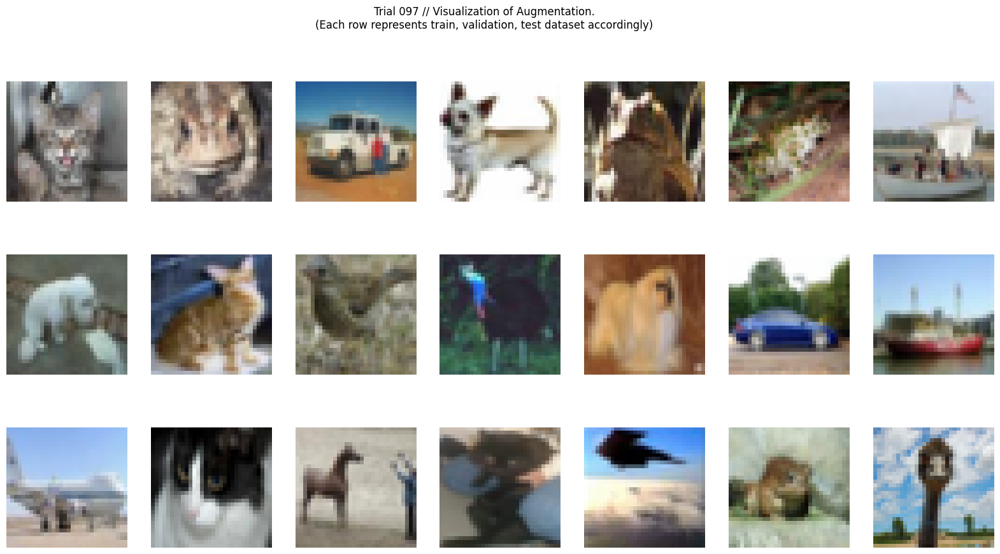

[RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |

Train: [001] Loss: 1.919, Acc: 28.20% F1(macro): 0.28: 100%|██████████| 156/156 [00:10<00:00, 14.72it/s]
 Val:       Loss: 1.608, Acc: 40.90% F1(macro): 0.40: 100%|██████████| 40/40 [00:01<00:00, 36.79it/s]


Model saved. Current best test f1: 0.399


Train: [002] Loss: 1.492, Acc: 45.12% F1(macro): 0.45: 100%|██████████| 156/156 [00:10<00:00, 14.70it/s]
 Val:       Loss: 1.454, Acc: 47.67% F1(macro): 0.47: 100%|██████████| 40/40 [00:01<00:00, 35.38it/s]


Model saved. Current best test f1: 0.467


Train: [003] Loss: 1.349, Acc: 51.18% F1(macro): 0.51: 100%|██████████| 156/156 [00:10<00:00, 14.59it/s]
 Val:       Loss: 1.350, Acc: 51.42% F1(macro): 0.51: 100%|██████████| 40/40 [00:01<00:00, 32.51it/s]


Model saved. Current best test f1: 0.510


Train: [004] Loss: 1.256, Acc: 54.40% F1(macro): 0.54: 100%|██████████| 156/156 [00:10<00:00, 14.79it/s]
 Val:       Loss: 1.299, Acc: 54.13% F1(macro): 0.54: 100%|██████████| 40/40 [00:01<00:00, 34.91it/s]


Model saved. Current best test f1: 0.537


Train: [005] Loss: 1.192, Acc: 57.23% F1(macro): 0.57: 100%|██████████| 156/156 [00:10<00:00, 15.44it/s]
 Val:       Loss: 1.261, Acc: 54.97% F1(macro): 0.54: 100%|██████████| 40/40 [00:01<00:00, 34.73it/s]


Model saved. Current best test f1: 0.543


Train: [006] Loss: 1.116, Acc: 60.18% F1(macro): 0.60: 100%|██████████| 156/156 [00:10<00:00, 14.59it/s]
 Val:       Loss: 1.218, Acc: 57.12% F1(macro): 0.57: 100%|██████████| 40/40 [00:01<00:00, 33.79it/s]


Model saved. Current best test f1: 0.565


Train: [007] Loss: 1.053, Acc: 62.44% F1(macro): 0.62: 100%|██████████| 156/156 [00:10<00:00, 15.04it/s]
 Val:       Loss: 1.157, Acc: 59.83% F1(macro): 0.60: 100%|██████████| 40/40 [00:01<00:00, 29.88it/s]


Model saved. Current best test f1: 0.597


Train: [008] Loss: 1.001, Acc: 64.41% F1(macro): 0.64: 100%|██████████| 156/156 [00:10<00:00, 14.67it/s]
 Val:       Loss: 1.136, Acc: 60.81% F1(macro): 0.60: 100%|██████████| 40/40 [00:01<00:00, 36.11it/s]


Model saved. Current best test f1: 0.605


Train: [009] Loss: 0.956, Acc: 65.78% F1(macro): 0.66: 100%|██████████| 156/156 [00:10<00:00, 14.37it/s]
 Val:       Loss: 1.106, Acc: 61.09% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 36.79it/s]


Model saved. Current best test f1: 0.608


Train: [010] Loss: 0.917, Acc: 67.47% F1(macro): 0.67: 100%|██████████| 156/156 [00:10<00:00, 15.15it/s]
 Val:       Loss: 1.093, Acc: 62.66% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 35.87it/s]


Model saved. Current best test f1: 0.624
TEST DATASET


 Val:       Loss: 1.078, Acc: 62.33% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 36.12it/s]
[I 2021-11-22 08:23:38,852] Trial 97 finished with value: 0.6193897747739283 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 69 with value: 0.6497389456185138.


Files already downloaded and verified
Files already downloaded and verified


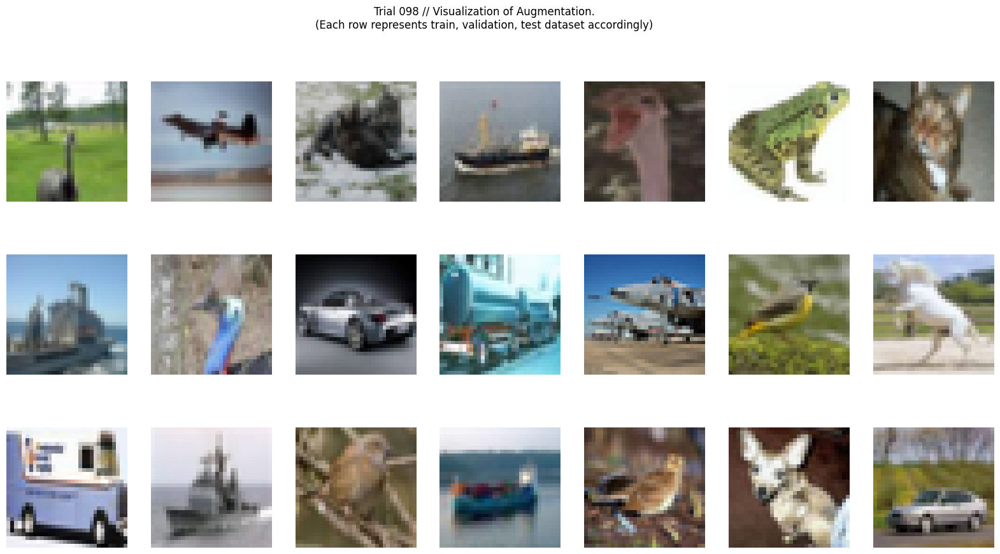

[RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |

Train: [001] Loss: 1.976, Acc: 26.54% F1(macro): 0.26: 100%|██████████| 156/156 [00:11<00:00, 14.11it/s]
 Val:       Loss: 1.709, Acc: 37.15% F1(macro): 0.36: 100%|██████████| 40/40 [00:01<00:00, 32.21it/s]


Model saved. Current best test f1: 0.356


Train: [002] Loss: 1.553, Acc: 42.52% F1(macro): 0.42: 100%|██████████| 156/156 [00:10<00:00, 14.45it/s]
 Val:       Loss: 1.482, Acc: 45.46% F1(macro): 0.44: 100%|██████████| 40/40 [00:01<00:00, 35.79it/s]


Model saved. Current best test f1: 0.442


Train: [003] Loss: 1.390, Acc: 49.24% F1(macro): 0.49: 100%|██████████| 156/156 [00:11<00:00, 14.01it/s]
 Val:       Loss: 1.357, Acc: 50.89% F1(macro): 0.51: 100%|██████████| 40/40 [00:01<00:00, 29.68it/s]


Model saved. Current best test f1: 0.509


Train: [004] Loss: 1.269, Acc: 54.16% F1(macro): 0.54: 100%|██████████| 156/156 [00:10<00:00, 14.44it/s]
 Val:       Loss: 1.278, Acc: 54.21% F1(macro): 0.54: 100%|██████████| 40/40 [00:01<00:00, 33.90it/s]


Model saved. Current best test f1: 0.541


Train: [005] Loss: 1.178, Acc: 57.73% F1(macro): 0.58: 100%|██████████| 156/156 [00:10<00:00, 14.99it/s]
 Val:       Loss: 1.212, Acc: 56.10% F1(macro): 0.56: 100%|██████████| 40/40 [00:01<00:00, 34.25it/s]


Model saved. Current best test f1: 0.563


Train: [006] Loss: 1.100, Acc: 60.68% F1(macro): 0.61: 100%|██████████| 156/156 [00:10<00:00, 14.60it/s]
 Val:       Loss: 1.185, Acc: 57.82% F1(macro): 0.58: 100%|██████████| 40/40 [00:01<00:00, 36.68it/s]


Model saved. Current best test f1: 0.576


Train: [007] Loss: 1.035, Acc: 63.11% F1(macro): 0.63: 100%|██████████| 156/156 [00:10<00:00, 14.88it/s]
 Val:       Loss: 1.105, Acc: 60.90% F1(macro): 0.60: 100%|██████████| 40/40 [00:01<00:00, 29.62it/s]


Model saved. Current best test f1: 0.604


Train: [008] Loss: 0.976, Acc: 65.47% F1(macro): 0.65: 100%|██████████| 156/156 [00:10<00:00, 14.70it/s]
 Val:       Loss: 1.074, Acc: 61.75% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 33.54it/s]


Model saved. Current best test f1: 0.620


Train: [009] Loss: 0.936, Acc: 66.57% F1(macro): 0.66: 100%|██████████| 156/156 [00:10<00:00, 14.53it/s]
 Val:       Loss: 1.066, Acc: 61.91% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 29.73it/s]
Train: [010] Loss: 0.889, Acc: 68.30% F1(macro): 0.68: 100%|██████████| 156/156 [00:10<00:00, 14.85it/s]
 Val:       Loss: 1.058, Acc: 62.21% F1(macro): 0.62: 100%|██████████| 40/40 [00:01<00:00, 36.18it/s]


Model saved. Current best test f1: 0.623
TEST DATASET


 Val:       Loss: 1.052, Acc: 63.06% F1(macro): 0.63: 100%|██████████| 40/40 [00:01<00:00, 35.36it/s]
[I 2021-11-22 08:25:53,509] Trial 98 finished with value: 0.6297241697236735 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 69 with value: 0.6497389456185138.


Files already downloaded and verified
Files already downloaded and verified


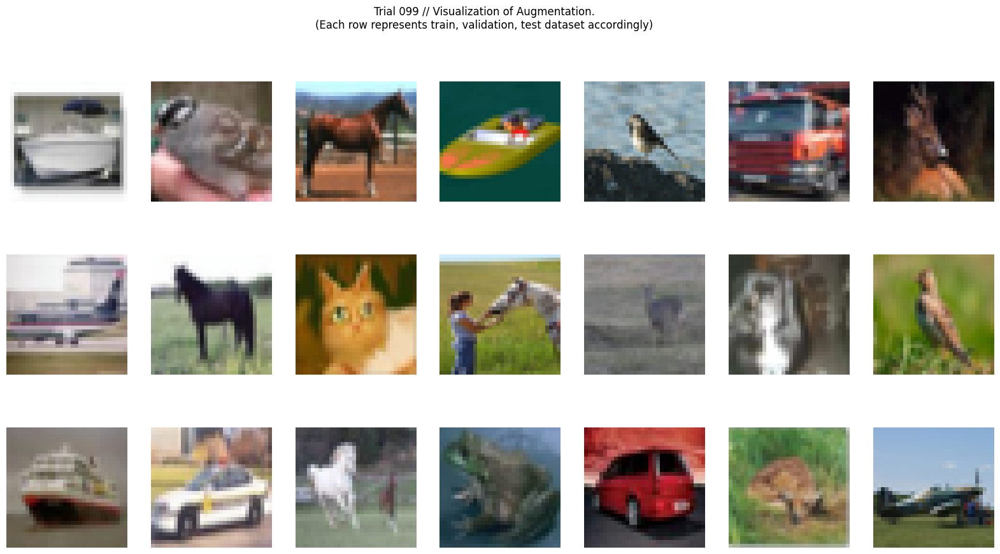

[RandomHorizontalFlip(p=0.5)]
idx |   n |     params |          module |            arguments |   in_channel |   out_channel
----------------------------------------------------------------------------------------------
  0 |   1 |        464 |            Conv | [16, 3, 2, None, 1, 'HardSwish'] |            3           16
  1 |   1 |        464 | InvertedResidualv3 |  [3, 1, 16, 0, 0, 1] |           16           16
  2 |   1 |      3,440 | InvertedResidualv3 |  [3, 4, 24, 0, 0, 2] |           16           24
  3 |   1 |      4,440 | InvertedResidualv3 |  [3, 3, 24, 0, 0, 1] |           24           24
  4 |   1 |     10,328 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 2] |           24           40
  5 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  6 |   1 |     20,992 | InvertedResidualv3 |  [5, 3, 40, 1, 0, 1] |           40           40
  7 |   1 |     32,080 | InvertedResidualv3 |  [3, 6, 80, 0, 1, 2] |           40           80
  8 |   1 |

Train: [001] Loss: 1.917, Acc: 28.58% F1(macro): 0.28: 100%|██████████| 156/156 [00:10<00:00, 14.81it/s]
 Val:       Loss: 1.734, Acc: 38.61% F1(macro): 0.37: 100%|██████████| 40/40 [00:01<00:00, 36.27it/s]


Model saved. Current best test f1: 0.373


Train: [002] Loss: 1.506, Acc: 44.76% F1(macro): 0.44: 100%|██████████| 156/156 [00:10<00:00, 14.81it/s]
 Val:       Loss: 1.446, Acc: 46.51% F1(macro): 0.46: 100%|██████████| 40/40 [00:01<00:00, 36.30it/s]


Model saved. Current best test f1: 0.461


Train: [003] Loss: 1.362, Acc: 50.36% F1(macro): 0.50: 100%|██████████| 156/156 [00:10<00:00, 14.84it/s]
 Val:       Loss: 1.345, Acc: 50.25% F1(macro): 0.50: 100%|██████████| 40/40 [00:01<00:00, 32.72it/s]


Model saved. Current best test f1: 0.499


Train: [004] Loss: 1.265, Acc: 54.19% F1(macro): 0.54: 100%|██████████| 156/156 [00:11<00:00, 14.08it/s]
 Val:       Loss: 1.277, Acc: 53.89% F1(macro): 0.54: 100%|██████████| 40/40 [00:01<00:00, 31.36it/s]


Model saved. Current best test f1: 0.538


Train: [005] Loss: 1.199, Acc: 56.74% F1(macro): 0.57: 100%|██████████| 156/156 [00:10<00:00, 14.52it/s]
 Val:       Loss: 1.263, Acc: 54.37% F1(macro): 0.54: 100%|██████████| 40/40 [00:01<00:00, 33.18it/s]


Model saved. Current best test f1: 0.542


Train: [006] Loss: 1.131, Acc: 59.47% F1(macro): 0.59: 100%|██████████| 156/156 [00:11<00:00, 13.90it/s]
 Val:       Loss: 1.199, Acc: 57.31% F1(macro): 0.57: 100%|██████████| 40/40 [00:01<00:00, 33.89it/s]


Model saved. Current best test f1: 0.571


Train: [007] Loss: 1.069, Acc: 61.46% F1(macro): 0.61: 100%|██████████| 156/156 [00:10<00:00, 14.59it/s]
 Val:       Loss: 1.188, Acc: 57.18% F1(macro): 0.57: 100%|██████████| 40/40 [00:01<00:00, 32.95it/s]


Model saved. Current best test f1: 0.574


Train: [008] Loss: 1.023, Acc: 63.42% F1(macro): 0.63: 100%|██████████| 156/156 [00:11<00:00, 14.12it/s]
 Val:       Loss: 1.141, Acc: 59.62% F1(macro): 0.59: 100%|██████████| 40/40 [00:01<00:00, 30.43it/s]


Model saved. Current best test f1: 0.592


Train: [009] Loss: 0.979, Acc: 65.01% F1(macro): 0.65: 100%|██████████| 156/156 [00:10<00:00, 14.59it/s]
 Val:       Loss: 1.186, Acc: 57.99% F1(macro): 0.58: 100%|██████████| 40/40 [00:01<00:00, 32.32it/s]
Train: [010] Loss: 0.931, Acc: 67.07% F1(macro): 0.67: 100%|██████████| 156/156 [00:10<00:00, 14.25it/s]
 Val:       Loss: 1.110, Acc: 60.67% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 32.75it/s]


Model saved. Current best test f1: 0.606
TEST DATASET


 Val:       Loss: 1.117, Acc: 61.18% F1(macro): 0.61: 100%|██████████| 40/40 [00:01<00:00, 36.87it/s]
[I 2021-11-22 08:28:08,730] Trial 99 finished with value: 0.6105263148090104 and parameters: {'aug_color_jitter': False, 'aug_random_perspective': False, 'aug_random_flip': True}. Best is trial 69 with value: 0.6497389456185138.


In [12]:
study = optuna.create_study(direction="maximize", study_name="autoaug", load_if_exists=True)
study.optimize(objective, n_trials=100)